In [29]:
import pickle
import os
import collections
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [8]:
data = pd.read_csv('/content/drive/MyDrive/flickr8k/captions.txt')

Step 1: Creating a dictionary with {image name: captions pairs}

In [9]:
revised_data = data.groupby('image')['caption'].apply(list)
revised_data = revised_data.reset_index()
revised_data

,image,caption
0,1000268201_693b08cb0e.jpg,[A child in a pink dress is climbing up a set ...
1,1001773457_577c3a7d70.jpg,"[A black dog and a spotted dog are fighting, A..."
2,1002674143_1b742ab4b8.jpg,[A little girl covered in paint sits in front ...
3,1003163366_44323f5815.jpg,[A man lays on a bench while his dog sits by h...
4,1007129816_e794419615.jpg,[A man in an orange hat starring at something ...
...,...,...
8086,990890291_afc72be141.jpg,[A man does a wheelie on his bicycle on the si...
8087,99171998_7cc800ceef.jpg,"[A group is sitting around a snowy crevasse .,..."
8088,99679241_adc853a5c0.jpg,[A grey bird stands majestically on a beach wh...
8089,997338199_7343367d7f.jpg,"[A person stands near golden walls ., a woman ..."


A child in a pink dress is climbing up a set of stairs in an entry way .
A girl going into a wooden building .
A little girl climbing into a wooden playhouse .
A little girl climbing the stairs to her playhouse .
A little girl in a pink dress going into a wooden cabin .


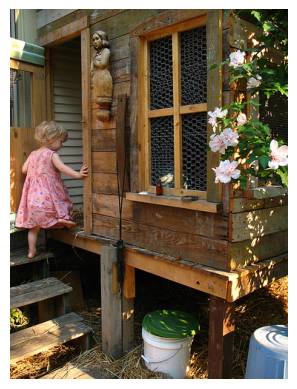

In [10]:
sample_image = data['image'][0]
sample_captions = data[data['image']== sample_image]['caption']
image_path = '/content/drive/MyDrive/Images'  +'/'+ sample_image
image = plt.imread(image_path)
plt.imshow(image)
plt.axis('off')

for caption in sample_captions:
    print(caption)

Dictionary to map image to its 5 captions

In [11]:
mapping = dict(zip(revised_data['image'],revised_data['caption']))

In [12]:
mapping['990890291_afc72be141.jpg']

['A man does a wheelie on his bicycle on the sidewalk .',
 'A man is doing a wheelie on a mountain bike .',
 'A man on a bicycle is on only the back wheel .',
 'Asian man in orange hat is popping a wheelie on his bike .',
 'Man on a bicycle riding on only one wheel .']

Cleaning Captions

In [13]:
def clean_caption(caption):
          caption = caption.replace('[^a-zA-Z]', ' ')  #remove sp chars
          caption = caption.lower().split()
          caption = ' '.join(caption)
          caption = " ".join([word for word in caption.split() if len(word)>1]) #include words with length more than 1
          return caption


In [14]:
for image_name, caption_list in mapping.items():
  for i in range (len(caption_list)):
    caption_list[i] = clean_caption(caption_list[i])


In [15]:
mapping['990890291_afc72be141.jpg']

['man does wheelie on his bicycle on the sidewalk',
 'man is doing wheelie on mountain bike',
 'man on bicycle is on only the back wheel',
 'asian man in orange hat is popping wheelie on his bike',
 'man on bicycle riding on only one wheel']

writing the mapping to a text file

In [16]:
with open("descriptions.txt","w") as f:
    f.write(str(mapping))

Vocab

In [17]:
total_words = []

for image_name in mapping.keys():
    [total_words.append(i) for des in mapping[image_name] for i in des.split()]

print("Total Words ", len(total_words))

Total Words  373378


In [20]:
counter = collections.Counter(total_words)
freq = dict(counter)
print(len(freq.keys()))

8885


In [21]:
sorted_freq = sorted(freq.items(), reverse= True, key= lambda x: x[1])

min_count = 10
sorted_freq  = [x for x in sorted_freq if x[1]>min_count]
total_words = [x[0] for x in sorted_freq]

In [22]:
len(total_words)

1842

In [23]:
n = len(revised_data)
train = revised_data['image'][0:int(n*0.9)]
test = revised_data['image'][int(n*0.9):]


Train Dictionary

In [24]:
train_mapping = {}
for image_name in train:
  train_mapping[image_name] = []
  for caption in mapping[image_name]:
    new_cap = 'start ' + caption + ' end'
    train_mapping[image_name].append(new_cap)

In [25]:
train_mapping["1000268201_693b08cb0e.jpg"]

['start child in pink dress is climbing up set of stairs in an entry way end',
 'start girl going into wooden building end',
 'start little girl climbing into wooden playhouse end',
 'start little girl climbing the stairs to her playhouse end',
 'start little girl in pink dress going into wooden cabin end']

Image Feature Extraction

In [ ]:
from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input, decode_predictions
from tensorflow.keras.preprocessing import image
from keras.models import Model, load_model
from tensorflow.keras.utils import img_to_array, load_img

In [ ]:
resnet = ResNet50(weights='imagenet',input_shape=(224,224,3))


102967424/102967424 [==============================] - 6s 0us/step


In [ ]:
model_new = Model(resnet.input,resnet.layers[-2].output)


In [26]:
def image_preprocessing(img_name):
      # load the image from file
      img_path = '/content/drive/MyDrive/Images' + '/' + img_name
      image = load_img(img_path, target_size=(224, 224))
      image = img_to_array(image)
      image = np.expand_dims(image,axis=0)
      image = preprocess_input(image)
      return image

In [27]:
def extract_features(img_name):
  img =image_preprocessing(img_name)
  features = model_new.predict(img)
  features = features.reshape((-1,))
  return features



Extracting features

In [ ]:
from tqdm import tqdm

In [ ]:
encodings = {} #ENCODINGS IS A DICTIONARY OF IMAGE NAME: FEATURES PAIRS

with tqdm(total=len(train), desc="Processing images") as pbar:
     for index, image_name in enumerate(train):
         encodings[image_name] = extract_features(image_name)
         pbar.update(1)  # Update the progress bar


Processing images:   0%|          | 0/7281 [00:00<?, ?it/s]

1/1 [==============================] - 8s 8s/step


Processing images:   0%|          | 1/7281 [00:07<15:40:19,  7.75s/it]

1/1 [==============================] - 0s 22ms/step


Processing images:   0%|          | 2/7281 [00:08<7:19:41,  3.62s/it] 

1/1 [==============================] - 0s 40ms/step


Processing images:   0%|          | 3/7281 [00:09<4:56:31,  2.44s/it]

1/1 [==============================] - 0s 35ms/step


Processing images:   0%|          | 4/7281 [00:10<3:38:04,  1.80s/it]

1/1 [==============================] - 0s 36ms/step


Processing images:   0%|          | 5/7281 [00:11<2:50:29,  1.41s/it]

1/1 [==============================] - 0s 25ms/step


Processing images:   0%|          | 6/7281 [00:11<2:22:12,  1.17s/it]

1/1 [==============================] - 0s 22ms/step


Processing images:   0%|          | 7/7281 [00:12<2:14:42,  1.11s/it]

1/1 [==============================] - 0s 23ms/step


Processing images:   0%|          | 8/7281 [00:13<2:05:05,  1.03s/it]

1/1 [==============================] - 0s 22ms/step


Processing images:   0%|          | 9/7281 [00:14<1:53:45,  1.07it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   0%|          | 10/7281 [00:15<1:51:46,  1.08it/s]

1/1 [==============================] - 0s 30ms/step


Processing images:   0%|          | 11/7281 [00:16<1:51:04,  1.09it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   0%|          | 12/7281 [00:17<1:50:48,  1.09it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   0%|          | 13/7281 [00:17<1:51:33,  1.09it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:   0%|          | 14/7281 [00:18<1:52:52,  1.07it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:   0%|          | 15/7281 [00:19<1:45:55,  1.14it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   0%|          | 16/7281 [00:20<1:41:17,  1.20it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   0%|          | 17/7281 [00:21<1:45:06,  1.15it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:   0%|          | 18/7281 [00:22<1:49:00,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:   0%|          | 19/7281 [00:23<1:51:30,  1.09it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   0%|          | 20/7281 [00:24<1:50:51,  1.09it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   0%|          | 21/7281 [00:25<1:49:14,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:   0%|          | 22/7281 [00:25<1:45:48,  1.14it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   0%|          | 23/7281 [00:26<1:46:59,  1.13it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   0%|          | 24/7281 [00:27<1:51:00,  1.09it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:   0%|          | 25/7281 [00:28<1:43:14,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:   0%|          | 26/7281 [00:29<1:45:02,  1.15it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   0%|          | 27/7281 [00:30<1:38:20,  1.23it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   0%|          | 28/7281 [00:30<1:35:07,  1.27it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:   0%|          | 29/7281 [00:31<1:32:45,  1.30it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:   0%|          | 30/7281 [00:32<1:41:48,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:   0%|          | 31/7281 [00:33<1:37:40,  1.24it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:   0%|          | 32/7281 [00:34<1:53:43,  1.06it/s]

1/1 [==============================] - 0s 39ms/step


Processing images:   0%|          | 33/7281 [00:35<1:53:21,  1.07it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   0%|          | 34/7281 [00:36<1:58:42,  1.02it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:   0%|          | 35/7281 [00:37<1:48:09,  1.12it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:   0%|          | 36/7281 [00:37<1:41:00,  1.20it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   1%|          | 37/7281 [00:38<1:44:58,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:   1%|          | 38/7281 [00:39<1:48:57,  1.11it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   1%|          | 39/7281 [00:40<1:42:39,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:   1%|          | 40/7281 [00:41<1:48:55,  1.11it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   1%|          | 41/7281 [00:42<1:51:31,  1.08it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   1%|          | 42/7281 [00:43<1:51:09,  1.09it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   1%|          | 43/7281 [00:44<1:49:55,  1.10it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:   1%|          | 44/7281 [00:45<1:53:25,  1.06it/s]

1/1 [==============================] - 0s 40ms/step


Processing images:   1%|          | 45/7281 [00:46<1:45:31,  1.14it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:   1%|          | 46/7281 [00:47<1:50:15,  1.09it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:   1%|          | 47/7281 [00:48<1:49:16,  1.10it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:   1%|          | 48/7281 [00:48<1:41:26,  1.19it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:   1%|          | 49/7281 [00:49<1:41:54,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:   1%|          | 50/7281 [00:50<1:38:01,  1.23it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:   1%|          | 51/7281 [00:51<1:48:56,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:   1%|          | 52/7281 [00:52<1:44:42,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:   1%|          | 53/7281 [00:53<1:49:34,  1.10it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:   1%|          | 54/7281 [00:54<1:48:26,  1.11it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:   1%|          | 55/7281 [00:54<1:40:25,  1.20it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   1%|          | 56/7281 [00:55<1:36:01,  1.25it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   1%|          | 57/7281 [00:56<1:40:11,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:   1%|          | 58/7281 [00:57<1:36:43,  1.24it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   1%|          | 59/7281 [00:58<1:49:45,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:   1%|          | 60/7281 [00:59<1:42:30,  1.17it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:   1%|          | 61/7281 [00:59<1:45:08,  1.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   1%|          | 62/7281 [01:00<1:47:28,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:   1%|          | 63/7281 [01:02<1:56:16,  1.03it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   1%|          | 64/7281 [01:02<1:46:18,  1.13it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   1%|          | 65/7281 [01:03<1:40:32,  1.20it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   1%|          | 66/7281 [01:04<1:43:34,  1.16it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   1%|          | 67/7281 [01:05<1:50:01,  1.09it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   1%|          | 68/7281 [01:06<1:41:51,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:   1%|          | 69/7281 [01:06<1:43:11,  1.16it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   1%|          | 70/7281 [01:07<1:48:45,  1.11it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   1%|          | 71/7281 [01:09<1:56:40,  1.03it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:   1%|          | 72/7281 [01:09<1:52:10,  1.07it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:   1%|          | 73/7281 [01:10<1:52:55,  1.06it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:   1%|          | 74/7281 [01:11<1:55:00,  1.04it/s]

1/1 [==============================] - 0s 44ms/step


Processing images:   1%|          | 75/7281 [01:12<1:47:59,  1.11it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:   1%|          | 76/7281 [01:13<1:41:49,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:   1%|          | 77/7281 [01:14<1:45:09,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:   1%|          | 78/7281 [01:15<1:48:06,  1.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   1%|          | 79/7281 [01:16<1:53:31,  1.06it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:   1%|          | 80/7281 [01:17<1:53:54,  1.05it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:   1%|          | 81/7281 [01:18<1:54:47,  1.05it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   1%|          | 82/7281 [01:19<1:52:44,  1.06it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   1%|          | 83/7281 [01:20<1:52:38,  1.07it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   1%|          | 84/7281 [01:21<1:51:40,  1.07it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   1%|          | 85/7281 [01:21<1:46:59,  1.12it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   1%|          | 86/7281 [01:22<1:47:01,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:   1%|          | 87/7281 [01:23<1:41:33,  1.18it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:   1%|          | 88/7281 [01:24<1:45:21,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:   1%|          | 89/7281 [01:25<1:39:01,  1.21it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:   1%|          | 90/7281 [01:25<1:40:51,  1.19it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:   1%|          | 91/7281 [01:26<1:46:29,  1.13it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:   1%|▏         | 92/7281 [01:27<1:50:36,  1.08it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   1%|▏         | 93/7281 [01:28<1:51:36,  1.07it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   1%|▏         | 94/7281 [01:29<1:44:51,  1.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   1%|▏         | 95/7281 [01:30<1:49:25,  1.09it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   1%|▏         | 96/7281 [01:31<1:45:39,  1.13it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   1%|▏         | 97/7281 [01:32<1:46:45,  1.12it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   1%|▏         | 98/7281 [01:33<1:39:57,  1.20it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   1%|▏         | 99/7281 [01:34<1:43:35,  1.16it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   1%|▏         | 100/7281 [01:35<1:48:34,  1.10it/s]

1/1 [==============================] - 0s 44ms/step


Processing images:   1%|▏         | 101/7281 [01:35<1:43:41,  1.15it/s]

1/1 [==============================] - 0s 44ms/step


Processing images:   1%|▏         | 102/7281 [01:36<1:48:21,  1.10it/s]

1/1 [==============================] - 0s 38ms/step


Processing images:   1%|▏         | 103/7281 [01:37<1:51:22,  1.07it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:   1%|▏         | 104/7281 [01:38<1:52:25,  1.06it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   1%|▏         | 105/7281 [01:39<1:44:53,  1.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   1%|▏         | 106/7281 [01:40<1:48:44,  1.10it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:   1%|▏         | 107/7281 [01:41<1:48:22,  1.10it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:   1%|▏         | 108/7281 [01:42<1:49:32,  1.09it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   1%|▏         | 109/7281 [01:43<1:49:18,  1.09it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   2%|▏         | 110/7281 [01:44<1:50:05,  1.09it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   2%|▏         | 111/7281 [01:44<1:41:38,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:   2%|▏         | 112/7281 [01:45<1:43:39,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   2%|▏         | 113/7281 [01:46<1:37:33,  1.22it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:   2%|▏         | 114/7281 [01:47<1:33:32,  1.28it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   2%|▏         | 115/7281 [01:48<1:38:01,  1.22it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:   2%|▏         | 116/7281 [01:49<1:43:38,  1.15it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:   2%|▏         | 117/7281 [01:49<1:39:09,  1.20it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   2%|▏         | 118/7281 [01:50<1:42:54,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:   2%|▏         | 119/7281 [01:51<1:37:56,  1.22it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:   2%|▏         | 120/7281 [01:52<1:36:25,  1.24it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   2%|▏         | 121/7281 [01:53<1:41:04,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:   2%|▏         | 122/7281 [01:54<1:44:09,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   2%|▏         | 123/7281 [01:55<1:47:22,  1.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   2%|▏         | 124/7281 [01:55<1:47:11,  1.11it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:   2%|▏         | 125/7281 [01:56<1:46:10,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   2%|▏         | 126/7281 [01:57<1:49:09,  1.09it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   2%|▏         | 127/7281 [01:58<1:50:05,  1.08it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   2%|▏         | 128/7281 [01:59<1:42:05,  1.17it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:   2%|▏         | 129/7281 [02:00<1:38:42,  1.21it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:   2%|▏         | 130/7281 [02:01<1:45:38,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:   2%|▏         | 131/7281 [02:02<1:43:35,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   2%|▏         | 132/7281 [02:03<1:49:12,  1.09it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   2%|▏         | 133/7281 [02:04<1:53:40,  1.05it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:   2%|▏         | 134/7281 [02:05<1:56:37,  1.02it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   2%|▏         | 135/7281 [02:06<1:57:40,  1.01it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   2%|▏         | 136/7281 [02:07<1:57:00,  1.02it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   2%|▏         | 137/7281 [02:07<1:46:01,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   2%|▏         | 138/7281 [02:08<1:47:10,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:   2%|▏         | 139/7281 [02:09<1:44:44,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:   2%|▏         | 140/7281 [02:10<1:39:46,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:   2%|▏         | 141/7281 [02:11<1:43:47,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   2%|▏         | 142/7281 [02:12<1:47:14,  1.11it/s]

1/1 [==============================] - 0s 39ms/step


Processing images:   2%|▏         | 143/7281 [02:13<1:42:24,  1.16it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:   2%|▏         | 144/7281 [02:13<1:45:31,  1.13it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:   2%|▏         | 145/7281 [02:14<1:39:31,  1.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   2%|▏         | 146/7281 [02:15<1:35:57,  1.24it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   2%|▏         | 147/7281 [02:16<1:40:22,  1.18it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   2%|▏         | 148/7281 [02:17<1:43:50,  1.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   2%|▏         | 149/7281 [02:18<1:46:31,  1.12it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:   2%|▏         | 150/7281 [02:18<1:40:35,  1.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   2%|▏         | 151/7281 [02:19<1:42:23,  1.16it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   2%|▏         | 152/7281 [02:20<1:37:15,  1.22it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:   2%|▏         | 153/7281 [02:21<1:34:09,  1.26it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:   2%|▏         | 154/7281 [02:22<1:39:02,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:   2%|▏         | 155/7281 [02:23<1:42:55,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   2%|▏         | 156/7281 [02:23<1:36:46,  1.23it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:   2%|▏         | 157/7281 [02:24<1:45:27,  1.13it/s]

1/1 [==============================] - 0s 31ms/step


Processing images:   2%|▏         | 158/7281 [02:25<1:46:38,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:   2%|▏         | 159/7281 [02:26<1:53:36,  1.04it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:   2%|▏         | 160/7281 [02:27<1:51:44,  1.06it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   2%|▏         | 161/7281 [02:28<1:43:41,  1.14it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   2%|▏         | 162/7281 [02:29<1:47:06,  1.11it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:   2%|▏         | 163/7281 [02:30<1:41:01,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   2%|▏         | 164/7281 [02:31<1:44:48,  1.13it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   2%|▏         | 165/7281 [02:32<1:46:21,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:   2%|▏         | 166/7281 [02:33<1:47:12,  1.11it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:   2%|▏         | 167/7281 [02:34<1:48:47,  1.09it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:   2%|▏         | 168/7281 [02:35<1:54:15,  1.04it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:   2%|▏         | 169/7281 [02:36<1:55:21,  1.03it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:   2%|▏         | 170/7281 [02:37<1:58:14,  1.00it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:   2%|▏         | 171/7281 [02:37<1:47:50,  1.10it/s]

1/1 [==============================] - 0s 50ms/step


Processing images:   2%|▏         | 172/7281 [02:38<1:54:59,  1.03it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:   2%|▏         | 173/7281 [02:39<1:54:06,  1.04it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:   2%|▏         | 174/7281 [02:40<1:53:40,  1.04it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:   2%|▏         | 175/7281 [02:41<1:48:51,  1.09it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:   2%|▏         | 176/7281 [02:42<1:41:26,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:   2%|▏         | 177/7281 [02:43<1:36:31,  1.23it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:   2%|▏         | 178/7281 [02:43<1:33:11,  1.27it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:   2%|▏         | 179/7281 [02:44<1:31:11,  1.30it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:   2%|▏         | 180/7281 [02:45<1:38:23,  1.20it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   2%|▏         | 181/7281 [02:46<1:41:37,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:   2%|▏         | 182/7281 [02:47<1:44:51,  1.13it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   3%|▎         | 183/7281 [02:48<1:41:34,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:   3%|▎         | 184/7281 [02:49<1:45:54,  1.12it/s]

1/1 [==============================] - 0s 45ms/step


Processing images:   3%|▎         | 185/7281 [02:50<1:46:12,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:   3%|▎         | 186/7281 [02:50<1:39:41,  1.19it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:   3%|▎         | 187/7281 [02:51<1:43:59,  1.14it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:   3%|▎         | 188/7281 [02:52<1:46:36,  1.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   3%|▎         | 189/7281 [02:53<1:41:11,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   3%|▎         | 190/7281 [02:54<1:36:10,  1.23it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   3%|▎         | 191/7281 [02:54<1:32:55,  1.27it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:   3%|▎         | 192/7281 [02:55<1:38:50,  1.20it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   3%|▎         | 193/7281 [02:56<1:40:04,  1.18it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   3%|▎         | 194/7281 [02:57<1:44:30,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:   3%|▎         | 195/7281 [02:58<1:39:56,  1.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   3%|▎         | 196/7281 [02:59<1:43:36,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:   3%|▎         | 197/7281 [03:00<1:46:04,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:   3%|▎         | 198/7281 [03:01<1:51:12,  1.06it/s]

1/1 [==============================] - 0s 41ms/step


Processing images:   3%|▎         | 199/7281 [03:02<1:53:56,  1.04it/s]

1/1 [==============================] - 0s 42ms/step


Processing images:   3%|▎         | 200/7281 [03:03<1:52:22,  1.05it/s]

1/1 [==============================] - 0s 38ms/step


Processing images:   3%|▎         | 201/7281 [03:04<1:44:37,  1.13it/s]

1/1 [==============================] - 0s 49ms/step


Processing images:   3%|▎         | 202/7281 [03:04<1:38:53,  1.19it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   3%|▎         | 203/7281 [03:05<1:42:31,  1.15it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   3%|▎         | 204/7281 [03:06<1:44:07,  1.13it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   3%|▎         | 205/7281 [03:07<1:44:55,  1.12it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:   3%|▎         | 206/7281 [03:08<1:42:04,  1.16it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   3%|▎         | 207/7281 [03:09<1:47:02,  1.10it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   3%|▎         | 208/7281 [03:10<1:46:43,  1.10it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   3%|▎         | 209/7281 [03:11<1:53:23,  1.04it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   3%|▎         | 210/7281 [03:12<1:50:12,  1.07it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:   3%|▎         | 211/7281 [03:13<1:43:26,  1.14it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   3%|▎         | 212/7281 [03:13<1:45:24,  1.12it/s]

1/1 [==============================] - 0s 44ms/step


Processing images:   3%|▎         | 213/7281 [03:14<1:49:31,  1.08it/s]

1/1 [==============================] - 0s 39ms/step


Processing images:   3%|▎         | 214/7281 [03:15<1:51:06,  1.06it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:   3%|▎         | 215/7281 [03:16<1:43:33,  1.14it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:   3%|▎         | 216/7281 [03:17<1:37:34,  1.21it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   3%|▎         | 217/7281 [03:18<1:35:47,  1.23it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   3%|▎         | 218/7281 [03:18<1:33:11,  1.26it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   3%|▎         | 219/7281 [03:19<1:38:22,  1.20it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   3%|▎         | 220/7281 [03:20<1:40:05,  1.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   3%|▎         | 221/7281 [03:21<1:36:00,  1.23it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   3%|▎         | 222/7281 [03:22<1:39:19,  1.18it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:   3%|▎         | 223/7281 [03:23<1:46:28,  1.10it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:   3%|▎         | 224/7281 [03:24<1:49:16,  1.08it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   3%|▎         | 225/7281 [03:25<1:49:55,  1.07it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:   3%|▎         | 226/7281 [03:26<1:51:54,  1.05it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:   3%|▎         | 227/7281 [03:27<1:51:44,  1.05it/s]

1/1 [==============================] - 0s 41ms/step


Processing images:   3%|▎         | 228/7281 [03:28<1:43:24,  1.14it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:   3%|▎         | 229/7281 [03:28<1:46:47,  1.10it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:   3%|▎         | 230/7281 [03:29<1:40:46,  1.17it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   3%|▎         | 231/7281 [03:30<1:46:09,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:   3%|▎         | 232/7281 [03:31<1:49:10,  1.08it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   3%|▎         | 233/7281 [03:32<1:42:20,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   3%|▎         | 234/7281 [03:33<1:43:55,  1.13it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   3%|▎         | 235/7281 [03:34<1:45:16,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:   3%|▎         | 236/7281 [03:35<2:03:24,  1.05s/it]

1/1 [==============================] - 0s 25ms/step


Processing images:   3%|▎         | 237/7281 [03:36<1:50:26,  1.06it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:   3%|▎         | 238/7281 [03:37<1:42:12,  1.15it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   3%|▎         | 239/7281 [03:38<1:45:33,  1.11it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   3%|▎         | 240/7281 [03:38<1:44:30,  1.12it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   3%|▎         | 241/7281 [03:39<1:39:23,  1.18it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:   3%|▎         | 242/7281 [03:40<1:43:16,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:   3%|▎         | 243/7281 [03:41<1:47:47,  1.09it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   3%|▎         | 244/7281 [03:42<1:39:32,  1.18it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   3%|▎         | 245/7281 [03:43<1:33:36,  1.25it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:   3%|▎         | 246/7281 [03:43<1:29:10,  1.31it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   3%|▎         | 247/7281 [03:44<1:26:59,  1.35it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   3%|▎         | 248/7281 [03:45<1:26:53,  1.35it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   3%|▎         | 249/7281 [03:45<1:26:55,  1.35it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   3%|▎         | 250/7281 [03:46<1:27:40,  1.34it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   3%|▎         | 251/7281 [03:47<1:33:18,  1.26it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   3%|▎         | 252/7281 [03:48<1:41:28,  1.15it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   3%|▎         | 253/7281 [03:49<1:35:15,  1.23it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   3%|▎         | 254/7281 [03:49<1:30:54,  1.29it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   4%|▎         | 255/7281 [03:50<1:36:45,  1.21it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   4%|▎         | 256/7281 [03:51<1:39:39,  1.17it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:   4%|▎         | 257/7281 [03:52<1:44:38,  1.12it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:   4%|▎         | 258/7281 [03:53<1:39:40,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   4%|▎         | 259/7281 [03:54<1:41:46,  1.15it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   4%|▎         | 260/7281 [03:55<1:44:31,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   4%|▎         | 261/7281 [03:56<1:41:47,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   4%|▎         | 262/7281 [03:57<1:41:48,  1.15it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   4%|▎         | 263/7281 [03:58<1:43:43,  1.13it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   4%|▎         | 264/7281 [03:58<1:42:56,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:   4%|▎         | 265/7281 [03:59<1:48:00,  1.08it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   4%|▎         | 266/7281 [04:00<1:40:04,  1.17it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   4%|▎         | 267/7281 [04:01<1:41:32,  1.15it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   4%|▎         | 268/7281 [04:02<1:42:39,  1.14it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   4%|▎         | 269/7281 [04:03<1:44:40,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   4%|▎         | 270/7281 [04:04<1:47:18,  1.09it/s]

1/1 [==============================] - 0s 39ms/step


Processing images:   4%|▎         | 271/7281 [04:05<1:48:25,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:   4%|▎         | 272/7281 [04:06<1:47:57,  1.08it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:   4%|▎         | 273/7281 [04:06<1:40:01,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:   4%|▍         | 274/7281 [04:07<1:44:57,  1.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   4%|▍         | 275/7281 [04:08<1:49:36,  1.07it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:   4%|▍         | 276/7281 [04:09<1:42:54,  1.13it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   4%|▍         | 277/7281 [04:10<1:42:27,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:   4%|▍         | 278/7281 [04:11<1:44:59,  1.11it/s]

1/1 [==============================] - 0s 46ms/step


Processing images:   4%|▍         | 279/7281 [04:12<1:46:13,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:   4%|▍         | 280/7281 [04:13<1:43:16,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:   4%|▍         | 281/7281 [04:14<1:47:19,  1.09it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:   4%|▍         | 282/7281 [04:14<1:41:04,  1.15it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   4%|▍         | 283/7281 [04:15<1:35:36,  1.22it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   4%|▍         | 284/7281 [04:16<1:32:33,  1.26it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:   4%|▍         | 285/7281 [04:17<1:39:03,  1.18it/s]

1/1 [==============================] - 0s 64ms/step


Processing images:   4%|▍         | 286/7281 [04:18<1:36:31,  1.21it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   4%|▍         | 287/7281 [04:19<1:41:25,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   4%|▍         | 288/7281 [04:19<1:37:03,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:   4%|▍         | 289/7281 [04:20<1:38:31,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:   4%|▍         | 290/7281 [04:21<1:38:57,  1.18it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   4%|▍         | 291/7281 [04:22<1:40:23,  1.16it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   4%|▍         | 292/7281 [04:23<1:46:44,  1.09it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:   4%|▍         | 293/7281 [04:24<1:47:08,  1.09it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:   4%|▍         | 294/7281 [04:25<1:46:37,  1.09it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   4%|▍         | 295/7281 [04:26<1:47:33,  1.08it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:   4%|▍         | 296/7281 [04:27<1:46:13,  1.10it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   4%|▍         | 297/7281 [04:28<1:43:27,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:   4%|▍         | 298/7281 [04:29<1:45:29,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:   4%|▍         | 299/7281 [04:29<1:39:22,  1.17it/s]

1/1 [==============================] - 0s 41ms/step


Processing images:   4%|▍         | 300/7281 [04:30<1:39:31,  1.17it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:   4%|▍         | 301/7281 [04:31<1:35:40,  1.22it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:   4%|▍         | 302/7281 [04:32<1:40:36,  1.16it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   4%|▍         | 303/7281 [04:33<1:46:22,  1.09it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   4%|▍         | 304/7281 [04:34<1:46:25,  1.09it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   4%|▍         | 305/7281 [04:34<1:40:32,  1.16it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   4%|▍         | 306/7281 [04:35<1:43:13,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:   4%|▍         | 307/7281 [04:36<1:38:28,  1.18it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   4%|▍         | 308/7281 [04:37<1:41:54,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:   4%|▍         | 309/7281 [04:38<1:44:38,  1.11it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:   4%|▍         | 310/7281 [04:39<1:49:47,  1.06it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:   4%|▍         | 311/7281 [04:40<1:41:56,  1.14it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:   4%|▍         | 312/7281 [04:41<1:38:12,  1.18it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:   4%|▍         | 313/7281 [04:42<1:43:31,  1.12it/s]

1/1 [==============================] - 0s 43ms/step


Processing images:   4%|▍         | 314/7281 [04:42<1:39:33,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   4%|▍         | 315/7281 [04:43<1:44:16,  1.11it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:   4%|▍         | 316/7281 [04:44<1:38:18,  1.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   4%|▍         | 317/7281 [04:45<1:41:31,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:   4%|▍         | 318/7281 [04:46<1:40:53,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:   4%|▍         | 319/7281 [04:47<1:36:31,  1.20it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   4%|▍         | 320/7281 [04:48<1:42:38,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:   4%|▍         | 321/7281 [04:48<1:37:28,  1.19it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   4%|▍         | 322/7281 [04:49<1:40:29,  1.15it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   4%|▍         | 323/7281 [04:50<1:47:45,  1.08it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   4%|▍         | 324/7281 [04:51<1:50:43,  1.05it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   4%|▍         | 325/7281 [04:52<1:52:39,  1.03it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:   4%|▍         | 326/7281 [04:53<1:52:02,  1.03it/s]

1/1 [==============================] - 0s 42ms/step


Processing images:   4%|▍         | 327/7281 [04:54<1:53:01,  1.03it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:   5%|▍         | 328/7281 [04:55<1:45:29,  1.10it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:   5%|▍         | 329/7281 [04:56<1:47:49,  1.07it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   5%|▍         | 330/7281 [04:57<1:48:41,  1.07it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   5%|▍         | 331/7281 [04:58<1:48:25,  1.07it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   5%|▍         | 332/7281 [04:59<1:49:11,  1.06it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:   5%|▍         | 333/7281 [05:00<1:40:27,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   5%|▍         | 334/7281 [05:01<1:41:21,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:   5%|▍         | 335/7281 [05:01<1:42:26,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:   5%|▍         | 336/7281 [05:02<1:43:24,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   5%|▍         | 337/7281 [05:03<1:44:28,  1.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   5%|▍         | 338/7281 [05:04<1:36:56,  1.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   5%|▍         | 339/7281 [05:05<1:42:35,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:   5%|▍         | 340/7281 [05:06<1:42:09,  1.13it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:   5%|▍         | 341/7281 [05:07<1:46:00,  1.09it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:   5%|▍         | 342/7281 [05:08<1:39:49,  1.16it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   5%|▍         | 343/7281 [05:09<1:41:13,  1.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   5%|▍         | 344/7281 [05:09<1:43:36,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   5%|▍         | 345/7281 [05:10<1:43:21,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   5%|▍         | 346/7281 [05:11<1:40:22,  1.15it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   5%|▍         | 347/7281 [05:12<1:34:16,  1.23it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:   5%|▍         | 348/7281 [05:13<1:30:31,  1.28it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:   5%|▍         | 349/7281 [05:13<1:33:38,  1.23it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   5%|▍         | 350/7281 [05:14<1:38:18,  1.17it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   5%|▍         | 351/7281 [05:15<1:32:37,  1.25it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   5%|▍         | 352/7281 [05:16<1:37:44,  1.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   5%|▍         | 353/7281 [05:17<1:38:58,  1.17it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   5%|▍         | 354/7281 [05:18<1:36:53,  1.19it/s]

1/1 [==============================] - 0s 43ms/step


Processing images:   5%|▍         | 355/7281 [05:18<1:34:13,  1.23it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:   5%|▍         | 356/7281 [05:19<1:30:54,  1.27it/s]

1/1 [==============================] - 0s 38ms/step


Processing images:   5%|▍         | 357/7281 [05:20<1:28:15,  1.31it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   5%|▍         | 358/7281 [05:21<1:30:32,  1.27it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   5%|▍         | 359/7281 [05:21<1:28:43,  1.30it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   5%|▍         | 360/7281 [05:22<1:36:40,  1.19it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   5%|▍         | 361/7281 [05:24<1:46:02,  1.09it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   5%|▍         | 362/7281 [05:24<1:41:48,  1.13it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   5%|▍         | 363/7281 [05:25<1:43:32,  1.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   5%|▍         | 364/7281 [05:26<1:44:35,  1.10it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   5%|▌         | 365/7281 [05:27<1:48:40,  1.06it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:   5%|▌         | 366/7281 [05:28<1:41:04,  1.14it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   5%|▌         | 367/7281 [05:29<1:43:53,  1.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   5%|▌         | 368/7281 [05:30<1:40:05,  1.15it/s]

1/1 [==============================] - 0s 44ms/step


Processing images:   5%|▌         | 369/7281 [05:31<1:44:28,  1.10it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:   5%|▌         | 370/7281 [05:31<1:38:49,  1.17it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:   5%|▌         | 371/7281 [05:32<1:35:03,  1.21it/s]

1/1 [==============================] - 0s 30ms/step


Processing images:   5%|▌         | 372/7281 [05:33<1:30:53,  1.27it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:   5%|▌         | 373/7281 [05:34<1:42:34,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   5%|▌         | 374/7281 [05:35<1:47:12,  1.07it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   5%|▌         | 375/7281 [05:36<1:39:52,  1.15it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   5%|▌         | 376/7281 [05:37<1:40:21,  1.15it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:   5%|▌         | 377/7281 [05:37<1:36:19,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:   5%|▌         | 378/7281 [05:38<1:41:20,  1.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   5%|▌         | 379/7281 [05:39<1:44:48,  1.10it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:   5%|▌         | 380/7281 [05:40<1:46:00,  1.08it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   5%|▌         | 381/7281 [05:41<1:45:40,  1.09it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:   5%|▌         | 382/7281 [05:42<1:37:59,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   5%|▌         | 383/7281 [05:43<1:34:16,  1.22it/s]

1/1 [==============================] - 0s 49ms/step


Processing images:   5%|▌         | 384/7281 [05:43<1:31:41,  1.25it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:   5%|▌         | 385/7281 [05:44<1:36:29,  1.19it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:   5%|▌         | 386/7281 [05:45<1:31:23,  1.26it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:   5%|▌         | 387/7281 [05:46<1:27:46,  1.31it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   5%|▌         | 388/7281 [05:46<1:25:35,  1.34it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   5%|▌         | 389/7281 [05:47<1:25:15,  1.35it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:   5%|▌         | 390/7281 [05:48<1:23:21,  1.38it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   5%|▌         | 391/7281 [05:49<1:31:49,  1.25it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:   5%|▌         | 392/7281 [05:50<1:29:54,  1.28it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   5%|▌         | 393/7281 [05:50<1:32:37,  1.24it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:   5%|▌         | 394/7281 [05:51<1:33:01,  1.23it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:   5%|▌         | 395/7281 [05:52<1:28:49,  1.29it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   5%|▌         | 396/7281 [05:53<1:33:42,  1.22it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   5%|▌         | 397/7281 [05:54<1:31:34,  1.25it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   5%|▌         | 398/7281 [05:55<1:34:33,  1.21it/s]

1/1 [==============================] - 0s 41ms/step


Processing images:   5%|▌         | 399/7281 [05:55<1:38:23,  1.17it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:   5%|▌         | 400/7281 [05:56<1:32:57,  1.23it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:   6%|▌         | 401/7281 [05:57<1:40:08,  1.15it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:   6%|▌         | 402/7281 [05:58<1:43:10,  1.11it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   6%|▌         | 403/7281 [05:59<1:45:19,  1.09it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   6%|▌         | 404/7281 [06:00<1:46:07,  1.08it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:   6%|▌         | 405/7281 [06:01<1:42:23,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:   6%|▌         | 406/7281 [06:02<1:36:53,  1.18it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   6%|▌         | 407/7281 [06:03<1:39:46,  1.15it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   6%|▌         | 408/7281 [06:03<1:39:28,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   6%|▌         | 409/7281 [06:04<1:42:25,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   6%|▌         | 410/7281 [06:05<1:42:40,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   6%|▌         | 411/7281 [06:06<1:49:03,  1.05it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:   6%|▌         | 412/7281 [06:07<1:41:44,  1.13it/s]

1/1 [==============================] - 0s 40ms/step


Processing images:   6%|▌         | 413/7281 [06:08<1:38:15,  1.16it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:   6%|▌         | 414/7281 [06:09<1:45:14,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:   6%|▌         | 415/7281 [06:10<1:44:40,  1.09it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   6%|▌         | 416/7281 [06:11<1:38:05,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   6%|▌         | 417/7281 [06:11<1:32:21,  1.24it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:   6%|▌         | 418/7281 [06:12<1:43:55,  1.10it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   6%|▌         | 419/7281 [06:13<1:43:08,  1.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   6%|▌         | 420/7281 [06:14<1:44:17,  1.10it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:   6%|▌         | 421/7281 [06:15<1:38:44,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:   6%|▌         | 422/7281 [06:16<1:35:02,  1.20it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   6%|▌         | 423/7281 [06:17<1:41:18,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:   6%|▌         | 424/7281 [06:17<1:35:06,  1.20it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   6%|▌         | 425/7281 [06:18<1:33:26,  1.22it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   6%|▌         | 426/7281 [06:19<1:31:27,  1.25it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:   6%|▌         | 427/7281 [06:20<1:34:38,  1.21it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:   6%|▌         | 428/7281 [06:21<1:44:38,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


Processing images:   6%|▌         | 429/7281 [06:22<1:46:25,  1.07it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   6%|▌         | 430/7281 [06:23<1:48:01,  1.06it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   6%|▌         | 431/7281 [06:24<1:43:10,  1.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   6%|▌         | 432/7281 [06:24<1:35:36,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:   6%|▌         | 433/7281 [06:25<1:31:45,  1.24it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:   6%|▌         | 434/7281 [06:26<1:28:12,  1.29it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   6%|▌         | 435/7281 [06:27<1:25:38,  1.33it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   6%|▌         | 436/7281 [06:27<1:29:55,  1.27it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   6%|▌         | 437/7281 [06:28<1:38:53,  1.15it/s]

1/1 [==============================] - 0s 30ms/step


Processing images:   6%|▌         | 438/7281 [06:29<1:32:57,  1.23it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:   6%|▌         | 439/7281 [06:30<1:41:56,  1.12it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   6%|▌         | 440/7281 [06:31<1:46:14,  1.07it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   6%|▌         | 441/7281 [06:32<1:50:47,  1.03it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:   6%|▌         | 442/7281 [06:33<1:42:35,  1.11it/s]

1/1 [==============================] - 0s 47ms/step


Processing images:   6%|▌         | 443/7281 [06:34<1:36:46,  1.18it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:   6%|▌         | 444/7281 [06:35<1:40:38,  1.13it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:   6%|▌         | 445/7281 [06:36<1:38:46,  1.15it/s]

1/1 [==============================] - 0s 30ms/step


Processing images:   6%|▌         | 446/7281 [06:36<1:33:31,  1.22it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   6%|▌         | 447/7281 [06:37<1:31:22,  1.25it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   6%|▌         | 448/7281 [06:38<1:28:00,  1.29it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   6%|▌         | 449/7281 [06:38<1:25:04,  1.34it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   6%|▌         | 450/7281 [06:39<1:31:59,  1.24it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   6%|▌         | 451/7281 [06:40<1:30:00,  1.26it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   6%|▌         | 452/7281 [06:41<1:35:18,  1.19it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   6%|▌         | 453/7281 [06:42<1:39:15,  1.15it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   6%|▌         | 454/7281 [06:43<1:39:45,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:   6%|▌         | 455/7281 [06:44<1:37:03,  1.17it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:   6%|▋         | 456/7281 [06:45<1:45:16,  1.08it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:   6%|▋         | 457/7281 [06:46<1:48:52,  1.04it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:   6%|▋         | 458/7281 [06:47<1:48:43,  1.05it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   6%|▋         | 459/7281 [06:48<1:40:43,  1.13it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:   6%|▋         | 460/7281 [06:48<1:43:13,  1.10it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:   6%|▋         | 461/7281 [06:49<1:43:46,  1.10it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   6%|▋         | 462/7281 [06:50<1:35:40,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:   6%|▋         | 463/7281 [06:51<1:41:29,  1.12it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:   6%|▋         | 464/7281 [06:52<1:47:13,  1.06it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:   6%|▋         | 465/7281 [06:53<1:40:03,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:   6%|▋         | 466/7281 [06:54<1:33:31,  1.21it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:   6%|▋         | 467/7281 [06:54<1:28:35,  1.28it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   6%|▋         | 468/7281 [06:55<1:36:17,  1.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   6%|▋         | 469/7281 [06:56<1:33:19,  1.22it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   6%|▋         | 470/7281 [06:57<1:35:59,  1.18it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:   6%|▋         | 471/7281 [06:58<1:37:30,  1.16it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:   6%|▋         | 472/7281 [06:59<1:35:51,  1.18it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:   6%|▋         | 473/7281 [06:59<1:33:12,  1.22it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   7%|▋         | 474/7281 [07:00<1:28:53,  1.28it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   7%|▋         | 475/7281 [07:01<1:26:41,  1.31it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:   7%|▋         | 476/7281 [07:02<1:34:40,  1.20it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:   7%|▋         | 477/7281 [07:03<1:40:31,  1.13it/s]

1/1 [==============================] - 0s 40ms/step


Processing images:   7%|▋         | 478/7281 [07:04<1:37:09,  1.17it/s]

1/1 [==============================] - 0s 30ms/step


Processing images:   7%|▋         | 479/7281 [07:04<1:33:02,  1.22it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   7%|▋         | 480/7281 [07:05<1:29:19,  1.27it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:   7%|▋         | 481/7281 [07:06<1:46:38,  1.06it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:   7%|▋         | 482/7281 [07:07<1:49:11,  1.04it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   7%|▋         | 483/7281 [07:08<1:47:58,  1.05it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   7%|▋         | 484/7281 [07:09<1:53:42,  1.00s/it]

1/1 [==============================] - 0s 34ms/step


Processing images:   7%|▋         | 485/7281 [07:10<1:49:30,  1.03it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:   7%|▋         | 486/7281 [07:11<1:50:14,  1.03it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:   7%|▋         | 487/7281 [07:12<1:47:25,  1.05it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   7%|▋         | 488/7281 [07:13<1:47:49,  1.05it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:   7%|▋         | 489/7281 [07:14<1:45:57,  1.07it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   7%|▋         | 490/7281 [07:15<1:48:08,  1.05it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:   7%|▋         | 491/7281 [07:16<1:41:05,  1.12it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   7%|▋         | 492/7281 [07:17<1:40:37,  1.12it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:   7%|▋         | 493/7281 [07:17<1:36:32,  1.17it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   7%|▋         | 494/7281 [07:18<1:30:55,  1.24it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   7%|▋         | 495/7281 [07:19<1:34:54,  1.19it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:   7%|▋         | 496/7281 [07:20<1:30:57,  1.24it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:   7%|▋         | 497/7281 [07:21<1:36:15,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:   7%|▋         | 498/7281 [07:22<1:40:55,  1.12it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:   7%|▋         | 499/7281 [07:22<1:36:34,  1.17it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:   7%|▋         | 500/7281 [07:23<1:38:58,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:   7%|▋         | 501/7281 [07:24<1:42:17,  1.10it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:   7%|▋         | 502/7281 [07:25<1:43:08,  1.10it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:   7%|▋         | 503/7281 [07:26<1:41:17,  1.12it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:   7%|▋         | 504/7281 [07:27<1:39:34,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:   7%|▋         | 505/7281 [07:28<1:42:59,  1.10it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:   7%|▋         | 506/7281 [07:29<1:36:20,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:   7%|▋         | 507/7281 [07:29<1:32:42,  1.22it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   7%|▋         | 508/7281 [07:30<1:28:19,  1.28it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   7%|▋         | 509/7281 [07:31<1:34:16,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:   7%|▋         | 510/7281 [07:32<1:37:22,  1.16it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   7%|▋         | 511/7281 [07:33<1:39:10,  1.14it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   7%|▋         | 512/7281 [07:34<1:35:28,  1.18it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:   7%|▋         | 513/7281 [07:35<1:39:45,  1.13it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:   7%|▋         | 514/7281 [07:36<1:42:26,  1.10it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   7%|▋         | 515/7281 [07:37<1:46:34,  1.06it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   7%|▋         | 516/7281 [07:38<1:44:42,  1.08it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:   7%|▋         | 517/7281 [07:39<1:47:29,  1.05it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:   7%|▋         | 518/7281 [07:40<1:47:00,  1.05it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   7%|▋         | 519/7281 [07:40<1:45:36,  1.07it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   7%|▋         | 520/7281 [07:41<1:46:30,  1.06it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:   7%|▋         | 521/7281 [07:42<1:38:42,  1.14it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:   7%|▋         | 522/7281 [07:43<1:32:34,  1.22it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:   7%|▋         | 523/7281 [07:44<1:36:18,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   7%|▋         | 524/7281 [07:45<1:39:13,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:   7%|▋         | 525/7281 [07:46<1:42:25,  1.10it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:   7%|▋         | 526/7281 [07:47<1:41:34,  1.11it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:   7%|▋         | 527/7281 [07:47<1:36:03,  1.17it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:   7%|▋         | 528/7281 [07:48<1:31:20,  1.23it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   7%|▋         | 529/7281 [07:49<1:34:19,  1.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   7%|▋         | 530/7281 [07:50<1:40:36,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   7%|▋         | 531/7281 [07:51<1:34:54,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:   7%|▋         | 532/7281 [07:52<1:37:02,  1.16it/s]

1/1 [==============================] - 0s 30ms/step


Processing images:   7%|▋         | 533/7281 [07:52<1:38:46,  1.14it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   7%|▋         | 534/7281 [07:53<1:32:30,  1.22it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:   7%|▋         | 535/7281 [07:54<1:29:17,  1.26it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:   7%|▋         | 536/7281 [07:55<1:33:46,  1.20it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   7%|▋         | 537/7281 [07:56<1:37:09,  1.16it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   7%|▋         | 538/7281 [07:57<1:39:47,  1.13it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   7%|▋         | 539/7281 [07:57<1:33:45,  1.20it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   7%|▋         | 540/7281 [07:58<1:29:08,  1.26it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:   7%|▋         | 541/7281 [07:59<1:27:54,  1.28it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:   7%|▋         | 542/7281 [08:00<1:26:57,  1.29it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:   7%|▋         | 543/7281 [08:01<1:39:58,  1.12it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   7%|▋         | 544/7281 [08:01<1:33:08,  1.21it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:   7%|▋         | 545/7281 [08:02<1:34:48,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:   7%|▋         | 546/7281 [08:03<1:36:44,  1.16it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   8%|▊         | 547/7281 [08:04<1:42:59,  1.09it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   8%|▊         | 548/7281 [08:05<1:41:49,  1.10it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:   8%|▊         | 549/7281 [08:06<1:35:54,  1.17it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   8%|▊         | 550/7281 [08:07<1:30:14,  1.24it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   8%|▊         | 551/7281 [08:07<1:28:09,  1.27it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   8%|▊         | 552/7281 [08:08<1:25:41,  1.31it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:   8%|▊         | 553/7281 [08:09<1:30:25,  1.24it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   8%|▊         | 554/7281 [08:10<1:28:01,  1.27it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:   8%|▊         | 555/7281 [08:11<1:33:38,  1.20it/s]

1/1 [==============================] - 0s 39ms/step


Processing images:   8%|▊         | 556/7281 [08:11<1:29:54,  1.25it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:   8%|▊         | 557/7281 [08:12<1:34:49,  1.18it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:   8%|▊         | 558/7281 [08:13<1:38:00,  1.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   8%|▊         | 559/7281 [08:14<1:39:50,  1.12it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:   8%|▊         | 560/7281 [08:15<1:41:48,  1.10it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:   8%|▊         | 561/7281 [08:16<1:34:33,  1.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   8%|▊         | 562/7281 [08:17<1:38:05,  1.14it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:   8%|▊         | 563/7281 [08:18<1:33:59,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:   8%|▊         | 564/7281 [08:18<1:32:00,  1.22it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   8%|▊         | 565/7281 [08:19<1:38:32,  1.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   8%|▊         | 566/7281 [08:20<1:34:36,  1.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   8%|▊         | 567/7281 [08:21<1:39:35,  1.12it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:   8%|▊         | 568/7281 [08:22<1:40:32,  1.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   8%|▊         | 569/7281 [08:23<1:34:44,  1.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   8%|▊         | 570/7281 [08:23<1:29:44,  1.25it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:   8%|▊         | 571/7281 [08:24<1:34:56,  1.18it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:   8%|▊         | 572/7281 [08:25<1:41:17,  1.10it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   8%|▊         | 573/7281 [08:26<1:43:56,  1.08it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:   8%|▊         | 574/7281 [08:27<1:39:45,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   8%|▊         | 575/7281 [08:28<1:41:53,  1.10it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:   8%|▊         | 576/7281 [08:29<1:37:08,  1.15it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   8%|▊         | 577/7281 [08:30<1:39:03,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:   8%|▊         | 578/7281 [08:31<1:33:03,  1.20it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   8%|▊         | 579/7281 [08:31<1:27:50,  1.27it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   8%|▊         | 580/7281 [08:32<1:35:21,  1.17it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   8%|▊         | 581/7281 [08:33<1:32:50,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:   8%|▊         | 582/7281 [08:34<1:28:09,  1.27it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   8%|▊         | 583/7281 [08:34<1:24:44,  1.32it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   8%|▊         | 584/7281 [08:35<1:31:27,  1.22it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:   8%|▊         | 585/7281 [08:36<1:29:23,  1.25it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:   8%|▊         | 586/7281 [08:37<1:29:47,  1.24it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:   8%|▊         | 587/7281 [08:38<1:34:17,  1.18it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:   8%|▊         | 588/7281 [08:39<1:30:08,  1.24it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:   8%|▊         | 589/7281 [08:40<1:37:30,  1.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   8%|▊         | 590/7281 [08:41<1:42:25,  1.09it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:   8%|▊         | 591/7281 [08:42<1:43:34,  1.08it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   8%|▊         | 592/7281 [08:43<1:42:53,  1.08it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:   8%|▊         | 593/7281 [08:43<1:37:07,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   8%|▊         | 594/7281 [08:44<1:32:31,  1.20it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   8%|▊         | 595/7281 [08:45<1:34:32,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:   8%|▊         | 596/7281 [08:46<1:36:42,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   8%|▊         | 597/7281 [08:47<1:39:50,  1.12it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:   8%|▊         | 598/7281 [08:48<1:33:17,  1.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   8%|▊         | 599/7281 [08:48<1:30:07,  1.24it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:   8%|▊         | 600/7281 [08:49<1:34:56,  1.17it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:   8%|▊         | 601/7281 [08:50<1:36:26,  1.15it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:   8%|▊         | 602/7281 [08:51<1:31:13,  1.22it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:   8%|▊         | 603/7281 [08:52<1:42:16,  1.09it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   8%|▊         | 604/7281 [08:53<1:42:28,  1.09it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:   8%|▊         | 605/7281 [08:54<1:41:31,  1.10it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   8%|▊         | 606/7281 [08:54<1:34:23,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:   8%|▊         | 607/7281 [08:56<1:40:29,  1.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   8%|▊         | 608/7281 [08:56<1:34:12,  1.18it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   8%|▊         | 609/7281 [08:57<1:28:47,  1.25it/s]

1/1 [==============================] - 0s 43ms/step


Processing images:   8%|▊         | 610/7281 [08:58<1:26:42,  1.28it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:   8%|▊         | 611/7281 [08:58<1:25:32,  1.30it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:   8%|▊         | 612/7281 [08:59<1:30:35,  1.23it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:   8%|▊         | 613/7281 [09:00<1:32:53,  1.20it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:   8%|▊         | 614/7281 [09:01<1:36:39,  1.15it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:   8%|▊         | 615/7281 [09:02<1:33:07,  1.19it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:   8%|▊         | 616/7281 [09:03<1:32:27,  1.20it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   8%|▊         | 617/7281 [09:03<1:29:28,  1.24it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   8%|▊         | 618/7281 [09:04<1:26:45,  1.28it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   9%|▊         | 619/7281 [09:05<1:25:57,  1.29it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   9%|▊         | 620/7281 [09:06<1:32:00,  1.21it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:   9%|▊         | 621/7281 [09:07<1:29:17,  1.24it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   9%|▊         | 622/7281 [09:08<1:32:56,  1.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   9%|▊         | 623/7281 [09:08<1:28:12,  1.26it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:   9%|▊         | 624/7281 [09:09<1:24:42,  1.31it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   9%|▊         | 625/7281 [09:10<1:29:45,  1.24it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   9%|▊         | 626/7281 [09:11<1:26:20,  1.28it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:   9%|▊         | 627/7281 [09:12<1:45:26,  1.05it/s]

1/1 [==============================] - 0s 30ms/step


Processing images:   9%|▊         | 628/7281 [09:13<1:40:29,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:   9%|▊         | 629/7281 [09:14<1:37:10,  1.14it/s]

1/1 [==============================] - 0s 38ms/step


Processing images:   9%|▊         | 630/7281 [09:14<1:39:13,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:   9%|▊         | 631/7281 [09:15<1:39:47,  1.11it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   9%|▊         | 632/7281 [09:16<1:41:44,  1.09it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:   9%|▊         | 633/7281 [09:17<1:35:01,  1.17it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:   9%|▊         | 634/7281 [09:18<1:39:28,  1.11it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:   9%|▊         | 635/7281 [09:19<1:32:27,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:   9%|▊         | 636/7281 [09:19<1:27:17,  1.27it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   9%|▊         | 637/7281 [09:20<1:34:34,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   9%|▉         | 638/7281 [09:21<1:36:55,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:   9%|▉         | 639/7281 [09:22<1:31:09,  1.21it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   9%|▉         | 640/7281 [09:23<1:34:04,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:   9%|▉         | 641/7281 [09:24<1:30:43,  1.22it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   9%|▉         | 642/7281 [09:25<1:36:46,  1.14it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:   9%|▉         | 643/7281 [09:26<1:32:58,  1.19it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:   9%|▉         | 644/7281 [09:26<1:38:00,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:   9%|▉         | 645/7281 [09:27<1:41:08,  1.09it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   9%|▉         | 646/7281 [09:28<1:42:17,  1.08it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   9%|▉         | 647/7281 [09:29<1:35:52,  1.15it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   9%|▉         | 648/7281 [09:30<1:38:18,  1.12it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   9%|▉         | 649/7281 [09:31<1:33:08,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:   9%|▉         | 650/7281 [09:32<1:35:38,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:   9%|▉         | 651/7281 [09:33<1:32:37,  1.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   9%|▉         | 652/7281 [09:33<1:33:49,  1.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   9%|▉         | 653/7281 [09:34<1:35:57,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   9%|▉         | 654/7281 [09:35<1:38:50,  1.12it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   9%|▉         | 655/7281 [09:36<1:38:09,  1.13it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   9%|▉         | 656/7281 [09:37<1:38:22,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   9%|▉         | 657/7281 [09:38<1:42:23,  1.08it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:   9%|▉         | 658/7281 [09:39<1:36:53,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:   9%|▉         | 659/7281 [09:40<1:32:11,  1.20it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   9%|▉         | 660/7281 [09:41<1:36:10,  1.15it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   9%|▉         | 661/7281 [09:41<1:37:38,  1.13it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   9%|▉         | 662/7281 [09:42<1:38:11,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   9%|▉         | 663/7281 [09:43<1:39:07,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:   9%|▉         | 664/7281 [09:44<1:40:05,  1.10it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   9%|▉         | 665/7281 [09:45<1:34:24,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   9%|▉         | 666/7281 [09:46<1:37:45,  1.13it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   9%|▉         | 667/7281 [09:47<1:37:23,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:   9%|▉         | 668/7281 [09:48<1:37:11,  1.13it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:   9%|▉         | 669/7281 [09:49<1:43:24,  1.07it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:   9%|▉         | 670/7281 [09:50<1:46:08,  1.04it/s]

1/1 [==============================] - 0s 42ms/step


Processing images:   9%|▉         | 671/7281 [09:51<1:40:14,  1.10it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:   9%|▉         | 672/7281 [09:51<1:41:01,  1.09it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:   9%|▉         | 673/7281 [09:52<1:35:14,  1.16it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:   9%|▉         | 674/7281 [09:53<1:38:30,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   9%|▉         | 675/7281 [09:54<1:42:08,  1.08it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   9%|▉         | 676/7281 [09:55<1:41:04,  1.09it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:   9%|▉         | 677/7281 [09:56<1:42:07,  1.08it/s]

1/1 [==============================] - 0s 31ms/step


Processing images:   9%|▉         | 678/7281 [09:57<1:34:04,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   9%|▉         | 679/7281 [09:58<1:36:05,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:   9%|▉         | 680/7281 [09:58<1:37:02,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:   9%|▉         | 681/7281 [09:59<1:38:28,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   9%|▉         | 682/7281 [10:00<1:32:39,  1.19it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:   9%|▉         | 683/7281 [10:01<1:35:41,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:   9%|▉         | 684/7281 [10:02<1:36:57,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:   9%|▉         | 685/7281 [10:03<1:37:23,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:   9%|▉         | 686/7281 [10:04<1:31:54,  1.20it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:   9%|▉         | 687/7281 [10:04<1:29:18,  1.23it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:   9%|▉         | 688/7281 [10:05<1:33:20,  1.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   9%|▉         | 689/7281 [10:06<1:38:59,  1.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   9%|▉         | 690/7281 [10:07<1:32:57,  1.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   9%|▉         | 691/7281 [10:08<1:26:54,  1.26it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  10%|▉         | 692/7281 [10:08<1:25:30,  1.28it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  10%|▉         | 693/7281 [10:09<1:27:42,  1.25it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  10%|▉         | 694/7281 [10:10<1:33:19,  1.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  10%|▉         | 695/7281 [10:11<1:27:56,  1.25it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  10%|▉         | 696/7281 [10:12<1:25:25,  1.28it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  10%|▉         | 697/7281 [10:12<1:22:00,  1.34it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  10%|▉         | 698/7281 [10:13<1:31:09,  1.20it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  10%|▉         | 699/7281 [10:14<1:34:48,  1.16it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  10%|▉         | 700/7281 [10:15<1:36:55,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  10%|▉         | 701/7281 [10:16<1:31:15,  1.20it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  10%|▉         | 702/7281 [10:17<1:26:13,  1.27it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  10%|▉         | 703/7281 [10:17<1:24:31,  1.30it/s]

1/1 [==============================] - 0s 20ms/step


Processing images:  10%|▉         | 704/7281 [10:18<1:25:39,  1.28it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  10%|▉         | 705/7281 [10:19<1:29:39,  1.22it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  10%|▉         | 706/7281 [10:20<1:27:33,  1.25it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  10%|▉         | 707/7281 [10:21<1:30:37,  1.21it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  10%|▉         | 708/7281 [10:21<1:25:32,  1.28it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  10%|▉         | 709/7281 [10:22<1:23:04,  1.32it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  10%|▉         | 710/7281 [10:23<1:31:51,  1.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  10%|▉         | 711/7281 [10:24<1:27:28,  1.25it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  10%|▉         | 712/7281 [10:25<1:34:25,  1.16it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  10%|▉         | 713/7281 [10:26<1:30:37,  1.21it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  10%|▉         | 714/7281 [10:27<1:34:12,  1.16it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  10%|▉         | 715/7281 [10:27<1:28:13,  1.24it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  10%|▉         | 716/7281 [10:28<1:27:34,  1.25it/s]

1/1 [==============================] - 0s 48ms/step


Processing images:  10%|▉         | 717/7281 [10:29<1:26:34,  1.26it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  10%|▉         | 718/7281 [10:29<1:24:18,  1.30it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  10%|▉         | 719/7281 [10:30<1:21:22,  1.34it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  10%|▉         | 720/7281 [10:31<1:27:21,  1.25it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  10%|▉         | 721/7281 [10:32<1:25:25,  1.28it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  10%|▉         | 722/7281 [10:33<1:28:23,  1.24it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  10%|▉         | 723/7281 [10:34<1:29:42,  1.22it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  10%|▉         | 724/7281 [10:34<1:26:22,  1.27it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  10%|▉         | 725/7281 [10:35<1:24:13,  1.30it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  10%|▉         | 726/7281 [10:36<1:22:35,  1.32it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  10%|▉         | 727/7281 [10:37<1:30:55,  1.20it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  10%|▉         | 728/7281 [10:37<1:27:13,  1.25it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  10%|█         | 729/7281 [10:38<1:29:36,  1.22it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  10%|█         | 730/7281 [10:39<1:34:30,  1.16it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  10%|█         | 731/7281 [10:40<1:39:00,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  10%|█         | 732/7281 [10:41<1:39:08,  1.10it/s]

1/1 [==============================] - 0s 41ms/step


Processing images:  10%|█         | 733/7281 [10:42<1:35:21,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  10%|█         | 734/7281 [10:43<1:39:16,  1.10it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  10%|█         | 735/7281 [10:44<1:43:27,  1.05it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  10%|█         | 736/7281 [10:45<1:43:19,  1.06it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  10%|█         | 737/7281 [10:46<1:35:14,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  10%|█         | 738/7281 [10:46<1:30:14,  1.21it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  10%|█         | 739/7281 [10:47<1:26:40,  1.26it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  10%|█         | 740/7281 [10:48<1:32:17,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  10%|█         | 741/7281 [10:49<1:34:58,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  10%|█         | 742/7281 [10:50<1:39:53,  1.09it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  10%|█         | 743/7281 [10:51<1:40:04,  1.09it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  10%|█         | 744/7281 [10:52<1:41:31,  1.07it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  10%|█         | 745/7281 [10:53<1:41:26,  1.07it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  10%|█         | 746/7281 [10:54<1:34:06,  1.16it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:  10%|█         | 747/7281 [10:54<1:33:27,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  10%|█         | 748/7281 [10:55<1:36:16,  1.13it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  10%|█         | 749/7281 [10:56<1:36:06,  1.13it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  10%|█         | 750/7281 [10:57<1:37:46,  1.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  10%|█         | 751/7281 [10:58<1:41:10,  1.08it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  10%|█         | 752/7281 [10:59<1:34:08,  1.16it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  10%|█         | 753/7281 [11:00<1:28:03,  1.24it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  10%|█         | 754/7281 [11:00<1:30:52,  1.20it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  10%|█         | 755/7281 [11:01<1:35:05,  1.14it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  10%|█         | 756/7281 [11:02<1:29:02,  1.22it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  10%|█         | 757/7281 [11:03<1:32:46,  1.17it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  10%|█         | 758/7281 [11:04<1:37:41,  1.11it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  10%|█         | 759/7281 [11:05<1:32:30,  1.17it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  10%|█         | 760/7281 [11:06<1:35:56,  1.13it/s]

1/1 [==============================] - 0s 42ms/step


Processing images:  10%|█         | 761/7281 [11:07<1:41:56,  1.07it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  10%|█         | 762/7281 [11:08<1:36:09,  1.13it/s]

1/1 [==============================] - 0s 45ms/step


Processing images:  10%|█         | 763/7281 [11:09<1:39:06,  1.10it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  10%|█         | 764/7281 [11:09<1:33:23,  1.16it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  11%|█         | 765/7281 [11:10<1:30:40,  1.20it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  11%|█         | 766/7281 [11:11<1:34:42,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  11%|█         | 767/7281 [11:12<1:36:25,  1.13it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  11%|█         | 768/7281 [11:13<1:33:43,  1.16it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  11%|█         | 769/7281 [11:14<1:37:55,  1.11it/s]

1/1 [==============================] - 0s 38ms/step


Processing images:  11%|█         | 770/7281 [11:15<1:36:55,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  11%|█         | 771/7281 [11:15<1:30:16,  1.20it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  11%|█         | 772/7281 [11:16<1:36:09,  1.13it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  11%|█         | 773/7281 [11:17<1:29:51,  1.21it/s]

1/1 [==============================] - 0s 38ms/step


Processing images:  11%|█         | 774/7281 [11:18<1:26:17,  1.26it/s]

1/1 [==============================] - 0s 39ms/step


Processing images:  11%|█         | 775/7281 [11:19<1:25:15,  1.27it/s]

1/1 [==============================] - 0s 38ms/step


Processing images:  11%|█         | 776/7281 [11:19<1:25:36,  1.27it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  11%|█         | 777/7281 [11:20<1:23:23,  1.30it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  11%|█         | 778/7281 [11:21<1:28:09,  1.23it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  11%|█         | 779/7281 [11:22<1:30:28,  1.20it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  11%|█         | 780/7281 [11:23<1:25:16,  1.27it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  11%|█         | 781/7281 [11:23<1:24:20,  1.28it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  11%|█         | 782/7281 [11:24<1:29:32,  1.21it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  11%|█         | 783/7281 [11:25<1:27:40,  1.24it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  11%|█         | 784/7281 [11:26<1:24:14,  1.29it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  11%|█         | 785/7281 [11:27<1:28:34,  1.22it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  11%|█         | 786/7281 [11:27<1:30:53,  1.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  11%|█         | 787/7281 [11:28<1:26:28,  1.25it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  11%|█         | 788/7281 [11:29<1:30:36,  1.19it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  11%|█         | 789/7281 [11:30<1:35:06,  1.14it/s]

1/1 [==============================] - 0s 39ms/step


Processing images:  11%|█         | 790/7281 [11:31<1:37:01,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  11%|█         | 791/7281 [11:32<1:31:28,  1.18it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  11%|█         | 792/7281 [11:33<1:34:51,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  11%|█         | 793/7281 [11:34<1:37:56,  1.10it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  11%|█         | 794/7281 [11:35<1:39:40,  1.08it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  11%|█         | 795/7281 [11:36<1:40:33,  1.07it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  11%|█         | 796/7281 [11:36<1:33:28,  1.16it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  11%|█         | 797/7281 [11:37<1:38:06,  1.10it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  11%|█         | 798/7281 [11:38<1:31:41,  1.18it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  11%|█         | 799/7281 [11:39<1:33:32,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  11%|█         | 800/7281 [11:40<1:28:53,  1.22it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  11%|█         | 801/7281 [11:40<1:24:20,  1.28it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  11%|█         | 802/7281 [11:41<1:21:17,  1.33it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  11%|█         | 803/7281 [11:42<1:19:40,  1.36it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  11%|█         | 804/7281 [11:43<1:24:33,  1.28it/s]

1/1 [==============================] - 0s 41ms/step


Processing images:  11%|█         | 805/7281 [11:43<1:22:50,  1.30it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  11%|█         | 806/7281 [11:44<1:30:19,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  11%|█         | 807/7281 [11:45<1:25:13,  1.27it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  11%|█         | 808/7281 [11:46<1:33:11,  1.16it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  11%|█         | 809/7281 [11:47<1:27:20,  1.24it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  11%|█         | 810/7281 [11:48<1:36:28,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  11%|█         | 811/7281 [11:49<1:31:15,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  11%|█         | 812/7281 [11:49<1:33:39,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:  11%|█         | 813/7281 [11:50<1:36:36,  1.12it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  11%|█         | 814/7281 [11:51<1:38:58,  1.09it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  11%|█         | 815/7281 [11:52<1:35:49,  1.12it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  11%|█         | 816/7281 [11:53<1:36:16,  1.12it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  11%|█         | 817/7281 [11:54<1:33:41,  1.15it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  11%|█         | 818/7281 [11:55<1:37:29,  1.10it/s]

1/1 [==============================] - 0s 40ms/step


Processing images:  11%|█         | 819/7281 [11:56<1:31:27,  1.18it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  11%|█▏        | 820/7281 [11:56<1:28:49,  1.21it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  11%|█▏        | 821/7281 [11:57<1:24:39,  1.27it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  11%|█▏        | 822/7281 [11:58<1:31:55,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  11%|█▏        | 823/7281 [11:59<1:33:44,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  11%|█▏        | 824/7281 [12:00<1:35:55,  1.12it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  11%|█▏        | 825/7281 [12:01<1:34:46,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  11%|█▏        | 826/7281 [12:02<1:35:38,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  11%|█▏        | 827/7281 [12:02<1:29:15,  1.21it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  11%|█▏        | 828/7281 [12:03<1:26:31,  1.24it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  11%|█▏        | 829/7281 [12:04<1:26:31,  1.24it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  11%|█▏        | 830/7281 [12:05<1:23:30,  1.29it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  11%|█▏        | 831/7281 [12:06<1:26:50,  1.24it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  11%|█▏        | 832/7281 [12:07<1:30:32,  1.19it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  11%|█▏        | 833/7281 [12:07<1:29:30,  1.20it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  11%|█▏        | 834/7281 [12:08<1:26:42,  1.24it/s]

1/1 [==============================] - 0s 43ms/step


Processing images:  11%|█▏        | 835/7281 [12:09<1:31:28,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  11%|█▏        | 836/7281 [12:10<1:34:26,  1.14it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  11%|█▏        | 837/7281 [12:11<1:39:51,  1.08it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  12%|█▏        | 838/7281 [12:12<1:42:30,  1.05it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  12%|█▏        | 839/7281 [12:13<1:42:52,  1.04it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  12%|█▏        | 840/7281 [12:14<1:37:56,  1.10it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  12%|█▏        | 841/7281 [12:15<1:33:28,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  12%|█▏        | 842/7281 [12:15<1:35:17,  1.13it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  12%|█▏        | 843/7281 [12:16<1:38:07,  1.09it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  12%|█▏        | 844/7281 [12:17<1:31:58,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  12%|█▏        | 845/7281 [12:18<1:35:01,  1.13it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:  12%|█▏        | 846/7281 [12:19<1:36:33,  1.11it/s]

1/1 [==============================] - 0s 39ms/step


Processing images:  12%|█▏        | 847/7281 [12:20<1:40:23,  1.07it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:  12%|█▏        | 848/7281 [12:21<1:34:20,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  12%|█▏        | 849/7281 [12:22<1:38:01,  1.09it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  12%|█▏        | 850/7281 [12:23<1:38:22,  1.09it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  12%|█▏        | 851/7281 [12:24<1:37:22,  1.10it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  12%|█▏        | 852/7281 [12:25<1:37:21,  1.10it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  12%|█▏        | 853/7281 [12:25<1:36:36,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  12%|█▏        | 854/7281 [12:26<1:39:12,  1.08it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  12%|█▏        | 855/7281 [12:27<1:32:28,  1.16it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  12%|█▏        | 856/7281 [12:28<1:30:34,  1.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  12%|█▏        | 857/7281 [12:29<1:32:02,  1.16it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  12%|█▏        | 858/7281 [12:30<1:33:52,  1.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  12%|█▏        | 859/7281 [12:31<1:39:53,  1.07it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  12%|█▏        | 860/7281 [12:32<1:39:22,  1.08it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  12%|█▏        | 861/7281 [12:33<1:38:59,  1.08it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  12%|█▏        | 862/7281 [12:34<1:38:12,  1.09it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  12%|█▏        | 863/7281 [12:34<1:35:55,  1.12it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  12%|█▏        | 864/7281 [12:35<1:36:24,  1.11it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  12%|█▏        | 865/7281 [12:36<1:38:17,  1.09it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  12%|█▏        | 866/7281 [12:37<1:34:34,  1.13it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  12%|█▏        | 867/7281 [12:38<1:36:51,  1.10it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  12%|█▏        | 868/7281 [12:39<1:39:23,  1.08it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  12%|█▏        | 869/7281 [12:40<1:32:16,  1.16it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:  12%|█▏        | 870/7281 [12:41<1:36:02,  1.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  12%|█▏        | 871/7281 [12:41<1:30:00,  1.19it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  12%|█▏        | 872/7281 [12:43<1:38:18,  1.09it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  12%|█▏        | 873/7281 [12:43<1:38:19,  1.09it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  12%|█▏        | 874/7281 [12:45<1:43:02,  1.04it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:  12%|█▏        | 875/7281 [12:45<1:34:37,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  12%|█▏        | 876/7281 [12:46<1:30:38,  1.18it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  12%|█▏        | 877/7281 [12:47<1:32:49,  1.15it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  12%|█▏        | 878/7281 [12:48<1:34:24,  1.13it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  12%|█▏        | 879/7281 [12:49<1:31:41,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  12%|█▏        | 880/7281 [12:50<1:35:31,  1.12it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  12%|█▏        | 881/7281 [12:51<1:36:42,  1.10it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  12%|█▏        | 882/7281 [12:51<1:30:58,  1.17it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  12%|█▏        | 883/7281 [12:52<1:26:20,  1.24it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  12%|█▏        | 884/7281 [12:53<1:31:24,  1.17it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  12%|█▏        | 885/7281 [12:54<1:33:03,  1.15it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  12%|█▏        | 886/7281 [12:55<1:37:21,  1.09it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  12%|█▏        | 887/7281 [12:56<1:30:39,  1.18it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  12%|█▏        | 888/7281 [12:56<1:26:41,  1.23it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  12%|█▏        | 889/7281 [12:57<1:23:49,  1.27it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  12%|█▏        | 890/7281 [12:58<1:28:57,  1.20it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  12%|█▏        | 891/7281 [12:59<1:32:20,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  12%|█▏        | 892/7281 [13:00<1:38:30,  1.08it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  12%|█▏        | 893/7281 [13:01<1:37:36,  1.09it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  12%|█▏        | 894/7281 [13:02<1:32:01,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  12%|█▏        | 895/7281 [13:02<1:30:12,  1.18it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  12%|█▏        | 896/7281 [13:03<1:35:57,  1.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  12%|█▏        | 897/7281 [13:04<1:34:54,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  12%|█▏        | 898/7281 [13:05<1:31:12,  1.17it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  12%|█▏        | 899/7281 [13:06<1:31:24,  1.16it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  12%|█▏        | 900/7281 [13:07<1:33:36,  1.14it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  12%|█▏        | 901/7281 [13:08<1:29:07,  1.19it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  12%|█▏        | 902/7281 [13:09<1:32:51,  1.14it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:  12%|█▏        | 903/7281 [13:09<1:28:42,  1.20it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  12%|█▏        | 904/7281 [13:10<1:37:51,  1.09it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  12%|█▏        | 905/7281 [13:11<1:32:31,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  12%|█▏        | 906/7281 [13:12<1:26:32,  1.23it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  12%|█▏        | 907/7281 [13:13<1:26:46,  1.22it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  12%|█▏        | 908/7281 [13:14<1:29:14,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  12%|█▏        | 909/7281 [13:14<1:25:18,  1.25it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  12%|█▏        | 910/7281 [13:15<1:31:17,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  13%|█▎        | 911/7281 [13:16<1:28:19,  1.20it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  13%|█▎        | 912/7281 [13:17<1:24:55,  1.25it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  13%|█▎        | 913/7281 [13:18<1:28:56,  1.19it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  13%|█▎        | 914/7281 [13:19<1:30:37,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  13%|█▎        | 915/7281 [13:19<1:30:36,  1.17it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  13%|█▎        | 916/7281 [13:20<1:32:07,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  13%|█▎        | 917/7281 [13:21<1:25:22,  1.24it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  13%|█▎        | 918/7281 [13:22<1:22:47,  1.28it/s]

1/1 [==============================] - 0s 49ms/step


Processing images:  13%|█▎        | 919/7281 [13:23<1:29:05,  1.19it/s]

1/1 [==============================] - 0s 41ms/step


Processing images:  13%|█▎        | 920/7281 [13:24<1:28:23,  1.20it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  13%|█▎        | 921/7281 [13:24<1:24:20,  1.26it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  13%|█▎        | 922/7281 [13:25<1:23:07,  1.27it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  13%|█▎        | 923/7281 [13:26<1:30:43,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  13%|█▎        | 924/7281 [13:27<1:26:18,  1.23it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  13%|█▎        | 925/7281 [13:27<1:23:08,  1.27it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  13%|█▎        | 926/7281 [13:28<1:26:22,  1.23it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  13%|█▎        | 927/7281 [13:29<1:24:14,  1.26it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  13%|█▎        | 928/7281 [13:30<1:26:28,  1.22it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  13%|█▎        | 929/7281 [13:31<1:30:47,  1.17it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  13%|█▎        | 930/7281 [13:32<1:29:10,  1.19it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  13%|█▎        | 931/7281 [13:32<1:26:14,  1.23it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  13%|█▎        | 932/7281 [13:33<1:22:34,  1.28it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  13%|█▎        | 933/7281 [13:34<1:23:48,  1.26it/s]

1/1 [==============================] - 0s 48ms/step


Processing images:  13%|█▎        | 934/7281 [13:35<1:28:56,  1.19it/s]

1/1 [==============================] - 0s 46ms/step


Processing images:  13%|█▎        | 935/7281 [13:36<1:32:02,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  13%|█▎        | 936/7281 [13:37<1:35:16,  1.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  13%|█▎        | 937/7281 [13:38<1:37:39,  1.08it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  13%|█▎        | 938/7281 [13:39<1:36:08,  1.10it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  13%|█▎        | 939/7281 [13:40<1:38:25,  1.07it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  13%|█▎        | 940/7281 [13:40<1:31:37,  1.15it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  13%|█▎        | 941/7281 [13:41<1:26:24,  1.22it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  13%|█▎        | 942/7281 [13:42<1:31:07,  1.16it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  13%|█▎        | 943/7281 [13:43<1:38:09,  1.08it/s]

1/1 [==============================] - 0s 47ms/step


Processing images:  13%|█▎        | 944/7281 [13:44<1:39:28,  1.06it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  13%|█▎        | 945/7281 [13:45<1:36:05,  1.10it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  13%|█▎        | 946/7281 [13:46<1:39:55,  1.06it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  13%|█▎        | 947/7281 [13:47<1:40:24,  1.05it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  13%|█▎        | 948/7281 [13:48<1:43:16,  1.02it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  13%|█▎        | 949/7281 [13:49<1:39:49,  1.06it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  13%|█▎        | 950/7281 [13:50<1:33:35,  1.13it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  13%|█▎        | 951/7281 [13:50<1:28:07,  1.20it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  13%|█▎        | 952/7281 [13:51<1:30:51,  1.16it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  13%|█▎        | 953/7281 [13:52<1:26:31,  1.22it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  13%|█▎        | 954/7281 [13:53<1:30:26,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  13%|█▎        | 955/7281 [13:54<1:32:54,  1.13it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  13%|█▎        | 956/7281 [13:55<1:33:36,  1.13it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  13%|█▎        | 957/7281 [13:56<1:34:49,  1.11it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  13%|█▎        | 958/7281 [13:57<1:36:19,  1.09it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  13%|█▎        | 959/7281 [13:57<1:30:20,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  13%|█▎        | 960/7281 [13:58<1:33:34,  1.13it/s]

1/1 [==============================] - 0s 39ms/step


Processing images:  13%|█▎        | 961/7281 [13:59<1:28:39,  1.19it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  13%|█▎        | 962/7281 [14:00<1:26:25,  1.22it/s]

1/1 [==============================] - 0s 38ms/step


Processing images:  13%|█▎        | 963/7281 [14:01<1:32:32,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  13%|█▎        | 964/7281 [14:02<1:34:30,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  13%|█▎        | 965/7281 [14:03<1:28:36,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  13%|█▎        | 966/7281 [14:03<1:24:37,  1.24it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  13%|█▎        | 967/7281 [14:04<1:21:08,  1.30it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  13%|█▎        | 968/7281 [14:05<1:18:46,  1.34it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  13%|█▎        | 969/7281 [14:06<1:27:40,  1.20it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  13%|█▎        | 970/7281 [14:07<1:30:53,  1.16it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  13%|█▎        | 971/7281 [14:07<1:25:04,  1.24it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  13%|█▎        | 972/7281 [14:08<1:28:47,  1.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  13%|█▎        | 973/7281 [14:09<1:30:54,  1.16it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  13%|█▎        | 974/7281 [14:10<1:34:01,  1.12it/s]

1/1 [==============================] - 0s 46ms/step


Processing images:  13%|█▎        | 975/7281 [14:11<1:35:40,  1.10it/s]

1/1 [==============================] - 0s 40ms/step


Processing images:  13%|█▎        | 976/7281 [14:12<1:38:05,  1.07it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  13%|█▎        | 977/7281 [14:13<1:32:19,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:  13%|█▎        | 978/7281 [14:14<1:34:26,  1.11it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  13%|█▎        | 979/7281 [14:15<1:36:18,  1.09it/s]

1/1 [==============================] - 0s 30ms/step


Processing images:  13%|█▎        | 980/7281 [14:16<1:36:34,  1.09it/s]

1/1 [==============================] - 0s 31ms/step


Processing images:  13%|█▎        | 981/7281 [14:16<1:29:17,  1.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  13%|█▎        | 982/7281 [14:17<1:24:17,  1.25it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  14%|█▎        | 983/7281 [14:18<1:22:21,  1.27it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  14%|█▎        | 984/7281 [14:18<1:20:42,  1.30it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  14%|█▎        | 985/7281 [14:19<1:17:22,  1.36it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  14%|█▎        | 986/7281 [14:20<1:17:54,  1.35it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  14%|█▎        | 987/7281 [14:21<1:28:08,  1.19it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  14%|█▎        | 988/7281 [14:22<1:25:35,  1.23it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  14%|█▎        | 989/7281 [14:23<1:27:40,  1.20it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  14%|█▎        | 990/7281 [14:24<1:32:25,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  14%|█▎        | 991/7281 [14:24<1:27:40,  1.20it/s]

1/1 [==============================] - 0s 41ms/step


Processing images:  14%|█▎        | 992/7281 [14:25<1:26:17,  1.21it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  14%|█▎        | 993/7281 [14:26<1:28:00,  1.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  14%|█▎        | 994/7281 [14:27<1:22:27,  1.27it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  14%|█▎        | 995/7281 [14:27<1:19:55,  1.31it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  14%|█▎        | 996/7281 [14:28<1:24:54,  1.23it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  14%|█▎        | 997/7281 [14:29<1:21:58,  1.28it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  14%|█▎        | 998/7281 [14:30<1:27:25,  1.20it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  14%|█▎        | 999/7281 [14:31<1:23:27,  1.25it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  14%|█▎        | 1000/7281 [14:31<1:20:55,  1.29it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  14%|█▎        | 1001/7281 [14:32<1:27:27,  1.20it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  14%|█▍        | 1002/7281 [14:33<1:31:13,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  14%|█▍        | 1003/7281 [14:34<1:33:22,  1.12it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  14%|█▍        | 1004/7281 [14:35<1:32:15,  1.13it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  14%|█▍        | 1005/7281 [14:36<1:33:22,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  14%|█▍        | 1006/7281 [14:37<1:36:33,  1.08it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  14%|█▍        | 1007/7281 [14:38<1:30:39,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  14%|█▍        | 1008/7281 [14:39<1:35:25,  1.10it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  14%|█▍        | 1009/7281 [14:40<1:39:28,  1.05it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  14%|█▍        | 1010/7281 [14:41<1:39:51,  1.05it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  14%|█▍        | 1011/7281 [14:41<1:32:04,  1.13it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  14%|█▍        | 1012/7281 [14:42<1:33:05,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  14%|█▍        | 1013/7281 [14:43<1:35:55,  1.09it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  14%|█▍        | 1014/7281 [14:44<1:36:20,  1.08it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  14%|█▍        | 1015/7281 [14:45<1:35:53,  1.09it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  14%|█▍        | 1016/7281 [14:46<1:36:15,  1.08it/s]

1/1 [==============================] - 0s 30ms/step


Processing images:  14%|█▍        | 1017/7281 [14:47<1:35:42,  1.09it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  14%|█▍        | 1018/7281 [14:48<1:31:25,  1.14it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:  14%|█▍        | 1019/7281 [14:49<1:31:57,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  14%|█▍        | 1020/7281 [14:50<1:36:41,  1.08it/s]

1/1 [==============================] - 0s 39ms/step


Processing images:  14%|█▍        | 1021/7281 [14:51<1:32:19,  1.13it/s]

1/1 [==============================] - 0s 30ms/step


Processing images:  14%|█▍        | 1022/7281 [14:51<1:26:50,  1.20it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  14%|█▍        | 1023/7281 [14:52<1:24:59,  1.23it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  14%|█▍        | 1024/7281 [14:53<1:22:00,  1.27it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  14%|█▍        | 1025/7281 [14:54<1:29:06,  1.17it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  14%|█▍        | 1026/7281 [14:55<1:31:33,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  14%|█▍        | 1027/7281 [14:55<1:24:53,  1.23it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  14%|█▍        | 1028/7281 [14:56<1:23:12,  1.25it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  14%|█▍        | 1029/7281 [14:57<1:27:48,  1.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  14%|█▍        | 1030/7281 [14:58<1:30:39,  1.15it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  14%|█▍        | 1031/7281 [14:59<1:33:58,  1.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  14%|█▍        | 1032/7281 [15:00<1:35:28,  1.09it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  14%|█▍        | 1033/7281 [15:01<1:28:43,  1.17it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  14%|█▍        | 1034/7281 [15:01<1:26:19,  1.21it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  14%|█▍        | 1035/7281 [15:02<1:26:28,  1.20it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  14%|█▍        | 1036/7281 [15:03<1:31:11,  1.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  14%|█▍        | 1037/7281 [15:04<1:26:59,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  14%|█▍        | 1038/7281 [15:05<1:23:03,  1.25it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  14%|█▍        | 1039/7281 [15:06<1:28:42,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  14%|█▍        | 1040/7281 [15:06<1:26:08,  1.21it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  14%|█▍        | 1041/7281 [15:07<1:21:58,  1.27it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  14%|█▍        | 1042/7281 [15:08<1:19:30,  1.31it/s]

1/1 [==============================] - 0s 31ms/step


Processing images:  14%|█▍        | 1043/7281 [15:09<1:25:35,  1.21it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  14%|█▍        | 1044/7281 [15:10<1:29:12,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  14%|█▍        | 1045/7281 [15:11<1:32:06,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  14%|█▍        | 1046/7281 [15:12<1:34:09,  1.10it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  14%|█▍        | 1047/7281 [15:13<1:37:58,  1.06it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  14%|█▍        | 1048/7281 [15:13<1:30:50,  1.14it/s]

1/1 [==============================] - 0s 38ms/step


Processing images:  14%|█▍        | 1049/7281 [15:14<1:36:34,  1.08it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  14%|█▍        | 1050/7281 [15:15<1:32:27,  1.12it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  14%|█▍        | 1051/7281 [15:16<1:26:44,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  14%|█▍        | 1052/7281 [15:17<1:25:17,  1.22it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  14%|█▍        | 1053/7281 [15:18<1:28:12,  1.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  14%|█▍        | 1054/7281 [15:19<1:29:05,  1.16it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  14%|█▍        | 1055/7281 [15:20<1:32:50,  1.12it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  15%|█▍        | 1056/7281 [15:20<1:27:56,  1.18it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  15%|█▍        | 1057/7281 [15:21<1:25:28,  1.21it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  15%|█▍        | 1058/7281 [15:22<1:29:08,  1.16it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  15%|█▍        | 1059/7281 [15:23<1:31:45,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  15%|█▍        | 1060/7281 [15:24<1:27:26,  1.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  15%|█▍        | 1061/7281 [15:24<1:23:50,  1.24it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  15%|█▍        | 1062/7281 [15:25<1:27:19,  1.19it/s]

1/1 [==============================] - 0s 41ms/step


Processing images:  15%|█▍        | 1063/7281 [15:26<1:24:57,  1.22it/s]

1/1 [==============================] - 0s 40ms/step


Processing images:  15%|█▍        | 1064/7281 [15:27<1:23:01,  1.25it/s]

1/1 [==============================] - 0s 51ms/step


Processing images:  15%|█▍        | 1065/7281 [15:28<1:32:45,  1.12it/s]

1/1 [==============================] - 0s 45ms/step


Processing images:  15%|█▍        | 1066/7281 [15:29<1:29:50,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  15%|█▍        | 1067/7281 [15:30<1:30:15,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  15%|█▍        | 1068/7281 [15:31<1:32:40,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  15%|█▍        | 1069/7281 [15:31<1:26:29,  1.20it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  15%|█▍        | 1070/7281 [15:32<1:28:40,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  15%|█▍        | 1071/7281 [15:33<1:31:39,  1.13it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  15%|█▍        | 1072/7281 [15:34<1:33:42,  1.10it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  15%|█▍        | 1073/7281 [15:35<1:28:25,  1.17it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  15%|█▍        | 1074/7281 [15:36<1:34:08,  1.10it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  15%|█▍        | 1075/7281 [15:37<1:27:36,  1.18it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  15%|█▍        | 1076/7281 [15:37<1:30:27,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  15%|█▍        | 1077/7281 [15:38<1:33:16,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  15%|█▍        | 1078/7281 [15:39<1:36:20,  1.07it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  15%|█▍        | 1079/7281 [15:40<1:36:43,  1.07it/s]

1/1 [==============================] - 0s 41ms/step


Processing images:  15%|█▍        | 1080/7281 [15:41<1:39:25,  1.04it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  15%|█▍        | 1081/7281 [15:42<1:38:55,  1.04it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  15%|█▍        | 1082/7281 [15:43<1:39:35,  1.04it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  15%|█▍        | 1083/7281 [15:44<1:38:11,  1.05it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  15%|█▍        | 1084/7281 [15:45<1:38:10,  1.05it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  15%|█▍        | 1085/7281 [15:46<1:30:20,  1.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  15%|█▍        | 1086/7281 [15:47<1:34:13,  1.10it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  15%|█▍        | 1087/7281 [15:48<1:36:15,  1.07it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  15%|█▍        | 1088/7281 [15:49<1:31:51,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  15%|█▍        | 1089/7281 [15:49<1:27:09,  1.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  15%|█▍        | 1090/7281 [15:50<1:24:15,  1.22it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  15%|█▍        | 1091/7281 [15:51<1:25:50,  1.20it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  15%|█▍        | 1092/7281 [15:52<1:24:36,  1.22it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  15%|█▌        | 1093/7281 [15:53<1:21:09,  1.27it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:  15%|█▌        | 1094/7281 [15:54<1:26:24,  1.19it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  15%|█▌        | 1095/7281 [15:54<1:24:01,  1.23it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  15%|█▌        | 1096/7281 [15:55<1:22:25,  1.25it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  15%|█▌        | 1097/7281 [15:56<1:30:44,  1.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  15%|█▌        | 1098/7281 [15:57<1:31:57,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  15%|█▌        | 1099/7281 [15:58<1:27:01,  1.18it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  15%|█▌        | 1100/7281 [15:58<1:23:42,  1.23it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  15%|█▌        | 1101/7281 [16:00<1:30:37,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  15%|█▌        | 1102/7281 [16:00<1:25:39,  1.20it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  15%|█▌        | 1103/7281 [16:01<1:22:49,  1.24it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  15%|█▌        | 1104/7281 [16:02<1:30:50,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  15%|█▌        | 1105/7281 [16:03<1:40:33,  1.02it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  15%|█▌        | 1106/7281 [16:04<1:41:09,  1.02it/s]

1/1 [==============================] - 0s 38ms/step


Processing images:  15%|█▌        | 1107/7281 [16:05<1:40:12,  1.03it/s]

1/1 [==============================] - 0s 42ms/step


Processing images:  15%|█▌        | 1108/7281 [16:06<1:33:27,  1.10it/s]

1/1 [==============================] - 0s 47ms/step


Processing images:  15%|█▌        | 1109/7281 [16:07<1:28:54,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  15%|█▌        | 1110/7281 [16:08<1:32:45,  1.11it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  15%|█▌        | 1111/7281 [16:09<1:36:18,  1.07it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  15%|█▌        | 1112/7281 [16:10<1:36:44,  1.06it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  15%|█▌        | 1113/7281 [16:11<1:37:48,  1.05it/s]

1/1 [==============================] - 0s 30ms/step


Processing images:  15%|█▌        | 1114/7281 [16:12<1:35:39,  1.07it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  15%|█▌        | 1115/7281 [16:12<1:29:53,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  15%|█▌        | 1116/7281 [16:13<1:31:42,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  15%|█▌        | 1117/7281 [16:14<1:26:09,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  15%|█▌        | 1118/7281 [16:15<1:22:48,  1.24it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  15%|█▌        | 1119/7281 [16:16<1:39:35,  1.03it/s]

1/1 [==============================] - 0s 41ms/step


Processing images:  15%|█▌        | 1120/7281 [16:17<1:38:43,  1.04it/s]

1/1 [==============================] - 0s 40ms/step


Processing images:  15%|█▌        | 1121/7281 [16:18<1:32:19,  1.11it/s]

1/1 [==============================] - 0s 42ms/step


Processing images:  15%|█▌        | 1122/7281 [16:18<1:27:14,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  15%|█▌        | 1123/7281 [16:19<1:31:13,  1.13it/s]

1/1 [==============================] - 0s 30ms/step


Processing images:  15%|█▌        | 1124/7281 [16:20<1:25:30,  1.20it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  15%|█▌        | 1125/7281 [16:21<1:29:15,  1.15it/s]

1/1 [==============================] - 0s 30ms/step


Processing images:  15%|█▌        | 1126/7281 [16:22<1:35:27,  1.07it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  15%|█▌        | 1127/7281 [16:23<1:37:14,  1.05it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  15%|█▌        | 1128/7281 [16:24<1:38:56,  1.04it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  16%|█▌        | 1129/7281 [16:25<1:37:35,  1.05it/s]

1/1 [==============================] - 0s 30ms/step


Processing images:  16%|█▌        | 1130/7281 [16:26<1:36:08,  1.07it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  16%|█▌        | 1131/7281 [16:27<1:38:00,  1.05it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  16%|█▌        | 1132/7281 [16:28<1:40:15,  1.02it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  16%|█▌        | 1133/7281 [16:29<1:42:46,  1.00s/it]

1/1 [==============================] - 0s 38ms/step


Processing images:  16%|█▌        | 1134/7281 [16:30<1:43:50,  1.01s/it]

1/1 [==============================] - 0s 46ms/step


Processing images:  16%|█▌        | 1135/7281 [16:31<1:36:18,  1.06it/s]

1/1 [==============================] - 0s 42ms/step


Processing images:  16%|█▌        | 1136/7281 [16:32<1:30:04,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  16%|█▌        | 1137/7281 [16:32<1:29:50,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  16%|█▌        | 1138/7281 [16:33<1:32:54,  1.10it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  16%|█▌        | 1139/7281 [16:34<1:30:04,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  16%|█▌        | 1140/7281 [16:35<1:24:41,  1.21it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  16%|█▌        | 1141/7281 [16:36<1:30:02,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  16%|█▌        | 1142/7281 [16:37<1:33:24,  1.10it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  16%|█▌        | 1143/7281 [16:38<1:26:45,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  16%|█▌        | 1144/7281 [16:39<1:30:33,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  16%|█▌        | 1145/7281 [16:40<1:32:08,  1.11it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  16%|█▌        | 1146/7281 [16:40<1:26:33,  1.18it/s]

1/1 [==============================] - 0s 30ms/step


Processing images:  16%|█▌        | 1147/7281 [16:41<1:34:03,  1.09it/s]

1/1 [==============================] - 0s 39ms/step


Processing images:  16%|█▌        | 1148/7281 [16:42<1:29:42,  1.14it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:  16%|█▌        | 1149/7281 [16:43<1:28:49,  1.15it/s]

1/1 [==============================] - 0s 51ms/step


Processing images:  16%|█▌        | 1150/7281 [16:44<1:24:45,  1.21it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  16%|█▌        | 1151/7281 [16:45<1:27:21,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  16%|█▌        | 1152/7281 [16:45<1:22:49,  1.23it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  16%|█▌        | 1153/7281 [16:46<1:22:53,  1.23it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  16%|█▌        | 1154/7281 [16:47<1:27:05,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  16%|█▌        | 1155/7281 [16:48<1:28:16,  1.16it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  16%|█▌        | 1156/7281 [16:49<1:31:34,  1.11it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  16%|█▌        | 1157/7281 [16:50<1:25:17,  1.20it/s]

1/1 [==============================] - 0s 31ms/step


Processing images:  16%|█▌        | 1158/7281 [16:50<1:21:30,  1.25it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  16%|█▌        | 1159/7281 [16:51<1:26:02,  1.19it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  16%|█▌        | 1160/7281 [16:52<1:29:58,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  16%|█▌        | 1161/7281 [16:53<1:32:00,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  16%|█▌        | 1162/7281 [16:54<1:26:35,  1.18it/s]

1/1 [==============================] - 0s 38ms/step


Processing images:  16%|█▌        | 1163/7281 [16:55<1:29:25,  1.14it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:  16%|█▌        | 1164/7281 [16:56<1:25:48,  1.19it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  16%|█▌        | 1165/7281 [16:57<1:27:46,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  16%|█▌        | 1166/7281 [16:57<1:23:22,  1.22it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  16%|█▌        | 1167/7281 [16:58<1:25:42,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  16%|█▌        | 1168/7281 [16:59<1:27:26,  1.17it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  16%|█▌        | 1169/7281 [17:00<1:28:35,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  16%|█▌        | 1170/7281 [17:01<1:24:32,  1.20it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:  16%|█▌        | 1171/7281 [17:01<1:20:42,  1.26it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  16%|█▌        | 1172/7281 [17:02<1:19:19,  1.28it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  16%|█▌        | 1173/7281 [17:03<1:16:32,  1.33it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  16%|█▌        | 1174/7281 [17:04<1:21:55,  1.24it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  16%|█▌        | 1175/7281 [17:05<1:21:27,  1.25it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  16%|█▌        | 1176/7281 [17:05<1:19:31,  1.28it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:  16%|█▌        | 1177/7281 [17:06<1:17:38,  1.31it/s]

1/1 [==============================] - 0s 43ms/step


Processing images:  16%|█▌        | 1178/7281 [17:07<1:18:47,  1.29it/s]

1/1 [==============================] - 0s 41ms/step


Processing images:  16%|█▌        | 1179/7281 [17:08<1:24:27,  1.20it/s]

1/1 [==============================] - 0s 46ms/step


Processing images:  16%|█▌        | 1180/7281 [17:09<1:28:47,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  16%|█▌        | 1181/7281 [17:10<1:30:08,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  16%|█▌        | 1182/7281 [17:11<1:32:18,  1.10it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  16%|█▌        | 1183/7281 [17:12<1:33:57,  1.08it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  16%|█▋        | 1184/7281 [17:13<1:33:16,  1.09it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  16%|█▋        | 1185/7281 [17:14<1:35:53,  1.06it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  16%|█▋        | 1186/7281 [17:15<1:36:18,  1.05it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  16%|█▋        | 1187/7281 [17:15<1:35:53,  1.06it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  16%|█▋        | 1188/7281 [17:16<1:29:28,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  16%|█▋        | 1189/7281 [17:17<1:31:25,  1.11it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  16%|█▋        | 1190/7281 [17:18<1:32:34,  1.10it/s]

1/1 [==============================] - 0s 39ms/step


Processing images:  16%|█▋        | 1191/7281 [17:19<1:33:46,  1.08it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  16%|█▋        | 1192/7281 [17:20<1:35:06,  1.07it/s]

1/1 [==============================] - 0s 47ms/step


Processing images:  16%|█▋        | 1193/7281 [17:21<1:33:12,  1.09it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  16%|█▋        | 1194/7281 [17:22<1:36:16,  1.05it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  16%|█▋        | 1195/7281 [17:23<1:29:06,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  16%|█▋        | 1196/7281 [17:23<1:23:53,  1.21it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  16%|█▋        | 1197/7281 [17:24<1:27:06,  1.16it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  16%|█▋        | 1198/7281 [17:25<1:23:34,  1.21it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  16%|█▋        | 1199/7281 [17:26<1:27:51,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  16%|█▋        | 1200/7281 [17:27<1:24:45,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  16%|█▋        | 1201/7281 [17:28<1:28:07,  1.15it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  17%|█▋        | 1202/7281 [17:28<1:22:27,  1.23it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  17%|█▋        | 1203/7281 [17:29<1:26:39,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  17%|█▋        | 1204/7281 [17:30<1:30:02,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  17%|█▋        | 1205/7281 [17:31<1:25:14,  1.19it/s]

1/1 [==============================] - 0s 38ms/step


Processing images:  17%|█▋        | 1206/7281 [17:32<1:25:23,  1.19it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  17%|█▋        | 1207/7281 [17:33<1:26:17,  1.17it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  17%|█▋        | 1208/7281 [17:33<1:22:50,  1.22it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  17%|█▋        | 1209/7281 [17:34<1:20:33,  1.26it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  17%|█▋        | 1210/7281 [17:35<1:25:15,  1.19it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  17%|█▋        | 1211/7281 [17:36<1:24:54,  1.19it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  17%|█▋        | 1212/7281 [17:37<1:28:06,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  17%|█▋        | 1213/7281 [17:38<1:25:27,  1.18it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:  17%|█▋        | 1214/7281 [17:38<1:22:04,  1.23it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  17%|█▋        | 1215/7281 [17:40<1:31:06,  1.11it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  17%|█▋        | 1216/7281 [17:40<1:25:48,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  17%|█▋        | 1217/7281 [17:41<1:21:28,  1.24it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  17%|█▋        | 1218/7281 [17:42<1:18:36,  1.29it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  17%|█▋        | 1219/7281 [17:43<1:25:54,  1.18it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  17%|█▋        | 1220/7281 [17:44<1:28:57,  1.14it/s]

1/1 [==============================] - 0s 40ms/step


Processing images:  17%|█▋        | 1221/7281 [17:45<1:30:51,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  17%|█▋        | 1222/7281 [17:45<1:26:55,  1.16it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  17%|█▋        | 1223/7281 [17:46<1:29:22,  1.13it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  17%|█▋        | 1224/7281 [17:47<1:30:46,  1.11it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  17%|█▋        | 1225/7281 [17:48<1:35:50,  1.05it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  17%|█▋        | 1226/7281 [17:49<1:28:45,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  17%|█▋        | 1227/7281 [17:50<1:32:18,  1.09it/s]

1/1 [==============================] - 0s 30ms/step


Processing images:  17%|█▋        | 1228/7281 [17:51<1:32:59,  1.08it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  17%|█▋        | 1229/7281 [17:52<1:33:09,  1.08it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  17%|█▋        | 1230/7281 [17:53<1:26:25,  1.17it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  17%|█▋        | 1231/7281 [17:53<1:22:01,  1.23it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  17%|█▋        | 1232/7281 [17:54<1:23:33,  1.21it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  17%|█▋        | 1233/7281 [17:55<1:25:39,  1.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  17%|█▋        | 1234/7281 [17:56<1:22:44,  1.22it/s]

1/1 [==============================] - 0s 39ms/step


Processing images:  17%|█▋        | 1235/7281 [17:57<1:28:07,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  17%|█▋        | 1236/7281 [17:58<1:23:55,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  17%|█▋        | 1237/7281 [17:58<1:26:40,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  17%|█▋        | 1238/7281 [17:59<1:30:29,  1.11it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  17%|█▋        | 1239/7281 [18:00<1:25:01,  1.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  17%|█▋        | 1240/7281 [18:01<1:22:16,  1.22it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  17%|█▋        | 1241/7281 [18:02<1:21:03,  1.24it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  17%|█▋        | 1242/7281 [18:02<1:18:53,  1.28it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  17%|█▋        | 1243/7281 [18:03<1:23:16,  1.21it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  17%|█▋        | 1244/7281 [18:04<1:21:07,  1.24it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  17%|█▋        | 1245/7281 [18:05<1:26:30,  1.16it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  17%|█▋        | 1246/7281 [18:06<1:24:07,  1.20it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  17%|█▋        | 1247/7281 [18:07<1:23:03,  1.21it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  17%|█▋        | 1248/7281 [18:08<1:27:59,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  17%|█▋        | 1249/7281 [18:09<1:34:40,  1.06it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  17%|█▋        | 1250/7281 [18:10<1:38:44,  1.02it/s]

1/1 [==============================] - 0s 41ms/step


Processing images:  17%|█▋        | 1251/7281 [18:11<1:30:48,  1.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  17%|█▋        | 1252/7281 [18:11<1:25:04,  1.18it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  17%|█▋        | 1253/7281 [18:12<1:21:22,  1.23it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  17%|█▋        | 1254/7281 [18:13<1:28:58,  1.13it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  17%|█▋        | 1255/7281 [18:14<1:35:09,  1.06it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  17%|█▋        | 1256/7281 [18:15<1:29:43,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  17%|█▋        | 1257/7281 [18:16<1:28:13,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  17%|█▋        | 1258/7281 [18:17<1:34:56,  1.06it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  17%|█▋        | 1259/7281 [18:18<1:33:00,  1.08it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  17%|█▋        | 1260/7281 [18:19<1:33:08,  1.08it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  17%|█▋        | 1261/7281 [18:19<1:27:56,  1.14it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  17%|█▋        | 1262/7281 [18:20<1:31:34,  1.10it/s]

1/1 [==============================] - 0s 42ms/step


Processing images:  17%|█▋        | 1263/7281 [18:21<1:33:02,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  17%|█▋        | 1264/7281 [18:22<1:26:39,  1.16it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:  17%|█▋        | 1265/7281 [18:23<1:33:45,  1.07it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  17%|█▋        | 1266/7281 [18:24<1:29:41,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:  17%|█▋        | 1267/7281 [18:25<1:30:10,  1.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  17%|█▋        | 1268/7281 [18:26<1:32:03,  1.09it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  17%|█▋        | 1269/7281 [18:27<1:31:23,  1.10it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  17%|█▋        | 1270/7281 [18:28<1:33:25,  1.07it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  17%|█▋        | 1271/7281 [18:29<1:26:58,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  17%|█▋        | 1272/7281 [18:30<1:33:07,  1.08it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  17%|█▋        | 1273/7281 [18:31<1:37:46,  1.02it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  17%|█▋        | 1274/7281 [18:31<1:29:10,  1.12it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  18%|█▊        | 1275/7281 [18:32<1:31:45,  1.09it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  18%|█▊        | 1276/7281 [18:33<1:31:34,  1.09it/s]

1/1 [==============================] - 0s 31ms/step


Processing images:  18%|█▊        | 1277/7281 [18:34<1:33:54,  1.07it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  18%|█▊        | 1278/7281 [18:35<1:36:09,  1.04it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  18%|█▊        | 1279/7281 [18:36<1:37:27,  1.03it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  18%|█▊        | 1280/7281 [18:37<1:30:28,  1.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  18%|█▊        | 1281/7281 [18:38<1:24:58,  1.18it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  18%|█▊        | 1282/7281 [18:39<1:28:52,  1.13it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  18%|█▊        | 1283/7281 [18:39<1:24:15,  1.19it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  18%|█▊        | 1284/7281 [18:40<1:27:49,  1.14it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  18%|█▊        | 1285/7281 [18:41<1:29:01,  1.12it/s]

1/1 [==============================] - 0s 39ms/step


Processing images:  18%|█▊        | 1286/7281 [18:42<1:29:16,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  18%|█▊        | 1287/7281 [18:43<1:25:00,  1.18it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  18%|█▊        | 1288/7281 [18:44<1:27:34,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  18%|█▊        | 1289/7281 [18:45<1:29:26,  1.12it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  18%|█▊        | 1290/7281 [18:46<1:24:08,  1.19it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  18%|█▊        | 1291/7281 [18:46<1:20:54,  1.23it/s]

1/1 [==============================] - 0s 40ms/step


Processing images:  18%|█▊        | 1292/7281 [18:47<1:20:02,  1.25it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  18%|█▊        | 1293/7281 [18:48<1:18:20,  1.27it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  18%|█▊        | 1294/7281 [18:49<1:21:54,  1.22it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  18%|█▊        | 1295/7281 [18:50<1:24:56,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  18%|█▊        | 1296/7281 [18:50<1:23:52,  1.19it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  18%|█▊        | 1297/7281 [18:51<1:24:51,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  18%|█▊        | 1298/7281 [18:52<1:22:49,  1.20it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  18%|█▊        | 1299/7281 [18:53<1:25:00,  1.17it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  18%|█▊        | 1300/7281 [18:54<1:25:19,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  18%|█▊        | 1301/7281 [18:55<1:26:18,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  18%|█▊        | 1302/7281 [18:56<1:28:29,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  18%|█▊        | 1303/7281 [18:57<1:35:53,  1.04it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  18%|█▊        | 1304/7281 [18:58<1:37:00,  1.03it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  18%|█▊        | 1305/7281 [18:59<1:29:39,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  18%|█▊        | 1306/7281 [18:59<1:26:41,  1.15it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  18%|█▊        | 1307/7281 [19:00<1:23:50,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  18%|█▊        | 1308/7281 [19:01<1:20:26,  1.24it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  18%|█▊        | 1309/7281 [19:02<1:17:24,  1.29it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  18%|█▊        | 1310/7281 [19:02<1:17:27,  1.28it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  18%|█▊        | 1311/7281 [19:03<1:19:47,  1.25it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  18%|█▊        | 1312/7281 [19:04<1:16:45,  1.30it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  18%|█▊        | 1313/7281 [19:05<1:16:38,  1.30it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  18%|█▊        | 1314/7281 [19:05<1:16:38,  1.30it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  18%|█▊        | 1315/7281 [19:06<1:14:34,  1.33it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  18%|█▊        | 1316/7281 [19:07<1:13:07,  1.36it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  18%|█▊        | 1317/7281 [19:08<1:13:28,  1.35it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  18%|█▊        | 1318/7281 [19:08<1:14:52,  1.33it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  18%|█▊        | 1319/7281 [19:09<1:13:09,  1.36it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  18%|█▊        | 1320/7281 [19:10<1:12:10,  1.38it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  18%|█▊        | 1321/7281 [19:11<1:26:46,  1.14it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  18%|█▊        | 1322/7281 [19:12<1:22:58,  1.20it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  18%|█▊        | 1323/7281 [19:13<1:27:29,  1.13it/s]

1/1 [==============================] - 0s 38ms/step


Processing images:  18%|█▊        | 1324/7281 [19:13<1:22:29,  1.20it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  18%|█▊        | 1325/7281 [19:14<1:19:46,  1.24it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  18%|█▊        | 1326/7281 [19:15<1:17:57,  1.27it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  18%|█▊        | 1327/7281 [19:16<1:16:13,  1.30it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  18%|█▊        | 1328/7281 [19:17<1:22:27,  1.20it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  18%|█▊        | 1329/7281 [19:18<1:25:27,  1.16it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  18%|█▊        | 1330/7281 [19:19<1:26:47,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  18%|█▊        | 1331/7281 [19:19<1:29:33,  1.11it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  18%|█▊        | 1332/7281 [19:20<1:24:25,  1.17it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  18%|█▊        | 1333/7281 [19:21<1:27:29,  1.13it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  18%|█▊        | 1334/7281 [19:22<1:29:08,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  18%|█▊        | 1335/7281 [19:23<1:29:00,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  18%|█▊        | 1336/7281 [19:24<1:31:06,  1.09it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  18%|█▊        | 1337/7281 [19:25<1:25:11,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  18%|█▊        | 1338/7281 [19:25<1:21:12,  1.22it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  18%|█▊        | 1339/7281 [19:26<1:24:09,  1.18it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  18%|█▊        | 1340/7281 [19:27<1:26:05,  1.15it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  18%|█▊        | 1341/7281 [19:28<1:21:07,  1.22it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  18%|█▊        | 1342/7281 [19:29<1:18:43,  1.26it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  18%|█▊        | 1343/7281 [19:29<1:15:35,  1.31it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  18%|█▊        | 1344/7281 [19:30<1:20:58,  1.22it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  18%|█▊        | 1345/7281 [19:31<1:26:44,  1.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  18%|█▊        | 1346/7281 [19:32<1:28:10,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  19%|█▊        | 1347/7281 [19:33<1:22:08,  1.20it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  19%|█▊        | 1348/7281 [19:34<1:25:40,  1.15it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  19%|█▊        | 1349/7281 [19:35<1:20:49,  1.22it/s]

1/1 [==============================] - 0s 43ms/step


Processing images:  19%|█▊        | 1350/7281 [19:36<1:24:21,  1.17it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  19%|█▊        | 1351/7281 [19:36<1:21:03,  1.22it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  19%|█▊        | 1352/7281 [19:37<1:25:58,  1.15it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  19%|█▊        | 1353/7281 [19:38<1:30:48,  1.09it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  19%|█▊        | 1354/7281 [19:39<1:32:28,  1.07it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  19%|█▊        | 1355/7281 [19:40<1:27:14,  1.13it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  19%|█▊        | 1356/7281 [19:41<1:32:42,  1.07it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  19%|█▊        | 1357/7281 [19:42<1:32:54,  1.06it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  19%|█▊        | 1358/7281 [19:43<1:25:33,  1.15it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  19%|█▊        | 1359/7281 [19:44<1:23:18,  1.18it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  19%|█▊        | 1360/7281 [19:44<1:25:43,  1.15it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  19%|█▊        | 1361/7281 [19:45<1:27:34,  1.13it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  19%|█▊        | 1362/7281 [19:46<1:28:38,  1.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  19%|█▊        | 1363/7281 [19:47<1:29:49,  1.10it/s]

1/1 [==============================] - 0s 38ms/step


Processing images:  19%|█▊        | 1364/7281 [19:48<1:33:32,  1.05it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:  19%|█▊        | 1365/7281 [19:49<1:26:34,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  19%|█▉        | 1366/7281 [19:50<1:28:07,  1.12it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  19%|█▉        | 1367/7281 [19:51<1:22:06,  1.20it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  19%|█▉        | 1368/7281 [19:52<1:25:29,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  19%|█▉        | 1369/7281 [19:53<1:29:50,  1.10it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  19%|█▉        | 1370/7281 [19:54<1:30:15,  1.09it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  19%|█▉        | 1371/7281 [19:54<1:31:01,  1.08it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  19%|█▉        | 1372/7281 [19:55<1:31:25,  1.08it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  19%|█▉        | 1373/7281 [19:56<1:33:08,  1.06it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  19%|█▉        | 1374/7281 [19:57<1:27:25,  1.13it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  19%|█▉        | 1375/7281 [19:58<1:30:07,  1.09it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  19%|█▉        | 1376/7281 [19:59<1:30:35,  1.09it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  19%|█▉        | 1377/7281 [20:00<1:29:28,  1.10it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  19%|█▉        | 1378/7281 [20:01<1:33:06,  1.06it/s]

1/1 [==============================] - 0s 38ms/step


Processing images:  19%|█▉        | 1379/7281 [20:02<1:26:38,  1.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  19%|█▉        | 1380/7281 [20:03<1:27:51,  1.12it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  19%|█▉        | 1381/7281 [20:03<1:22:40,  1.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  19%|█▉        | 1382/7281 [20:04<1:23:33,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  19%|█▉        | 1383/7281 [20:05<1:25:09,  1.15it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  19%|█▉        | 1384/7281 [20:06<1:21:31,  1.21it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  19%|█▉        | 1385/7281 [20:07<1:23:57,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  19%|█▉        | 1386/7281 [20:08<1:27:44,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  19%|█▉        | 1387/7281 [20:08<1:22:23,  1.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  19%|█▉        | 1388/7281 [20:09<1:19:52,  1.23it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  19%|█▉        | 1389/7281 [20:10<1:25:53,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  19%|█▉        | 1390/7281 [20:11<1:28:41,  1.11it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  19%|█▉        | 1391/7281 [20:12<1:28:50,  1.10it/s]

1/1 [==============================] - 0s 40ms/step


Processing images:  19%|█▉        | 1392/7281 [20:13<1:30:43,  1.08it/s]

1/1 [==============================] - 0s 38ms/step


Processing images:  19%|█▉        | 1393/7281 [20:14<1:25:13,  1.15it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:  19%|█▉        | 1394/7281 [20:15<1:28:05,  1.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  19%|█▉        | 1395/7281 [20:16<1:23:59,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  19%|█▉        | 1396/7281 [20:16<1:20:43,  1.21it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  19%|█▉        | 1397/7281 [20:17<1:19:08,  1.24it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  19%|█▉        | 1398/7281 [20:18<1:16:21,  1.28it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  19%|█▉        | 1399/7281 [20:19<1:16:22,  1.28it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  19%|█▉        | 1400/7281 [20:19<1:13:25,  1.34it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  19%|█▉        | 1401/7281 [20:20<1:13:25,  1.33it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  19%|█▉        | 1402/7281 [20:21<1:11:38,  1.37it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  19%|█▉        | 1403/7281 [20:21<1:10:08,  1.40it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  19%|█▉        | 1404/7281 [20:22<1:16:15,  1.28it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  19%|█▉        | 1405/7281 [20:23<1:21:07,  1.21it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  19%|█▉        | 1406/7281 [20:24<1:24:19,  1.16it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  19%|█▉        | 1407/7281 [20:25<1:26:53,  1.13it/s]

1/1 [==============================] - 0s 43ms/step


Processing images:  19%|█▉        | 1408/7281 [20:26<1:29:44,  1.09it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  19%|█▉        | 1409/7281 [20:27<1:25:56,  1.14it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  19%|█▉        | 1410/7281 [20:28<1:28:28,  1.11it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  19%|█▉        | 1411/7281 [20:29<1:28:23,  1.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  19%|█▉        | 1412/7281 [20:30<1:24:13,  1.16it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  19%|█▉        | 1413/7281 [20:31<1:29:01,  1.10it/s]

1/1 [==============================] - 0s 31ms/step


Processing images:  19%|█▉        | 1414/7281 [20:32<1:30:59,  1.07it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  19%|█▉        | 1415/7281 [20:33<1:34:27,  1.04it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  19%|█▉        | 1416/7281 [20:34<1:34:12,  1.04it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  19%|█▉        | 1417/7281 [20:34<1:32:39,  1.05it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  19%|█▉        | 1418/7281 [20:35<1:32:29,  1.06it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  19%|█▉        | 1419/7281 [20:36<1:25:35,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  20%|█▉        | 1420/7281 [20:37<1:28:52,  1.10it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  20%|█▉        | 1421/7281 [20:38<1:33:09,  1.05it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  20%|█▉        | 1422/7281 [20:39<1:35:23,  1.02it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  20%|█▉        | 1423/7281 [20:40<1:27:44,  1.11it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:  20%|█▉        | 1424/7281 [20:41<1:24:05,  1.16it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  20%|█▉        | 1425/7281 [20:41<1:21:36,  1.20it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  20%|█▉        | 1426/7281 [20:42<1:17:46,  1.25it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  20%|█▉        | 1427/7281 [20:43<1:21:46,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  20%|█▉        | 1428/7281 [20:44<1:25:07,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  20%|█▉        | 1429/7281 [20:45<1:20:03,  1.22it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  20%|█▉        | 1430/7281 [20:46<1:26:35,  1.13it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  20%|█▉        | 1431/7281 [20:47<1:28:29,  1.10it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  20%|█▉        | 1432/7281 [20:47<1:23:24,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  20%|█▉        | 1433/7281 [20:48<1:26:11,  1.13it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  20%|█▉        | 1434/7281 [20:49<1:20:36,  1.21it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  20%|█▉        | 1435/7281 [20:50<1:20:13,  1.21it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  20%|█▉        | 1436/7281 [20:51<1:27:03,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  20%|█▉        | 1437/7281 [20:52<1:29:55,  1.08it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:  20%|█▉        | 1438/7281 [20:53<1:32:58,  1.05it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  20%|█▉        | 1439/7281 [20:54<1:31:22,  1.07it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  20%|█▉        | 1440/7281 [20:55<1:25:22,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  20%|█▉        | 1441/7281 [20:56<1:27:35,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  20%|█▉        | 1442/7281 [20:57<1:35:03,  1.02it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  20%|█▉        | 1443/7281 [20:57<1:27:13,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  20%|█▉        | 1444/7281 [20:58<1:27:01,  1.12it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  20%|█▉        | 1445/7281 [20:59<1:27:11,  1.12it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  20%|█▉        | 1446/7281 [21:00<1:23:15,  1.17it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  20%|█▉        | 1447/7281 [21:01<1:25:59,  1.13it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  20%|█▉        | 1448/7281 [21:02<1:21:04,  1.20it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:  20%|█▉        | 1449/7281 [21:03<1:29:19,  1.09it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  20%|█▉        | 1450/7281 [21:04<1:26:02,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  20%|█▉        | 1451/7281 [21:05<1:26:45,  1.12it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  20%|█▉        | 1452/7281 [21:05<1:27:18,  1.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  20%|█▉        | 1453/7281 [21:06<1:28:05,  1.10it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  20%|█▉        | 1454/7281 [21:07<1:33:43,  1.04it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  20%|█▉        | 1455/7281 [21:08<1:26:41,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  20%|█▉        | 1456/7281 [21:09<1:27:31,  1.11it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  20%|██        | 1457/7281 [21:10<1:24:35,  1.15it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  20%|██        | 1458/7281 [21:11<1:21:24,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  20%|██        | 1459/7281 [21:12<1:26:27,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  20%|██        | 1460/7281 [21:13<1:27:19,  1.11it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  20%|██        | 1461/7281 [21:13<1:21:35,  1.19it/s]

1/1 [==============================] - 0s 51ms/step


Processing images:  20%|██        | 1462/7281 [21:14<1:25:24,  1.14it/s]

1/1 [==============================] - 0s 40ms/step


Processing images:  20%|██        | 1463/7281 [21:15<1:29:55,  1.08it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  20%|██        | 1464/7281 [21:16<1:26:58,  1.11it/s]

1/1 [==============================] - 0s 39ms/step


Processing images:  20%|██        | 1465/7281 [21:17<1:24:34,  1.15it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  20%|██        | 1466/7281 [21:18<1:20:34,  1.20it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  20%|██        | 1467/7281 [21:19<1:24:19,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  20%|██        | 1468/7281 [21:19<1:20:53,  1.20it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:  20%|██        | 1469/7281 [21:20<1:24:58,  1.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  20%|██        | 1470/7281 [21:21<1:20:37,  1.20it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  20%|██        | 1471/7281 [21:22<1:23:14,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  20%|██        | 1472/7281 [21:23<1:19:06,  1.22it/s]

1/1 [==============================] - 0s 30ms/step


Processing images:  20%|██        | 1473/7281 [21:23<1:15:10,  1.29it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  20%|██        | 1474/7281 [21:24<1:22:06,  1.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  20%|██        | 1475/7281 [21:25<1:26:00,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  20%|██        | 1476/7281 [21:26<1:23:29,  1.16it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  20%|██        | 1477/7281 [21:27<1:28:40,  1.09it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  20%|██        | 1478/7281 [21:28<1:22:36,  1.17it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  20%|██        | 1479/7281 [21:29<1:25:36,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  20%|██        | 1480/7281 [21:30<1:29:00,  1.09it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  20%|██        | 1481/7281 [21:31<1:23:13,  1.16it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  20%|██        | 1482/7281 [21:31<1:19:34,  1.21it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  20%|██        | 1483/7281 [21:32<1:17:05,  1.25it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  20%|██        | 1484/7281 [21:33<1:14:42,  1.29it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  20%|██        | 1485/7281 [21:34<1:12:26,  1.33it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  20%|██        | 1486/7281 [21:34<1:11:50,  1.34it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  20%|██        | 1487/7281 [21:35<1:16:06,  1.27it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  20%|██        | 1488/7281 [21:36<1:21:40,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  20%|██        | 1489/7281 [21:37<1:24:03,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  20%|██        | 1490/7281 [21:38<1:20:07,  1.20it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  20%|██        | 1491/7281 [21:39<1:26:13,  1.12it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  20%|██        | 1492/7281 [21:40<1:22:57,  1.16it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  21%|██        | 1493/7281 [21:41<1:25:39,  1.13it/s]

1/1 [==============================] - 0s 50ms/step


Processing images:  21%|██        | 1494/7281 [21:41<1:22:40,  1.17it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  21%|██        | 1495/7281 [21:42<1:24:09,  1.15it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  21%|██        | 1496/7281 [21:43<1:19:16,  1.22it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  21%|██        | 1497/7281 [21:44<1:21:49,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  21%|██        | 1498/7281 [21:45<1:23:20,  1.16it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  21%|██        | 1499/7281 [21:46<1:18:55,  1.22it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  21%|██        | 1500/7281 [21:46<1:15:41,  1.27it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  21%|██        | 1501/7281 [21:47<1:12:50,  1.32it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  21%|██        | 1502/7281 [21:48<1:11:14,  1.35it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  21%|██        | 1503/7281 [21:49<1:16:18,  1.26it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  21%|██        | 1504/7281 [21:50<1:23:25,  1.15it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  21%|██        | 1505/7281 [21:50<1:21:46,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  21%|██        | 1506/7281 [21:51<1:19:38,  1.21it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  21%|██        | 1507/7281 [21:52<1:19:27,  1.21it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  21%|██        | 1508/7281 [21:53<1:16:49,  1.25it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  21%|██        | 1509/7281 [21:54<1:21:56,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  21%|██        | 1510/7281 [21:55<1:22:13,  1.17it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  21%|██        | 1511/7281 [21:56<1:27:49,  1.10it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  21%|██        | 1512/7281 [21:57<1:29:55,  1.07it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  21%|██        | 1513/7281 [21:58<1:30:12,  1.07it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  21%|██        | 1514/7281 [21:58<1:23:35,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  21%|██        | 1515/7281 [21:59<1:20:57,  1.19it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  21%|██        | 1516/7281 [22:00<1:24:27,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  21%|██        | 1517/7281 [22:01<1:26:08,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  21%|██        | 1518/7281 [22:02<1:21:59,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  21%|██        | 1519/7281 [22:03<1:24:59,  1.13it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  21%|██        | 1520/7281 [22:04<1:25:18,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  21%|██        | 1521/7281 [22:05<1:28:02,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:  21%|██        | 1522/7281 [22:05<1:21:46,  1.17it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  21%|██        | 1523/7281 [22:06<1:26:08,  1.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  21%|██        | 1524/7281 [22:07<1:20:21,  1.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  21%|██        | 1525/7281 [22:08<1:24:01,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  21%|██        | 1526/7281 [22:09<1:20:48,  1.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  21%|██        | 1527/7281 [22:10<1:22:15,  1.17it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  21%|██        | 1528/7281 [22:10<1:22:28,  1.16it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:  21%|██        | 1529/7281 [22:11<1:20:05,  1.20it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  21%|██        | 1530/7281 [22:12<1:17:26,  1.24it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  21%|██        | 1531/7281 [22:13<1:20:42,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  21%|██        | 1532/7281 [22:14<1:16:32,  1.25it/s]

1/1 [==============================] - 0s 30ms/step


Processing images:  21%|██        | 1533/7281 [22:14<1:13:04,  1.31it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  21%|██        | 1534/7281 [22:15<1:12:47,  1.32it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  21%|██        | 1535/7281 [22:16<1:22:00,  1.17it/s]

1/1 [==============================] - 0s 39ms/step


Processing images:  21%|██        | 1536/7281 [22:17<1:20:29,  1.19it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  21%|██        | 1537/7281 [22:18<1:21:05,  1.18it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  21%|██        | 1538/7281 [22:18<1:17:53,  1.23it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  21%|██        | 1539/7281 [22:19<1:21:35,  1.17it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  21%|██        | 1540/7281 [22:20<1:22:47,  1.16it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:  21%|██        | 1541/7281 [22:21<1:28:24,  1.08it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  21%|██        | 1542/7281 [22:22<1:23:23,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  21%|██        | 1543/7281 [22:23<1:18:30,  1.22it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  21%|██        | 1544/7281 [22:24<1:15:51,  1.26it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  21%|██        | 1545/7281 [22:24<1:19:04,  1.21it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  21%|██        | 1546/7281 [22:25<1:17:06,  1.24it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  21%|██        | 1547/7281 [22:26<1:20:19,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  21%|██▏       | 1548/7281 [22:27<1:24:09,  1.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  21%|██▏       | 1549/7281 [22:28<1:24:07,  1.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  21%|██▏       | 1550/7281 [22:29<1:19:13,  1.21it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  21%|██▏       | 1551/7281 [22:30<1:23:37,  1.14it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:  21%|██▏       | 1552/7281 [22:31<1:29:09,  1.07it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  21%|██▏       | 1553/7281 [22:32<1:29:14,  1.07it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  21%|██▏       | 1554/7281 [22:32<1:24:36,  1.13it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  21%|██▏       | 1555/7281 [22:33<1:21:31,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  21%|██▏       | 1556/7281 [22:34<1:17:15,  1.24it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  21%|██▏       | 1557/7281 [22:35<1:22:06,  1.16it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  21%|██▏       | 1558/7281 [22:36<1:24:08,  1.13it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  21%|██▏       | 1559/7281 [22:37<1:18:32,  1.21it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  21%|██▏       | 1560/7281 [22:37<1:14:38,  1.28it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  21%|██▏       | 1561/7281 [22:38<1:12:32,  1.31it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  21%|██▏       | 1562/7281 [22:39<1:13:04,  1.30it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  21%|██▏       | 1563/7281 [22:39<1:11:59,  1.32it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  21%|██▏       | 1564/7281 [22:40<1:10:52,  1.34it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  21%|██▏       | 1565/7281 [22:41<1:24:04,  1.13it/s]

1/1 [==============================] - 0s 39ms/step


Processing images:  22%|██▏       | 1566/7281 [22:42<1:29:15,  1.07it/s]

1/1 [==============================] - 0s 46ms/step


Processing images:  22%|██▏       | 1567/7281 [22:43<1:24:27,  1.13it/s]

1/1 [==============================] - 0s 39ms/step


Processing images:  22%|██▏       | 1568/7281 [22:44<1:19:45,  1.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  22%|██▏       | 1569/7281 [22:45<1:25:44,  1.11it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  22%|██▏       | 1570/7281 [22:46<1:25:57,  1.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  22%|██▏       | 1571/7281 [22:47<1:27:24,  1.09it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  22%|██▏       | 1572/7281 [22:48<1:21:07,  1.17it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  22%|██▏       | 1573/7281 [22:48<1:23:44,  1.14it/s]

1/1 [==============================] - 0s 31ms/step


Processing images:  22%|██▏       | 1574/7281 [22:50<1:29:18,  1.07it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  22%|██▏       | 1575/7281 [22:50<1:22:20,  1.16it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  22%|██▏       | 1576/7281 [22:51<1:16:31,  1.24it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  22%|██▏       | 1577/7281 [22:52<1:13:17,  1.30it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  22%|██▏       | 1578/7281 [22:53<1:18:36,  1.21it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  22%|██▏       | 1579/7281 [22:53<1:21:32,  1.17it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  22%|██▏       | 1580/7281 [22:54<1:24:45,  1.12it/s]

1/1 [==============================] - 0s 31ms/step


Processing images:  22%|██▏       | 1581/7281 [22:55<1:24:03,  1.13it/s]

1/1 [==============================] - 0s 38ms/step


Processing images:  22%|██▏       | 1582/7281 [22:56<1:20:19,  1.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  22%|██▏       | 1583/7281 [22:57<1:25:53,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  22%|██▏       | 1584/7281 [22:58<1:20:55,  1.17it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  22%|██▏       | 1585/7281 [22:59<1:19:37,  1.19it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  22%|██▏       | 1586/7281 [22:59<1:15:42,  1.25it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  22%|██▏       | 1587/7281 [23:00<1:13:43,  1.29it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  22%|██▏       | 1588/7281 [23:01<1:13:05,  1.30it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  22%|██▏       | 1589/7281 [23:02<1:11:22,  1.33it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  22%|██▏       | 1590/7281 [23:02<1:15:24,  1.26it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  22%|██▏       | 1591/7281 [23:03<1:20:27,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  22%|██▏       | 1592/7281 [23:04<1:21:09,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  22%|██▏       | 1593/7281 [23:05<1:24:00,  1.13it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  22%|██▏       | 1594/7281 [23:06<1:18:39,  1.21it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  22%|██▏       | 1595/7281 [23:07<1:15:17,  1.26it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  22%|██▏       | 1596/7281 [23:08<1:21:04,  1.17it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  22%|██▏       | 1597/7281 [23:08<1:17:50,  1.22it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  22%|██▏       | 1598/7281 [23:09<1:22:30,  1.15it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  22%|██▏       | 1599/7281 [23:10<1:23:57,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  22%|██▏       | 1600/7281 [23:11<1:20:53,  1.17it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  22%|██▏       | 1601/7281 [23:12<1:22:36,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  22%|██▏       | 1602/7281 [23:13<1:20:31,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  22%|██▏       | 1603/7281 [23:14<1:18:26,  1.21it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  22%|██▏       | 1604/7281 [23:15<1:22:08,  1.15it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  22%|██▏       | 1605/7281 [23:16<1:24:54,  1.11it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  22%|██▏       | 1606/7281 [23:16<1:20:54,  1.17it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  22%|██▏       | 1607/7281 [23:17<1:17:49,  1.22it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  22%|██▏       | 1608/7281 [23:18<1:14:48,  1.26it/s]

1/1 [==============================] - 0s 20ms/step


Processing images:  22%|██▏       | 1609/7281 [23:19<1:20:34,  1.17it/s]

1/1 [==============================] - 0s 42ms/step


Processing images:  22%|██▏       | 1610/7281 [23:20<1:24:44,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  22%|██▏       | 1611/7281 [23:21<1:28:45,  1.06it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  22%|██▏       | 1612/7281 [23:22<1:28:47,  1.06it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  22%|██▏       | 1613/7281 [23:23<1:24:54,  1.11it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  22%|██▏       | 1614/7281 [23:23<1:25:37,  1.10it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  22%|██▏       | 1615/7281 [23:24<1:20:11,  1.18it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  22%|██▏       | 1616/7281 [23:25<1:23:06,  1.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  22%|██▏       | 1617/7281 [23:26<1:18:40,  1.20it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  22%|██▏       | 1618/7281 [23:27<1:15:38,  1.25it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  22%|██▏       | 1619/7281 [23:27<1:13:42,  1.28it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  22%|██▏       | 1620/7281 [23:28<1:18:04,  1.21it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  22%|██▏       | 1621/7281 [23:29<1:22:19,  1.15it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  22%|██▏       | 1622/7281 [23:30<1:17:50,  1.21it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  22%|██▏       | 1623/7281 [23:31<1:14:25,  1.27it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  22%|██▏       | 1624/7281 [23:32<1:19:29,  1.19it/s]

1/1 [==============================] - 0s 39ms/step


Processing images:  22%|██▏       | 1625/7281 [23:32<1:19:31,  1.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  22%|██▏       | 1626/7281 [23:33<1:25:34,  1.10it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  22%|██▏       | 1627/7281 [23:34<1:27:44,  1.07it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  22%|██▏       | 1628/7281 [23:35<1:22:38,  1.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  22%|██▏       | 1629/7281 [23:36<1:25:58,  1.10it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  22%|██▏       | 1630/7281 [23:37<1:30:17,  1.04it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  22%|██▏       | 1631/7281 [23:38<1:28:16,  1.07it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  22%|██▏       | 1632/7281 [23:39<1:29:07,  1.06it/s]

1/1 [==============================] - 0s 39ms/step


Processing images:  22%|██▏       | 1633/7281 [23:40<1:28:57,  1.06it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  22%|██▏       | 1634/7281 [23:41<1:24:06,  1.12it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  22%|██▏       | 1635/7281 [23:42<1:22:54,  1.13it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  22%|██▏       | 1636/7281 [23:42<1:17:57,  1.21it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  22%|██▏       | 1637/7281 [23:43<1:15:39,  1.24it/s]

1/1 [==============================] - 0s 38ms/step


Processing images:  22%|██▏       | 1638/7281 [23:44<1:15:30,  1.25it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:  23%|██▎       | 1639/7281 [23:45<1:19:45,  1.18it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:  23%|██▎       | 1640/7281 [23:46<1:16:26,  1.23it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  23%|██▎       | 1641/7281 [23:46<1:14:38,  1.26it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  23%|██▎       | 1642/7281 [23:47<1:21:23,  1.15it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  23%|██▎       | 1643/7281 [23:48<1:19:31,  1.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  23%|██▎       | 1644/7281 [23:49<1:14:50,  1.26it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  23%|██▎       | 1645/7281 [23:50<1:17:18,  1.22it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  23%|██▎       | 1646/7281 [23:51<1:21:18,  1.16it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  23%|██▎       | 1647/7281 [23:51<1:17:22,  1.21it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  23%|██▎       | 1648/7281 [23:52<1:19:35,  1.18it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  23%|██▎       | 1649/7281 [23:53<1:24:37,  1.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  23%|██▎       | 1650/7281 [23:54<1:26:02,  1.09it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  23%|██▎       | 1651/7281 [23:55<1:20:24,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  23%|██▎       | 1652/7281 [23:56<1:16:09,  1.23it/s]

1/1 [==============================] - 0s 55ms/step


Processing images:  23%|██▎       | 1653/7281 [23:57<1:20:40,  1.16it/s]

1/1 [==============================] - 0s 58ms/step


Processing images:  23%|██▎       | 1654/7281 [23:58<1:26:22,  1.09it/s]

1/1 [==============================] - 0s 43ms/step


Processing images:  23%|██▎       | 1655/7281 [23:59<1:29:05,  1.05it/s]

1/1 [==============================] - 0s 53ms/step


Processing images:  23%|██▎       | 1656/7281 [24:00<1:23:42,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:  23%|██▎       | 1657/7281 [24:00<1:21:15,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  23%|██▎       | 1658/7281 [24:01<1:16:44,  1.22it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  23%|██▎       | 1659/7281 [24:02<1:23:45,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  23%|██▎       | 1660/7281 [24:03<1:24:06,  1.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  23%|██▎       | 1661/7281 [24:04<1:19:01,  1.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  23%|██▎       | 1662/7281 [24:05<1:22:18,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  23%|██▎       | 1663/7281 [24:06<1:24:10,  1.11it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  23%|██▎       | 1664/7281 [24:06<1:18:39,  1.19it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  23%|██▎       | 1665/7281 [24:07<1:20:13,  1.17it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  23%|██▎       | 1666/7281 [24:08<1:21:02,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  23%|██▎       | 1667/7281 [24:09<1:23:22,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Processing images:  23%|██▎       | 1668/7281 [24:10<1:24:28,  1.11it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  23%|██▎       | 1669/7281 [24:11<1:22:26,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  23%|██▎       | 1670/7281 [24:12<1:24:57,  1.10it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  23%|██▎       | 1671/7281 [24:13<1:25:43,  1.09it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  23%|██▎       | 1672/7281 [24:14<1:20:44,  1.16it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  23%|██▎       | 1673/7281 [24:14<1:21:23,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  23%|██▎       | 1674/7281 [24:15<1:22:32,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  23%|██▎       | 1675/7281 [24:16<1:19:48,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  23%|██▎       | 1676/7281 [24:17<1:16:20,  1.22it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  23%|██▎       | 1677/7281 [24:18<1:20:03,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  23%|██▎       | 1678/7281 [24:19<1:16:51,  1.22it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  23%|██▎       | 1679/7281 [24:20<1:20:42,  1.16it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:  23%|██▎       | 1680/7281 [24:20<1:16:37,  1.22it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  23%|██▎       | 1681/7281 [24:21<1:18:37,  1.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  23%|██▎       | 1682/7281 [24:22<1:21:38,  1.14it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  23%|██▎       | 1683/7281 [24:23<1:24:16,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  23%|██▎       | 1684/7281 [24:24<1:25:13,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:  23%|██▎       | 1685/7281 [24:25<1:21:15,  1.15it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  23%|██▎       | 1686/7281 [24:26<1:23:14,  1.12it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  23%|██▎       | 1687/7281 [24:27<1:25:23,  1.09it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  23%|██▎       | 1688/7281 [24:27<1:19:37,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  23%|██▎       | 1689/7281 [24:28<1:16:56,  1.21it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  23%|██▎       | 1690/7281 [24:29<1:20:37,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  23%|██▎       | 1691/7281 [24:30<1:22:50,  1.12it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  23%|██▎       | 1692/7281 [24:31<1:17:27,  1.20it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  23%|██▎       | 1693/7281 [24:31<1:13:21,  1.27it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  23%|██▎       | 1694/7281 [24:32<1:11:25,  1.30it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  23%|██▎       | 1695/7281 [24:33<1:16:13,  1.22it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  23%|██▎       | 1696/7281 [24:34<1:12:45,  1.28it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  23%|██▎       | 1697/7281 [24:35<1:15:30,  1.23it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  23%|██▎       | 1698/7281 [24:35<1:14:39,  1.25it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  23%|██▎       | 1699/7281 [24:36<1:13:30,  1.27it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  23%|██▎       | 1700/7281 [24:37<1:19:38,  1.17it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  23%|██▎       | 1701/7281 [24:38<1:24:33,  1.10it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  23%|██▎       | 1702/7281 [24:39<1:28:08,  1.05it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  23%|██▎       | 1703/7281 [24:40<1:30:44,  1.02it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  23%|██▎       | 1704/7281 [24:41<1:28:06,  1.05it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  23%|██▎       | 1705/7281 [24:42<1:21:21,  1.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  23%|██▎       | 1706/7281 [24:43<1:25:37,  1.09it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  23%|██▎       | 1707/7281 [24:44<1:21:38,  1.14it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  23%|██▎       | 1708/7281 [24:45<1:18:43,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  23%|██▎       | 1709/7281 [24:46<1:23:14,  1.12it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  23%|██▎       | 1710/7281 [24:46<1:17:45,  1.19it/s]

1/1 [==============================] - 0s 40ms/step


Processing images:  23%|██▎       | 1711/7281 [24:47<1:24:31,  1.10it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  24%|██▎       | 1712/7281 [24:48<1:19:16,  1.17it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  24%|██▎       | 1713/7281 [24:49<1:25:03,  1.09it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  24%|██▎       | 1714/7281 [24:50<1:21:34,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  24%|██▎       | 1715/7281 [24:51<1:18:13,  1.19it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  24%|██▎       | 1716/7281 [24:51<1:14:27,  1.25it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  24%|██▎       | 1717/7281 [24:52<1:12:41,  1.28it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  24%|██▎       | 1718/7281 [24:53<1:15:23,  1.23it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  24%|██▎       | 1719/7281 [24:54<1:18:10,  1.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  24%|██▎       | 1720/7281 [24:55<1:16:37,  1.21it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  24%|██▎       | 1721/7281 [24:55<1:15:49,  1.22it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  24%|██▎       | 1722/7281 [24:56<1:17:37,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  24%|██▎       | 1723/7281 [24:57<1:19:11,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  24%|██▎       | 1724/7281 [24:58<1:14:45,  1.24it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  24%|██▎       | 1725/7281 [24:59<1:17:48,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  24%|██▎       | 1726/7281 [25:00<1:14:18,  1.25it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  24%|██▎       | 1727/7281 [25:00<1:12:08,  1.28it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  24%|██▎       | 1728/7281 [25:01<1:18:18,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  24%|██▎       | 1729/7281 [25:02<1:19:50,  1.16it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  24%|██▍       | 1730/7281 [25:03<1:15:39,  1.22it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  24%|██▍       | 1731/7281 [25:04<1:13:53,  1.25it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  24%|██▍       | 1732/7281 [25:04<1:12:28,  1.28it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  24%|██▍       | 1733/7281 [25:05<1:11:17,  1.30it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  24%|██▍       | 1734/7281 [25:06<1:11:55,  1.29it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  24%|██▍       | 1735/7281 [25:07<1:16:21,  1.21it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  24%|██▍       | 1736/7281 [25:08<1:14:07,  1.25it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  24%|██▍       | 1737/7281 [25:08<1:12:43,  1.27it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  24%|██▍       | 1738/7281 [25:09<1:14:47,  1.24it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  24%|██▍       | 1739/7281 [25:10<1:11:19,  1.30it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  24%|██▍       | 1740/7281 [25:11<1:16:20,  1.21it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  24%|██▍       | 1741/7281 [25:12<1:12:44,  1.27it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  24%|██▍       | 1742/7281 [25:12<1:13:33,  1.25it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  24%|██▍       | 1743/7281 [25:13<1:13:46,  1.25it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  24%|██▍       | 1744/7281 [25:14<1:12:06,  1.28it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  24%|██▍       | 1745/7281 [25:15<1:15:08,  1.23it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  24%|██▍       | 1746/7281 [25:16<1:17:41,  1.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  24%|██▍       | 1747/7281 [25:16<1:14:11,  1.24it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  24%|██▍       | 1748/7281 [25:17<1:12:21,  1.27it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  24%|██▍       | 1749/7281 [25:18<1:16:08,  1.21it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  24%|██▍       | 1750/7281 [25:19<1:18:25,  1.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  24%|██▍       | 1751/7281 [25:20<1:20:42,  1.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  24%|██▍       | 1752/7281 [25:21<1:15:26,  1.22it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  24%|██▍       | 1753/7281 [25:21<1:11:50,  1.28it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  24%|██▍       | 1754/7281 [25:22<1:18:15,  1.18it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  24%|██▍       | 1755/7281 [25:23<1:14:01,  1.24it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  24%|██▍       | 1756/7281 [25:24<1:11:39,  1.29it/s]

1/1 [==============================] - 0s 38ms/step


Processing images:  24%|██▍       | 1757/7281 [25:25<1:11:33,  1.29it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  24%|██▍       | 1758/7281 [25:25<1:10:38,  1.30it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  24%|██▍       | 1759/7281 [25:26<1:09:16,  1.33it/s]

1/1 [==============================] - 0s 48ms/step


Processing images:  24%|██▍       | 1760/7281 [25:27<1:09:00,  1.33it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  24%|██▍       | 1761/7281 [25:28<1:13:26,  1.25it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  24%|██▍       | 1762/7281 [25:29<1:16:05,  1.21it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  24%|██▍       | 1763/7281 [25:30<1:20:18,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  24%|██▍       | 1764/7281 [25:30<1:15:26,  1.22it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  24%|██▍       | 1765/7281 [25:31<1:20:52,  1.14it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  24%|██▍       | 1766/7281 [25:32<1:15:52,  1.21it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  24%|██▍       | 1767/7281 [25:33<1:21:08,  1.13it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  24%|██▍       | 1768/7281 [25:34<1:21:52,  1.12it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  24%|██▍       | 1769/7281 [25:35<1:25:14,  1.08it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  24%|██▍       | 1770/7281 [25:36<1:26:19,  1.06it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  24%|██▍       | 1771/7281 [25:37<1:26:37,  1.06it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  24%|██▍       | 1772/7281 [25:38<1:30:17,  1.02it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  24%|██▍       | 1773/7281 [25:39<1:24:07,  1.09it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  24%|██▍       | 1774/7281 [25:40<1:29:10,  1.03it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  24%|██▍       | 1775/7281 [25:40<1:22:05,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  24%|██▍       | 1776/7281 [25:41<1:24:08,  1.09it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  24%|██▍       | 1777/7281 [25:42<1:20:07,  1.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  24%|██▍       | 1778/7281 [25:43<1:22:44,  1.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  24%|██▍       | 1779/7281 [25:44<1:23:51,  1.09it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  24%|██▍       | 1780/7281 [25:45<1:22:46,  1.11it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  24%|██▍       | 1781/7281 [25:46<1:24:14,  1.09it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  24%|██▍       | 1782/7281 [25:47<1:19:06,  1.16it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  24%|██▍       | 1783/7281 [25:47<1:14:30,  1.23it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  25%|██▍       | 1784/7281 [25:48<1:13:35,  1.24it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  25%|██▍       | 1785/7281 [25:49<1:11:14,  1.29it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  25%|██▍       | 1786/7281 [25:50<1:16:38,  1.19it/s]

1/1 [==============================] - 0s 42ms/step


Processing images:  25%|██▍       | 1787/7281 [25:51<1:13:59,  1.24it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  25%|██▍       | 1788/7281 [25:51<1:12:16,  1.27it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  25%|██▍       | 1789/7281 [25:52<1:10:57,  1.29it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:  25%|██▍       | 1790/7281 [25:53<1:14:58,  1.22it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  25%|██▍       | 1791/7281 [25:54<1:19:19,  1.15it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  25%|██▍       | 1792/7281 [25:55<1:14:48,  1.22it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  25%|██▍       | 1793/7281 [25:56<1:18:41,  1.16it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  25%|██▍       | 1794/7281 [25:56<1:14:07,  1.23it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  25%|██▍       | 1795/7281 [25:57<1:12:32,  1.26it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  25%|██▍       | 1796/7281 [25:58<1:15:52,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  25%|██▍       | 1797/7281 [25:59<1:20:17,  1.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  25%|██▍       | 1798/7281 [26:00<1:16:00,  1.20it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  25%|██▍       | 1799/7281 [26:00<1:13:02,  1.25it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  25%|██▍       | 1800/7281 [26:01<1:15:40,  1.21it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  25%|██▍       | 1801/7281 [26:02<1:18:40,  1.16it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  25%|██▍       | 1802/7281 [26:03<1:19:42,  1.15it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:  25%|██▍       | 1803/7281 [26:04<1:15:47,  1.20it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  25%|██▍       | 1804/7281 [26:05<1:18:54,  1.16it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  25%|██▍       | 1805/7281 [26:06<1:19:51,  1.14it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  25%|██▍       | 1806/7281 [26:07<1:16:27,  1.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  25%|██▍       | 1807/7281 [26:07<1:13:04,  1.25it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  25%|██▍       | 1808/7281 [26:08<1:16:50,  1.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  25%|██▍       | 1809/7281 [26:09<1:19:44,  1.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  25%|██▍       | 1810/7281 [26:10<1:20:49,  1.13it/s]

1/1 [==============================] - 0s 30ms/step


Processing images:  25%|██▍       | 1811/7281 [26:11<1:25:26,  1.07it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  25%|██▍       | 1812/7281 [26:12<1:18:27,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  25%|██▍       | 1813/7281 [26:13<1:16:20,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  25%|██▍       | 1814/7281 [26:14<1:21:39,  1.12it/s]

1/1 [==============================] - 0s 41ms/step


Processing images:  25%|██▍       | 1815/7281 [26:14<1:18:28,  1.16it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  25%|██▍       | 1816/7281 [26:15<1:21:11,  1.12it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  25%|██▍       | 1817/7281 [26:16<1:18:54,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  25%|██▍       | 1818/7281 [26:17<1:23:01,  1.10it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  25%|██▍       | 1819/7281 [26:18<1:19:17,  1.15it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  25%|██▍       | 1820/7281 [26:19<1:21:05,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  25%|██▌       | 1821/7281 [26:20<1:21:48,  1.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  25%|██▌       | 1822/7281 [26:21<1:27:42,  1.04it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  25%|██▌       | 1823/7281 [26:22<1:21:45,  1.11it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  25%|██▌       | 1824/7281 [26:22<1:16:57,  1.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  25%|██▌       | 1825/7281 [26:23<1:17:10,  1.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  25%|██▌       | 1826/7281 [26:24<1:20:22,  1.13it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  25%|██▌       | 1827/7281 [26:25<1:15:52,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  25%|██▌       | 1828/7281 [26:26<1:19:03,  1.15it/s]

1/1 [==============================] - 0s 43ms/step


Processing images:  25%|██▌       | 1829/7281 [26:27<1:20:29,  1.13it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  25%|██▌       | 1830/7281 [26:28<1:23:27,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:  25%|██▌       | 1831/7281 [26:29<1:20:02,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  25%|██▌       | 1832/7281 [26:30<1:22:12,  1.10it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  25%|██▌       | 1833/7281 [26:30<1:17:24,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  25%|██▌       | 1834/7281 [26:31<1:12:30,  1.25it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  25%|██▌       | 1835/7281 [26:32<1:16:35,  1.19it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  25%|██▌       | 1836/7281 [26:33<1:12:44,  1.25it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  25%|██▌       | 1837/7281 [26:33<1:15:07,  1.21it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  25%|██▌       | 1838/7281 [26:34<1:13:22,  1.24it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  25%|██▌       | 1839/7281 [26:35<1:16:54,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  25%|██▌       | 1840/7281 [26:36<1:21:15,  1.12it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  25%|██▌       | 1841/7281 [26:37<1:16:47,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  25%|██▌       | 1842/7281 [26:38<1:19:33,  1.14it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  25%|██▌       | 1843/7281 [26:39<1:23:52,  1.08it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  25%|██▌       | 1844/7281 [26:40<1:18:17,  1.16it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  25%|██▌       | 1845/7281 [26:41<1:21:50,  1.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  25%|██▌       | 1846/7281 [26:42<1:21:55,  1.11it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  25%|██▌       | 1847/7281 [26:43<1:25:12,  1.06it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  25%|██▌       | 1848/7281 [26:43<1:20:27,  1.13it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  25%|██▌       | 1849/7281 [26:44<1:21:59,  1.10it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  25%|██▌       | 1850/7281 [26:45<1:16:57,  1.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  25%|██▌       | 1851/7281 [26:46<1:19:26,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  25%|██▌       | 1852/7281 [26:47<1:20:43,  1.12it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:  25%|██▌       | 1853/7281 [26:48<1:17:42,  1.16it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  25%|██▌       | 1854/7281 [26:48<1:13:35,  1.23it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  25%|██▌       | 1855/7281 [26:49<1:18:12,  1.16it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  25%|██▌       | 1856/7281 [26:50<1:13:14,  1.23it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  26%|██▌       | 1857/7281 [26:51<1:17:05,  1.17it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  26%|██▌       | 1858/7281 [26:52<1:20:10,  1.13it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  26%|██▌       | 1859/7281 [26:53<1:16:22,  1.18it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  26%|██▌       | 1860/7281 [26:53<1:13:15,  1.23it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  26%|██▌       | 1861/7281 [26:54<1:16:10,  1.19it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  26%|██▌       | 1862/7281 [26:55<1:20:28,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  26%|██▌       | 1863/7281 [26:56<1:17:49,  1.16it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  26%|██▌       | 1864/7281 [26:57<1:15:00,  1.20it/s]

1/1 [==============================] - 0s 20ms/step


Processing images:  26%|██▌       | 1865/7281 [26:58<1:20:31,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  26%|██▌       | 1866/7281 [26:59<1:21:14,  1.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  26%|██▌       | 1867/7281 [27:00<1:20:14,  1.12it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  26%|██▌       | 1868/7281 [27:01<1:21:54,  1.10it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  26%|██▌       | 1869/7281 [27:02<1:22:39,  1.09it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  26%|██▌       | 1870/7281 [27:02<1:16:44,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  26%|██▌       | 1871/7281 [27:03<1:14:04,  1.22it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  26%|██▌       | 1872/7281 [27:04<1:12:51,  1.24it/s]

1/1 [==============================] - 0s 38ms/step


Processing images:  26%|██▌       | 1873/7281 [27:05<1:10:07,  1.29it/s]

1/1 [==============================] - 0s 39ms/step


Processing images:  26%|██▌       | 1874/7281 [27:05<1:14:56,  1.20it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  26%|██▌       | 1875/7281 [27:06<1:18:56,  1.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  26%|██▌       | 1876/7281 [27:07<1:22:14,  1.10it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  26%|██▌       | 1877/7281 [27:08<1:23:02,  1.08it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  26%|██▌       | 1878/7281 [27:09<1:17:08,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  26%|██▌       | 1879/7281 [27:10<1:15:49,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  26%|██▌       | 1880/7281 [27:11<1:17:20,  1.16it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  26%|██▌       | 1881/7281 [27:12<1:13:52,  1.22it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  26%|██▌       | 1882/7281 [27:12<1:10:26,  1.28it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  26%|██▌       | 1883/7281 [27:13<1:13:35,  1.22it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  26%|██▌       | 1884/7281 [27:14<1:11:01,  1.27it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  26%|██▌       | 1885/7281 [27:15<1:09:58,  1.29it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  26%|██▌       | 1886/7281 [27:16<1:15:07,  1.20it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  26%|██▌       | 1887/7281 [27:17<1:18:01,  1.15it/s]

1/1 [==============================] - 0s 39ms/step


Processing images:  26%|██▌       | 1888/7281 [27:17<1:19:36,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  26%|██▌       | 1889/7281 [27:18<1:20:40,  1.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  26%|██▌       | 1890/7281 [27:19<1:20:40,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  26%|██▌       | 1891/7281 [27:20<1:15:44,  1.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  26%|██▌       | 1892/7281 [27:21<1:18:03,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  26%|██▌       | 1893/7281 [27:22<1:13:22,  1.22it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  26%|██▌       | 1894/7281 [27:22<1:09:53,  1.28it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  26%|██▌       | 1895/7281 [27:23<1:09:58,  1.28it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  26%|██▌       | 1896/7281 [27:24<1:07:27,  1.33it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  26%|██▌       | 1897/7281 [27:25<1:07:02,  1.34it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  26%|██▌       | 1898/7281 [27:25<1:11:13,  1.26it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  26%|██▌       | 1899/7281 [27:26<1:18:32,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  26%|██▌       | 1900/7281 [27:27<1:16:42,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  26%|██▌       | 1901/7281 [27:28<1:13:07,  1.23it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  26%|██▌       | 1902/7281 [27:29<1:12:32,  1.24it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  26%|██▌       | 1903/7281 [27:30<1:10:20,  1.27it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  26%|██▌       | 1904/7281 [27:31<1:15:20,  1.19it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  26%|██▌       | 1905/7281 [27:31<1:17:23,  1.16it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  26%|██▌       | 1906/7281 [27:32<1:14:48,  1.20it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  26%|██▌       | 1907/7281 [27:33<1:16:44,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  26%|██▌       | 1908/7281 [27:34<1:18:51,  1.14it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  26%|██▌       | 1909/7281 [27:35<1:13:57,  1.21it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  26%|██▌       | 1910/7281 [27:36<1:16:09,  1.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  26%|██▌       | 1911/7281 [27:37<1:18:49,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  26%|██▋       | 1912/7281 [27:38<1:20:04,  1.12it/s]

1/1 [==============================] - 0s 31ms/step


Processing images:  26%|██▋       | 1913/7281 [27:38<1:20:37,  1.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  26%|██▋       | 1914/7281 [27:39<1:21:34,  1.10it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  26%|██▋       | 1915/7281 [27:40<1:16:14,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  26%|██▋       | 1916/7281 [27:41<1:13:05,  1.22it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  26%|██▋       | 1917/7281 [27:42<1:18:46,  1.13it/s]

1/1 [==============================] - 0s 39ms/step


Processing images:  26%|██▋       | 1918/7281 [27:43<1:15:12,  1.19it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  26%|██▋       | 1919/7281 [27:43<1:13:12,  1.22it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  26%|██▋       | 1920/7281 [27:44<1:09:34,  1.28it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  26%|██▋       | 1921/7281 [27:45<1:07:26,  1.32it/s]

1/1 [==============================] - 0s 31ms/step


Processing images:  26%|██▋       | 1922/7281 [27:46<1:10:40,  1.26it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  26%|██▋       | 1923/7281 [27:46<1:08:26,  1.30it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  26%|██▋       | 1924/7281 [27:47<1:08:07,  1.31it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  26%|██▋       | 1925/7281 [27:48<1:11:58,  1.24it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:  26%|██▋       | 1926/7281 [27:49<1:09:27,  1.28it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  26%|██▋       | 1927/7281 [27:49<1:07:03,  1.33it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  26%|██▋       | 1928/7281 [27:50<1:13:38,  1.21it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  26%|██▋       | 1929/7281 [27:51<1:19:26,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  27%|██▋       | 1930/7281 [27:52<1:15:35,  1.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  27%|██▋       | 1931/7281 [27:53<1:18:10,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  27%|██▋       | 1932/7281 [27:54<1:20:38,  1.11it/s]

1/1 [==============================] - 0s 40ms/step


Processing images:  27%|██▋       | 1933/7281 [27:55<1:17:24,  1.15it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  27%|██▋       | 1934/7281 [27:56<1:21:33,  1.09it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  27%|██▋       | 1935/7281 [27:57<1:24:24,  1.06it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  27%|██▋       | 1936/7281 [27:58<1:19:02,  1.13it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  27%|██▋       | 1937/7281 [27:58<1:14:34,  1.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  27%|██▋       | 1938/7281 [27:59<1:17:35,  1.15it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  27%|██▋       | 1939/7281 [28:00<1:15:20,  1.18it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  27%|██▋       | 1940/7281 [28:01<1:14:12,  1.20it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  27%|██▋       | 1941/7281 [28:02<1:11:57,  1.24it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  27%|██▋       | 1942/7281 [28:02<1:10:31,  1.26it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  27%|██▋       | 1943/7281 [28:03<1:16:50,  1.16it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  27%|██▋       | 1944/7281 [28:04<1:18:52,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  27%|██▋       | 1945/7281 [28:05<1:14:21,  1.20it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  27%|██▋       | 1946/7281 [28:06<1:11:49,  1.24it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:  27%|██▋       | 1947/7281 [28:07<1:17:13,  1.15it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  27%|██▋       | 1948/7281 [28:08<1:13:33,  1.21it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  27%|██▋       | 1949/7281 [28:09<1:17:34,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  27%|██▋       | 1950/7281 [28:09<1:13:35,  1.21it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  27%|██▋       | 1951/7281 [28:10<1:11:33,  1.24it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  27%|██▋       | 1952/7281 [28:11<1:16:30,  1.16it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  27%|██▋       | 1953/7281 [28:12<1:18:31,  1.13it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  27%|██▋       | 1954/7281 [28:13<1:20:18,  1.11it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  27%|██▋       | 1955/7281 [28:14<1:16:04,  1.17it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  27%|██▋       | 1956/7281 [28:15<1:15:25,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  27%|██▋       | 1957/7281 [28:15<1:11:47,  1.24it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  27%|██▋       | 1958/7281 [28:16<1:09:47,  1.27it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  27%|██▋       | 1959/7281 [28:17<1:13:38,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  27%|██▋       | 1960/7281 [28:18<1:10:26,  1.26it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  27%|██▋       | 1961/7281 [28:19<1:13:18,  1.21it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  27%|██▋       | 1962/7281 [28:19<1:09:50,  1.27it/s]

1/1 [==============================] - 0s 59ms/step


Processing images:  27%|██▋       | 1963/7281 [28:20<1:15:26,  1.17it/s]

1/1 [==============================] - 0s 62ms/step


Processing images:  27%|██▋       | 1964/7281 [28:21<1:20:14,  1.10it/s]

1/1 [==============================] - 0s 77ms/step


Processing images:  27%|██▋       | 1965/7281 [28:22<1:18:26,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  27%|██▋       | 1966/7281 [28:23<1:15:13,  1.18it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  27%|██▋       | 1967/7281 [28:24<1:13:16,  1.21it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  27%|██▋       | 1968/7281 [28:24<1:11:20,  1.24it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  27%|██▋       | 1969/7281 [28:25<1:14:02,  1.20it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  27%|██▋       | 1970/7281 [28:26<1:20:55,  1.09it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  27%|██▋       | 1971/7281 [28:27<1:21:32,  1.09it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  27%|██▋       | 1972/7281 [28:28<1:21:28,  1.09it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  27%|██▋       | 1973/7281 [28:29<1:19:36,  1.11it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  27%|██▋       | 1974/7281 [28:30<1:21:03,  1.09it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  27%|██▋       | 1975/7281 [28:31<1:16:27,  1.16it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  27%|██▋       | 1976/7281 [28:32<1:18:56,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Processing images:  27%|██▋       | 1977/7281 [28:33<1:20:18,  1.10it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:  27%|██▋       | 1978/7281 [28:34<1:20:09,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  27%|██▋       | 1979/7281 [28:35<1:23:03,  1.06it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  27%|██▋       | 1980/7281 [28:36<1:26:09,  1.03it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  27%|██▋       | 1981/7281 [28:37<1:25:14,  1.04it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  27%|██▋       | 1982/7281 [28:38<1:27:03,  1.01it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  27%|██▋       | 1983/7281 [28:38<1:20:11,  1.10it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  27%|██▋       | 1984/7281 [28:39<1:15:56,  1.16it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  27%|██▋       | 1985/7281 [28:40<1:20:12,  1.10it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  27%|██▋       | 1986/7281 [28:41<1:20:28,  1.10it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  27%|██▋       | 1987/7281 [28:42<1:14:45,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  27%|██▋       | 1988/7281 [28:42<1:11:00,  1.24it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  27%|██▋       | 1989/7281 [28:43<1:08:32,  1.29it/s]

1/1 [==============================] - 0s 40ms/step


Processing images:  27%|██▋       | 1990/7281 [28:44<1:13:59,  1.19it/s]

1/1 [==============================] - 0s 59ms/step


Processing images:  27%|██▋       | 1991/7281 [28:45<1:13:36,  1.20it/s]

1/1 [==============================] - 0s 66ms/step


Processing images:  27%|██▋       | 1992/7281 [28:46<1:17:18,  1.14it/s]

1/1 [==============================] - 0s 65ms/step


Processing images:  27%|██▋       | 1993/7281 [28:47<1:21:22,  1.08it/s]

1/1 [==============================] - 0s 38ms/step


Processing images:  27%|██▋       | 1994/7281 [28:48<1:21:43,  1.08it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  27%|██▋       | 1995/7281 [28:49<1:19:44,  1.10it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  27%|██▋       | 1996/7281 [28:50<1:15:16,  1.17it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  27%|██▋       | 1997/7281 [28:50<1:11:42,  1.23it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  27%|██▋       | 1998/7281 [28:51<1:16:49,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  27%|██▋       | 1999/7281 [28:52<1:13:43,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  27%|██▋       | 2000/7281 [28:53<1:14:38,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  27%|██▋       | 2001/7281 [28:54<1:20:44,  1.09it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  27%|██▋       | 2002/7281 [28:55<1:17:58,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  28%|██▊       | 2003/7281 [28:56<1:14:05,  1.19it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  28%|██▊       | 2004/7281 [28:56<1:10:13,  1.25it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  28%|██▊       | 2005/7281 [28:57<1:16:20,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  28%|██▊       | 2006/7281 [28:58<1:20:32,  1.09it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  28%|██▊       | 2007/7281 [28:59<1:20:57,  1.09it/s]

1/1 [==============================] - 0s 43ms/step


Processing images:  28%|██▊       | 2008/7281 [29:00<1:17:18,  1.14it/s]

1/1 [==============================] - 0s 38ms/step


Processing images:  28%|██▊       | 2009/7281 [29:01<1:18:58,  1.11it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  28%|██▊       | 2010/7281 [29:02<1:13:28,  1.20it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  28%|██▊       | 2011/7281 [29:03<1:18:53,  1.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  28%|██▊       | 2012/7281 [29:03<1:13:46,  1.19it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  28%|██▊       | 2013/7281 [29:04<1:12:18,  1.21it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  28%|██▊       | 2014/7281 [29:05<1:15:12,  1.17it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  28%|██▊       | 2015/7281 [29:06<1:17:18,  1.14it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  28%|██▊       | 2016/7281 [29:07<1:13:13,  1.20it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  28%|██▊       | 2017/7281 [29:07<1:10:04,  1.25it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  28%|██▊       | 2018/7281 [29:08<1:14:35,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  28%|██▊       | 2019/7281 [29:09<1:15:24,  1.16it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  28%|██▊       | 2020/7281 [29:10<1:17:19,  1.13it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  28%|██▊       | 2021/7281 [29:11<1:14:30,  1.18it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  28%|██▊       | 2022/7281 [29:12<1:17:38,  1.13it/s]

1/1 [==============================] - 0s 41ms/step


Processing images:  28%|██▊       | 2023/7281 [29:13<1:22:40,  1.06it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  28%|██▊       | 2024/7281 [29:14<1:23:34,  1.05it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  28%|██▊       | 2025/7281 [29:15<1:16:48,  1.14it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  28%|██▊       | 2026/7281 [29:15<1:11:50,  1.22it/s]

1/1 [==============================] - 0s 31ms/step


Processing images:  28%|██▊       | 2027/7281 [29:16<1:11:41,  1.22it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  28%|██▊       | 2028/7281 [29:17<1:16:17,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  28%|██▊       | 2029/7281 [29:18<1:18:10,  1.12it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  28%|██▊       | 2030/7281 [29:19<1:22:14,  1.06it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  28%|██▊       | 2031/7281 [29:20<1:17:35,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  28%|██▊       | 2032/7281 [29:21<1:18:58,  1.11it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  28%|██▊       | 2033/7281 [29:22<1:22:09,  1.06it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  28%|██▊       | 2034/7281 [29:23<1:16:25,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  28%|██▊       | 2035/7281 [29:24<1:19:14,  1.10it/s]

1/1 [==============================] - 0s 40ms/step


Processing images:  28%|██▊       | 2036/7281 [29:25<1:20:02,  1.09it/s]

1/1 [==============================] - 0s 45ms/step


Processing images:  28%|██▊       | 2037/7281 [29:25<1:15:58,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  28%|██▊       | 2038/7281 [29:26<1:17:37,  1.13it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  28%|██▊       | 2039/7281 [29:27<1:12:59,  1.20it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  28%|██▊       | 2040/7281 [29:28<1:10:19,  1.24it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  28%|██▊       | 2041/7281 [29:29<1:16:44,  1.14it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  28%|██▊       | 2042/7281 [29:30<1:17:46,  1.12it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  28%|██▊       | 2043/7281 [29:31<1:21:06,  1.08it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  28%|██▊       | 2044/7281 [29:32<1:24:35,  1.03it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:  28%|██▊       | 2045/7281 [29:33<1:18:09,  1.12it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  28%|██▊       | 2046/7281 [29:33<1:13:00,  1.20it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  28%|██▊       | 2047/7281 [29:34<1:10:08,  1.24it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  28%|██▊       | 2048/7281 [29:35<1:13:24,  1.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  28%|██▊       | 2049/7281 [29:36<1:14:11,  1.18it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  28%|██▊       | 2050/7281 [29:37<1:11:17,  1.22it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  28%|██▊       | 2051/7281 [29:38<1:16:32,  1.14it/s]

1/1 [==============================] - 0s 39ms/step


Processing images:  28%|██▊       | 2052/7281 [29:38<1:12:39,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  28%|██▊       | 2053/7281 [29:39<1:16:54,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  28%|██▊       | 2054/7281 [29:40<1:21:44,  1.07it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:  28%|██▊       | 2055/7281 [29:41<1:17:09,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  28%|██▊       | 2056/7281 [29:42<1:12:56,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  28%|██▊       | 2057/7281 [29:43<1:16:18,  1.14it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  28%|██▊       | 2058/7281 [29:43<1:11:34,  1.22it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  28%|██▊       | 2059/7281 [29:44<1:14:38,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  28%|██▊       | 2060/7281 [29:45<1:17:24,  1.12it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  28%|██▊       | 2061/7281 [29:46<1:17:53,  1.12it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  28%|██▊       | 2062/7281 [29:47<1:19:24,  1.10it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  28%|██▊       | 2063/7281 [29:48<1:20:37,  1.08it/s]

1/1 [==============================] - 0s 40ms/step


Processing images:  28%|██▊       | 2064/7281 [29:49<1:20:29,  1.08it/s]

1/1 [==============================] - 0s 38ms/step


Processing images:  28%|██▊       | 2065/7281 [29:50<1:17:03,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  28%|██▊       | 2066/7281 [29:51<1:21:40,  1.06it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  28%|██▊       | 2067/7281 [29:52<1:20:04,  1.09it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  28%|██▊       | 2068/7281 [29:53<1:24:49,  1.02it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  28%|██▊       | 2069/7281 [29:54<1:26:26,  1.00it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  28%|██▊       | 2070/7281 [29:55<1:19:51,  1.09it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  28%|██▊       | 2071/7281 [29:56<1:16:00,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  28%|██▊       | 2072/7281 [29:56<1:13:11,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  28%|██▊       | 2073/7281 [29:57<1:14:18,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  28%|██▊       | 2074/7281 [29:58<1:16:12,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  28%|██▊       | 2075/7281 [29:59<1:11:57,  1.21it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  29%|██▊       | 2076/7281 [30:00<1:17:07,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  29%|██▊       | 2077/7281 [30:01<1:18:18,  1.11it/s]

1/1 [==============================] - 0s 38ms/step


Processing images:  29%|██▊       | 2078/7281 [30:02<1:15:35,  1.15it/s]

1/1 [==============================] - 0s 41ms/step


Processing images:  29%|██▊       | 2079/7281 [30:02<1:12:55,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  29%|██▊       | 2080/7281 [30:03<1:18:08,  1.11it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  29%|██▊       | 2081/7281 [30:04<1:13:56,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  29%|██▊       | 2082/7281 [30:05<1:11:10,  1.22it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  29%|██▊       | 2083/7281 [30:06<1:15:58,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  29%|██▊       | 2084/7281 [30:07<1:17:03,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  29%|██▊       | 2085/7281 [30:08<1:20:58,  1.07it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  29%|██▊       | 2086/7281 [30:09<1:16:43,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  29%|██▊       | 2087/7281 [30:10<1:21:12,  1.07it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  29%|██▊       | 2088/7281 [30:10<1:15:14,  1.15it/s]

1/1 [==============================] - 0s 30ms/step


Processing images:  29%|██▊       | 2089/7281 [30:11<1:12:21,  1.20it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  29%|██▊       | 2090/7281 [30:12<1:15:56,  1.14it/s]

1/1 [==============================] - 0s 38ms/step


Processing images:  29%|██▊       | 2091/7281 [30:13<1:18:48,  1.10it/s]

1/1 [==============================] - 0s 41ms/step


Processing images:  29%|██▊       | 2092/7281 [30:14<1:19:26,  1.09it/s]

1/1 [==============================] - 0s 40ms/step


Processing images:  29%|██▊       | 2093/7281 [30:15<1:17:21,  1.12it/s]

1/1 [==============================] - 0s 30ms/step


Processing images:  29%|██▉       | 2094/7281 [30:16<1:19:10,  1.09it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:  29%|██▉       | 2095/7281 [30:17<1:20:24,  1.07it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  29%|██▉       | 2096/7281 [30:18<1:17:14,  1.12it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  29%|██▉       | 2097/7281 [30:19<1:20:23,  1.07it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  29%|██▉       | 2098/7281 [30:19<1:15:17,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  29%|██▉       | 2099/7281 [30:20<1:11:36,  1.21it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:  29%|██▉       | 2100/7281 [30:21<1:09:12,  1.25it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  29%|██▉       | 2101/7281 [30:22<1:07:42,  1.28it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:  29%|██▉       | 2102/7281 [30:22<1:06:40,  1.29it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  29%|██▉       | 2103/7281 [30:23<1:10:56,  1.22it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  29%|██▉       | 2104/7281 [30:24<1:14:32,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  29%|██▉       | 2105/7281 [30:25<1:15:18,  1.15it/s]

1/1 [==============================] - 0s 39ms/step


Processing images:  29%|██▉       | 2106/7281 [30:26<1:16:53,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Processing images:  29%|██▉       | 2107/7281 [30:27<1:19:28,  1.08it/s]

1/1 [==============================] - 0s 41ms/step


Processing images:  29%|██▉       | 2108/7281 [30:28<1:22:20,  1.05it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  29%|██▉       | 2109/7281 [30:29<1:16:22,  1.13it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:  29%|██▉       | 2110/7281 [30:30<1:18:06,  1.10it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  29%|██▉       | 2111/7281 [30:31<1:13:31,  1.17it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  29%|██▉       | 2112/7281 [30:31<1:16:24,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  29%|██▉       | 2113/7281 [30:32<1:11:55,  1.20it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  29%|██▉       | 2114/7281 [30:33<1:08:36,  1.26it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  29%|██▉       | 2115/7281 [30:34<1:12:41,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  29%|██▉       | 2116/7281 [30:35<1:11:07,  1.21it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  29%|██▉       | 2117/7281 [30:36<1:15:11,  1.14it/s]

1/1 [==============================] - 0s 30ms/step


Processing images:  29%|██▉       | 2118/7281 [30:37<1:16:59,  1.12it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  29%|██▉       | 2119/7281 [30:37<1:13:29,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  29%|██▉       | 2120/7281 [30:38<1:10:24,  1.22it/s]

1/1 [==============================] - 0s 38ms/step


Processing images:  29%|██▉       | 2121/7281 [30:39<1:18:34,  1.09it/s]

1/1 [==============================] - 0s 42ms/step


Processing images:  29%|██▉       | 2122/7281 [30:40<1:21:29,  1.06it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  29%|██▉       | 2123/7281 [30:41<1:23:07,  1.03it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  29%|██▉       | 2124/7281 [30:42<1:16:35,  1.12it/s]

1/1 [==============================] - 0s 30ms/step


Processing images:  29%|██▉       | 2125/7281 [30:43<1:11:53,  1.20it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:  29%|██▉       | 2126/7281 [30:43<1:08:52,  1.25it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  29%|██▉       | 2127/7281 [30:44<1:06:17,  1.30it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  29%|██▉       | 2128/7281 [30:45<1:11:29,  1.20it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  29%|██▉       | 2129/7281 [30:46<1:15:08,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  29%|██▉       | 2130/7281 [30:47<1:11:07,  1.21it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  29%|██▉       | 2131/7281 [30:48<1:13:57,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  29%|██▉       | 2132/7281 [30:48<1:10:58,  1.21it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  29%|██▉       | 2133/7281 [30:49<1:13:50,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  29%|██▉       | 2134/7281 [30:50<1:10:11,  1.22it/s]

1/1 [==============================] - 0s 38ms/step


Processing images:  29%|██▉       | 2135/7281 [30:51<1:13:36,  1.17it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:  29%|██▉       | 2136/7281 [30:52<1:15:37,  1.13it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:  29%|██▉       | 2137/7281 [30:53<1:17:35,  1.10it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  29%|██▉       | 2138/7281 [30:54<1:12:32,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  29%|██▉       | 2139/7281 [30:54<1:09:10,  1.24it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  29%|██▉       | 2140/7281 [30:55<1:12:18,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  29%|██▉       | 2141/7281 [30:56<1:18:49,  1.09it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  29%|██▉       | 2142/7281 [30:57<1:14:50,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  29%|██▉       | 2143/7281 [30:58<1:14:00,  1.16it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  29%|██▉       | 2144/7281 [30:59<1:10:40,  1.21it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  29%|██▉       | 2145/7281 [30:59<1:09:09,  1.24it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  29%|██▉       | 2146/7281 [31:00<1:07:51,  1.26it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  29%|██▉       | 2147/7281 [31:01<1:11:18,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  30%|██▉       | 2148/7281 [31:02<1:13:04,  1.17it/s]

1/1 [==============================] - 0s 38ms/step


Processing images:  30%|██▉       | 2149/7281 [31:03<1:16:19,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:  30%|██▉       | 2150/7281 [31:04<1:21:39,  1.05it/s]

1/1 [==============================] - 0s 45ms/step


Processing images:  30%|██▉       | 2151/7281 [31:05<1:24:32,  1.01it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  30%|██▉       | 2152/7281 [31:06<1:28:27,  1.03s/it]

1/1 [==============================] - 0s 30ms/step


Processing images:  30%|██▉       | 2153/7281 [31:07<1:30:15,  1.06s/it]

1/1 [==============================] - 0s 22ms/step


Processing images:  30%|██▉       | 2154/7281 [31:08<1:21:37,  1.05it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  30%|██▉       | 2155/7281 [31:09<1:22:56,  1.03it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  30%|██▉       | 2156/7281 [31:10<1:16:04,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  30%|██▉       | 2157/7281 [31:11<1:11:29,  1.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  30%|██▉       | 2158/7281 [31:12<1:17:59,  1.09it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  30%|██▉       | 2159/7281 [31:12<1:13:18,  1.16it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  30%|██▉       | 2160/7281 [31:13<1:16:57,  1.11it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  30%|██▉       | 2161/7281 [31:15<1:22:42,  1.03it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:  30%|██▉       | 2162/7281 [31:16<1:22:10,  1.04it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:  30%|██▉       | 2163/7281 [31:17<1:23:42,  1.02it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  30%|██▉       | 2164/7281 [31:17<1:18:15,  1.09it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  30%|██▉       | 2165/7281 [31:18<1:17:23,  1.10it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  30%|██▉       | 2166/7281 [31:19<1:11:59,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  30%|██▉       | 2167/7281 [31:20<1:10:25,  1.21it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  30%|██▉       | 2168/7281 [31:21<1:14:23,  1.15it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  30%|██▉       | 2169/7281 [31:21<1:11:08,  1.20it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  30%|██▉       | 2170/7281 [31:22<1:13:31,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  30%|██▉       | 2171/7281 [31:23<1:09:13,  1.23it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  30%|██▉       | 2172/7281 [31:24<1:14:56,  1.14it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  30%|██▉       | 2173/7281 [31:25<1:10:59,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  30%|██▉       | 2174/7281 [31:26<1:08:09,  1.25it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  30%|██▉       | 2175/7281 [31:26<1:05:14,  1.30it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  30%|██▉       | 2176/7281 [31:27<1:04:53,  1.31it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  30%|██▉       | 2177/7281 [31:28<1:03:20,  1.34it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  30%|██▉       | 2178/7281 [31:28<1:03:25,  1.34it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:  30%|██▉       | 2179/7281 [31:29<1:09:09,  1.23it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:  30%|██▉       | 2180/7281 [31:30<1:07:31,  1.26it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  30%|██▉       | 2181/7281 [31:31<1:05:26,  1.30it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  30%|██▉       | 2182/7281 [31:32<1:04:07,  1.33it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  30%|██▉       | 2183/7281 [31:32<1:03:14,  1.34it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  30%|██▉       | 2184/7281 [31:33<1:08:38,  1.24it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  30%|███       | 2185/7281 [31:34<1:07:16,  1.26it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  30%|███       | 2186/7281 [31:35<1:12:19,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  30%|███       | 2187/7281 [31:36<1:15:54,  1.12it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  30%|███       | 2188/7281 [31:37<1:18:08,  1.09it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  30%|███       | 2189/7281 [31:38<1:14:19,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  30%|███       | 2190/7281 [31:38<1:10:05,  1.21it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  30%|███       | 2191/7281 [31:39<1:15:53,  1.12it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  30%|███       | 2192/7281 [31:40<1:11:29,  1.19it/s]

1/1 [==============================] - 0s 38ms/step


Processing images:  30%|███       | 2193/7281 [31:41<1:14:08,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  30%|███       | 2194/7281 [31:42<1:17:19,  1.10it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  30%|███       | 2195/7281 [31:43<1:21:45,  1.04it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  30%|███       | 2196/7281 [31:44<1:17:07,  1.10it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  30%|███       | 2197/7281 [31:45<1:12:20,  1.17it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  30%|███       | 2198/7281 [31:46<1:13:58,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  30%|███       | 2199/7281 [31:46<1:12:30,  1.17it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  30%|███       | 2200/7281 [31:47<1:10:10,  1.21it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  30%|███       | 2201/7281 [31:48<1:08:34,  1.23it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  30%|███       | 2202/7281 [31:49<1:11:56,  1.18it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  30%|███       | 2203/7281 [31:50<1:09:41,  1.21it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  30%|███       | 2204/7281 [31:50<1:07:18,  1.26it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  30%|███       | 2205/7281 [31:51<1:10:45,  1.20it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  30%|███       | 2206/7281 [31:52<1:16:23,  1.11it/s]

1/1 [==============================] - 0s 39ms/step


Processing images:  30%|███       | 2207/7281 [31:53<1:19:21,  1.07it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:  30%|███       | 2208/7281 [31:54<1:21:06,  1.04it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  30%|███       | 2209/7281 [31:56<1:23:14,  1.02it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  30%|███       | 2210/7281 [31:56<1:21:35,  1.04it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  30%|███       | 2211/7281 [31:57<1:21:50,  1.03it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  30%|███       | 2212/7281 [31:58<1:24:05,  1.00it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  30%|███       | 2213/7281 [31:59<1:18:51,  1.07it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  30%|███       | 2214/7281 [32:00<1:14:01,  1.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  30%|███       | 2215/7281 [32:01<1:12:18,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  30%|███       | 2216/7281 [32:02<1:14:45,  1.13it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  30%|███       | 2217/7281 [32:03<1:18:59,  1.07it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  30%|███       | 2218/7281 [32:04<1:20:39,  1.05it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  30%|███       | 2219/7281 [32:05<1:21:00,  1.04it/s]

1/1 [==============================] - 0s 39ms/step


Processing images:  30%|███       | 2220/7281 [32:06<1:20:28,  1.05it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  31%|███       | 2221/7281 [32:06<1:13:58,  1.14it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  31%|███       | 2222/7281 [32:07<1:18:26,  1.07it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  31%|███       | 2223/7281 [32:08<1:14:17,  1.13it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  31%|███       | 2224/7281 [32:09<1:14:07,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  31%|███       | 2225/7281 [32:10<1:16:47,  1.10it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  31%|███       | 2226/7281 [32:11<1:21:56,  1.03it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  31%|███       | 2227/7281 [32:12<1:17:13,  1.09it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  31%|███       | 2228/7281 [32:13<1:18:18,  1.08it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  31%|███       | 2229/7281 [32:14<1:12:45,  1.16it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  31%|███       | 2230/7281 [32:15<1:11:25,  1.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  31%|███       | 2231/7281 [32:15<1:10:27,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  31%|███       | 2232/7281 [32:16<1:07:01,  1.26it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  31%|███       | 2233/7281 [32:17<1:04:51,  1.30it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:  31%|███       | 2234/7281 [32:18<1:12:16,  1.16it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  31%|███       | 2235/7281 [32:19<1:14:51,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  31%|███       | 2236/7281 [32:19<1:10:28,  1.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  31%|███       | 2237/7281 [32:20<1:12:23,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  31%|███       | 2238/7281 [32:21<1:14:08,  1.13it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  31%|███       | 2239/7281 [32:22<1:10:28,  1.19it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:  31%|███       | 2240/7281 [32:23<1:07:59,  1.24it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  31%|███       | 2241/7281 [32:24<1:09:50,  1.20it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  31%|███       | 2242/7281 [32:24<1:07:40,  1.24it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  31%|███       | 2243/7281 [32:25<1:14:18,  1.13it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  31%|███       | 2244/7281 [32:26<1:10:07,  1.20it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  31%|███       | 2245/7281 [32:27<1:06:44,  1.26it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  31%|███       | 2246/7281 [32:28<1:05:01,  1.29it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  31%|███       | 2247/7281 [32:29<1:10:33,  1.19it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  31%|███       | 2248/7281 [32:29<1:08:17,  1.23it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  31%|███       | 2249/7281 [32:30<1:13:10,  1.15it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  31%|███       | 2250/7281 [32:31<1:09:39,  1.20it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  31%|███       | 2251/7281 [32:32<1:06:28,  1.26it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  31%|███       | 2252/7281 [32:33<1:04:44,  1.29it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  31%|███       | 2253/7281 [32:34<1:09:49,  1.20it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  31%|███       | 2254/7281 [32:34<1:06:55,  1.25it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  31%|███       | 2255/7281 [32:35<1:10:11,  1.19it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  31%|███       | 2256/7281 [32:36<1:08:35,  1.22it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  31%|███       | 2257/7281 [32:37<1:11:08,  1.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  31%|███       | 2258/7281 [32:38<1:13:00,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  31%|███       | 2259/7281 [32:39<1:10:57,  1.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  31%|███       | 2260/7281 [32:39<1:08:40,  1.22it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  31%|███       | 2261/7281 [32:40<1:05:55,  1.27it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  31%|███       | 2262/7281 [32:41<1:09:57,  1.20it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:  31%|███       | 2263/7281 [32:42<1:14:31,  1.12it/s]

1/1 [==============================] - 0s 79ms/step


Processing images:  31%|███       | 2264/7281 [32:43<1:11:34,  1.17it/s]

1/1 [==============================] - 0s 31ms/step


Processing images:  31%|███       | 2265/7281 [32:44<1:13:00,  1.15it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  31%|███       | 2266/7281 [32:45<1:15:36,  1.11it/s]

1/1 [==============================] - 0s 58ms/step


Processing images:  31%|███       | 2267/7281 [32:46<1:18:31,  1.06it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  31%|███       | 2268/7281 [32:47<1:16:43,  1.09it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  31%|███       | 2269/7281 [32:47<1:12:45,  1.15it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  31%|███       | 2270/7281 [32:48<1:08:48,  1.21it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  31%|███       | 2271/7281 [32:49<1:11:18,  1.17it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  31%|███       | 2272/7281 [32:50<1:08:29,  1.22it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  31%|███       | 2273/7281 [32:51<1:15:33,  1.10it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  31%|███       | 2274/7281 [32:52<1:17:22,  1.08it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  31%|███       | 2275/7281 [32:53<1:17:01,  1.08it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  31%|███▏      | 2276/7281 [32:54<1:17:14,  1.08it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  31%|███▏      | 2277/7281 [32:55<1:19:20,  1.05it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  31%|███▏      | 2278/7281 [32:56<1:20:08,  1.04it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  31%|███▏      | 2279/7281 [32:56<1:13:57,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  31%|███▏      | 2280/7281 [32:57<1:10:46,  1.18it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  31%|███▏      | 2281/7281 [32:58<1:09:15,  1.20it/s]

1/1 [==============================] - 0s 43ms/step


Processing images:  31%|███▏      | 2282/7281 [32:59<1:07:44,  1.23it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  31%|███▏      | 2283/7281 [33:00<1:08:09,  1.22it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  31%|███▏      | 2284/7281 [33:00<1:04:59,  1.28it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  31%|███▏      | 2285/7281 [33:01<1:04:01,  1.30it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  31%|███▏      | 2286/7281 [33:02<1:01:59,  1.34it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  31%|███▏      | 2287/7281 [33:03<1:06:21,  1.25it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  31%|███▏      | 2288/7281 [33:04<1:10:16,  1.18it/s]

1/1 [==============================] - 0s 31ms/step


Processing images:  31%|███▏      | 2289/7281 [33:05<1:16:02,  1.09it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  31%|███▏      | 2290/7281 [33:06<1:16:49,  1.08it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  31%|███▏      | 2291/7281 [33:07<1:20:02,  1.04it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  31%|███▏      | 2292/7281 [33:07<1:13:45,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  31%|███▏      | 2293/7281 [33:08<1:10:09,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  32%|███▏      | 2294/7281 [33:09<1:12:53,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  32%|███▏      | 2295/7281 [33:10<1:09:19,  1.20it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  32%|███▏      | 2296/7281 [33:11<1:15:00,  1.11it/s]

1/1 [==============================] - 0s 40ms/step


Processing images:  32%|███▏      | 2297/7281 [33:12<1:10:45,  1.17it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  32%|███▏      | 2298/7281 [33:12<1:09:28,  1.20it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  32%|███▏      | 2299/7281 [33:13<1:06:12,  1.25it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  32%|███▏      | 2300/7281 [33:14<1:04:26,  1.29it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  32%|███▏      | 2301/7281 [33:15<1:08:32,  1.21it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  32%|███▏      | 2302/7281 [33:16<1:12:03,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  32%|███▏      | 2303/7281 [33:17<1:14:19,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  32%|███▏      | 2304/7281 [33:18<1:16:39,  1.08it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  32%|███▏      | 2305/7281 [33:19<1:17:30,  1.07it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  32%|███▏      | 2306/7281 [33:19<1:11:09,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  32%|███▏      | 2307/7281 [33:20<1:13:34,  1.13it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  32%|███▏      | 2308/7281 [33:21<1:15:39,  1.10it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  32%|███▏      | 2309/7281 [33:22<1:17:22,  1.07it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  32%|███▏      | 2310/7281 [33:23<1:12:05,  1.15it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  32%|███▏      | 2311/7281 [33:24<1:08:56,  1.20it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  32%|███▏      | 2312/7281 [33:24<1:07:19,  1.23it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  32%|███▏      | 2313/7281 [33:25<1:10:47,  1.17it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  32%|███▏      | 2314/7281 [33:26<1:10:02,  1.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  32%|███▏      | 2315/7281 [33:27<1:07:35,  1.22it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  32%|███▏      | 2316/7281 [33:28<1:09:21,  1.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  32%|███▏      | 2317/7281 [33:29<1:13:37,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  32%|███▏      | 2318/7281 [33:30<1:14:42,  1.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  32%|███▏      | 2319/7281 [33:31<1:18:55,  1.05it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  32%|███▏      | 2320/7281 [33:32<1:19:32,  1.04it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  32%|███▏      | 2321/7281 [33:33<1:19:00,  1.05it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  32%|███▏      | 2322/7281 [33:34<1:15:46,  1.09it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  32%|███▏      | 2323/7281 [33:35<1:18:21,  1.05it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  32%|███▏      | 2324/7281 [33:35<1:13:49,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Processing images:  32%|███▏      | 2325/7281 [33:36<1:15:11,  1.10it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:  32%|███▏      | 2326/7281 [33:37<1:10:17,  1.17it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  32%|███▏      | 2327/7281 [33:38<1:17:12,  1.07it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  32%|███▏      | 2328/7281 [33:39<1:19:18,  1.04it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  32%|███▏      | 2329/7281 [33:40<1:13:31,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  32%|███▏      | 2330/7281 [33:41<1:10:13,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  32%|███▏      | 2331/7281 [33:42<1:12:08,  1.14it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  32%|███▏      | 2332/7281 [33:43<1:13:35,  1.12it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  32%|███▏      | 2333/7281 [33:43<1:09:29,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  32%|███▏      | 2334/7281 [33:44<1:15:04,  1.10it/s]

1/1 [==============================] - 0s 20ms/step


Processing images:  32%|███▏      | 2335/7281 [33:45<1:10:34,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  32%|███▏      | 2336/7281 [33:46<1:06:37,  1.24it/s]

1/1 [==============================] - 0s 54ms/step


Processing images:  32%|███▏      | 2337/7281 [33:47<1:10:59,  1.16it/s]

1/1 [==============================] - 0s 59ms/step


Processing images:  32%|███▏      | 2338/7281 [33:48<1:14:50,  1.10it/s]

1/1 [==============================] - 0s 38ms/step


Processing images:  32%|███▏      | 2339/7281 [33:49<1:20:05,  1.03it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  32%|███▏      | 2340/7281 [33:50<1:15:29,  1.09it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  32%|███▏      | 2341/7281 [33:51<1:16:43,  1.07it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  32%|███▏      | 2342/7281 [33:51<1:12:12,  1.14it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  32%|███▏      | 2343/7281 [33:52<1:08:17,  1.21it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  32%|███▏      | 2344/7281 [33:53<1:05:57,  1.25it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  32%|███▏      | 2345/7281 [33:54<1:04:39,  1.27it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  32%|███▏      | 2346/7281 [33:54<1:02:57,  1.31it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  32%|███▏      | 2347/7281 [33:55<1:06:33,  1.24it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  32%|███▏      | 2348/7281 [33:56<1:09:27,  1.18it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  32%|███▏      | 2349/7281 [33:57<1:13:07,  1.12it/s]

1/1 [==============================] - 0s 30ms/step


Processing images:  32%|███▏      | 2350/7281 [33:58<1:09:33,  1.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  32%|███▏      | 2351/7281 [33:59<1:06:55,  1.23it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  32%|███▏      | 2352/7281 [34:00<1:09:23,  1.18it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  32%|███▏      | 2353/7281 [34:00<1:05:46,  1.25it/s]

1/1 [==============================] - 0s 39ms/step


Processing images:  32%|███▏      | 2354/7281 [34:01<1:04:29,  1.27it/s]

1/1 [==============================] - 0s 41ms/step


Processing images:  32%|███▏      | 2355/7281 [34:02<1:03:59,  1.28it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  32%|███▏      | 2356/7281 [34:03<1:07:58,  1.21it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  32%|███▏      | 2357/7281 [34:04<1:10:14,  1.17it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  32%|███▏      | 2358/7281 [34:05<1:12:40,  1.13it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  32%|███▏      | 2359/7281 [34:05<1:08:27,  1.20it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  32%|███▏      | 2360/7281 [34:06<1:13:24,  1.12it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  32%|███▏      | 2361/7281 [34:07<1:08:18,  1.20it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  32%|███▏      | 2362/7281 [34:08<1:12:16,  1.13it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  32%|███▏      | 2363/7281 [34:09<1:09:01,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  32%|███▏      | 2364/7281 [34:09<1:06:14,  1.24it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  32%|███▏      | 2365/7281 [34:11<1:12:19,  1.13it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  32%|███▏      | 2366/7281 [34:11<1:09:17,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  33%|███▎      | 2367/7281 [34:12<1:12:07,  1.14it/s]

1/1 [==============================] - 0s 31ms/step


Processing images:  33%|███▎      | 2368/7281 [34:13<1:14:40,  1.10it/s]

1/1 [==============================] - 0s 38ms/step


Processing images:  33%|███▎      | 2369/7281 [34:14<1:16:02,  1.08it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  33%|███▎      | 2370/7281 [34:15<1:11:01,  1.15it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  33%|███▎      | 2371/7281 [34:16<1:13:20,  1.12it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  33%|███▎      | 2372/7281 [34:17<1:14:42,  1.10it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  33%|███▎      | 2373/7281 [34:18<1:15:20,  1.09it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  33%|███▎      | 2374/7281 [34:19<1:11:27,  1.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  33%|███▎      | 2375/7281 [34:20<1:16:41,  1.07it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  33%|███▎      | 2376/7281 [34:20<1:10:54,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  33%|███▎      | 2377/7281 [34:21<1:08:12,  1.20it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  33%|███▎      | 2378/7281 [34:22<1:11:46,  1.14it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  33%|███▎      | 2379/7281 [34:23<1:07:40,  1.21it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  33%|███▎      | 2380/7281 [34:24<1:11:48,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  33%|███▎      | 2381/7281 [34:25<1:14:32,  1.10it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  33%|███▎      | 2382/7281 [34:26<1:18:42,  1.04it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  33%|███▎      | 2383/7281 [34:27<1:18:36,  1.04it/s]

1/1 [==============================] - 0s 38ms/step


Processing images:  33%|███▎      | 2384/7281 [34:28<1:17:49,  1.05it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  33%|███▎      | 2385/7281 [34:29<1:20:27,  1.01it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  33%|███▎      | 2386/7281 [34:30<1:19:05,  1.03it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  33%|███▎      | 2387/7281 [34:31<1:13:29,  1.11it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  33%|███▎      | 2388/7281 [34:31<1:13:08,  1.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  33%|███▎      | 2389/7281 [34:32<1:15:11,  1.08it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  33%|███▎      | 2390/7281 [34:33<1:17:30,  1.05it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  33%|███▎      | 2391/7281 [34:34<1:16:44,  1.06it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  33%|███▎      | 2392/7281 [34:35<1:11:26,  1.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  33%|███▎      | 2393/7281 [34:36<1:07:46,  1.20it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  33%|███▎      | 2394/7281 [34:37<1:09:39,  1.17it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  33%|███▎      | 2395/7281 [34:38<1:10:53,  1.15it/s]

1/1 [==============================] - 0s 43ms/step


Processing images:  33%|███▎      | 2396/7281 [34:39<1:14:24,  1.09it/s]

1/1 [==============================] - 0s 39ms/step


Processing images:  33%|███▎      | 2397/7281 [34:40<1:16:28,  1.06it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  33%|███▎      | 2398/7281 [34:41<1:16:13,  1.07it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  33%|███▎      | 2399/7281 [34:41<1:10:32,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  33%|███▎      | 2400/7281 [34:42<1:15:01,  1.08it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  33%|███▎      | 2401/7281 [34:43<1:09:25,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  33%|███▎      | 2402/7281 [34:44<1:09:41,  1.17it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  33%|███▎      | 2403/7281 [34:45<1:12:11,  1.13it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  33%|███▎      | 2404/7281 [34:46<1:12:18,  1.12it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  33%|███▎      | 2405/7281 [34:47<1:16:06,  1.07it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  33%|███▎      | 2406/7281 [34:48<1:17:03,  1.05it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  33%|███▎      | 2407/7281 [34:49<1:16:42,  1.06it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  33%|███▎      | 2408/7281 [34:50<1:16:49,  1.06it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  33%|███▎      | 2409/7281 [34:51<1:17:54,  1.04it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  33%|███▎      | 2410/7281 [34:52<1:19:16,  1.02it/s]

1/1 [==============================] - 0s 38ms/step


Processing images:  33%|███▎      | 2411/7281 [34:52<1:14:39,  1.09it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  33%|███▎      | 2412/7281 [34:53<1:09:54,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  33%|███▎      | 2413/7281 [34:54<1:07:17,  1.21it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  33%|███▎      | 2414/7281 [34:55<1:04:36,  1.26it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  33%|███▎      | 2415/7281 [34:55<1:02:50,  1.29it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  33%|███▎      | 2416/7281 [34:56<1:06:17,  1.22it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  33%|███▎      | 2417/7281 [34:57<1:09:51,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  33%|███▎      | 2418/7281 [34:58<1:06:50,  1.21it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  33%|███▎      | 2419/7281 [34:59<1:04:03,  1.27it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  33%|███▎      | 2420/7281 [35:00<1:08:20,  1.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  33%|███▎      | 2421/7281 [35:00<1:06:29,  1.22it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  33%|███▎      | 2422/7281 [35:01<1:05:16,  1.24it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  33%|███▎      | 2423/7281 [35:02<1:03:28,  1.28it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  33%|███▎      | 2424/7281 [35:03<1:06:13,  1.22it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  33%|███▎      | 2425/7281 [35:04<1:06:00,  1.23it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  33%|███▎      | 2426/7281 [35:04<1:04:48,  1.25it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  33%|███▎      | 2427/7281 [35:05<1:04:32,  1.25it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  33%|███▎      | 2428/7281 [35:06<1:02:39,  1.29it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  33%|███▎      | 2429/7281 [35:07<1:02:22,  1.30it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  33%|███▎      | 2430/7281 [35:08<1:09:09,  1.17it/s]

1/1 [==============================] - 0s 31ms/step


Processing images:  33%|███▎      | 2431/7281 [35:09<1:12:57,  1.11it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  33%|███▎      | 2432/7281 [35:10<1:14:44,  1.08it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  33%|███▎      | 2433/7281 [35:11<1:13:19,  1.10it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  33%|███▎      | 2434/7281 [35:11<1:08:27,  1.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  33%|███▎      | 2435/7281 [35:12<1:16:36,  1.05it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  33%|███▎      | 2436/7281 [35:13<1:15:30,  1.07it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  33%|███▎      | 2437/7281 [35:14<1:11:44,  1.13it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  33%|███▎      | 2438/7281 [35:15<1:14:40,  1.08it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  33%|███▎      | 2439/7281 [35:16<1:10:40,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  34%|███▎      | 2440/7281 [35:17<1:12:39,  1.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  34%|███▎      | 2441/7281 [35:18<1:12:51,  1.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  34%|███▎      | 2442/7281 [35:19<1:09:39,  1.16it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  34%|███▎      | 2443/7281 [35:19<1:05:23,  1.23it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  34%|███▎      | 2444/7281 [35:20<1:07:36,  1.19it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  34%|███▎      | 2445/7281 [35:21<1:04:18,  1.25it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  34%|███▎      | 2446/7281 [35:22<1:02:31,  1.29it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  34%|███▎      | 2447/7281 [35:23<1:07:37,  1.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  34%|███▎      | 2448/7281 [35:23<1:06:13,  1.22it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  34%|███▎      | 2449/7281 [35:24<1:08:46,  1.17it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  34%|███▎      | 2450/7281 [35:25<1:10:12,  1.15it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  34%|███▎      | 2451/7281 [35:26<1:06:30,  1.21it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  34%|███▎      | 2452/7281 [35:27<1:05:27,  1.23it/s]

1/1 [==============================] - 0s 43ms/step


Processing images:  34%|███▎      | 2453/7281 [35:28<1:11:18,  1.13it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  34%|███▎      | 2454/7281 [35:29<1:09:42,  1.15it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  34%|███▎      | 2455/7281 [35:29<1:07:21,  1.19it/s]

1/1 [==============================] - 0s 43ms/step


Processing images:  34%|███▎      | 2456/7281 [35:30<1:05:44,  1.22it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  34%|███▎      | 2457/7281 [35:31<1:07:40,  1.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  34%|███▍      | 2458/7281 [35:32<1:11:42,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  34%|███▍      | 2459/7281 [35:33<1:16:36,  1.05it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:  34%|███▍      | 2460/7281 [35:34<1:16:13,  1.05it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  34%|███▍      | 2461/7281 [35:35<1:16:36,  1.05it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  34%|███▍      | 2462/7281 [35:36<1:11:17,  1.13it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  34%|███▍      | 2463/7281 [35:36<1:07:10,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  34%|███▍      | 2464/7281 [35:37<1:05:40,  1.22it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  34%|███▍      | 2465/7281 [35:38<1:10:02,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  34%|███▍      | 2466/7281 [35:39<1:13:33,  1.09it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  34%|███▍      | 2467/7281 [35:40<1:08:25,  1.17it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  34%|███▍      | 2468/7281 [35:41<1:12:21,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  34%|███▍      | 2469/7281 [35:42<1:11:40,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  34%|███▍      | 2470/7281 [35:43<1:12:07,  1.11it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  34%|███▍      | 2471/7281 [35:44<1:15:22,  1.06it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  34%|███▍      | 2472/7281 [35:44<1:10:10,  1.14it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  34%|███▍      | 2473/7281 [35:45<1:11:59,  1.11it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  34%|███▍      | 2474/7281 [35:46<1:08:18,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  34%|███▍      | 2475/7281 [35:47<1:05:25,  1.22it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  34%|███▍      | 2476/7281 [35:48<1:02:18,  1.29it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  34%|███▍      | 2477/7281 [35:48<1:01:09,  1.31it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  34%|███▍      | 2478/7281 [35:49<1:06:59,  1.19it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  34%|███▍      | 2479/7281 [35:50<1:06:02,  1.21it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  34%|███▍      | 2480/7281 [35:51<1:07:46,  1.18it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  34%|███▍      | 2481/7281 [35:52<1:12:55,  1.10it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:  34%|███▍      | 2482/7281 [35:53<1:15:01,  1.07it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  34%|███▍      | 2483/7281 [35:54<1:10:30,  1.13it/s]

1/1 [==============================] - 0s 38ms/step


Processing images:  34%|███▍      | 2484/7281 [35:55<1:13:13,  1.09it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  34%|███▍      | 2485/7281 [35:56<1:08:29,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  34%|███▍      | 2486/7281 [35:56<1:06:01,  1.21it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  34%|███▍      | 2487/7281 [35:57<1:11:17,  1.12it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  34%|███▍      | 2488/7281 [35:58<1:06:30,  1.20it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  34%|███▍      | 2489/7281 [35:59<1:08:40,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  34%|███▍      | 2490/7281 [36:00<1:05:32,  1.22it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  34%|███▍      | 2491/7281 [36:01<1:10:26,  1.13it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  34%|███▍      | 2492/7281 [36:01<1:06:55,  1.19it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  34%|███▍      | 2493/7281 [36:02<1:05:12,  1.22it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  34%|███▍      | 2494/7281 [36:03<1:09:37,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  34%|███▍      | 2495/7281 [36:04<1:05:36,  1.22it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  34%|███▍      | 2496/7281 [36:05<1:08:41,  1.16it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  34%|███▍      | 2497/7281 [36:06<1:10:27,  1.13it/s]

1/1 [==============================] - 0s 38ms/step


Processing images:  34%|███▍      | 2498/7281 [36:07<1:07:05,  1.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  34%|███▍      | 2499/7281 [36:08<1:11:33,  1.11it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  34%|███▍      | 2500/7281 [36:08<1:07:34,  1.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  34%|███▍      | 2501/7281 [36:09<1:09:41,  1.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  34%|███▍      | 2502/7281 [36:10<1:05:19,  1.22it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  34%|███▍      | 2503/7281 [36:11<1:08:22,  1.16it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  34%|███▍      | 2504/7281 [36:12<1:05:18,  1.22it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  34%|███▍      | 2505/7281 [36:12<1:03:15,  1.26it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  34%|███▍      | 2506/7281 [36:13<1:06:59,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  34%|███▍      | 2507/7281 [36:14<1:04:15,  1.24it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  34%|███▍      | 2508/7281 [36:15<1:07:26,  1.18it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  34%|███▍      | 2509/7281 [36:16<1:12:03,  1.10it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  34%|███▍      | 2510/7281 [36:17<1:07:41,  1.17it/s]

1/1 [==============================] - 0s 38ms/step


Processing images:  34%|███▍      | 2511/7281 [36:17<1:04:17,  1.24it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  35%|███▍      | 2512/7281 [36:19<1:09:33,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:  35%|███▍      | 2513/7281 [36:19<1:10:44,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  35%|███▍      | 2514/7281 [36:20<1:12:11,  1.10it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  35%|███▍      | 2515/7281 [36:21<1:12:29,  1.10it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  35%|███▍      | 2516/7281 [36:22<1:11:22,  1.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  35%|███▍      | 2517/7281 [36:23<1:08:11,  1.16it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  35%|███▍      | 2518/7281 [36:24<1:11:27,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  35%|███▍      | 2519/7281 [36:25<1:06:26,  1.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  35%|███▍      | 2520/7281 [36:26<1:09:33,  1.14it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  35%|███▍      | 2521/7281 [36:26<1:07:02,  1.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  35%|███▍      | 2522/7281 [36:27<1:05:37,  1.21it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  35%|███▍      | 2523/7281 [36:28<1:02:39,  1.27it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  35%|███▍      | 2524/7281 [36:29<1:05:28,  1.21it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  35%|███▍      | 2525/7281 [36:30<1:10:08,  1.13it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  35%|███▍      | 2526/7281 [36:31<1:06:52,  1.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  35%|███▍      | 2527/7281 [36:32<1:09:35,  1.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  35%|███▍      | 2528/7281 [36:32<1:11:50,  1.10it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  35%|███▍      | 2529/7281 [36:33<1:11:46,  1.10it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  35%|███▍      | 2530/7281 [36:34<1:12:08,  1.10it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  35%|███▍      | 2531/7281 [36:35<1:07:41,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  35%|███▍      | 2532/7281 [36:36<1:04:40,  1.22it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  35%|███▍      | 2533/7281 [36:37<1:07:49,  1.17it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  35%|███▍      | 2534/7281 [36:37<1:05:00,  1.22it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  35%|███▍      | 2535/7281 [36:38<1:03:04,  1.25it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  35%|███▍      | 2536/7281 [36:39<1:06:58,  1.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  35%|███▍      | 2537/7281 [36:40<1:03:15,  1.25it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  35%|███▍      | 2538/7281 [36:41<1:00:48,  1.30it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  35%|███▍      | 2539/7281 [36:41<1:00:31,  1.31it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  35%|███▍      | 2540/7281 [36:42<1:04:46,  1.22it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  35%|███▍      | 2541/7281 [36:43<1:03:12,  1.25it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  35%|███▍      | 2542/7281 [36:44<1:01:17,  1.29it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  35%|███▍      | 2543/7281 [36:44<1:00:10,  1.31it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  35%|███▍      | 2544/7281 [36:45<58:36,  1.35it/s]  

1/1 [==============================] - 0s 21ms/step


Processing images:  35%|███▍      | 2545/7281 [36:46<57:35,  1.37it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  35%|███▍      | 2546/7281 [36:47<59:15,  1.33it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  35%|███▍      | 2547/7281 [36:47<58:21,  1.35it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  35%|███▍      | 2548/7281 [36:48<1:01:50,  1.28it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  35%|███▌      | 2549/7281 [36:49<59:25,  1.33it/s]  

1/1 [==============================] - 0s 22ms/step


Processing images:  35%|███▌      | 2550/7281 [36:50<1:03:46,  1.24it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  35%|███▌      | 2551/7281 [36:51<1:02:04,  1.27it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  35%|███▌      | 2552/7281 [36:51<1:00:14,  1.31it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  35%|███▌      | 2553/7281 [36:52<1:04:45,  1.22it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  35%|███▌      | 2554/7281 [36:53<1:08:56,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  35%|███▌      | 2555/7281 [36:54<1:05:38,  1.20it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  35%|███▌      | 2556/7281 [36:55<1:04:46,  1.22it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  35%|███▌      | 2557/7281 [36:56<1:09:12,  1.14it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  35%|███▌      | 2558/7281 [36:57<1:08:40,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  35%|███▌      | 2559/7281 [36:58<1:10:01,  1.12it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  35%|███▌      | 2560/7281 [36:59<1:11:32,  1.10it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  35%|███▌      | 2561/7281 [37:00<1:13:57,  1.06it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  35%|███▌      | 2562/7281 [37:01<1:14:34,  1.05it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  35%|███▌      | 2563/7281 [37:01<1:08:38,  1.15it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  35%|███▌      | 2564/7281 [37:02<1:08:57,  1.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  35%|███▌      | 2565/7281 [37:03<1:12:49,  1.08it/s]

1/1 [==============================] - 0s 30ms/step


Processing images:  35%|███▌      | 2566/7281 [37:04<1:08:06,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  35%|███▌      | 2567/7281 [37:05<1:03:43,  1.23it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  35%|███▌      | 2568/7281 [37:06<1:07:49,  1.16it/s]

1/1 [==============================] - 0s 55ms/step


Processing images:  35%|███▌      | 2569/7281 [37:06<1:05:33,  1.20it/s]

1/1 [==============================] - 0s 63ms/step


Processing images:  35%|███▌      | 2570/7281 [37:07<1:04:34,  1.22it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  35%|███▌      | 2571/7281 [37:08<1:04:29,  1.22it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  35%|███▌      | 2572/7281 [37:09<1:07:35,  1.16it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  35%|███▌      | 2573/7281 [37:10<1:09:52,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  35%|███▌      | 2574/7281 [37:11<1:07:07,  1.17it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  35%|███▌      | 2575/7281 [37:12<1:10:00,  1.12it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  35%|███▌      | 2576/7281 [37:12<1:07:23,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  35%|███▌      | 2577/7281 [37:13<1:08:41,  1.14it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  35%|███▌      | 2578/7281 [37:15<1:16:51,  1.02it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  35%|███▌      | 2579/7281 [37:15<1:15:53,  1.03it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  35%|███▌      | 2580/7281 [37:16<1:15:57,  1.03it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  35%|███▌      | 2581/7281 [37:17<1:15:30,  1.04it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  35%|███▌      | 2582/7281 [37:18<1:16:24,  1.02it/s]

1/1 [==============================] - 0s 46ms/step


Processing images:  35%|███▌      | 2583/7281 [37:19<1:11:23,  1.10it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  35%|███▌      | 2584/7281 [37:20<1:14:47,  1.05it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  36%|███▌      | 2585/7281 [37:21<1:16:24,  1.02it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  36%|███▌      | 2586/7281 [37:22<1:11:36,  1.09it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  36%|███▌      | 2587/7281 [37:23<1:12:26,  1.08it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  36%|███▌      | 2588/7281 [37:24<1:08:05,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  36%|███▌      | 2589/7281 [37:24<1:05:11,  1.20it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  36%|███▌      | 2590/7281 [37:25<1:03:11,  1.24it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  36%|███▌      | 2591/7281 [37:26<1:05:13,  1.20it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  36%|███▌      | 2592/7281 [37:27<1:07:39,  1.16it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  36%|███▌      | 2593/7281 [37:28<1:06:10,  1.18it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  36%|███▌      | 2594/7281 [37:29<1:08:27,  1.14it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  36%|███▌      | 2595/7281 [37:30<1:04:49,  1.20it/s]

1/1 [==============================] - 0s 38ms/step


Processing images:  36%|███▌      | 2596/7281 [37:30<1:03:10,  1.24it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  36%|███▌      | 2597/7281 [37:31<1:03:16,  1.23it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  36%|███▌      | 2598/7281 [37:32<1:00:40,  1.29it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  36%|███▌      | 2599/7281 [37:33<1:05:44,  1.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  36%|███▌      | 2600/7281 [37:34<1:09:57,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  36%|███▌      | 2601/7281 [37:35<1:06:11,  1.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  36%|███▌      | 2602/7281 [37:35<1:08:26,  1.14it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  36%|███▌      | 2603/7281 [37:36<1:04:42,  1.20it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  36%|███▌      | 2604/7281 [37:37<1:02:35,  1.25it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  36%|███▌      | 2605/7281 [37:38<1:05:36,  1.19it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  36%|███▌      | 2606/7281 [37:39<1:02:32,  1.25it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  36%|███▌      | 2607/7281 [37:39<1:00:42,  1.28it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  36%|███▌      | 2608/7281 [37:40<1:03:12,  1.23it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  36%|███▌      | 2609/7281 [37:41<1:06:44,  1.17it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  36%|███▌      | 2610/7281 [37:42<1:03:56,  1.22it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  36%|███▌      | 2611/7281 [37:43<1:02:45,  1.24it/s]

1/1 [==============================] - 0s 38ms/step


Processing images:  36%|███▌      | 2612/7281 [37:43<1:01:02,  1.27it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  36%|███▌      | 2613/7281 [37:44<1:04:15,  1.21it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  36%|███▌      | 2614/7281 [37:45<1:07:49,  1.15it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  36%|███▌      | 2615/7281 [37:46<1:08:58,  1.13it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  36%|███▌      | 2616/7281 [37:47<1:10:42,  1.10it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  36%|███▌      | 2617/7281 [37:48<1:05:55,  1.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  36%|███▌      | 2618/7281 [37:49<1:03:20,  1.23it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  36%|███▌      | 2619/7281 [37:49<1:00:45,  1.28it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  36%|███▌      | 2620/7281 [37:50<1:05:28,  1.19it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  36%|███▌      | 2621/7281 [37:51<1:02:27,  1.24it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  36%|███▌      | 2622/7281 [37:52<1:04:58,  1.20it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  36%|███▌      | 2623/7281 [37:53<1:06:44,  1.16it/s]

1/1 [==============================] - 0s 42ms/step


Processing images:  36%|███▌      | 2624/7281 [37:54<1:04:14,  1.21it/s]

1/1 [==============================] - 0s 39ms/step


Processing images:  36%|███▌      | 2625/7281 [37:55<1:07:49,  1.14it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  36%|███▌      | 2626/7281 [37:56<1:09:03,  1.12it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  36%|███▌      | 2627/7281 [37:56<1:05:48,  1.18it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  36%|███▌      | 2628/7281 [37:57<1:08:20,  1.13it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  36%|███▌      | 2629/7281 [37:58<1:09:15,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  36%|███▌      | 2630/7281 [37:59<1:10:24,  1.10it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  36%|███▌      | 2631/7281 [38:00<1:08:04,  1.14it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  36%|███▌      | 2632/7281 [38:01<1:04:45,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  36%|███▌      | 2633/7281 [38:02<1:09:26,  1.12it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  36%|███▌      | 2634/7281 [38:02<1:04:52,  1.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  36%|███▌      | 2635/7281 [38:03<1:06:11,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  36%|███▌      | 2636/7281 [38:04<1:03:12,  1.22it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  36%|███▌      | 2637/7281 [38:05<1:07:40,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  36%|███▌      | 2638/7281 [38:06<1:09:47,  1.11it/s]

1/1 [==============================] - 0s 39ms/step


Processing images:  36%|███▌      | 2639/7281 [38:07<1:05:47,  1.18it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:  36%|███▋      | 2640/7281 [38:07<1:03:59,  1.21it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  36%|███▋      | 2641/7281 [38:08<1:06:12,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  36%|███▋      | 2642/7281 [38:09<1:08:02,  1.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  36%|███▋      | 2643/7281 [38:10<1:04:20,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  36%|███▋      | 2644/7281 [38:11<1:07:35,  1.14it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  36%|███▋      | 2645/7281 [38:12<1:03:05,  1.22it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  36%|███▋      | 2646/7281 [38:12<1:01:17,  1.26it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  36%|███▋      | 2647/7281 [38:13<1:05:25,  1.18it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  36%|███▋      | 2648/7281 [38:14<1:06:58,  1.15it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  36%|███▋      | 2649/7281 [38:15<1:02:58,  1.23it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  36%|███▋      | 2650/7281 [38:16<1:00:06,  1.28it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  36%|███▋      | 2651/7281 [38:16<59:08,  1.30it/s]  

1/1 [==============================] - 0s 22ms/step


Processing images:  36%|███▋      | 2652/7281 [38:17<59:35,  1.29it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  36%|███▋      | 2653/7281 [38:18<58:54,  1.31it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  36%|███▋      | 2654/7281 [38:19<58:38,  1.31it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  36%|███▋      | 2655/7281 [38:20<1:02:44,  1.23it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  36%|███▋      | 2656/7281 [38:20<1:01:26,  1.25it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  36%|███▋      | 2657/7281 [38:21<1:05:00,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  37%|███▋      | 2658/7281 [38:22<1:06:39,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  37%|███▋      | 2659/7281 [38:23<1:09:50,  1.10it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  37%|███▋      | 2660/7281 [38:24<1:05:14,  1.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  37%|███▋      | 2661/7281 [38:25<1:08:10,  1.13it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  37%|███▋      | 2662/7281 [38:26<1:09:12,  1.11it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  37%|███▋      | 2663/7281 [38:27<1:04:55,  1.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  37%|███▋      | 2664/7281 [38:28<1:07:45,  1.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  37%|███▋      | 2665/7281 [38:29<1:08:27,  1.12it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  37%|███▋      | 2666/7281 [38:29<1:03:45,  1.21it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  37%|███▋      | 2667/7281 [38:30<1:02:15,  1.24it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  37%|███▋      | 2668/7281 [38:31<1:05:52,  1.17it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  37%|███▋      | 2669/7281 [38:32<1:08:56,  1.11it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  37%|███▋      | 2670/7281 [38:33<1:10:19,  1.09it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  37%|███▋      | 2671/7281 [38:34<1:09:52,  1.10it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  37%|███▋      | 2672/7281 [38:35<1:14:06,  1.04it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  37%|███▋      | 2673/7281 [38:36<1:13:51,  1.04it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  37%|███▋      | 2674/7281 [38:37<1:13:02,  1.05it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  37%|███▋      | 2675/7281 [38:38<1:08:20,  1.12it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  37%|███▋      | 2676/7281 [38:38<1:10:39,  1.09it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  37%|███▋      | 2677/7281 [38:39<1:06:38,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  37%|███▋      | 2678/7281 [38:40<1:08:35,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  37%|███▋      | 2679/7281 [38:41<1:04:53,  1.18it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  37%|███▋      | 2680/7281 [38:42<1:01:32,  1.25it/s]

1/1 [==============================] - 0s 50ms/step


Processing images:  37%|███▋      | 2681/7281 [38:43<1:03:15,  1.21it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  37%|███▋      | 2682/7281 [38:43<1:00:06,  1.28it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  37%|███▋      | 2683/7281 [38:44<1:04:45,  1.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  37%|███▋      | 2684/7281 [38:45<1:06:45,  1.15it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  37%|███▋      | 2685/7281 [38:46<1:10:37,  1.08it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  37%|███▋      | 2686/7281 [38:47<1:10:03,  1.09it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  37%|███▋      | 2687/7281 [38:48<1:05:48,  1.16it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  37%|███▋      | 2688/7281 [38:49<1:07:42,  1.13it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  37%|███▋      | 2689/7281 [38:50<1:09:23,  1.10it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  37%|███▋      | 2690/7281 [38:50<1:05:40,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  37%|███▋      | 2691/7281 [38:51<1:07:18,  1.14it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  37%|███▋      | 2692/7281 [38:52<1:07:22,  1.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  37%|███▋      | 2693/7281 [38:53<1:03:04,  1.21it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  37%|███▋      | 2694/7281 [38:54<1:11:42,  1.07it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  37%|███▋      | 2695/7281 [38:55<1:13:09,  1.04it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  37%|███▋      | 2696/7281 [38:56<1:13:32,  1.04it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  37%|███▋      | 2697/7281 [38:57<1:09:11,  1.10it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  37%|███▋      | 2698/7281 [38:58<1:10:50,  1.08it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  37%|███▋      | 2699/7281 [38:59<1:11:06,  1.07it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  37%|███▋      | 2700/7281 [39:00<1:06:17,  1.15it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  37%|███▋      | 2701/7281 [39:00<1:03:18,  1.21it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  37%|███▋      | 2702/7281 [39:01<1:04:57,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  37%|███▋      | 2703/7281 [39:02<1:06:40,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:  37%|███▋      | 2704/7281 [39:03<1:02:22,  1.22it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  37%|███▋      | 2705/7281 [39:04<1:05:10,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  37%|███▋      | 2706/7281 [39:04<1:03:15,  1.21it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  37%|███▋      | 2707/7281 [39:05<1:01:02,  1.25it/s]

1/1 [==============================] - 0s 38ms/step


Processing images:  37%|███▋      | 2708/7281 [39:06<59:40,  1.28it/s]  

1/1 [==============================] - 0s 21ms/step


Processing images:  37%|███▋      | 2709/7281 [39:07<1:02:45,  1.21it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  37%|███▋      | 2710/7281 [39:08<1:05:35,  1.16it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  37%|███▋      | 2711/7281 [39:09<1:06:17,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  37%|███▋      | 2712/7281 [39:10<1:08:10,  1.12it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  37%|███▋      | 2713/7281 [39:11<1:06:45,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  37%|███▋      | 2714/7281 [39:11<1:08:40,  1.11it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  37%|███▋      | 2715/7281 [39:12<1:04:54,  1.17it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  37%|███▋      | 2716/7281 [39:13<1:06:33,  1.14it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  37%|███▋      | 2717/7281 [39:14<1:10:37,  1.08it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  37%|███▋      | 2718/7281 [39:15<1:05:29,  1.16it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  37%|███▋      | 2719/7281 [39:16<1:07:57,  1.12it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  37%|███▋      | 2720/7281 [39:17<1:04:25,  1.18it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  37%|███▋      | 2721/7281 [39:17<1:03:23,  1.20it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  37%|███▋      | 2722/7281 [39:18<1:01:43,  1.23it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  37%|███▋      | 2723/7281 [39:19<1:04:30,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  37%|███▋      | 2724/7281 [39:20<1:06:39,  1.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  37%|███▋      | 2725/7281 [39:21<1:02:04,  1.22it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  37%|███▋      | 2726/7281 [39:21<1:00:00,  1.27it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  37%|███▋      | 2727/7281 [39:22<57:43,  1.31it/s]  

1/1 [==============================] - 0s 21ms/step


Processing images:  37%|███▋      | 2728/7281 [39:23<57:35,  1.32it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  37%|███▋      | 2729/7281 [39:24<56:29,  1.34it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  37%|███▋      | 2730/7281 [39:24<56:20,  1.35it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  38%|███▊      | 2731/7281 [39:25<1:03:33,  1.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  38%|███▊      | 2732/7281 [39:26<1:05:43,  1.15it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  38%|███▊      | 2733/7281 [39:27<1:02:15,  1.22it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  38%|███▊      | 2734/7281 [39:28<1:05:08,  1.16it/s]

1/1 [==============================] - 0s 31ms/step


Processing images:  38%|███▊      | 2735/7281 [39:29<1:04:11,  1.18it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  38%|███▊      | 2736/7281 [39:30<1:01:50,  1.22it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:  38%|███▊      | 2737/7281 [39:30<1:00:25,  1.25it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  38%|███▊      | 2738/7281 [39:31<59:58,  1.26it/s]  

1/1 [==============================] - 0s 24ms/step


Processing images:  38%|███▊      | 2739/7281 [39:32<57:54,  1.31it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  38%|███▊      | 2740/7281 [39:33<1:01:44,  1.23it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  38%|███▊      | 2741/7281 [39:33<59:42,  1.27it/s]  

1/1 [==============================] - 0s 22ms/step


Processing images:  38%|███▊      | 2742/7281 [39:34<1:01:51,  1.22it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  38%|███▊      | 2743/7281 [39:35<1:00:10,  1.26it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  38%|███▊      | 2744/7281 [39:36<59:04,  1.28it/s]  

1/1 [==============================] - 0s 25ms/step


Processing images:  38%|███▊      | 2745/7281 [39:37<57:36,  1.31it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  38%|███▊      | 2746/7281 [39:37<57:05,  1.32it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  38%|███▊      | 2747/7281 [39:38<58:13,  1.30it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  38%|███▊      | 2748/7281 [39:39<1:01:18,  1.23it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  38%|███▊      | 2749/7281 [39:40<58:44,  1.29it/s]  

1/1 [==============================] - 0s 24ms/step


Processing images:  38%|███▊      | 2750/7281 [39:41<1:02:19,  1.21it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  38%|███▊      | 2751/7281 [39:41<1:01:22,  1.23it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  38%|███▊      | 2752/7281 [39:42<59:34,  1.27it/s]  

1/1 [==============================] - 0s 21ms/step


Processing images:  38%|███▊      | 2753/7281 [39:43<59:47,  1.26it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  38%|███▊      | 2754/7281 [39:44<57:41,  1.31it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  38%|███▊      | 2755/7281 [39:44<57:06,  1.32it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  38%|███▊      | 2756/7281 [39:45<1:02:12,  1.21it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  38%|███▊      | 2757/7281 [39:46<59:20,  1.27it/s]  

1/1 [==============================] - 0s 22ms/step


Processing images:  38%|███▊      | 2758/7281 [39:47<1:02:24,  1.21it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  38%|███▊      | 2759/7281 [39:48<1:01:04,  1.23it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  38%|███▊      | 2760/7281 [39:49<59:28,  1.27it/s]  

1/1 [==============================] - 0s 21ms/step


Processing images:  38%|███▊      | 2761/7281 [39:49<1:02:36,  1.20it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  38%|███▊      | 2762/7281 [39:50<1:04:37,  1.17it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  38%|███▊      | 2763/7281 [39:51<1:01:20,  1.23it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  38%|███▊      | 2764/7281 [39:52<1:04:55,  1.16it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  38%|███▊      | 2765/7281 [39:53<1:07:29,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  38%|███▊      | 2766/7281 [39:54<1:04:39,  1.16it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  38%|███▊      | 2767/7281 [39:55<1:08:43,  1.09it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  38%|███▊      | 2768/7281 [39:56<1:03:58,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  38%|███▊      | 2769/7281 [39:57<1:09:16,  1.09it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  38%|███▊      | 2770/7281 [39:57<1:04:50,  1.16it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  38%|███▊      | 2771/7281 [39:58<1:00:47,  1.24it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  38%|███▊      | 2772/7281 [39:59<1:02:03,  1.21it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  38%|███▊      | 2773/7281 [40:00<1:04:49,  1.16it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  38%|███▊      | 2774/7281 [40:01<1:01:39,  1.22it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  38%|███▊      | 2775/7281 [40:01<59:56,  1.25it/s]  

1/1 [==============================] - 0s 22ms/step


Processing images:  38%|███▊      | 2776/7281 [40:02<57:51,  1.30it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  38%|███▊      | 2777/7281 [40:03<1:01:47,  1.21it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  38%|███▊      | 2778/7281 [40:04<1:05:31,  1.15it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  38%|███▊      | 2779/7281 [40:05<1:09:10,  1.08it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  38%|███▊      | 2780/7281 [40:06<1:12:15,  1.04it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  38%|███▊      | 2781/7281 [40:07<1:10:48,  1.06it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  38%|███▊      | 2782/7281 [40:08<1:09:54,  1.07it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  38%|███▊      | 2783/7281 [40:09<1:13:32,  1.02it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  38%|███▊      | 2784/7281 [40:10<1:10:02,  1.07it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  38%|███▊      | 2785/7281 [40:11<1:06:33,  1.13it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  38%|███▊      | 2786/7281 [40:12<1:07:41,  1.11it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  38%|███▊      | 2787/7281 [40:12<1:07:48,  1.10it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  38%|███▊      | 2788/7281 [40:13<1:08:16,  1.10it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  38%|███▊      | 2789/7281 [40:14<1:08:16,  1.10it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  38%|███▊      | 2790/7281 [40:15<1:09:31,  1.08it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  38%|███▊      | 2791/7281 [40:16<1:12:12,  1.04it/s]

1/1 [==============================] - 0s 38ms/step


Processing images:  38%|███▊      | 2792/7281 [40:17<1:08:58,  1.08it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  38%|███▊      | 2793/7281 [40:18<1:12:09,  1.04it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  38%|███▊      | 2794/7281 [40:19<1:10:29,  1.06it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  38%|███▊      | 2795/7281 [40:20<1:11:08,  1.05it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  38%|███▊      | 2796/7281 [40:21<1:06:03,  1.13it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  38%|███▊      | 2797/7281 [40:22<1:07:15,  1.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  38%|███▊      | 2798/7281 [40:22<1:03:22,  1.18it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  38%|███▊      | 2799/7281 [40:23<1:01:08,  1.22it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  38%|███▊      | 2800/7281 [40:24<58:06,  1.29it/s]  

1/1 [==============================] - 0s 22ms/step


Processing images:  38%|███▊      | 2801/7281 [40:25<1:02:27,  1.20it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  38%|███▊      | 2802/7281 [40:26<59:12,  1.26it/s]  

1/1 [==============================] - 0s 22ms/step


Processing images:  38%|███▊      | 2803/7281 [40:26<57:34,  1.30it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  39%|███▊      | 2804/7281 [40:27<1:02:34,  1.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  39%|███▊      | 2805/7281 [40:28<1:07:34,  1.10it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  39%|███▊      | 2806/7281 [40:29<1:04:03,  1.16it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  39%|███▊      | 2807/7281 [40:30<1:01:45,  1.21it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  39%|███▊      | 2808/7281 [40:31<59:28,  1.25it/s]  

1/1 [==============================] - 0s 22ms/step


Processing images:  39%|███▊      | 2809/7281 [40:31<58:17,  1.28it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  39%|███▊      | 2810/7281 [40:32<55:55,  1.33it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  39%|███▊      | 2811/7281 [40:33<55:24,  1.34it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  39%|███▊      | 2812/7281 [40:33<55:21,  1.35it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  39%|███▊      | 2813/7281 [40:34<55:27,  1.34it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  39%|███▊      | 2814/7281 [40:35<58:59,  1.26it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  39%|███▊      | 2815/7281 [40:36<1:03:58,  1.16it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  39%|███▊      | 2816/7281 [40:37<1:09:30,  1.07it/s]

1/1 [==============================] - 0s 20ms/step


Processing images:  39%|███▊      | 2817/7281 [40:38<1:04:22,  1.16it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  39%|███▊      | 2818/7281 [40:39<1:06:14,  1.12it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  39%|███▊      | 2819/7281 [40:40<1:02:58,  1.18it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  39%|███▊      | 2820/7281 [40:41<1:06:17,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  39%|███▊      | 2821/7281 [40:42<1:06:52,  1.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  39%|███▉      | 2822/7281 [40:42<1:03:38,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  39%|███▉      | 2823/7281 [40:43<59:37,  1.25it/s]  

1/1 [==============================] - 0s 25ms/step


Processing images:  39%|███▉      | 2824/7281 [40:44<1:01:17,  1.21it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  39%|███▉      | 2825/7281 [40:45<1:01:50,  1.20it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  39%|███▉      | 2826/7281 [40:46<1:04:18,  1.15it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  39%|███▉      | 2827/7281 [40:46<1:04:25,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  39%|███▉      | 2828/7281 [40:47<1:01:10,  1.21it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  39%|███▉      | 2829/7281 [40:48<1:05:19,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:  39%|███▉      | 2830/7281 [40:49<1:07:21,  1.10it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  39%|███▉      | 2831/7281 [40:50<1:03:10,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  39%|███▉      | 2832/7281 [40:51<1:04:42,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  39%|███▉      | 2833/7281 [40:52<1:06:56,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  39%|███▉      | 2834/7281 [40:53<1:12:28,  1.02it/s]

1/1 [==============================] - 0s 30ms/step


Processing images:  39%|███▉      | 2835/7281 [40:54<1:06:57,  1.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  39%|███▉      | 2836/7281 [40:55<1:08:14,  1.09it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  39%|███▉      | 2837/7281 [40:56<1:09:21,  1.07it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  39%|███▉      | 2838/7281 [40:57<1:09:45,  1.06it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  39%|███▉      | 2839/7281 [40:58<1:12:43,  1.02it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  39%|███▉      | 2840/7281 [40:59<1:13:36,  1.01it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  39%|███▉      | 2841/7281 [40:59<1:07:25,  1.10it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  39%|███▉      | 2842/7281 [41:00<1:07:31,  1.10it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  39%|███▉      | 2843/7281 [41:01<1:08:37,  1.08it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  39%|███▉      | 2844/7281 [41:02<1:03:58,  1.16it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  39%|███▉      | 2845/7281 [41:03<1:05:55,  1.12it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  39%|███▉      | 2846/7281 [41:04<1:02:06,  1.19it/s]

1/1 [==============================] - 0s 42ms/step


Processing images:  39%|███▉      | 2847/7281 [41:05<1:06:29,  1.11it/s]

1/1 [==============================] - 0s 43ms/step


Processing images:  39%|███▉      | 2848/7281 [41:06<1:08:16,  1.08it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  39%|███▉      | 2849/7281 [41:07<1:08:52,  1.07it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  39%|███▉      | 2850/7281 [41:08<1:08:55,  1.07it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  39%|███▉      | 2851/7281 [41:08<1:04:27,  1.15it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  39%|███▉      | 2852/7281 [41:09<1:01:25,  1.20it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  39%|███▉      | 2853/7281 [41:10<1:00:38,  1.22it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  39%|███▉      | 2854/7281 [41:11<59:27,  1.24it/s]  

1/1 [==============================] - 0s 21ms/step


Processing images:  39%|███▉      | 2855/7281 [41:12<1:02:04,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  39%|███▉      | 2856/7281 [41:12<58:59,  1.25it/s]  

1/1 [==============================] - 0s 23ms/step


Processing images:  39%|███▉      | 2857/7281 [41:13<1:04:56,  1.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  39%|███▉      | 2858/7281 [41:14<1:05:34,  1.12it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  39%|███▉      | 2859/7281 [41:15<1:06:39,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  39%|███▉      | 2860/7281 [41:16<1:02:08,  1.19it/s]

1/1 [==============================] - 0s 43ms/step


Processing images:  39%|███▉      | 2861/7281 [41:17<1:06:48,  1.10it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  39%|███▉      | 2862/7281 [41:18<1:08:18,  1.08it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  39%|███▉      | 2863/7281 [41:19<1:03:50,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  39%|███▉      | 2864/7281 [41:19<1:02:10,  1.18it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  39%|███▉      | 2865/7281 [41:20<1:04:55,  1.13it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  39%|███▉      | 2866/7281 [41:21<1:07:13,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:  39%|███▉      | 2867/7281 [41:22<1:04:22,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  39%|███▉      | 2868/7281 [41:23<1:00:29,  1.22it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  39%|███▉      | 2869/7281 [41:24<1:03:00,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  39%|███▉      | 2870/7281 [41:25<1:00:31,  1.21it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  39%|███▉      | 2871/7281 [41:26<1:04:58,  1.13it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  39%|███▉      | 2872/7281 [41:26<1:01:23,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  39%|███▉      | 2873/7281 [41:27<59:57,  1.23it/s]  

1/1 [==============================] - 0s 35ms/step


Processing images:  39%|███▉      | 2874/7281 [41:28<1:03:45,  1.15it/s]

1/1 [==============================] - 0s 39ms/step


Processing images:  39%|███▉      | 2875/7281 [41:29<1:06:21,  1.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  40%|███▉      | 2876/7281 [41:30<1:07:03,  1.09it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  40%|███▉      | 2877/7281 [41:31<1:08:12,  1.08it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  40%|███▉      | 2878/7281 [41:32<1:03:15,  1.16it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  40%|███▉      | 2879/7281 [41:32<1:01:00,  1.20it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  40%|███▉      | 2880/7281 [41:33<1:04:07,  1.14it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  40%|███▉      | 2881/7281 [41:34<1:06:05,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  40%|███▉      | 2882/7281 [41:35<1:05:52,  1.11it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  40%|███▉      | 2883/7281 [41:36<1:03:00,  1.16it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  40%|███▉      | 2884/7281 [41:37<1:04:15,  1.14it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  40%|███▉      | 2885/7281 [41:38<1:00:07,  1.22it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  40%|███▉      | 2886/7281 [41:38<58:09,  1.26it/s]  

1/1 [==============================] - 0s 28ms/step


Processing images:  40%|███▉      | 2887/7281 [41:39<1:02:07,  1.18it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  40%|███▉      | 2888/7281 [41:40<1:07:27,  1.09it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  40%|███▉      | 2889/7281 [41:41<1:09:28,  1.05it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  40%|███▉      | 2890/7281 [41:42<1:04:19,  1.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  40%|███▉      | 2891/7281 [41:43<1:00:55,  1.20it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  40%|███▉      | 2892/7281 [41:44<1:03:02,  1.16it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  40%|███▉      | 2893/7281 [41:44<59:44,  1.22it/s]  

1/1 [==============================] - 0s 22ms/step


Processing images:  40%|███▉      | 2894/7281 [41:45<1:03:46,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  40%|███▉      | 2895/7281 [41:46<1:04:53,  1.13it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  40%|███▉      | 2896/7281 [41:47<1:00:54,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  40%|███▉      | 2897/7281 [41:48<1:03:30,  1.15it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  40%|███▉      | 2898/7281 [41:49<1:01:08,  1.19it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  40%|███▉      | 2899/7281 [41:50<1:05:35,  1.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  40%|███▉      | 2900/7281 [41:51<1:05:34,  1.11it/s]

1/1 [==============================] - 0s 38ms/step


Processing images:  40%|███▉      | 2901/7281 [41:52<1:09:39,  1.05it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  40%|███▉      | 2902/7281 [41:53<1:10:52,  1.03it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  40%|███▉      | 2903/7281 [41:54<1:07:39,  1.08it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  40%|███▉      | 2904/7281 [41:54<1:03:47,  1.14it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  40%|███▉      | 2905/7281 [41:55<59:51,  1.22it/s]  

1/1 [==============================] - 0s 22ms/step


Processing images:  40%|███▉      | 2906/7281 [41:56<1:04:41,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  40%|███▉      | 2907/7281 [41:57<1:06:29,  1.10it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  40%|███▉      | 2908/7281 [41:58<1:06:37,  1.09it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  40%|███▉      | 2909/7281 [41:59<1:02:34,  1.16it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  40%|███▉      | 2910/7281 [42:00<1:06:07,  1.10it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  40%|███▉      | 2911/7281 [42:01<1:03:43,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  40%|███▉      | 2912/7281 [42:02<1:06:29,  1.10it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  40%|████      | 2913/7281 [42:03<1:08:06,  1.07it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  40%|████      | 2914/7281 [42:03<1:03:39,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  40%|████      | 2915/7281 [42:04<1:03:05,  1.15it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  40%|████      | 2916/7281 [42:05<1:01:03,  1.19it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  40%|████      | 2917/7281 [42:06<1:03:19,  1.15it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  40%|████      | 2918/7281 [42:07<1:00:17,  1.21it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  40%|████      | 2919/7281 [42:08<1:03:34,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  40%|████      | 2920/7281 [42:08<59:54,  1.21it/s]  

1/1 [==============================] - 0s 22ms/step


Processing images:  40%|████      | 2921/7281 [42:09<1:02:55,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  40%|████      | 2922/7281 [42:10<59:19,  1.22it/s]  

1/1 [==============================] - 0s 22ms/step


Processing images:  40%|████      | 2923/7281 [42:11<56:43,  1.28it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  40%|████      | 2924/7281 [42:11<56:42,  1.28it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  40%|████      | 2925/7281 [42:12<55:22,  1.31it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  40%|████      | 2926/7281 [42:13<59:36,  1.22it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  40%|████      | 2927/7281 [42:14<1:00:52,  1.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  40%|████      | 2928/7281 [42:15<1:03:53,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  40%|████      | 2929/7281 [42:16<1:07:43,  1.07it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  40%|████      | 2930/7281 [42:17<1:03:24,  1.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  40%|████      | 2931/7281 [42:18<1:01:25,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  40%|████      | 2932/7281 [42:19<1:03:39,  1.14it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  40%|████      | 2933/7281 [42:19<1:00:14,  1.20it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  40%|████      | 2934/7281 [42:20<1:04:49,  1.12it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  40%|████      | 2935/7281 [42:21<1:04:47,  1.12it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  40%|████      | 2936/7281 [42:22<1:08:29,  1.06it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  40%|████      | 2937/7281 [42:23<1:08:07,  1.06it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  40%|████      | 2938/7281 [42:24<1:11:25,  1.01it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  40%|████      | 2939/7281 [42:25<1:11:35,  1.01it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  40%|████      | 2940/7281 [42:26<1:06:45,  1.08it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  40%|████      | 2941/7281 [42:27<1:07:21,  1.07it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  40%|████      | 2942/7281 [42:28<1:08:41,  1.05it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  40%|████      | 2943/7281 [42:29<1:03:50,  1.13it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  40%|████      | 2944/7281 [42:29<1:00:59,  1.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  40%|████      | 2945/7281 [42:30<59:18,  1.22it/s]  

1/1 [==============================] - 0s 24ms/step


Processing images:  40%|████      | 2946/7281 [42:31<56:50,  1.27it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  40%|████      | 2947/7281 [42:32<1:01:03,  1.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  40%|████      | 2948/7281 [42:33<1:03:49,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  41%|████      | 2949/7281 [42:34<1:06:04,  1.09it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  41%|████      | 2950/7281 [42:35<1:01:21,  1.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  41%|████      | 2951/7281 [42:36<1:03:09,  1.14it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  41%|████      | 2952/7281 [42:37<1:06:55,  1.08it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  41%|████      | 2953/7281 [42:37<1:02:56,  1.15it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  41%|████      | 2954/7281 [42:38<59:51,  1.20it/s]  

1/1 [==============================] - 0s 23ms/step


Processing images:  41%|████      | 2955/7281 [42:39<57:46,  1.25it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  41%|████      | 2956/7281 [42:40<1:02:40,  1.15it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  41%|████      | 2957/7281 [42:41<1:05:06,  1.11it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  41%|████      | 2958/7281 [42:42<1:01:42,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  41%|████      | 2959/7281 [42:42<59:12,  1.22it/s]  

1/1 [==============================] - 0s 22ms/step


Processing images:  41%|████      | 2960/7281 [42:43<56:09,  1.28it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  41%|████      | 2961/7281 [42:44<54:25,  1.32it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  41%|████      | 2962/7281 [42:45<58:05,  1.24it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  41%|████      | 2963/7281 [42:45<56:55,  1.26it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  41%|████      | 2964/7281 [42:46<57:12,  1.26it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  41%|████      | 2965/7281 [42:47<57:11,  1.26it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  41%|████      | 2966/7281 [42:48<1:01:12,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  41%|████      | 2967/7281 [42:49<58:46,  1.22it/s]  

1/1 [==============================] - 0s 22ms/step


Processing images:  41%|████      | 2968/7281 [42:50<1:02:09,  1.16it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  41%|████      | 2969/7281 [42:51<1:06:35,  1.08it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  41%|████      | 2970/7281 [42:51<1:02:11,  1.16it/s]

1/1 [==============================] - 0s 41ms/step


Processing images:  41%|████      | 2971/7281 [42:52<1:06:21,  1.08it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  41%|████      | 2972/7281 [42:53<1:03:34,  1.13it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  41%|████      | 2973/7281 [42:54<1:05:15,  1.10it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  41%|████      | 2974/7281 [42:55<1:05:21,  1.10it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  41%|████      | 2975/7281 [42:56<1:02:12,  1.15it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  41%|████      | 2976/7281 [42:57<1:06:03,  1.09it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  41%|████      | 2977/7281 [42:58<1:02:08,  1.15it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  41%|████      | 2978/7281 [42:59<1:04:44,  1.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  41%|████      | 2979/7281 [43:00<1:03:42,  1.13it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  41%|████      | 2980/7281 [43:00<1:00:42,  1.18it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  41%|████      | 2981/7281 [43:01<1:00:36,  1.18it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  41%|████      | 2982/7281 [43:02<1:04:36,  1.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  41%|████      | 2983/7281 [43:03<1:04:43,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  41%|████      | 2984/7281 [43:04<1:06:33,  1.08it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  41%|████      | 2985/7281 [43:05<1:06:51,  1.07it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  41%|████      | 2986/7281 [43:06<1:07:42,  1.06it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  41%|████      | 2987/7281 [43:07<1:03:47,  1.12it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  41%|████      | 2988/7281 [43:08<1:00:32,  1.18it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  41%|████      | 2989/7281 [43:08<58:26,  1.22it/s]  

1/1 [==============================] - 0s 22ms/step


Processing images:  41%|████      | 2990/7281 [43:09<57:00,  1.25it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  41%|████      | 2991/7281 [43:10<1:01:24,  1.16it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  41%|████      | 2992/7281 [43:11<1:05:36,  1.09it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  41%|████      | 2993/7281 [43:12<1:02:43,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  41%|████      | 2994/7281 [43:13<59:47,  1.20it/s]  

1/1 [==============================] - 0s 21ms/step


Processing images:  41%|████      | 2995/7281 [43:14<1:01:46,  1.16it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  41%|████      | 2996/7281 [43:14<1:03:35,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  41%|████      | 2997/7281 [43:15<1:04:25,  1.11it/s]

1/1 [==============================] - 0s 31ms/step


Processing images:  41%|████      | 2998/7281 [43:16<1:01:12,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  41%|████      | 2999/7281 [43:17<1:02:27,  1.14it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  41%|████      | 3000/7281 [43:18<1:05:08,  1.10it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  41%|████      | 3001/7281 [43:19<1:01:21,  1.16it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  41%|████      | 3002/7281 [43:20<1:03:50,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  41%|████      | 3003/7281 [43:21<1:06:24,  1.07it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  41%|████▏     | 3004/7281 [43:22<1:07:07,  1.06it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  41%|████▏     | 3005/7281 [43:23<1:08:06,  1.05it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  41%|████▏     | 3006/7281 [43:24<1:03:48,  1.12it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  41%|████▏     | 3007/7281 [43:24<59:52,  1.19it/s]  

1/1 [==============================] - 0s 21ms/step


Processing images:  41%|████▏     | 3008/7281 [43:25<1:03:18,  1.12it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  41%|████▏     | 3009/7281 [43:26<59:51,  1.19it/s]  

1/1 [==============================] - 0s 23ms/step


Processing images:  41%|████▏     | 3010/7281 [43:27<57:53,  1.23it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  41%|████▏     | 3011/7281 [43:28<1:01:07,  1.16it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  41%|████▏     | 3012/7281 [43:28<59:11,  1.20it/s]  

1/1 [==============================] - 0s 21ms/step


Processing images:  41%|████▏     | 3013/7281 [43:29<58:48,  1.21it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  41%|████▏     | 3014/7281 [43:30<1:00:08,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  41%|████▏     | 3015/7281 [43:31<57:27,  1.24it/s]  

1/1 [==============================] - 0s 37ms/step


Processing images:  41%|████▏     | 3016/7281 [43:32<1:01:26,  1.16it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  41%|████▏     | 3017/7281 [43:33<1:02:46,  1.13it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  41%|████▏     | 3018/7281 [43:34<59:22,  1.20it/s]  

1/1 [==============================] - 0s 26ms/step


Processing images:  41%|████▏     | 3019/7281 [43:34<57:58,  1.23it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  41%|████▏     | 3020/7281 [43:35<1:00:00,  1.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  41%|████▏     | 3021/7281 [43:36<1:02:07,  1.14it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  42%|████▏     | 3022/7281 [43:37<58:52,  1.21it/s]  

1/1 [==============================] - 0s 26ms/step


Processing images:  42%|████▏     | 3023/7281 [43:38<58:36,  1.21it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  42%|████▏     | 3024/7281 [43:39<1:01:10,  1.16it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  42%|████▏     | 3025/7281 [43:40<1:03:40,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  42%|████▏     | 3026/7281 [43:40<1:00:55,  1.16it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  42%|████▏     | 3027/7281 [43:42<1:14:02,  1.04s/it]

1/1 [==============================] - 0s 25ms/step


Processing images:  42%|████▏     | 3028/7281 [43:43<1:18:43,  1.11s/it]

1/1 [==============================] - 0s 27ms/step


Processing images:  42%|████▏     | 3029/7281 [43:44<1:10:44,  1.00it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  42%|████▏     | 3030/7281 [43:45<1:05:22,  1.08it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  42%|████▏     | 3031/7281 [43:45<1:02:02,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:  42%|████▏     | 3032/7281 [43:46<1:04:19,  1.10it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  42%|████▏     | 3033/7281 [43:47<1:01:52,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  42%|████▏     | 3034/7281 [43:48<1:00:54,  1.16it/s]

1/1 [==============================] - 0s 30ms/step


Processing images:  42%|████▏     | 3035/7281 [43:49<1:02:55,  1.12it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:  42%|████▏     | 3036/7281 [43:50<1:00:03,  1.18it/s]

1/1 [==============================] - 0s 46ms/step


Processing images:  42%|████▏     | 3037/7281 [43:51<1:03:31,  1.11it/s]

1/1 [==============================] - 0s 66ms/step


Processing images:  42%|████▏     | 3038/7281 [43:52<1:08:53,  1.03it/s]

1/1 [==============================] - 0s 38ms/step


Processing images:  42%|████▏     | 3039/7281 [43:53<1:09:44,  1.01it/s]

1/1 [==============================] - 0s 30ms/step


Processing images:  42%|████▏     | 3040/7281 [43:54<1:05:29,  1.08it/s]

1/1 [==============================] - 0s 31ms/step


Processing images:  42%|████▏     | 3041/7281 [43:54<1:00:57,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  42%|████▏     | 3042/7281 [43:55<57:53,  1.22it/s]  

1/1 [==============================] - 0s 28ms/step


Processing images:  42%|████▏     | 3043/7281 [43:56<1:03:40,  1.11it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:  42%|████▏     | 3044/7281 [43:57<1:06:16,  1.07it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  42%|████▏     | 3045/7281 [43:58<1:00:30,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  42%|████▏     | 3046/7281 [43:59<1:02:13,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  42%|████▏     | 3047/7281 [44:00<58:46,  1.20it/s]  

1/1 [==============================] - 0s 27ms/step


Processing images:  42%|████▏     | 3048/7281 [44:01<1:02:22,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  42%|████▏     | 3049/7281 [44:01<59:08,  1.19it/s]  

1/1 [==============================] - 0s 27ms/step


Processing images:  42%|████▏     | 3050/7281 [44:02<1:02:56,  1.12it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  42%|████▏     | 3051/7281 [44:03<1:03:50,  1.10it/s]

1/1 [==============================] - 0s 41ms/step


Processing images:  42%|████▏     | 3052/7281 [44:04<1:04:41,  1.09it/s]

1/1 [==============================] - 0s 43ms/step


Processing images:  42%|████▏     | 3053/7281 [44:05<1:01:11,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  42%|████▏     | 3054/7281 [44:06<1:03:10,  1.12it/s]

1/1 [==============================] - 0s 31ms/step


Processing images:  42%|████▏     | 3055/7281 [44:07<1:04:22,  1.09it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  42%|████▏     | 3056/7281 [44:08<1:05:34,  1.07it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:  42%|████▏     | 3057/7281 [44:09<1:02:06,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  42%|████▏     | 3058/7281 [44:09<59:14,  1.19it/s]  

1/1 [==============================] - 0s 28ms/step


Processing images:  42%|████▏     | 3059/7281 [44:10<57:56,  1.21it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  42%|████▏     | 3060/7281 [44:11<55:36,  1.27it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  42%|████▏     | 3061/7281 [44:12<1:00:18,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  42%|████▏     | 3062/7281 [44:13<57:10,  1.23it/s]  

1/1 [==============================] - 0s 29ms/step


Processing images:  42%|████▏     | 3063/7281 [44:13<55:31,  1.27it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  42%|████▏     | 3064/7281 [44:14<58:51,  1.19it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  42%|████▏     | 3065/7281 [44:15<1:01:24,  1.14it/s]

1/1 [==============================] - 0s 41ms/step


Processing images:  42%|████▏     | 3066/7281 [44:16<1:03:33,  1.11it/s]

1/1 [==============================] - 0s 38ms/step


Processing images:  42%|████▏     | 3067/7281 [44:17<1:01:34,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  42%|████▏     | 3068/7281 [44:18<58:00,  1.21it/s]  

1/1 [==============================] - 0s 29ms/step


Processing images:  42%|████▏     | 3069/7281 [44:18<56:28,  1.24it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:  42%|████▏     | 3070/7281 [44:19<59:03,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  42%|████▏     | 3071/7281 [44:20<59:03,  1.19it/s]

1/1 [==============================] - 0s 41ms/step


Processing images:  42%|████▏     | 3072/7281 [44:21<56:02,  1.25it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  42%|████▏     | 3073/7281 [44:22<55:32,  1.26it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  42%|████▏     | 3074/7281 [44:23<59:26,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  42%|████▏     | 3075/7281 [44:24<1:01:13,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  42%|████▏     | 3076/7281 [44:24<58:52,  1.19it/s]  

1/1 [==============================] - 0s 26ms/step


Processing images:  42%|████▏     | 3077/7281 [44:25<1:02:00,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  42%|████▏     | 3078/7281 [44:26<1:04:07,  1.09it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  42%|████▏     | 3079/7281 [44:27<1:00:22,  1.16it/s]

1/1 [==============================] - 0s 42ms/step


Processing images:  42%|████▏     | 3080/7281 [44:28<1:02:49,  1.11it/s]

1/1 [==============================] - 0s 51ms/step


Processing images:  42%|████▏     | 3081/7281 [44:29<59:51,  1.17it/s]  

1/1 [==============================] - 0s 27ms/step


Processing images:  42%|████▏     | 3082/7281 [44:30<57:25,  1.22it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  42%|████▏     | 3083/7281 [44:31<1:01:36,  1.14it/s]

1/1 [==============================] - 0s 30ms/step


Processing images:  42%|████▏     | 3084/7281 [44:32<1:04:53,  1.08it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  42%|████▏     | 3085/7281 [44:33<1:05:20,  1.07it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  42%|████▏     | 3086/7281 [44:33<1:05:22,  1.07it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  42%|████▏     | 3087/7281 [44:34<1:06:15,  1.06it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  42%|████▏     | 3088/7281 [44:35<1:06:51,  1.05it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  42%|████▏     | 3089/7281 [44:36<1:07:44,  1.03it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  42%|████▏     | 3090/7281 [44:37<1:07:08,  1.04it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  42%|████▏     | 3091/7281 [44:38<1:01:23,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  42%|████▏     | 3092/7281 [44:39<1:01:02,  1.14it/s]

1/1 [==============================] - 0s 39ms/step


Processing images:  42%|████▏     | 3093/7281 [44:40<59:11,  1.18it/s]  

1/1 [==============================] - 0s 38ms/step


Processing images:  42%|████▏     | 3094/7281 [44:41<1:01:09,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  43%|████▎     | 3095/7281 [44:41<59:21,  1.18it/s]  

1/1 [==============================] - 0s 23ms/step


Processing images:  43%|████▎     | 3096/7281 [44:42<1:01:15,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  43%|████▎     | 3097/7281 [44:43<1:02:49,  1.11it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  43%|████▎     | 3098/7281 [44:44<1:03:22,  1.10it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  43%|████▎     | 3099/7281 [44:45<59:56,  1.16it/s]  

1/1 [==============================] - 0s 25ms/step


Processing images:  43%|████▎     | 3100/7281 [44:46<59:15,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  43%|████▎     | 3101/7281 [44:47<1:01:39,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  43%|████▎     | 3102/7281 [44:48<57:53,  1.20it/s]  

1/1 [==============================] - 0s 23ms/step


Processing images:  43%|████▎     | 3103/7281 [44:48<59:18,  1.17it/s]

1/1 [==============================] - 0s 30ms/step


Processing images:  43%|████▎     | 3104/7281 [44:49<1:00:26,  1.15it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  43%|████▎     | 3105/7281 [44:50<1:01:05,  1.14it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  43%|████▎     | 3106/7281 [44:51<1:05:15,  1.07it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  43%|████▎     | 3107/7281 [44:52<1:06:38,  1.04it/s]

1/1 [==============================] - 0s 38ms/step


Processing images:  43%|████▎     | 3108/7281 [44:53<1:02:28,  1.11it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  43%|████▎     | 3109/7281 [44:54<1:03:15,  1.10it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  43%|████▎     | 3110/7281 [44:55<1:00:08,  1.16it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  43%|████▎     | 3111/7281 [44:56<1:01:05,  1.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  43%|████▎     | 3112/7281 [44:57<1:02:31,  1.11it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  43%|████▎     | 3113/7281 [44:58<1:05:28,  1.06it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  43%|████▎     | 3114/7281 [44:59<1:05:34,  1.06it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  43%|████▎     | 3115/7281 [45:00<1:05:28,  1.06it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  43%|████▎     | 3116/7281 [45:01<1:06:22,  1.05it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  43%|████▎     | 3117/7281 [45:01<1:01:10,  1.13it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  43%|████▎     | 3118/7281 [45:02<1:02:00,  1.12it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  43%|████▎     | 3119/7281 [45:03<1:02:44,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  43%|████▎     | 3120/7281 [45:04<59:41,  1.16it/s]  

1/1 [==============================] - 0s 23ms/step


Processing images:  43%|████▎     | 3121/7281 [45:06<1:23:22,  1.20s/it]

1/1 [==============================] - 0s 27ms/step


Processing images:  43%|████▎     | 3122/7281 [45:07<1:18:22,  1.13s/it]

1/1 [==============================] - 0s 22ms/step


Processing images:  43%|████▎     | 3123/7281 [45:08<1:13:48,  1.07s/it]

1/1 [==============================] - 0s 23ms/step


Processing images:  43%|████▎     | 3124/7281 [45:09<1:11:53,  1.04s/it]

1/1 [==============================] - 0s 23ms/step


Processing images:  43%|████▎     | 3125/7281 [45:09<1:04:43,  1.07it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  43%|████▎     | 3126/7281 [45:10<1:00:50,  1.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  43%|████▎     | 3127/7281 [45:11<57:12,  1.21it/s]  

1/1 [==============================] - 0s 34ms/step


Processing images:  43%|████▎     | 3128/7281 [45:12<56:49,  1.22it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  43%|████▎     | 3129/7281 [45:13<59:35,  1.16it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  43%|████▎     | 3130/7281 [45:14<1:01:32,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  43%|████▎     | 3131/7281 [45:14<1:01:25,  1.13it/s]

1/1 [==============================] - 0s 40ms/step


Processing images:  43%|████▎     | 3132/7281 [45:15<1:02:50,  1.10it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  43%|████▎     | 3133/7281 [45:16<59:18,  1.17it/s]  

1/1 [==============================] - 0s 39ms/step


Processing images:  43%|████▎     | 3134/7281 [45:17<1:01:27,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  43%|████▎     | 3135/7281 [45:18<1:01:14,  1.13it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  43%|████▎     | 3136/7281 [45:19<59:26,  1.16it/s]  

1/1 [==============================] - 0s 27ms/step


Processing images:  43%|████▎     | 3137/7281 [45:20<1:02:39,  1.10it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  43%|████▎     | 3138/7281 [45:21<58:45,  1.18it/s]  

1/1 [==============================] - 0s 22ms/step


Processing images:  43%|████▎     | 3139/7281 [45:22<1:01:31,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  43%|████▎     | 3140/7281 [45:22<1:02:07,  1.11it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  43%|████▎     | 3141/7281 [45:23<57:58,  1.19it/s]  

1/1 [==============================] - 0s 22ms/step


Processing images:  43%|████▎     | 3142/7281 [45:24<58:59,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  43%|████▎     | 3143/7281 [45:25<56:20,  1.22it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  43%|████▎     | 3144/7281 [45:26<58:28,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  43%|████▎     | 3145/7281 [45:27<1:00:10,  1.15it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  43%|████▎     | 3146/7281 [45:27<58:50,  1.17it/s]  

1/1 [==============================] - 0s 36ms/step


Processing images:  43%|████▎     | 3147/7281 [45:28<56:25,  1.22it/s]

1/1 [==============================] - 0s 38ms/step


Processing images:  43%|████▎     | 3148/7281 [45:29<1:00:02,  1.15it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  43%|████▎     | 3149/7281 [45:30<56:56,  1.21it/s]  

1/1 [==============================] - 0s 21ms/step


Processing images:  43%|████▎     | 3150/7281 [45:31<57:04,  1.21it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  43%|████▎     | 3151/7281 [45:32<1:00:33,  1.14it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  43%|████▎     | 3152/7281 [45:33<1:03:50,  1.08it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  43%|████▎     | 3153/7281 [45:34<1:03:30,  1.08it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  43%|████▎     | 3154/7281 [45:35<1:03:59,  1.07it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  43%|████▎     | 3155/7281 [45:36<1:03:53,  1.08it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  43%|████▎     | 3156/7281 [45:37<1:05:01,  1.06it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  43%|████▎     | 3157/7281 [45:38<1:07:16,  1.02it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  43%|████▎     | 3158/7281 [45:38<1:03:48,  1.08it/s]

1/1 [==============================] - 0s 38ms/step


Processing images:  43%|████▎     | 3159/7281 [45:39<1:05:35,  1.05it/s]

1/1 [==============================] - 0s 44ms/step


Processing images:  43%|████▎     | 3160/7281 [45:40<1:00:48,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  43%|████▎     | 3161/7281 [45:41<1:04:57,  1.06it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  43%|████▎     | 3162/7281 [45:42<59:51,  1.15it/s]  

1/1 [==============================] - 0s 24ms/step


Processing images:  43%|████▎     | 3163/7281 [45:43<1:01:26,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  43%|████▎     | 3164/7281 [45:44<1:02:23,  1.10it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:  43%|████▎     | 3165/7281 [45:45<1:02:35,  1.10it/s]

1/1 [==============================] - 0s 30ms/step


Processing images:  43%|████▎     | 3166/7281 [45:46<1:06:00,  1.04it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  43%|████▎     | 3167/7281 [45:47<1:04:56,  1.06it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  44%|████▎     | 3168/7281 [45:48<1:04:46,  1.06it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  44%|████▎     | 3169/7281 [45:48<59:55,  1.14it/s]  

1/1 [==============================] - 0s 23ms/step


Processing images:  44%|████▎     | 3170/7281 [45:49<1:00:51,  1.13it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  44%|████▎     | 3171/7281 [45:50<57:38,  1.19it/s]  

1/1 [==============================] - 0s 22ms/step


Processing images:  44%|████▎     | 3172/7281 [45:51<59:27,  1.15it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  44%|████▎     | 3173/7281 [45:52<56:39,  1.21it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  44%|████▎     | 3174/7281 [45:53<1:01:33,  1.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  44%|████▎     | 3175/7281 [45:53<57:35,  1.19it/s]  

1/1 [==============================] - 0s 25ms/step


Processing images:  44%|████▎     | 3176/7281 [45:54<55:26,  1.23it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  44%|████▎     | 3177/7281 [45:55<53:37,  1.28it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  44%|████▎     | 3178/7281 [45:56<57:14,  1.19it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  44%|████▎     | 3179/7281 [45:57<59:14,  1.15it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  44%|████▎     | 3180/7281 [45:58<1:01:08,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  44%|████▎     | 3181/7281 [45:59<1:09:14,  1.01s/it]

1/1 [==============================] - 0s 23ms/step


Processing images:  44%|████▎     | 3182/7281 [46:00<1:07:54,  1.01it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  44%|████▎     | 3183/7281 [46:01<1:07:37,  1.01it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  44%|████▎     | 3184/7281 [46:02<1:08:01,  1.00it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  44%|████▎     | 3185/7281 [46:03<1:03:16,  1.08it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  44%|████▍     | 3186/7281 [46:03<59:10,  1.15it/s]  

1/1 [==============================] - 0s 32ms/step


Processing images:  44%|████▍     | 3187/7281 [46:04<1:01:11,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  44%|████▍     | 3188/7281 [46:05<1:02:05,  1.10it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  44%|████▍     | 3189/7281 [46:06<1:02:25,  1.09it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  44%|████▍     | 3190/7281 [46:07<1:04:34,  1.06it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  44%|████▍     | 3191/7281 [46:08<1:06:27,  1.03it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  44%|████▍     | 3192/7281 [46:09<1:02:32,  1.09it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  44%|████▍     | 3193/7281 [46:10<59:25,  1.15it/s]  

1/1 [==============================] - 0s 22ms/step


Processing images:  44%|████▍     | 3194/7281 [46:11<1:01:20,  1.11it/s]

1/1 [==============================] - 0s 30ms/step


Processing images:  44%|████▍     | 3195/7281 [46:12<57:29,  1.18it/s]  

1/1 [==============================] - 0s 23ms/step


Processing images:  44%|████▍     | 3196/7281 [46:13<59:25,  1.15it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  44%|████▍     | 3197/7281 [46:14<1:03:04,  1.08it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  44%|████▍     | 3198/7281 [46:15<1:03:11,  1.08it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  44%|████▍     | 3199/7281 [46:15<1:03:18,  1.07it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  44%|████▍     | 3200/7281 [46:16<1:03:36,  1.07it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  44%|████▍     | 3201/7281 [46:17<1:05:44,  1.03it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  44%|████▍     | 3202/7281 [46:18<1:05:13,  1.04it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  44%|████▍     | 3203/7281 [46:19<59:22,  1.14it/s]  

1/1 [==============================] - 0s 22ms/step


Processing images:  44%|████▍     | 3204/7281 [46:20<56:02,  1.21it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  44%|████▍     | 3205/7281 [46:21<58:10,  1.17it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  44%|████▍     | 3206/7281 [46:21<55:36,  1.22it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  44%|████▍     | 3207/7281 [46:22<57:51,  1.17it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  44%|████▍     | 3208/7281 [46:23<59:38,  1.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  44%|████▍     | 3209/7281 [46:24<56:02,  1.21it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  44%|████▍     | 3210/7281 [46:25<58:42,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  44%|████▍     | 3211/7281 [46:26<1:00:11,  1.13it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  44%|████▍     | 3212/7281 [46:27<1:00:26,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  44%|████▍     | 3213/7281 [46:28<57:44,  1.17it/s]  

1/1 [==============================] - 0s 34ms/step


Processing images:  44%|████▍     | 3214/7281 [46:28<56:53,  1.19it/s]

1/1 [==============================] - 0s 30ms/step


Processing images:  44%|████▍     | 3215/7281 [46:29<54:20,  1.25it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  44%|████▍     | 3216/7281 [46:30<52:31,  1.29it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  44%|████▍     | 3217/7281 [46:31<55:19,  1.22it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  44%|████▍     | 3218/7281 [46:31<53:59,  1.25it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  44%|████▍     | 3219/7281 [46:32<52:46,  1.28it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  44%|████▍     | 3220/7281 [46:33<55:41,  1.22it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  44%|████▍     | 3221/7281 [46:34<58:54,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  44%|████▍     | 3222/7281 [46:35<56:35,  1.20it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  44%|████▍     | 3223/7281 [46:36<55:05,  1.23it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  44%|████▍     | 3224/7281 [46:37<58:29,  1.16it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  44%|████▍     | 3225/7281 [46:37<54:58,  1.23it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  44%|████▍     | 3226/7281 [46:38<57:47,  1.17it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  44%|████▍     | 3227/7281 [46:39<1:00:22,  1.12it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  44%|████▍     | 3228/7281 [46:40<1:01:38,  1.10it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  44%|████▍     | 3229/7281 [46:41<58:33,  1.15it/s]  

1/1 [==============================] - 0s 22ms/step


Processing images:  44%|████▍     | 3230/7281 [46:42<54:59,  1.23it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  44%|████▍     | 3231/7281 [46:42<53:19,  1.27it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  44%|████▍     | 3232/7281 [46:43<57:03,  1.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  44%|████▍     | 3233/7281 [46:44<1:01:17,  1.10it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  44%|████▍     | 3234/7281 [46:45<1:02:43,  1.08it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  44%|████▍     | 3235/7281 [46:46<1:04:21,  1.05it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  44%|████▍     | 3236/7281 [46:47<1:04:01,  1.05it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  44%|████▍     | 3237/7281 [46:48<1:03:51,  1.06it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  44%|████▍     | 3238/7281 [46:49<59:28,  1.13it/s]  

1/1 [==============================] - 0s 24ms/step


Processing images:  44%|████▍     | 3239/7281 [46:50<1:00:38,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  44%|████▍     | 3240/7281 [46:51<1:04:06,  1.05it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  45%|████▍     | 3241/7281 [46:52<1:04:39,  1.04it/s]

1/1 [==============================] - 0s 40ms/step


Processing images:  45%|████▍     | 3242/7281 [46:53<1:00:44,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  45%|████▍     | 3243/7281 [46:54<58:36,  1.15it/s]  

1/1 [==============================] - 0s 23ms/step


Processing images:  45%|████▍     | 3244/7281 [46:54<56:29,  1.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  45%|████▍     | 3245/7281 [46:55<58:52,  1.14it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  45%|████▍     | 3246/7281 [46:56<1:01:16,  1.10it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  45%|████▍     | 3247/7281 [46:57<1:01:32,  1.09it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  45%|████▍     | 3248/7281 [46:58<1:01:35,  1.09it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  45%|████▍     | 3249/7281 [46:59<1:04:55,  1.03it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  45%|████▍     | 3250/7281 [47:00<1:02:52,  1.07it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  45%|████▍     | 3251/7281 [47:01<1:03:48,  1.05it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  45%|████▍     | 3252/7281 [47:02<1:03:28,  1.06it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  45%|████▍     | 3253/7281 [47:03<1:02:27,  1.07it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  45%|████▍     | 3254/7281 [47:04<58:26,  1.15it/s]  

1/1 [==============================] - 0s 38ms/step


Processing images:  45%|████▍     | 3255/7281 [47:05<1:01:03,  1.10it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  45%|████▍     | 3256/7281 [47:06<1:00:23,  1.11it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  45%|████▍     | 3257/7281 [47:06<56:37,  1.18it/s]  

1/1 [==============================] - 0s 21ms/step


Processing images:  45%|████▍     | 3258/7281 [47:07<57:19,  1.17it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  45%|████▍     | 3259/7281 [47:08<59:35,  1.12it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  45%|████▍     | 3260/7281 [47:09<1:01:27,  1.09it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  45%|████▍     | 3261/7281 [47:10<56:52,  1.18it/s]  

1/1 [==============================] - 0s 23ms/step


Processing images:  45%|████▍     | 3262/7281 [47:11<58:38,  1.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  45%|████▍     | 3263/7281 [47:12<59:30,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  45%|████▍     | 3264/7281 [47:12<55:39,  1.20it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  45%|████▍     | 3265/7281 [47:13<57:44,  1.16it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  45%|████▍     | 3266/7281 [47:14<58:52,  1.14it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  45%|████▍     | 3267/7281 [47:15<1:00:37,  1.10it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  45%|████▍     | 3268/7281 [47:16<57:04,  1.17it/s]  

1/1 [==============================] - 0s 37ms/step


Processing images:  45%|████▍     | 3269/7281 [47:17<55:20,  1.21it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  45%|████▍     | 3270/7281 [47:18<59:23,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  45%|████▍     | 3271/7281 [47:19<59:15,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  45%|████▍     | 3272/7281 [47:20<1:00:49,  1.10it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  45%|████▍     | 3273/7281 [47:20<1:00:49,  1.10it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  45%|████▍     | 3274/7281 [47:21<57:13,  1.17it/s]  

1/1 [==============================] - 0s 22ms/step


Processing images:  45%|████▍     | 3275/7281 [47:22<58:05,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  45%|████▍     | 3276/7281 [47:23<59:09,  1.13it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  45%|████▌     | 3277/7281 [47:24<55:22,  1.20it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  45%|████▌     | 3278/7281 [47:24<54:12,  1.23it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  45%|████▌     | 3279/7281 [47:25<56:42,  1.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  45%|████▌     | 3280/7281 [47:26<1:00:32,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  45%|████▌     | 3281/7281 [47:27<1:02:22,  1.07it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  45%|████▌     | 3282/7281 [47:28<1:02:34,  1.07it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  45%|████▌     | 3283/7281 [47:29<59:37,  1.12it/s]  

1/1 [==============================] - 0s 22ms/step


Processing images:  45%|████▌     | 3284/7281 [47:30<1:01:28,  1.08it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  45%|████▌     | 3285/7281 [47:31<57:34,  1.16it/s]  

1/1 [==============================] - 0s 21ms/step


Processing images:  45%|████▌     | 3286/7281 [47:32<1:01:13,  1.09it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  45%|████▌     | 3287/7281 [47:33<1:02:38,  1.06it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  45%|████▌     | 3288/7281 [47:34<58:42,  1.13it/s]  

1/1 [==============================] - 0s 22ms/step


Processing images:  45%|████▌     | 3289/7281 [47:34<55:51,  1.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  45%|████▌     | 3290/7281 [47:35<58:44,  1.13it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  45%|████▌     | 3291/7281 [47:36<56:25,  1.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  45%|████▌     | 3292/7281 [47:37<58:33,  1.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  45%|████▌     | 3293/7281 [47:38<54:55,  1.21it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  45%|████▌     | 3294/7281 [47:39<52:04,  1.28it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  45%|████▌     | 3295/7281 [47:40<56:16,  1.18it/s]

1/1 [==============================] - 0s 44ms/step


Processing images:  45%|████▌     | 3296/7281 [47:40<54:10,  1.23it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  45%|████▌     | 3297/7281 [47:41<52:22,  1.27it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  45%|████▌     | 3298/7281 [47:42<56:29,  1.18it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  45%|████▌     | 3299/7281 [47:43<54:09,  1.23it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  45%|████▌     | 3300/7281 [47:44<56:33,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  45%|████▌     | 3301/7281 [47:44<52:59,  1.25it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  45%|████▌     | 3302/7281 [47:45<51:32,  1.29it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  45%|████▌     | 3303/7281 [47:46<50:29,  1.31it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  45%|████▌     | 3304/7281 [47:47<50:25,  1.31it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  45%|████▌     | 3305/7281 [47:48<55:55,  1.18it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  45%|████▌     | 3306/7281 [47:48<54:54,  1.21it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  45%|████▌     | 3307/7281 [47:49<53:04,  1.25it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  45%|████▌     | 3308/7281 [47:50<57:28,  1.15it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  45%|████▌     | 3309/7281 [47:51<59:43,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:  45%|████▌     | 3310/7281 [47:52<1:00:08,  1.10it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  45%|████▌     | 3311/7281 [47:53<1:04:52,  1.02it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  45%|████▌     | 3312/7281 [47:54<1:04:40,  1.02it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  46%|████▌     | 3313/7281 [47:55<59:02,  1.12it/s]  

1/1 [==============================] - 0s 23ms/step


Processing images:  46%|████▌     | 3314/7281 [47:56<1:00:22,  1.10it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  46%|████▌     | 3315/7281 [47:57<56:46,  1.16it/s]  

1/1 [==============================] - 0s 23ms/step


Processing images:  46%|████▌     | 3316/7281 [47:57<55:44,  1.19it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  46%|████▌     | 3317/7281 [47:58<57:24,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  46%|████▌     | 3318/7281 [47:59<1:00:17,  1.10it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  46%|████▌     | 3319/7281 [48:00<55:33,  1.19it/s]  

1/1 [==============================] - 0s 21ms/step


Processing images:  46%|████▌     | 3320/7281 [48:01<58:05,  1.14it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  46%|████▌     | 3321/7281 [48:02<56:19,  1.17it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  46%|████▌     | 3322/7281 [48:03<58:01,  1.14it/s]

1/1 [==============================] - 0s 41ms/step


Processing images:  46%|████▌     | 3323/7281 [48:03<55:46,  1.18it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  46%|████▌     | 3324/7281 [48:04<53:00,  1.24it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  46%|████▌     | 3325/7281 [48:05<51:36,  1.28it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  46%|████▌     | 3326/7281 [48:06<51:12,  1.29it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  46%|████▌     | 3327/7281 [48:07<54:31,  1.21it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  46%|████▌     | 3328/7281 [48:08<57:27,  1.15it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  46%|████▌     | 3329/7281 [48:08<55:20,  1.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  46%|████▌     | 3330/7281 [48:09<58:42,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  46%|████▌     | 3331/7281 [48:10<1:02:01,  1.06it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  46%|████▌     | 3332/7281 [48:11<1:01:58,  1.06it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  46%|████▌     | 3333/7281 [48:12<1:01:18,  1.07it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  46%|████▌     | 3334/7281 [48:13<1:01:58,  1.06it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  46%|████▌     | 3335/7281 [48:14<1:03:41,  1.03it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  46%|████▌     | 3336/7281 [48:15<1:01:36,  1.07it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  46%|████▌     | 3337/7281 [48:16<1:02:22,  1.05it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  46%|████▌     | 3338/7281 [48:17<58:05,  1.13it/s]  

1/1 [==============================] - 0s 21ms/step


Processing images:  46%|████▌     | 3339/7281 [48:18<1:08:39,  1.05s/it]

1/1 [==============================] - 0s 24ms/step


Processing images:  46%|████▌     | 3340/7281 [48:19<1:02:04,  1.06it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  46%|████▌     | 3341/7281 [48:20<1:03:01,  1.04it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  46%|████▌     | 3342/7281 [48:21<58:05,  1.13it/s]  

1/1 [==============================] - 0s 29ms/step


Processing images:  46%|████▌     | 3343/7281 [48:22<1:01:35,  1.07it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  46%|████▌     | 3344/7281 [48:22<57:27,  1.14it/s]  

1/1 [==============================] - 0s 23ms/step


Processing images:  46%|████▌     | 3345/7281 [48:23<59:31,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  46%|████▌     | 3346/7281 [48:25<1:03:32,  1.03it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  46%|████▌     | 3347/7281 [48:25<1:02:10,  1.05it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  46%|████▌     | 3348/7281 [48:26<1:02:17,  1.05it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  46%|████▌     | 3349/7281 [48:27<58:18,  1.12it/s]  

1/1 [==============================] - 0s 33ms/step


Processing images:  46%|████▌     | 3350/7281 [48:28<55:14,  1.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  46%|████▌     | 3351/7281 [48:29<57:21,  1.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  46%|████▌     | 3352/7281 [48:30<58:51,  1.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  46%|████▌     | 3353/7281 [48:31<1:00:26,  1.08it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  46%|████▌     | 3354/7281 [48:31<56:24,  1.16it/s]  

1/1 [==============================] - 0s 21ms/step


Processing images:  46%|████▌     | 3355/7281 [48:32<58:07,  1.13it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  46%|████▌     | 3356/7281 [48:33<59:04,  1.11it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  46%|████▌     | 3357/7281 [48:34<1:00:22,  1.08it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  46%|████▌     | 3358/7281 [48:35<59:49,  1.09it/s]  

1/1 [==============================] - 0s 24ms/step


Processing images:  46%|████▌     | 3359/7281 [48:36<59:30,  1.10it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  46%|████▌     | 3360/7281 [48:37<56:10,  1.16it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  46%|████▌     | 3361/7281 [48:38<58:14,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  46%|████▌     | 3362/7281 [48:39<55:23,  1.18it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  46%|████▌     | 3363/7281 [48:39<53:42,  1.22it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  46%|████▌     | 3364/7281 [48:40<56:41,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  46%|████▌     | 3365/7281 [48:41<53:28,  1.22it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  46%|████▌     | 3366/7281 [48:42<55:48,  1.17it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  46%|████▌     | 3367/7281 [48:43<53:35,  1.22it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  46%|████▋     | 3368/7281 [48:43<51:43,  1.26it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  46%|████▋     | 3369/7281 [48:44<51:58,  1.25it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  46%|████▋     | 3370/7281 [48:45<51:30,  1.27it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  46%|████▋     | 3371/7281 [48:46<49:52,  1.31it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  46%|████▋     | 3372/7281 [48:47<53:36,  1.22it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  46%|████▋     | 3373/7281 [48:48<56:58,  1.14it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  46%|████▋     | 3374/7281 [48:48<55:18,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  46%|████▋     | 3375/7281 [48:49<53:41,  1.21it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  46%|████▋     | 3376/7281 [48:50<51:33,  1.26it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  46%|████▋     | 3377/7281 [48:51<56:19,  1.16it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  46%|████▋     | 3378/7281 [48:52<55:48,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  46%|████▋     | 3379/7281 [48:53<53:42,  1.21it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  46%|████▋     | 3380/7281 [48:54<57:09,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  46%|████▋     | 3381/7281 [48:54<56:05,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  46%|████▋     | 3382/7281 [48:55<54:06,  1.20it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  46%|████▋     | 3383/7281 [48:56<56:08,  1.16it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  46%|████▋     | 3384/7281 [48:57<57:19,  1.13it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  46%|████▋     | 3385/7281 [48:58<55:22,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  47%|████▋     | 3386/7281 [48:59<52:25,  1.24it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  47%|████▋     | 3387/7281 [48:59<51:11,  1.27it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  47%|████▋     | 3388/7281 [49:00<56:55,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  47%|████▋     | 3389/7281 [49:01<59:59,  1.08it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  47%|████▋     | 3390/7281 [49:02<1:00:10,  1.08it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  47%|████▋     | 3391/7281 [49:03<56:38,  1.14it/s]  

1/1 [==============================] - 0s 33ms/step


Processing images:  47%|████▋     | 3392/7281 [49:04<58:15,  1.11it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  47%|████▋     | 3393/7281 [49:05<58:52,  1.10it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  47%|████▋     | 3394/7281 [49:06<55:20,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  47%|████▋     | 3395/7281 [49:07<59:24,  1.09it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  47%|████▋     | 3396/7281 [49:08<59:59,  1.08it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  47%|████▋     | 3397/7281 [49:09<1:00:51,  1.06it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  47%|████▋     | 3398/7281 [49:09<55:46,  1.16it/s]  

1/1 [==============================] - 0s 22ms/step


Processing images:  47%|████▋     | 3399/7281 [49:10<59:19,  1.09it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  47%|████▋     | 3400/7281 [49:11<55:49,  1.16it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  47%|████▋     | 3401/7281 [49:12<52:25,  1.23it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  47%|████▋     | 3402/7281 [49:13<50:32,  1.28it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  47%|████▋     | 3403/7281 [49:13<48:28,  1.33it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  47%|████▋     | 3404/7281 [49:14<48:41,  1.33it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  47%|████▋     | 3405/7281 [49:15<52:51,  1.22it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  47%|████▋     | 3406/7281 [49:16<56:44,  1.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  47%|████▋     | 3407/7281 [49:17<58:29,  1.10it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  47%|████▋     | 3408/7281 [49:18<1:00:44,  1.06it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  47%|████▋     | 3409/7281 [49:19<1:02:25,  1.03it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  47%|████▋     | 3410/7281 [49:20<57:41,  1.12it/s]  

1/1 [==============================] - 0s 21ms/step


Processing images:  47%|████▋     | 3411/7281 [49:21<1:00:54,  1.06it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  47%|████▋     | 3412/7281 [49:22<1:03:38,  1.01it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  47%|████▋     | 3413/7281 [49:23<58:31,  1.10it/s]  

1/1 [==============================] - 0s 21ms/step


Processing images:  47%|████▋     | 3414/7281 [49:23<58:12,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  47%|████▋     | 3415/7281 [49:24<55:01,  1.17it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  47%|████▋     | 3416/7281 [49:25<55:39,  1.16it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  47%|████▋     | 3417/7281 [49:26<57:31,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  47%|████▋     | 3418/7281 [49:27<58:32,  1.10it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  47%|████▋     | 3419/7281 [49:28<1:00:12,  1.07it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  47%|████▋     | 3420/7281 [49:29<59:56,  1.07it/s]  

1/1 [==============================] - 0s 21ms/step


Processing images:  47%|████▋     | 3421/7281 [49:30<1:00:27,  1.06it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  47%|████▋     | 3422/7281 [49:31<55:57,  1.15it/s]  

1/1 [==============================] - 0s 22ms/step


Processing images:  47%|████▋     | 3423/7281 [49:32<59:30,  1.08it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  47%|████▋     | 3424/7281 [49:32<55:51,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  47%|████▋     | 3425/7281 [49:33<57:01,  1.13it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  47%|████▋     | 3426/7281 [49:34<53:50,  1.19it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  47%|████▋     | 3427/7281 [49:35<52:17,  1.23it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  47%|████▋     | 3428/7281 [49:36<55:30,  1.16it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  47%|████▋     | 3429/7281 [49:36<52:51,  1.21it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  47%|████▋     | 3430/7281 [49:37<55:33,  1.16it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  47%|████▋     | 3431/7281 [49:38<53:47,  1.19it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  47%|████▋     | 3432/7281 [49:39<56:29,  1.14it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  47%|████▋     | 3433/7281 [49:40<58:44,  1.09it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  47%|████▋     | 3434/7281 [49:41<59:07,  1.08it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  47%|████▋     | 3435/7281 [49:42<1:00:06,  1.07it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  47%|████▋     | 3436/7281 [49:43<57:35,  1.11it/s]  

1/1 [==============================] - 0s 21ms/step


Processing images:  47%|████▋     | 3437/7281 [49:44<58:02,  1.10it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  47%|████▋     | 3438/7281 [49:45<58:57,  1.09it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  47%|████▋     | 3439/7281 [49:46<56:47,  1.13it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  47%|████▋     | 3440/7281 [49:47<57:28,  1.11it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  47%|████▋     | 3441/7281 [49:47<58:39,  1.09it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  47%|████▋     | 3442/7281 [49:49<1:01:24,  1.04it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  47%|████▋     | 3443/7281 [49:49<57:01,  1.12it/s]  

1/1 [==============================] - 0s 26ms/step


Processing images:  47%|████▋     | 3444/7281 [49:50<54:01,  1.18it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  47%|████▋     | 3445/7281 [49:51<56:49,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:  47%|████▋     | 3446/7281 [49:52<54:31,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  47%|████▋     | 3447/7281 [49:53<56:39,  1.13it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  47%|████▋     | 3448/7281 [49:54<58:12,  1.10it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  47%|████▋     | 3449/7281 [49:54<55:03,  1.16it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  47%|████▋     | 3450/7281 [49:55<56:42,  1.13it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  47%|████▋     | 3451/7281 [49:56<53:34,  1.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  47%|████▋     | 3452/7281 [49:57<55:21,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  47%|████▋     | 3453/7281 [49:58<58:39,  1.09it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  47%|████▋     | 3454/7281 [49:59<55:44,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  47%|████▋     | 3455/7281 [50:00<56:16,  1.13it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  47%|████▋     | 3456/7281 [50:01<57:59,  1.10it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  47%|████▋     | 3457/7281 [50:02<58:56,  1.08it/s]

1/1 [==============================] - 0s 31ms/step


Processing images:  47%|████▋     | 3458/7281 [50:02<54:47,  1.16it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  48%|████▊     | 3459/7281 [50:03<56:20,  1.13it/s]

1/1 [==============================] - 0s 31ms/step


Processing images:  48%|████▊     | 3460/7281 [50:04<58:20,  1.09it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  48%|████▊     | 3461/7281 [50:05<1:01:29,  1.04it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  48%|████▊     | 3462/7281 [50:06<55:55,  1.14it/s]  

1/1 [==============================] - 0s 21ms/step


Processing images:  48%|████▊     | 3463/7281 [50:07<57:26,  1.11it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  48%|████▊     | 3464/7281 [50:08<57:50,  1.10it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  48%|████▊     | 3465/7281 [50:09<58:48,  1.08it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  48%|████▊     | 3466/7281 [50:10<55:45,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:  48%|████▊     | 3467/7281 [50:11<58:09,  1.09it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  48%|████▊     | 3468/7281 [50:12<59:19,  1.07it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  48%|████▊     | 3469/7281 [50:13<57:01,  1.11it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  48%|████▊     | 3470/7281 [50:13<57:02,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  48%|████▊     | 3471/7281 [50:14<58:42,  1.08it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  48%|████▊     | 3472/7281 [50:15<55:14,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  48%|████▊     | 3473/7281 [50:16<56:44,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  48%|████▊     | 3474/7281 [50:17<59:35,  1.06it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  48%|████▊     | 3475/7281 [50:18<55:03,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  48%|████▊     | 3476/7281 [50:19<55:30,  1.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  48%|████▊     | 3477/7281 [50:20<58:27,  1.08it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  48%|████▊     | 3478/7281 [50:20<54:54,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  48%|████▊     | 3479/7281 [50:21<56:24,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  48%|████▊     | 3480/7281 [50:22<57:08,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  48%|████▊     | 3481/7281 [50:23<58:41,  1.08it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  48%|████▊     | 3482/7281 [50:24<58:04,  1.09it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  48%|████▊     | 3483/7281 [50:25<55:16,  1.15it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  48%|████▊     | 3484/7281 [50:26<59:13,  1.07it/s]

1/1 [==============================] - 0s 38ms/step


Processing images:  48%|████▊     | 3485/7281 [50:27<59:50,  1.06it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  48%|████▊     | 3486/7281 [50:28<55:51,  1.13it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  48%|████▊     | 3487/7281 [50:29<57:08,  1.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  48%|████▊     | 3488/7281 [50:29<53:46,  1.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  48%|████▊     | 3489/7281 [50:30<54:59,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  48%|████▊     | 3490/7281 [50:31<53:09,  1.19it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  48%|████▊     | 3491/7281 [50:32<52:54,  1.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  48%|████▊     | 3492/7281 [50:33<54:39,  1.16it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  48%|████▊     | 3493/7281 [50:34<51:58,  1.21it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  48%|████▊     | 3494/7281 [50:34<51:03,  1.24it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  48%|████▊     | 3495/7281 [50:35<53:06,  1.19it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  48%|████▊     | 3496/7281 [50:37<58:54,  1.07it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  48%|████▊     | 3497/7281 [50:38<1:00:36,  1.04it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  48%|████▊     | 3498/7281 [50:38<1:00:00,  1.05it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:  48%|████▊     | 3499/7281 [50:39<59:55,  1.05it/s]  

1/1 [==============================] - 0s 22ms/step


Processing images:  48%|████▊     | 3500/7281 [50:40<59:29,  1.06it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  48%|████▊     | 3501/7281 [50:41<55:52,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  48%|████▊     | 3502/7281 [50:42<56:11,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  48%|████▊     | 3503/7281 [50:43<53:00,  1.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  48%|████▊     | 3504/7281 [50:44<54:06,  1.16it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  48%|████▊     | 3505/7281 [50:44<51:10,  1.23it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  48%|████▊     | 3506/7281 [50:45<49:35,  1.27it/s]

1/1 [==============================] - 0s 31ms/step


Processing images:  48%|████▊     | 3507/7281 [50:46<52:36,  1.20it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  48%|████▊     | 3508/7281 [50:47<51:19,  1.23it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  48%|████▊     | 3509/7281 [50:47<48:46,  1.29it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  48%|████▊     | 3510/7281 [50:48<51:08,  1.23it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  48%|████▊     | 3511/7281 [50:49<54:37,  1.15it/s]

1/1 [==============================] - 0s 41ms/step


Processing images:  48%|████▊     | 3512/7281 [50:50<59:02,  1.06it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  48%|████▊     | 3513/7281 [50:51<55:40,  1.13it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  48%|████▊     | 3514/7281 [50:52<52:26,  1.20it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  48%|████▊     | 3515/7281 [50:53<50:23,  1.25it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  48%|████▊     | 3516/7281 [50:54<51:56,  1.21it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  48%|████▊     | 3517/7281 [50:54<53:22,  1.18it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  48%|████▊     | 3518/7281 [50:55<50:27,  1.24it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  48%|████▊     | 3519/7281 [50:56<48:36,  1.29it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  48%|████▊     | 3520/7281 [50:57<51:50,  1.21it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  48%|████▊     | 3521/7281 [50:58<55:08,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  48%|████▊     | 3522/7281 [50:59<51:58,  1.21it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  48%|████▊     | 3523/7281 [50:59<50:30,  1.24it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  48%|████▊     | 3524/7281 [51:00<49:31,  1.26it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  48%|████▊     | 3525/7281 [51:01<47:25,  1.32it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  48%|████▊     | 3526/7281 [51:01<46:27,  1.35it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  48%|████▊     | 3527/7281 [51:02<46:15,  1.35it/s]

1/1 [==============================] - 0s 41ms/step


Processing images:  48%|████▊     | 3528/7281 [51:03<51:04,  1.22it/s]

1/1 [==============================] - 0s 38ms/step


Processing images:  48%|████▊     | 3529/7281 [51:04<49:39,  1.26it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  48%|████▊     | 3530/7281 [51:05<48:15,  1.30it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  48%|████▊     | 3531/7281 [51:06<51:09,  1.22it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  49%|████▊     | 3532/7281 [51:07<54:33,  1.15it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  49%|████▊     | 3533/7281 [51:07<55:32,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  49%|████▊     | 3534/7281 [51:08<52:10,  1.20it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  49%|████▊     | 3535/7281 [51:09<52:23,  1.19it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  49%|████▊     | 3536/7281 [51:10<49:54,  1.25it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  49%|████▊     | 3537/7281 [51:11<49:49,  1.25it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  49%|████▊     | 3538/7281 [51:11<48:17,  1.29it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  49%|████▊     | 3539/7281 [51:12<47:25,  1.31it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  49%|████▊     | 3540/7281 [51:13<52:55,  1.18it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  49%|████▊     | 3541/7281 [51:14<54:29,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  49%|████▊     | 3542/7281 [51:15<55:31,  1.12it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  49%|████▊     | 3543/7281 [51:16<52:51,  1.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  49%|████▊     | 3544/7281 [51:17<56:14,  1.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  49%|████▊     | 3545/7281 [51:17<53:12,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  49%|████▊     | 3546/7281 [51:18<53:37,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  49%|████▊     | 3547/7281 [51:19<55:23,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  49%|████▊     | 3548/7281 [51:20<56:17,  1.11it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  49%|████▊     | 3549/7281 [51:21<52:40,  1.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  49%|████▉     | 3550/7281 [51:22<54:09,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  49%|████▉     | 3551/7281 [51:23<51:40,  1.20it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  49%|████▉     | 3552/7281 [51:24<55:01,  1.13it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:  49%|████▉     | 3553/7281 [51:24<53:46,  1.16it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  49%|████▉     | 3554/7281 [51:25<52:33,  1.18it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  49%|████▉     | 3555/7281 [51:26<55:19,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  49%|████▉     | 3556/7281 [51:27<59:14,  1.05it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  49%|████▉     | 3557/7281 [51:28<54:43,  1.13it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  49%|████▉     | 3558/7281 [51:29<56:12,  1.10it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  49%|████▉     | 3559/7281 [51:30<56:17,  1.10it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  49%|████▉     | 3560/7281 [51:31<57:17,  1.08it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  49%|████▉     | 3561/7281 [51:32<54:17,  1.14it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  49%|████▉     | 3562/7281 [51:33<57:04,  1.09it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  49%|████▉     | 3563/7281 [51:33<53:08,  1.17it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  49%|████▉     | 3564/7281 [51:34<54:26,  1.14it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  49%|████▉     | 3565/7281 [51:35<59:44,  1.04it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  49%|████▉     | 3566/7281 [51:36<1:01:03,  1.01it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  49%|████▉     | 3567/7281 [51:37<55:53,  1.11it/s]  

1/1 [==============================] - 0s 22ms/step


Processing images:  49%|████▉     | 3568/7281 [51:38<51:59,  1.19it/s]

1/1 [==============================] - 0s 31ms/step


Processing images:  49%|████▉     | 3569/7281 [51:39<50:55,  1.21it/s]

1/1 [==============================] - 0s 45ms/step


Processing images:  49%|████▉     | 3570/7281 [51:40<53:07,  1.16it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  49%|████▉     | 3571/7281 [51:41<54:50,  1.13it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  49%|████▉     | 3572/7281 [51:41<53:24,  1.16it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  49%|████▉     | 3573/7281 [51:42<55:17,  1.12it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  49%|████▉     | 3574/7281 [51:43<56:08,  1.10it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  49%|████▉     | 3575/7281 [51:44<56:52,  1.09it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  49%|████▉     | 3576/7281 [51:45<56:05,  1.10it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  49%|████▉     | 3577/7281 [51:46<58:24,  1.06it/s]

1/1 [==============================] - 0s 31ms/step


Processing images:  49%|████▉     | 3578/7281 [51:47<55:27,  1.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  49%|████▉     | 3579/7281 [51:48<56:24,  1.09it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  49%|████▉     | 3580/7281 [51:49<57:40,  1.07it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  49%|████▉     | 3581/7281 [51:50<58:03,  1.06it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  49%|████▉     | 3582/7281 [51:51<54:08,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  49%|████▉     | 3583/7281 [51:51<51:31,  1.20it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  49%|████▉     | 3584/7281 [51:52<53:04,  1.16it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  49%|████▉     | 3585/7281 [51:53<54:57,  1.12it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  49%|████▉     | 3586/7281 [51:54<53:34,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  49%|████▉     | 3587/7281 [51:55<49:57,  1.23it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  49%|████▉     | 3588/7281 [51:56<52:32,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  49%|████▉     | 3589/7281 [51:56<50:05,  1.23it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  49%|████▉     | 3590/7281 [51:57<49:20,  1.25it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  49%|████▉     | 3591/7281 [51:58<47:17,  1.30it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  49%|████▉     | 3592/7281 [51:59<51:43,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  49%|████▉     | 3593/7281 [52:00<49:56,  1.23it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  49%|████▉     | 3594/7281 [52:00<50:55,  1.21it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  49%|████▉     | 3595/7281 [52:02<56:08,  1.09it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  49%|████▉     | 3596/7281 [52:02<53:12,  1.15it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  49%|████▉     | 3597/7281 [52:03<54:56,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  49%|████▉     | 3598/7281 [52:04<55:35,  1.10it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  49%|████▉     | 3599/7281 [52:05<55:46,  1.10it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  49%|████▉     | 3600/7281 [52:06<56:09,  1.09it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  49%|████▉     | 3601/7281 [52:07<52:35,  1.17it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  49%|████▉     | 3602/7281 [52:08<55:31,  1.10it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  49%|████▉     | 3603/7281 [52:09<55:32,  1.10it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  49%|████▉     | 3604/7281 [52:10<58:06,  1.05it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  50%|████▉     | 3605/7281 [52:10<54:25,  1.13it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  50%|████▉     | 3606/7281 [52:11<52:33,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  50%|████▉     | 3607/7281 [52:12<53:49,  1.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  50%|████▉     | 3608/7281 [52:13<50:52,  1.20it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  50%|████▉     | 3609/7281 [52:14<53:25,  1.15it/s]

1/1 [==============================] - 0s 45ms/step


Processing images:  50%|████▉     | 3610/7281 [52:15<56:05,  1.09it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  50%|████▉     | 3611/7281 [52:16<52:23,  1.17it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  50%|████▉     | 3612/7281 [52:16<53:05,  1.15it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  50%|████▉     | 3613/7281 [52:17<54:50,  1.11it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  50%|████▉     | 3614/7281 [52:18<56:50,  1.08it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  50%|████▉     | 3615/7281 [52:19<56:18,  1.09it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:  50%|████▉     | 3616/7281 [52:20<58:26,  1.05it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  50%|████▉     | 3617/7281 [52:21<57:06,  1.07it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  50%|████▉     | 3618/7281 [52:22<56:53,  1.07it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  50%|████▉     | 3619/7281 [52:23<57:46,  1.06it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  50%|████▉     | 3620/7281 [52:24<57:06,  1.07it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  50%|████▉     | 3621/7281 [52:25<58:40,  1.04it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  50%|████▉     | 3622/7281 [52:26<58:50,  1.04it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  50%|████▉     | 3623/7281 [52:27<55:28,  1.10it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  50%|████▉     | 3624/7281 [52:28<58:27,  1.04it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  50%|████▉     | 3625/7281 [52:29<57:17,  1.06it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  50%|████▉     | 3626/7281 [52:30<54:02,  1.13it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  50%|████▉     | 3627/7281 [52:31<54:35,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  50%|████▉     | 3628/7281 [52:31<51:47,  1.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  50%|████▉     | 3629/7281 [52:32<53:41,  1.13it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  50%|████▉     | 3630/7281 [52:33<53:55,  1.13it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  50%|████▉     | 3631/7281 [52:34<50:50,  1.20it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  50%|████▉     | 3632/7281 [52:35<49:44,  1.22it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  50%|████▉     | 3633/7281 [52:36<54:50,  1.11it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  50%|████▉     | 3634/7281 [52:36<52:04,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  50%|████▉     | 3635/7281 [52:37<49:53,  1.22it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  50%|████▉     | 3636/7281 [52:38<52:32,  1.16it/s]

1/1 [==============================] - 0s 31ms/step


Processing images:  50%|████▉     | 3637/7281 [52:39<54:38,  1.11it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  50%|████▉     | 3638/7281 [52:40<51:19,  1.18it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  50%|████▉     | 3639/7281 [52:41<49:42,  1.22it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  50%|████▉     | 3640/7281 [52:42<51:01,  1.19it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  50%|█████     | 3641/7281 [52:42<48:40,  1.25it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  50%|█████     | 3642/7281 [52:43<52:07,  1.16it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  50%|█████     | 3643/7281 [52:44<49:41,  1.22it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  50%|█████     | 3644/7281 [52:45<52:01,  1.17it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  50%|█████     | 3645/7281 [52:46<49:05,  1.23it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  50%|█████     | 3646/7281 [52:47<53:31,  1.13it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  50%|█████     | 3647/7281 [52:48<53:50,  1.12it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  50%|█████     | 3648/7281 [52:48<54:35,  1.11it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  50%|█████     | 3649/7281 [52:49<52:17,  1.16it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  50%|█████     | 3650/7281 [52:50<54:06,  1.12it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  50%|█████     | 3651/7281 [52:51<52:21,  1.16it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  50%|█████     | 3652/7281 [52:52<53:15,  1.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  50%|█████     | 3653/7281 [52:53<54:37,  1.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  50%|█████     | 3654/7281 [52:54<51:00,  1.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  50%|█████     | 3655/7281 [52:54<49:09,  1.23it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  50%|█████     | 3656/7281 [52:55<47:36,  1.27it/s]

1/1 [==============================] - 0s 31ms/step


Processing images:  50%|█████     | 3657/7281 [52:56<52:34,  1.15it/s]

1/1 [==============================] - 0s 40ms/step


Processing images:  50%|█████     | 3658/7281 [52:57<56:01,  1.08it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  50%|█████     | 3659/7281 [52:58<56:45,  1.06it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  50%|█████     | 3660/7281 [52:59<52:09,  1.16it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  50%|█████     | 3661/7281 [53:00<49:12,  1.23it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  50%|█████     | 3662/7281 [53:00<48:10,  1.25it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  50%|█████     | 3663/7281 [53:01<51:28,  1.17it/s]

1/1 [==============================] - 0s 42ms/step


Processing images:  50%|█████     | 3664/7281 [53:02<50:57,  1.18it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  50%|█████     | 3665/7281 [53:03<49:32,  1.22it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  50%|█████     | 3666/7281 [53:04<47:12,  1.28it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  50%|█████     | 3667/7281 [53:04<45:53,  1.31it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  50%|█████     | 3668/7281 [53:05<46:22,  1.30it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  50%|█████     | 3669/7281 [53:06<49:09,  1.22it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  50%|█████     | 3670/7281 [53:07<47:21,  1.27it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  50%|█████     | 3671/7281 [53:07<45:56,  1.31it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  50%|█████     | 3672/7281 [53:08<49:03,  1.23it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  50%|█████     | 3673/7281 [53:09<52:43,  1.14it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  50%|█████     | 3674/7281 [53:10<55:31,  1.08it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  50%|█████     | 3675/7281 [53:12<58:06,  1.03it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  50%|█████     | 3676/7281 [53:12<54:11,  1.11it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  51%|█████     | 3677/7281 [53:13<52:15,  1.15it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  51%|█████     | 3678/7281 [53:14<55:39,  1.08it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  51%|█████     | 3679/7281 [53:15<55:32,  1.08it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  51%|█████     | 3680/7281 [53:16<56:45,  1.06it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  51%|█████     | 3681/7281 [53:17<53:27,  1.12it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  51%|█████     | 3682/7281 [53:18<51:19,  1.17it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  51%|█████     | 3683/7281 [53:18<49:06,  1.22it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  51%|█████     | 3684/7281 [53:19<47:18,  1.27it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  51%|█████     | 3685/7281 [53:20<49:22,  1.21it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  51%|█████     | 3686/7281 [53:21<50:51,  1.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  51%|█████     | 3687/7281 [53:22<51:02,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  51%|█████     | 3688/7281 [53:23<54:16,  1.10it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  51%|█████     | 3689/7281 [53:24<55:09,  1.09it/s]

1/1 [==============================] - 0s 31ms/step


Processing images:  51%|█████     | 3690/7281 [53:25<58:35,  1.02it/s]

1/1 [==============================] - 0s 72ms/step


Processing images:  51%|█████     | 3691/7281 [53:26<57:48,  1.04it/s]

1/1 [==============================] - 0s 73ms/step


Processing images:  51%|█████     | 3692/7281 [53:27<59:33,  1.00it/s]

1/1 [==============================] - 0s 50ms/step


Processing images:  51%|█████     | 3693/7281 [53:28<1:00:00,  1.00s/it]

1/1 [==============================] - 0s 22ms/step


Processing images:  51%|█████     | 3694/7281 [53:29<58:37,  1.02it/s]  

1/1 [==============================] - 0s 22ms/step


Processing images:  51%|█████     | 3695/7281 [53:30<58:32,  1.02it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  51%|█████     | 3696/7281 [53:31<57:52,  1.03it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  51%|█████     | 3697/7281 [53:32<55:47,  1.07it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  51%|█████     | 3698/7281 [53:32<54:51,  1.09it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  51%|█████     | 3699/7281 [53:33<56:33,  1.06it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  51%|█████     | 3700/7281 [53:34<58:38,  1.02it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  51%|█████     | 3701/7281 [53:35<53:51,  1.11it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  51%|█████     | 3702/7281 [53:36<53:56,  1.11it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  51%|█████     | 3703/7281 [53:37<55:53,  1.07it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  51%|█████     | 3704/7281 [53:38<57:52,  1.03it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  51%|█████     | 3705/7281 [53:39<54:37,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:  51%|█████     | 3706/7281 [53:40<56:02,  1.06it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  51%|█████     | 3707/7281 [53:41<56:15,  1.06it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  51%|█████     | 3708/7281 [53:42<59:30,  1.00it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  51%|█████     | 3709/7281 [53:43<54:26,  1.09it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  51%|█████     | 3710/7281 [53:44<51:39,  1.15it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  51%|█████     | 3711/7281 [53:44<52:37,  1.13it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  51%|█████     | 3712/7281 [53:45<50:43,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  51%|█████     | 3713/7281 [53:46<48:12,  1.23it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  51%|█████     | 3714/7281 [53:47<50:52,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  51%|█████     | 3715/7281 [53:48<49:28,  1.20it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  51%|█████     | 3716/7281 [53:49<51:33,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  51%|█████     | 3717/7281 [53:50<52:48,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  51%|█████     | 3718/7281 [53:50<50:25,  1.18it/s]

1/1 [==============================] - 0s 31ms/step


Processing images:  51%|█████     | 3719/7281 [53:51<52:08,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  51%|█████     | 3720/7281 [53:52<49:50,  1.19it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  51%|█████     | 3721/7281 [53:53<52:52,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  51%|█████     | 3722/7281 [53:54<49:29,  1.20it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  51%|█████     | 3723/7281 [53:55<50:50,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  51%|█████     | 3724/7281 [53:56<52:37,  1.13it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  51%|█████     | 3725/7281 [53:56<50:37,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  51%|█████     | 3726/7281 [53:57<51:46,  1.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  51%|█████     | 3727/7281 [53:58<49:33,  1.20it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  51%|█████     | 3728/7281 [53:59<47:22,  1.25it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  51%|█████     | 3729/7281 [53:59<46:12,  1.28it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  51%|█████     | 3730/7281 [54:00<45:19,  1.31it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  51%|█████     | 3731/7281 [54:01<44:51,  1.32it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  51%|█████▏    | 3732/7281 [54:02<48:08,  1.23it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  51%|█████▏    | 3733/7281 [54:03<46:28,  1.27it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:  51%|█████▏    | 3734/7281 [54:03<46:02,  1.28it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  51%|█████▏    | 3735/7281 [54:04<45:17,  1.30it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  51%|█████▏    | 3736/7281 [54:05<44:21,  1.33it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  51%|█████▏    | 3737/7281 [54:06<43:58,  1.34it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  51%|█████▏    | 3738/7281 [54:06<46:25,  1.27it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  51%|█████▏    | 3739/7281 [54:08<54:04,  1.09it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  51%|█████▏    | 3740/7281 [54:09<56:57,  1.04it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  51%|█████▏    | 3741/7281 [54:10<59:30,  1.01s/it]

1/1 [==============================] - 0s 22ms/step


Processing images:  51%|█████▏    | 3742/7281 [54:11<59:01,  1.00s/it]

1/1 [==============================] - 0s 25ms/step


Processing images:  51%|█████▏    | 3743/7281 [54:12<53:45,  1.10it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  51%|█████▏    | 3744/7281 [54:12<51:03,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  51%|█████▏    | 3745/7281 [54:13<48:28,  1.22it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  51%|█████▏    | 3746/7281 [54:14<47:56,  1.23it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  51%|█████▏    | 3747/7281 [54:15<46:51,  1.26it/s]

1/1 [==============================] - 0s 49ms/step


Processing images:  51%|█████▏    | 3748/7281 [54:15<48:02,  1.23it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  51%|█████▏    | 3749/7281 [54:16<50:10,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  52%|█████▏    | 3750/7281 [54:17<47:51,  1.23it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  52%|█████▏    | 3751/7281 [54:18<51:48,  1.14it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  52%|█████▏    | 3752/7281 [54:19<49:41,  1.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  52%|█████▏    | 3753/7281 [54:20<50:40,  1.16it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  52%|█████▏    | 3754/7281 [54:21<52:19,  1.12it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  52%|█████▏    | 3755/7281 [54:22<52:20,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  52%|█████▏    | 3756/7281 [54:23<53:32,  1.10it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  52%|█████▏    | 3757/7281 [54:23<50:10,  1.17it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  52%|█████▏    | 3758/7281 [54:24<51:48,  1.13it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  52%|█████▏    | 3759/7281 [54:25<52:52,  1.11it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  52%|█████▏    | 3760/7281 [54:26<50:06,  1.17it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  52%|█████▏    | 3761/7281 [54:27<51:57,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  52%|█████▏    | 3762/7281 [54:28<49:21,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  52%|█████▏    | 3763/7281 [54:29<49:58,  1.17it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  52%|█████▏    | 3764/7281 [54:29<52:02,  1.13it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  52%|█████▏    | 3765/7281 [54:30<53:15,  1.10it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  52%|█████▏    | 3766/7281 [54:31<50:52,  1.15it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  52%|█████▏    | 3767/7281 [54:32<47:55,  1.22it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  52%|█████▏    | 3768/7281 [54:33<49:33,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  52%|█████▏    | 3769/7281 [54:34<47:25,  1.23it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  52%|█████▏    | 3770/7281 [54:34<45:53,  1.28it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  52%|█████▏    | 3771/7281 [54:35<49:26,  1.18it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  52%|█████▏    | 3772/7281 [54:36<47:50,  1.22it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  52%|█████▏    | 3773/7281 [54:37<49:45,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  52%|█████▏    | 3774/7281 [54:38<47:04,  1.24it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  52%|█████▏    | 3775/7281 [54:39<50:08,  1.17it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  52%|█████▏    | 3776/7281 [54:39<47:56,  1.22it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  52%|█████▏    | 3777/7281 [54:40<49:00,  1.19it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  52%|█████▏    | 3778/7281 [54:41<47:24,  1.23it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  52%|█████▏    | 3779/7281 [54:42<45:29,  1.28it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  52%|█████▏    | 3780/7281 [54:42<44:01,  1.33it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  52%|█████▏    | 3781/7281 [54:43<46:53,  1.24it/s]

1/1 [==============================] - 0s 31ms/step


Processing images:  52%|█████▏    | 3782/7281 [54:44<45:17,  1.29it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  52%|█████▏    | 3783/7281 [54:45<44:02,  1.32it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  52%|█████▏    | 3784/7281 [54:45<43:14,  1.35it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  52%|█████▏    | 3785/7281 [54:46<46:07,  1.26it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  52%|█████▏    | 3786/7281 [54:47<48:46,  1.19it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  52%|█████▏    | 3787/7281 [54:48<47:15,  1.23it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  52%|█████▏    | 3788/7281 [54:49<44:59,  1.29it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  52%|█████▏    | 3789/7281 [54:50<49:02,  1.19it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  52%|█████▏    | 3790/7281 [54:51<52:00,  1.12it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  52%|█████▏    | 3791/7281 [54:52<52:48,  1.10it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  52%|█████▏    | 3792/7281 [54:52<49:30,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  52%|█████▏    | 3793/7281 [54:53<51:39,  1.13it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  52%|█████▏    | 3794/7281 [54:55<56:45,  1.02it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  52%|█████▏    | 3795/7281 [54:56<56:17,  1.03it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  52%|█████▏    | 3796/7281 [54:56<52:56,  1.10it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:  52%|█████▏    | 3797/7281 [54:57<49:48,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  52%|█████▏    | 3798/7281 [54:58<47:02,  1.23it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  52%|█████▏    | 3799/7281 [54:58<45:20,  1.28it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  52%|█████▏    | 3800/7281 [54:59<43:35,  1.33it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  52%|█████▏    | 3801/7281 [55:00<44:27,  1.30it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  52%|█████▏    | 3802/7281 [55:01<44:13,  1.31it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  52%|█████▏    | 3803/7281 [55:01<43:19,  1.34it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  52%|█████▏    | 3804/7281 [55:02<47:33,  1.22it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  52%|█████▏    | 3805/7281 [55:03<52:05,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  52%|█████▏    | 3806/7281 [55:04<49:50,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  52%|█████▏    | 3807/7281 [55:05<52:01,  1.11it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:  52%|█████▏    | 3808/7281 [55:06<52:33,  1.10it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  52%|█████▏    | 3809/7281 [55:07<49:48,  1.16it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  52%|█████▏    | 3810/7281 [55:08<47:47,  1.21it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  52%|█████▏    | 3811/7281 [55:09<50:42,  1.14it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  52%|█████▏    | 3812/7281 [55:09<48:19,  1.20it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  52%|█████▏    | 3813/7281 [55:10<48:14,  1.20it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  52%|█████▏    | 3814/7281 [55:11<46:50,  1.23it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  52%|█████▏    | 3815/7281 [55:12<44:52,  1.29it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  52%|█████▏    | 3816/7281 [55:12<43:24,  1.33it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  52%|█████▏    | 3817/7281 [55:13<46:13,  1.25it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  52%|█████▏    | 3818/7281 [55:14<46:40,  1.24it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  52%|█████▏    | 3819/7281 [55:15<45:42,  1.26it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  52%|█████▏    | 3820/7281 [55:16<45:15,  1.27it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  52%|█████▏    | 3821/7281 [55:17<48:56,  1.18it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  52%|█████▏    | 3822/7281 [55:17<46:38,  1.24it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  53%|█████▎    | 3823/7281 [55:18<48:06,  1.20it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  53%|█████▎    | 3824/7281 [55:19<48:57,  1.18it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  53%|█████▎    | 3825/7281 [55:20<50:17,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  53%|█████▎    | 3826/7281 [55:21<47:21,  1.22it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  53%|█████▎    | 3827/7281 [55:22<49:25,  1.16it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  53%|█████▎    | 3828/7281 [55:23<51:47,  1.11it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  53%|█████▎    | 3829/7281 [55:24<52:42,  1.09it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  53%|█████▎    | 3830/7281 [55:25<53:11,  1.08it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  53%|█████▎    | 3831/7281 [55:26<55:29,  1.04it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  53%|█████▎    | 3832/7281 [55:26<51:42,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  53%|█████▎    | 3833/7281 [55:27<49:52,  1.15it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  53%|█████▎    | 3834/7281 [55:28<52:26,  1.10it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  53%|█████▎    | 3835/7281 [55:29<49:18,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  53%|█████▎    | 3836/7281 [55:30<51:06,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  53%|█████▎    | 3837/7281 [55:31<48:17,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  53%|█████▎    | 3838/7281 [55:32<49:44,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  53%|█████▎    | 3839/7281 [55:32<50:29,  1.14it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  53%|█████▎    | 3840/7281 [55:33<49:09,  1.17it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  53%|█████▎    | 3841/7281 [55:34<46:02,  1.25it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  53%|█████▎    | 3842/7281 [55:35<45:47,  1.25it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  53%|█████▎    | 3843/7281 [55:35<43:54,  1.31it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  53%|█████▎    | 3844/7281 [55:36<47:16,  1.21it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  53%|█████▎    | 3845/7281 [55:37<49:43,  1.15it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:  53%|█████▎    | 3846/7281 [55:38<51:06,  1.12it/s]

1/1 [==============================] - 0s 31ms/step


Processing images:  53%|█████▎    | 3847/7281 [55:39<48:53,  1.17it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  53%|█████▎    | 3848/7281 [55:40<46:59,  1.22it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  53%|█████▎    | 3849/7281 [55:41<49:39,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:  53%|█████▎    | 3850/7281 [55:42<50:13,  1.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  53%|█████▎    | 3851/7281 [55:43<51:29,  1.11it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  53%|█████▎    | 3852/7281 [55:44<53:26,  1.07it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  53%|█████▎    | 3853/7281 [55:44<49:23,  1.16it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  53%|█████▎    | 3854/7281 [55:45<51:29,  1.11it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  53%|█████▎    | 3855/7281 [55:46<48:24,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  53%|█████▎    | 3856/7281 [55:47<49:48,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  53%|█████▎    | 3857/7281 [55:48<51:58,  1.10it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  53%|█████▎    | 3858/7281 [55:49<47:52,  1.19it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  53%|█████▎    | 3859/7281 [55:49<46:18,  1.23it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:  53%|█████▎    | 3860/7281 [55:50<48:49,  1.17it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  53%|█████▎    | 3861/7281 [55:51<49:43,  1.15it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  53%|█████▎    | 3862/7281 [55:52<50:46,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  53%|█████▎    | 3863/7281 [55:53<48:36,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  53%|█████▎    | 3864/7281 [55:54<45:37,  1.25it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  53%|█████▎    | 3865/7281 [55:54<43:55,  1.30it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  53%|█████▎    | 3866/7281 [55:55<47:39,  1.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  53%|█████▎    | 3867/7281 [55:56<48:11,  1.18it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  53%|█████▎    | 3868/7281 [55:57<53:46,  1.06it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  53%|█████▎    | 3869/7281 [56:00<1:16:01,  1.34s/it]

1/1 [==============================] - 0s 21ms/step


Processing images:  53%|█████▎    | 3870/7281 [56:00<1:05:24,  1.15s/it]

1/1 [==============================] - 0s 23ms/step


Processing images:  53%|█████▎    | 3871/7281 [56:01<1:02:15,  1.10s/it]

1/1 [==============================] - 0s 21ms/step


Processing images:  53%|█████▎    | 3872/7281 [56:02<56:14,  1.01it/s]  

1/1 [==============================] - 0s 34ms/step


Processing images:  53%|█████▎    | 3873/7281 [56:03<52:50,  1.07it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  53%|█████▎    | 3874/7281 [56:04<52:57,  1.07it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  53%|█████▎    | 3875/7281 [56:05<52:48,  1.08it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  53%|█████▎    | 3876/7281 [56:05<49:00,  1.16it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  53%|█████▎    | 3877/7281 [56:06<46:43,  1.21it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  53%|█████▎    | 3878/7281 [56:07<47:39,  1.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  53%|█████▎    | 3879/7281 [56:08<45:11,  1.25it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  53%|█████▎    | 3880/7281 [56:08<43:19,  1.31it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  53%|█████▎    | 3881/7281 [56:09<43:19,  1.31it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  53%|█████▎    | 3882/7281 [56:10<47:35,  1.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  53%|█████▎    | 3883/7281 [56:11<48:41,  1.16it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  53%|█████▎    | 3884/7281 [56:12<46:53,  1.21it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  53%|█████▎    | 3885/7281 [56:13<45:19,  1.25it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  53%|█████▎    | 3886/7281 [56:14<48:22,  1.17it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:  53%|█████▎    | 3887/7281 [56:14<47:06,  1.20it/s]

1/1 [==============================] - 0s 31ms/step


Processing images:  53%|█████▎    | 3888/7281 [56:15<50:59,  1.11it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  53%|█████▎    | 3889/7281 [56:16<51:11,  1.10it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  53%|█████▎    | 3890/7281 [56:17<51:23,  1.10it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  53%|█████▎    | 3891/7281 [56:18<47:57,  1.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  53%|█████▎    | 3892/7281 [56:19<51:26,  1.10it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  53%|█████▎    | 3893/7281 [56:20<48:04,  1.17it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  53%|█████▎    | 3894/7281 [56:21<49:08,  1.15it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  53%|█████▎    | 3895/7281 [56:21<46:19,  1.22it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  54%|█████▎    | 3896/7281 [56:22<45:34,  1.24it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  54%|█████▎    | 3897/7281 [56:23<48:03,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  54%|█████▎    | 3898/7281 [56:24<50:04,  1.13it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  54%|█████▎    | 3899/7281 [56:25<53:54,  1.05it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  54%|█████▎    | 3900/7281 [56:26<52:27,  1.07it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  54%|█████▎    | 3901/7281 [56:27<49:09,  1.15it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  54%|█████▎    | 3902/7281 [56:28<50:50,  1.11it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  54%|█████▎    | 3903/7281 [56:29<47:39,  1.18it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  54%|█████▎    | 3904/7281 [56:29<48:43,  1.16it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  54%|█████▎    | 3905/7281 [56:30<50:28,  1.11it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  54%|█████▎    | 3906/7281 [56:31<50:59,  1.10it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  54%|█████▎    | 3907/7281 [56:32<51:45,  1.09it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  54%|█████▎    | 3908/7281 [56:33<53:15,  1.06it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  54%|█████▎    | 3909/7281 [56:34<54:38,  1.03it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  54%|█████▎    | 3910/7281 [56:35<53:30,  1.05it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  54%|█████▎    | 3911/7281 [56:36<55:44,  1.01it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  54%|█████▎    | 3912/7281 [56:37<53:37,  1.05it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  54%|█████▎    | 3913/7281 [56:38<49:09,  1.14it/s]

1/1 [==============================] - 0s 49ms/step


Processing images:  54%|█████▍    | 3914/7281 [56:39<46:43,  1.20it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  54%|█████▍    | 3915/7281 [56:39<45:55,  1.22it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  54%|█████▍    | 3916/7281 [56:40<48:01,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  54%|█████▍    | 3917/7281 [56:41<50:02,  1.12it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  54%|█████▍    | 3918/7281 [56:42<46:30,  1.21it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  54%|█████▍    | 3919/7281 [56:43<48:13,  1.16it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  54%|█████▍    | 3920/7281 [56:44<45:46,  1.22it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  54%|█████▍    | 3921/7281 [56:45<47:25,  1.18it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  54%|█████▍    | 3922/7281 [56:45<48:39,  1.15it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  54%|█████▍    | 3923/7281 [56:46<49:38,  1.13it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  54%|█████▍    | 3924/7281 [56:47<52:54,  1.06it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  54%|█████▍    | 3925/7281 [56:48<53:16,  1.05it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  54%|█████▍    | 3926/7281 [56:49<49:53,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  54%|█████▍    | 3927/7281 [56:50<52:56,  1.06it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  54%|█████▍    | 3928/7281 [56:51<50:30,  1.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  54%|█████▍    | 3929/7281 [56:52<51:18,  1.09it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  54%|█████▍    | 3930/7281 [56:53<51:12,  1.09it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  54%|█████▍    | 3931/7281 [56:54<47:46,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  54%|█████▍    | 3932/7281 [56:54<46:11,  1.21it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  54%|█████▍    | 3933/7281 [56:55<47:55,  1.16it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  54%|█████▍    | 3934/7281 [56:56<45:51,  1.22it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  54%|█████▍    | 3935/7281 [56:57<48:40,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  54%|█████▍    | 3936/7281 [56:58<47:18,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  54%|█████▍    | 3937/7281 [56:59<48:28,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  54%|█████▍    | 3938/7281 [57:00<49:10,  1.13it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  54%|█████▍    | 3939/7281 [57:00<47:04,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  54%|█████▍    | 3940/7281 [57:01<48:51,  1.14it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  54%|█████▍    | 3941/7281 [57:02<50:17,  1.11it/s]

1/1 [==============================] - 0s 39ms/step


Processing images:  54%|█████▍    | 3942/7281 [57:04<55:18,  1.01it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  54%|█████▍    | 3943/7281 [57:04<54:05,  1.03it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  54%|█████▍    | 3944/7281 [57:05<49:58,  1.11it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  54%|█████▍    | 3945/7281 [57:06<46:26,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  54%|█████▍    | 3946/7281 [57:07<43:53,  1.27it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  54%|█████▍    | 3947/7281 [57:07<42:29,  1.31it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  54%|█████▍    | 3948/7281 [57:08<41:32,  1.34it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  54%|█████▍    | 3949/7281 [57:09<44:34,  1.25it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  54%|█████▍    | 3950/7281 [57:10<43:34,  1.27it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  54%|█████▍    | 3951/7281 [57:11<44:42,  1.24it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  54%|█████▍    | 3952/7281 [57:11<43:53,  1.26it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  54%|█████▍    | 3953/7281 [57:12<47:24,  1.17it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  54%|█████▍    | 3954/7281 [57:13<51:04,  1.09it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  54%|█████▍    | 3955/7281 [57:14<51:50,  1.07it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  54%|█████▍    | 3956/7281 [57:15<51:44,  1.07it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  54%|█████▍    | 3957/7281 [57:16<52:54,  1.05it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  54%|█████▍    | 3958/7281 [57:17<52:50,  1.05it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  54%|█████▍    | 3959/7281 [57:18<51:27,  1.08it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  54%|█████▍    | 3960/7281 [57:19<52:44,  1.05it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  54%|█████▍    | 3961/7281 [57:20<48:30,  1.14it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  54%|█████▍    | 3962/7281 [57:21<49:06,  1.13it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  54%|█████▍    | 3963/7281 [57:21<46:55,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  54%|█████▍    | 3964/7281 [57:22<49:19,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  54%|█████▍    | 3965/7281 [57:23<47:17,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  54%|█████▍    | 3966/7281 [57:24<49:46,  1.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  54%|█████▍    | 3967/7281 [57:25<50:25,  1.10it/s]

1/1 [==============================] - 0s 39ms/step


Processing images:  54%|█████▍    | 3968/7281 [57:26<47:42,  1.16it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  55%|█████▍    | 3969/7281 [57:27<46:18,  1.19it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  55%|█████▍    | 3970/7281 [57:28<45:55,  1.20it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:  55%|█████▍    | 3971/7281 [57:29<48:27,  1.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  55%|█████▍    | 3972/7281 [57:30<50:40,  1.09it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  55%|█████▍    | 3973/7281 [57:31<53:27,  1.03it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  55%|█████▍    | 3974/7281 [57:32<52:41,  1.05it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  55%|█████▍    | 3975/7281 [57:33<54:24,  1.01it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  55%|█████▍    | 3976/7281 [57:33<50:39,  1.09it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  55%|█████▍    | 3977/7281 [57:34<52:05,  1.06it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  55%|█████▍    | 3978/7281 [57:35<49:45,  1.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  55%|█████▍    | 3979/7281 [57:36<46:13,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  55%|█████▍    | 3980/7281 [57:37<45:33,  1.21it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  55%|█████▍    | 3981/7281 [57:38<49:16,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:  55%|█████▍    | 3982/7281 [57:38<46:23,  1.19it/s]

1/1 [==============================] - 0s 64ms/step


Processing images:  55%|█████▍    | 3983/7281 [57:39<47:31,  1.16it/s]

1/1 [==============================] - 0s 40ms/step


Processing images:  55%|█████▍    | 3984/7281 [57:40<46:43,  1.18it/s]

1/1 [==============================] - 0s 53ms/step


Processing images:  55%|█████▍    | 3985/7281 [57:41<47:14,  1.16it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  55%|█████▍    | 3986/7281 [57:42<48:20,  1.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  55%|█████▍    | 3987/7281 [57:43<47:28,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  55%|█████▍    | 3988/7281 [57:44<45:06,  1.22it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  55%|█████▍    | 3989/7281 [57:44<47:11,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  55%|█████▍    | 3990/7281 [57:45<49:14,  1.11it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  55%|█████▍    | 3991/7281 [57:46<50:57,  1.08it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  55%|█████▍    | 3992/7281 [57:47<51:32,  1.06it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  55%|█████▍    | 3993/7281 [57:48<50:36,  1.08it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  55%|█████▍    | 3994/7281 [57:49<52:12,  1.05it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  55%|█████▍    | 3995/7281 [57:50<51:03,  1.07it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  55%|█████▍    | 3996/7281 [57:51<49:09,  1.11it/s]

1/1 [==============================] - 0s 38ms/step


Processing images:  55%|█████▍    | 3997/7281 [57:52<53:30,  1.02it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  55%|█████▍    | 3998/7281 [57:53<50:15,  1.09it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  55%|█████▍    | 3999/7281 [57:54<47:15,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  55%|█████▍    | 4000/7281 [57:55<48:30,  1.13it/s]

1/1 [==============================] - 0s 43ms/step


Processing images:  55%|█████▍    | 4001/7281 [57:56<51:23,  1.06it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  55%|█████▍    | 4002/7281 [57:56<47:56,  1.14it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  55%|█████▍    | 4003/7281 [57:57<49:13,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  55%|█████▍    | 4004/7281 [57:58<50:42,  1.08it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  55%|█████▌    | 4005/7281 [57:59<51:45,  1.05it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  55%|█████▌    | 4006/7281 [58:00<51:43,  1.06it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  55%|█████▌    | 4007/7281 [58:01<52:22,  1.04it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  55%|█████▌    | 4008/7281 [58:02<51:09,  1.07it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  55%|█████▌    | 4009/7281 [58:03<51:57,  1.05it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:  55%|█████▌    | 4010/7281 [58:04<52:28,  1.04it/s]

1/1 [==============================] - 0s 47ms/step


Processing images:  55%|█████▌    | 4011/7281 [58:05<54:45,  1.00s/it]

1/1 [==============================] - 0s 27ms/step


Processing images:  55%|█████▌    | 4012/7281 [58:06<54:26,  1.00it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  55%|█████▌    | 4013/7281 [58:07<54:21,  1.00it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  55%|█████▌    | 4014/7281 [58:08<53:12,  1.02it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  55%|█████▌    | 4015/7281 [58:09<53:24,  1.02it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  55%|█████▌    | 4016/7281 [58:10<52:04,  1.04it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  55%|█████▌    | 4017/7281 [58:11<55:56,  1.03s/it]

1/1 [==============================] - 0s 25ms/step


Processing images:  55%|█████▌    | 4018/7281 [58:12<56:04,  1.03s/it]

1/1 [==============================] - 0s 26ms/step


Processing images:  55%|█████▌    | 4019/7281 [58:13<51:08,  1.06it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  55%|█████▌    | 4020/7281 [58:14<58:42,  1.08s/it]

1/1 [==============================] - 0s 23ms/step


Processing images:  55%|█████▌    | 4021/7281 [58:15<53:25,  1.02it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:  55%|█████▌    | 4022/7281 [58:16<54:31,  1.00s/it]

1/1 [==============================] - 0s 39ms/step


Processing images:  55%|█████▌    | 4023/7281 [58:17<51:50,  1.05it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  55%|█████▌    | 4024/7281 [58:18<53:43,  1.01it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  55%|█████▌    | 4025/7281 [58:19<49:09,  1.10it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  55%|█████▌    | 4026/7281 [58:20<49:17,  1.10it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  55%|█████▌    | 4027/7281 [58:21<46:54,  1.16it/s]

1/1 [==============================] - 0s 38ms/step


Processing images:  55%|█████▌    | 4028/7281 [58:21<44:30,  1.22it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  55%|█████▌    | 4029/7281 [58:22<46:16,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  55%|█████▌    | 4030/7281 [58:23<44:20,  1.22it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  55%|█████▌    | 4031/7281 [58:24<46:24,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  55%|█████▌    | 4032/7281 [58:25<47:33,  1.14it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  55%|█████▌    | 4033/7281 [58:26<45:51,  1.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  55%|█████▌    | 4034/7281 [58:27<49:17,  1.10it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  55%|█████▌    | 4035/7281 [58:28<50:10,  1.08it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  55%|█████▌    | 4036/7281 [58:28<46:58,  1.15it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:  55%|█████▌    | 4037/7281 [58:29<45:55,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  55%|█████▌    | 4038/7281 [58:30<44:15,  1.22it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  55%|█████▌    | 4039/7281 [58:31<42:26,  1.27it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  55%|█████▌    | 4040/7281 [58:32<45:23,  1.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  56%|█████▌    | 4041/7281 [58:32<43:24,  1.24it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  56%|█████▌    | 4042/7281 [58:33<42:52,  1.26it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  56%|█████▌    | 4043/7281 [58:34<41:06,  1.31it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  56%|█████▌    | 4044/7281 [58:35<46:08,  1.17it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  56%|█████▌    | 4045/7281 [58:36<44:53,  1.20it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  56%|█████▌    | 4046/7281 [58:36<43:37,  1.24it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  56%|█████▌    | 4047/7281 [58:37<45:58,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  56%|█████▌    | 4048/7281 [58:38<43:57,  1.23it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  56%|█████▌    | 4049/7281 [58:39<46:19,  1.16it/s]

1/1 [==============================] - 0s 38ms/step


Processing images:  56%|█████▌    | 4050/7281 [58:40<48:18,  1.11it/s]

1/1 [==============================] - 0s 40ms/step


Processing images:  56%|█████▌    | 4051/7281 [58:41<46:34,  1.16it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  56%|█████▌    | 4052/7281 [58:42<48:55,  1.10it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  56%|█████▌    | 4053/7281 [58:43<45:40,  1.18it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  56%|█████▌    | 4054/7281 [58:43<43:23,  1.24it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  56%|█████▌    | 4055/7281 [58:44<44:36,  1.21it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  56%|█████▌    | 4056/7281 [58:45<46:09,  1.16it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  56%|█████▌    | 4057/7281 [58:46<44:04,  1.22it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  56%|█████▌    | 4058/7281 [58:47<42:50,  1.25it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  56%|█████▌    | 4059/7281 [58:47<41:53,  1.28it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  56%|█████▌    | 4060/7281 [58:48<44:47,  1.20it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  56%|█████▌    | 4061/7281 [58:49<48:00,  1.12it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  56%|█████▌    | 4062/7281 [58:50<44:46,  1.20it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  56%|█████▌    | 4063/7281 [58:51<43:17,  1.24it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  56%|█████▌    | 4064/7281 [58:52<45:08,  1.19it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  56%|█████▌    | 4065/7281 [58:53<46:06,  1.16it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  56%|█████▌    | 4066/7281 [58:54<48:20,  1.11it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  56%|█████▌    | 4067/7281 [58:54<49:02,  1.09it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  56%|█████▌    | 4068/7281 [58:55<49:29,  1.08it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  56%|█████▌    | 4069/7281 [58:56<51:31,  1.04it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  56%|█████▌    | 4070/7281 [58:58<53:05,  1.01it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  56%|█████▌    | 4071/7281 [58:59<52:47,  1.01it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  56%|█████▌    | 4072/7281 [58:59<48:49,  1.10it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  56%|█████▌    | 4073/7281 [59:00<51:33,  1.04it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  56%|█████▌    | 4074/7281 [59:01<53:02,  1.01it/s]

1/1 [==============================] - 0s 31ms/step


Processing images:  56%|█████▌    | 4075/7281 [59:02<52:51,  1.01it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  56%|█████▌    | 4076/7281 [59:03<49:33,  1.08it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  56%|█████▌    | 4077/7281 [59:04<46:30,  1.15it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  56%|█████▌    | 4078/7281 [59:05<48:45,  1.10it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  56%|█████▌    | 4079/7281 [59:06<45:41,  1.17it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  56%|█████▌    | 4080/7281 [59:07<50:46,  1.05it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  56%|█████▌    | 4081/7281 [59:08<50:38,  1.05it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  56%|█████▌    | 4082/7281 [59:08<46:55,  1.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  56%|█████▌    | 4083/7281 [59:09<44:25,  1.20it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  56%|█████▌    | 4084/7281 [59:10<42:24,  1.26it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  56%|█████▌    | 4085/7281 [59:11<44:54,  1.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  56%|█████▌    | 4086/7281 [59:12<46:37,  1.14it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  56%|█████▌    | 4087/7281 [59:13<44:58,  1.18it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  56%|█████▌    | 4088/7281 [59:13<43:31,  1.22it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  56%|█████▌    | 4089/7281 [59:14<44:46,  1.19it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  56%|█████▌    | 4090/7281 [59:15<46:44,  1.14it/s]

1/1 [==============================] - 0s 44ms/step


Processing images:  56%|█████▌    | 4091/7281 [59:16<50:31,  1.05it/s]

1/1 [==============================] - 0s 45ms/step


Processing images:  56%|█████▌    | 4092/7281 [59:17<50:36,  1.05it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  56%|█████▌    | 4093/7281 [59:18<49:25,  1.08it/s]

1/1 [==============================] - 0s 31ms/step


Processing images:  56%|█████▌    | 4094/7281 [59:19<46:28,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  56%|█████▌    | 4095/7281 [59:20<44:17,  1.20it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  56%|█████▋    | 4096/7281 [59:20<42:14,  1.26it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:  56%|█████▋    | 4097/7281 [59:21<45:14,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  56%|█████▋    | 4098/7281 [59:22<46:18,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  56%|█████▋    | 4099/7281 [59:23<44:05,  1.20it/s]

1/1 [==============================] - 0s 31ms/step


Processing images:  56%|█████▋    | 4100/7281 [59:24<47:54,  1.11it/s]

1/1 [==============================] - 0s 30ms/step


Processing images:  56%|█████▋    | 4101/7281 [59:25<48:30,  1.09it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  56%|█████▋    | 4102/7281 [59:26<45:46,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  56%|█████▋    | 4103/7281 [59:27<50:14,  1.05it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  56%|█████▋    | 4104/7281 [59:28<46:40,  1.13it/s]

1/1 [==============================] - 0s 39ms/step


Processing images:  56%|█████▋    | 4105/7281 [59:29<47:31,  1.11it/s]

1/1 [==============================] - 0s 41ms/step


Processing images:  56%|█████▋    | 4106/7281 [59:29<44:35,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  56%|█████▋    | 4107/7281 [59:30<46:43,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  56%|█████▋    | 4108/7281 [59:31<43:54,  1.20it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  56%|█████▋    | 4109/7281 [59:32<44:00,  1.20it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  56%|█████▋    | 4110/7281 [59:33<42:36,  1.24it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:  56%|█████▋    | 4111/7281 [59:33<42:22,  1.25it/s]

1/1 [==============================] - 0s 31ms/step


Processing images:  56%|█████▋    | 4112/7281 [59:34<44:54,  1.18it/s]

1/1 [==============================] - 0s 31ms/step


Processing images:  56%|█████▋    | 4113/7281 [59:35<43:10,  1.22it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  57%|█████▋    | 4114/7281 [59:36<41:36,  1.27it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  57%|█████▋    | 4115/7281 [59:36<40:41,  1.30it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  57%|█████▋    | 4116/7281 [59:37<40:04,  1.32it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  57%|█████▋    | 4117/7281 [59:38<43:14,  1.22it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  57%|█████▋    | 4118/7281 [59:39<44:57,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  57%|█████▋    | 4119/7281 [59:40<46:25,  1.14it/s]

1/1 [==============================] - 0s 39ms/step


Processing images:  57%|█████▋    | 4120/7281 [59:41<49:20,  1.07it/s]

1/1 [==============================] - 0s 44ms/step


Processing images:  57%|█████▋    | 4121/7281 [59:42<45:55,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  57%|█████▋    | 4122/7281 [59:43<47:26,  1.11it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  57%|█████▋    | 4123/7281 [59:44<45:39,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  57%|█████▋    | 4124/7281 [59:44<43:38,  1.21it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  57%|█████▋    | 4125/7281 [59:45<42:08,  1.25it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  57%|█████▋    | 4126/7281 [59:46<44:33,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  57%|█████▋    | 4127/7281 [59:47<43:28,  1.21it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  57%|█████▋    | 4128/7281 [59:48<42:21,  1.24it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  57%|█████▋    | 4129/7281 [59:48<40:44,  1.29it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  57%|█████▋    | 4130/7281 [59:49<46:02,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  57%|█████▋    | 4131/7281 [59:50<47:19,  1.11it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  57%|█████▋    | 4132/7281 [59:51<45:31,  1.15it/s]

1/1 [==============================] - 0s 31ms/step


Processing images:  57%|█████▋    | 4133/7281 [59:52<43:35,  1.20it/s]

1/1 [==============================] - 0s 46ms/step


Processing images:  57%|█████▋    | 4134/7281 [59:53<45:52,  1.14it/s]

1/1 [==============================] - 0s 41ms/step


Processing images:  57%|█████▋    | 4135/7281 [59:54<47:25,  1.11it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  57%|█████▋    | 4136/7281 [59:55<49:28,  1.06it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  57%|█████▋    | 4137/7281 [59:56<49:37,  1.06it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  57%|█████▋    | 4138/7281 [59:57<46:59,  1.11it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  57%|█████▋    | 4139/7281 [59:58<48:49,  1.07it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  57%|█████▋    | 4140/7281 [59:58<46:17,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  57%|█████▋    | 4141/7281 [59:59<46:49,  1.12it/s]

1/1 [==============================] - 0s 31ms/step


Processing images:  57%|█████▋    | 4142/7281 [1:00:00<48:07,  1.09it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:  57%|█████▋    | 4143/7281 [1:00:01<48:58,  1.07it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  57%|█████▋    | 4144/7281 [1:00:02<46:53,  1.11it/s]

1/1 [==============================] - 0s 30ms/step


Processing images:  57%|█████▋    | 4145/7281 [1:00:03<45:21,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  57%|█████▋    | 4146/7281 [1:00:04<45:50,  1.14it/s]

1/1 [==============================] - 0s 39ms/step


Processing images:  57%|█████▋    | 4147/7281 [1:00:05<46:53,  1.11it/s]

1/1 [==============================] - 0s 40ms/step


Processing images:  57%|█████▋    | 4148/7281 [1:00:06<47:48,  1.09it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  57%|█████▋    | 4149/7281 [1:00:06<45:31,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  57%|█████▋    | 4150/7281 [1:00:07<47:33,  1.10it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  57%|█████▋    | 4151/7281 [1:00:08<48:56,  1.07it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  57%|█████▋    | 4152/7281 [1:00:09<49:09,  1.06it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  57%|█████▋    | 4153/7281 [1:00:10<45:15,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  57%|█████▋    | 4154/7281 [1:00:11<43:59,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  57%|█████▋    | 4155/7281 [1:00:12<44:37,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  57%|█████▋    | 4156/7281 [1:00:13<43:04,  1.21it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  57%|█████▋    | 4157/7281 [1:00:13<41:41,  1.25it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  57%|█████▋    | 4158/7281 [1:00:14<43:50,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  57%|█████▋    | 4159/7281 [1:00:15<41:58,  1.24it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  57%|█████▋    | 4160/7281 [1:00:16<44:15,  1.18it/s]

1/1 [==============================] - 0s 38ms/step


Processing images:  57%|█████▋    | 4161/7281 [1:00:17<42:28,  1.22it/s]

1/1 [==============================] - 0s 42ms/step


Processing images:  57%|█████▋    | 4162/7281 [1:00:17<41:18,  1.26it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  57%|█████▋    | 4163/7281 [1:00:18<43:31,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  57%|█████▋    | 4164/7281 [1:00:19<42:37,  1.22it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  57%|█████▋    | 4165/7281 [1:00:20<40:51,  1.27it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  57%|█████▋    | 4166/7281 [1:00:21<43:26,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  57%|█████▋    | 4167/7281 [1:00:22<44:52,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  57%|█████▋    | 4168/7281 [1:00:23<45:37,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  57%|█████▋    | 4169/7281 [1:00:23<43:16,  1.20it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  57%|█████▋    | 4170/7281 [1:00:24<45:24,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  57%|█████▋    | 4171/7281 [1:00:25<44:58,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  57%|█████▋    | 4172/7281 [1:00:26<46:25,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  57%|█████▋    | 4173/7281 [1:00:28<58:12,  1.12s/it]

1/1 [==============================] - 0s 45ms/step


Processing images:  57%|█████▋    | 4174/7281 [1:00:29<55:59,  1.08s/it]

1/1 [==============================] - 0s 43ms/step


Processing images:  57%|█████▋    | 4175/7281 [1:00:30<54:55,  1.06s/it]

1/1 [==============================] - 0s 29ms/step


Processing images:  57%|█████▋    | 4176/7281 [1:00:31<51:59,  1.00s/it]

1/1 [==============================] - 0s 28ms/step


Processing images:  57%|█████▋    | 4177/7281 [1:00:31<48:25,  1.07it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  57%|█████▋    | 4178/7281 [1:00:32<48:44,  1.06it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  57%|█████▋    | 4179/7281 [1:00:33<45:13,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  57%|█████▋    | 4180/7281 [1:00:34<45:49,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  57%|█████▋    | 4181/7281 [1:00:35<43:01,  1.20it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  57%|█████▋    | 4182/7281 [1:00:36<46:00,  1.12it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:  57%|█████▋    | 4183/7281 [1:00:36<43:35,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  57%|█████▋    | 4184/7281 [1:00:37<45:22,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  57%|█████▋    | 4185/7281 [1:00:38<43:45,  1.18it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:  57%|█████▋    | 4186/7281 [1:00:39<42:27,  1.21it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  58%|█████▊    | 4187/7281 [1:00:40<43:56,  1.17it/s]

1/1 [==============================] - 0s 48ms/step


Processing images:  58%|█████▊    | 4188/7281 [1:00:41<42:53,  1.20it/s]

1/1 [==============================] - 0s 43ms/step


Processing images:  58%|█████▊    | 4189/7281 [1:00:41<41:51,  1.23it/s]

1/1 [==============================] - 0s 50ms/step


Processing images:  58%|█████▊    | 4190/7281 [1:00:42<41:03,  1.25it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  58%|█████▊    | 4191/7281 [1:00:43<43:10,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  58%|█████▊    | 4192/7281 [1:00:44<41:48,  1.23it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  58%|█████▊    | 4193/7281 [1:00:45<43:19,  1.19it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:  58%|█████▊    | 4194/7281 [1:00:46<41:46,  1.23it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:  58%|█████▊    | 4195/7281 [1:00:46<43:37,  1.18it/s]

1/1 [==============================] - 0s 31ms/step


Processing images:  58%|█████▊    | 4196/7281 [1:00:47<46:37,  1.10it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  58%|█████▊    | 4197/7281 [1:00:49<48:51,  1.05it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  58%|█████▊    | 4198/7281 [1:00:50<49:28,  1.04it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  58%|█████▊    | 4199/7281 [1:00:50<49:04,  1.05it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  58%|█████▊    | 4200/7281 [1:00:51<46:48,  1.10it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  58%|█████▊    | 4201/7281 [1:00:52<44:25,  1.16it/s]

1/1 [==============================] - 0s 43ms/step


Processing images:  58%|█████▊    | 4202/7281 [1:00:53<47:50,  1.07it/s]

1/1 [==============================] - 0s 42ms/step


Processing images:  58%|█████▊    | 4203/7281 [1:00:54<46:10,  1.11it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  58%|█████▊    | 4204/7281 [1:00:55<44:38,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  58%|█████▊    | 4205/7281 [1:00:56<46:53,  1.09it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  58%|█████▊    | 4206/7281 [1:00:57<45:27,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  58%|█████▊    | 4207/7281 [1:00:58<46:02,  1.11it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  58%|█████▊    | 4208/7281 [1:00:58<46:43,  1.10it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  58%|█████▊    | 4209/7281 [1:00:59<43:51,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  58%|█████▊    | 4210/7281 [1:01:00<42:38,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  58%|█████▊    | 4211/7281 [1:01:01<42:13,  1.21it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  58%|█████▊    | 4212/7281 [1:01:02<45:50,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  58%|█████▊    | 4213/7281 [1:01:03<42:38,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  58%|█████▊    | 4214/7281 [1:01:03<44:26,  1.15it/s]

1/1 [==============================] - 0s 41ms/step


Processing images:  58%|█████▊    | 4215/7281 [1:01:05<47:22,  1.08it/s]

1/1 [==============================] - 0s 40ms/step


Processing images:  58%|█████▊    | 4216/7281 [1:01:05<44:29,  1.15it/s]

1/1 [==============================] - 0s 47ms/step


Processing images:  58%|█████▊    | 4217/7281 [1:01:06<42:31,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  58%|█████▊    | 4218/7281 [1:01:07<44:12,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  58%|█████▊    | 4219/7281 [1:01:08<42:00,  1.21it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  58%|█████▊    | 4220/7281 [1:01:09<45:30,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  58%|█████▊    | 4221/7281 [1:01:10<47:42,  1.07it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  58%|█████▊    | 4222/7281 [1:01:10<43:58,  1.16it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  58%|█████▊    | 4223/7281 [1:01:11<41:32,  1.23it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  58%|█████▊    | 4224/7281 [1:01:12<43:00,  1.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  58%|█████▊    | 4225/7281 [1:01:13<42:05,  1.21it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  58%|█████▊    | 4226/7281 [1:01:14<45:45,  1.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  58%|█████▊    | 4227/7281 [1:01:15<43:45,  1.16it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  58%|█████▊    | 4228/7281 [1:01:16<45:09,  1.13it/s]

1/1 [==============================] - 0s 40ms/step


Processing images:  58%|█████▊    | 4229/7281 [1:01:16<43:10,  1.18it/s]

1/1 [==============================] - 0s 43ms/step


Processing images:  58%|█████▊    | 4230/7281 [1:01:17<42:03,  1.21it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  58%|█████▊    | 4231/7281 [1:01:18<40:23,  1.26it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  58%|█████▊    | 4232/7281 [1:01:19<39:24,  1.29it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  58%|█████▊    | 4233/7281 [1:01:19<38:20,  1.32it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  58%|█████▊    | 4234/7281 [1:01:20<41:26,  1.23it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  58%|█████▊    | 4235/7281 [1:01:21<44:58,  1.13it/s]

1/1 [==============================] - 0s 30ms/step


Processing images:  58%|█████▊    | 4236/7281 [1:01:22<48:06,  1.06it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  58%|█████▊    | 4237/7281 [1:01:23<48:56,  1.04it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  58%|█████▊    | 4238/7281 [1:01:24<46:15,  1.10it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  58%|█████▊    | 4239/7281 [1:01:25<43:52,  1.16it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  58%|█████▊    | 4240/7281 [1:01:26<41:55,  1.21it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  58%|█████▊    | 4241/7281 [1:01:27<45:17,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  58%|█████▊    | 4242/7281 [1:01:28<43:09,  1.17it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  58%|█████▊    | 4243/7281 [1:01:29<45:48,  1.11it/s]

1/1 [==============================] - 0s 46ms/step


Processing images:  58%|█████▊    | 4244/7281 [1:01:30<47:42,  1.06it/s]

1/1 [==============================] - 0s 40ms/step


Processing images:  58%|█████▊    | 4245/7281 [1:01:30<44:45,  1.13it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  58%|█████▊    | 4246/7281 [1:01:31<44:35,  1.13it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  58%|█████▊    | 4247/7281 [1:01:32<45:14,  1.12it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  58%|█████▊    | 4248/7281 [1:01:33<42:51,  1.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  58%|█████▊    | 4249/7281 [1:01:34<40:57,  1.23it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  58%|█████▊    | 4250/7281 [1:01:34<39:26,  1.28it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  58%|█████▊    | 4251/7281 [1:01:35<38:36,  1.31it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  58%|█████▊    | 4252/7281 [1:01:36<40:37,  1.24it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  58%|█████▊    | 4253/7281 [1:01:37<39:25,  1.28it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  58%|█████▊    | 4254/7281 [1:01:38<41:46,  1.21it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  58%|█████▊    | 4255/7281 [1:01:38<40:07,  1.26it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  58%|█████▊    | 4256/7281 [1:01:39<42:16,  1.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  58%|█████▊    | 4257/7281 [1:01:40<43:16,  1.16it/s]

1/1 [==============================] - 0s 44ms/step


Processing images:  58%|█████▊    | 4258/7281 [1:01:41<42:11,  1.19it/s]

1/1 [==============================] - 0s 39ms/step


Processing images:  58%|█████▊    | 4259/7281 [1:01:42<44:08,  1.14it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  59%|█████▊    | 4260/7281 [1:01:43<42:12,  1.19it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  59%|█████▊    | 4261/7281 [1:01:43<40:00,  1.26it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  59%|█████▊    | 4262/7281 [1:01:45<45:10,  1.11it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  59%|█████▊    | 4263/7281 [1:01:45<45:25,  1.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  59%|█████▊    | 4264/7281 [1:01:46<46:08,  1.09it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  59%|█████▊    | 4265/7281 [1:01:47<43:20,  1.16it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  59%|█████▊    | 4266/7281 [1:01:48<41:11,  1.22it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  59%|█████▊    | 4267/7281 [1:01:49<42:18,  1.19it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  59%|█████▊    | 4268/7281 [1:01:49<40:11,  1.25it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  59%|█████▊    | 4269/7281 [1:01:50<42:58,  1.17it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  59%|█████▊    | 4270/7281 [1:01:51<41:03,  1.22it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  59%|█████▊    | 4271/7281 [1:01:52<43:43,  1.15it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  59%|█████▊    | 4272/7281 [1:01:53<41:58,  1.19it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  59%|█████▊    | 4273/7281 [1:01:54<44:37,  1.12it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  59%|█████▊    | 4274/7281 [1:01:55<44:36,  1.12it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  59%|█████▊    | 4275/7281 [1:01:56<46:52,  1.07it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  59%|█████▊    | 4276/7281 [1:01:57<47:24,  1.06it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  59%|█████▊    | 4277/7281 [1:01:58<48:40,  1.03it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:  59%|█████▉    | 4278/7281 [1:01:59<45:15,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  59%|█████▉    | 4279/7281 [1:01:59<43:25,  1.15it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  59%|█████▉    | 4280/7281 [1:02:00<44:41,  1.12it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  59%|█████▉    | 4281/7281 [1:02:01<45:08,  1.11it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  59%|█████▉    | 4282/7281 [1:02:02<42:23,  1.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  59%|█████▉    | 4283/7281 [1:02:03<40:43,  1.23it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  59%|█████▉    | 4284/7281 [1:02:04<42:44,  1.17it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  59%|█████▉    | 4285/7281 [1:02:04<40:28,  1.23it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  59%|█████▉    | 4286/7281 [1:02:05<39:24,  1.27it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  59%|█████▉    | 4287/7281 [1:02:06<42:08,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  59%|█████▉    | 4288/7281 [1:02:07<40:23,  1.24it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  59%|█████▉    | 4289/7281 [1:02:08<38:58,  1.28it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  59%|█████▉    | 4290/7281 [1:02:08<41:08,  1.21it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  59%|█████▉    | 4291/7281 [1:02:09<43:33,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  59%|█████▉    | 4292/7281 [1:02:10<41:22,  1.20it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  59%|█████▉    | 4293/7281 [1:02:11<39:22,  1.26it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  59%|█████▉    | 4294/7281 [1:02:12<41:35,  1.20it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  59%|█████▉    | 4295/7281 [1:02:13<40:33,  1.23it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  59%|█████▉    | 4296/7281 [1:02:14<43:50,  1.13it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  59%|█████▉    | 4297/7281 [1:02:15<44:29,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  59%|█████▉    | 4298/7281 [1:02:15<45:05,  1.10it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  59%|█████▉    | 4299/7281 [1:02:16<45:22,  1.10it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  59%|█████▉    | 4300/7281 [1:02:17<46:10,  1.08it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  59%|█████▉    | 4301/7281 [1:02:18<47:21,  1.05it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  59%|█████▉    | 4302/7281 [1:02:19<46:54,  1.06it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  59%|█████▉    | 4303/7281 [1:02:20<48:17,  1.03it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  59%|█████▉    | 4304/7281 [1:02:21<47:54,  1.04it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  59%|█████▉    | 4305/7281 [1:02:22<47:17,  1.05it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  59%|█████▉    | 4306/7281 [1:02:23<48:07,  1.03it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  59%|█████▉    | 4307/7281 [1:02:24<44:00,  1.13it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  59%|█████▉    | 4308/7281 [1:02:25<41:25,  1.20it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  59%|█████▉    | 4309/7281 [1:02:26<43:11,  1.15it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  59%|█████▉    | 4310/7281 [1:02:26<40:46,  1.21it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  59%|█████▉    | 4311/7281 [1:02:27<40:18,  1.23it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  59%|█████▉    | 4312/7281 [1:02:28<40:58,  1.21it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  59%|█████▉    | 4313/7281 [1:02:29<39:01,  1.27it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  59%|█████▉    | 4314/7281 [1:02:29<39:45,  1.24it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  59%|█████▉    | 4315/7281 [1:02:30<42:07,  1.17it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  59%|█████▉    | 4316/7281 [1:02:31<39:48,  1.24it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  59%|█████▉    | 4317/7281 [1:02:32<41:31,  1.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  59%|█████▉    | 4318/7281 [1:02:33<43:15,  1.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  59%|█████▉    | 4319/7281 [1:02:34<44:05,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  59%|█████▉    | 4320/7281 [1:02:35<42:05,  1.17it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  59%|█████▉    | 4321/7281 [1:02:35<40:09,  1.23it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  59%|█████▉    | 4322/7281 [1:02:36<41:42,  1.18it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  59%|█████▉    | 4323/7281 [1:02:37<39:24,  1.25it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  59%|█████▉    | 4324/7281 [1:02:38<41:36,  1.18it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  59%|█████▉    | 4325/7281 [1:02:39<43:37,  1.13it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  59%|█████▉    | 4326/7281 [1:02:40<44:37,  1.10it/s]

1/1 [==============================] - 0s 40ms/step


Processing images:  59%|█████▉    | 4327/7281 [1:02:41<42:38,  1.15it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  59%|█████▉    | 4328/7281 [1:02:41<41:19,  1.19it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:  59%|█████▉    | 4329/7281 [1:02:42<40:05,  1.23it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  59%|█████▉    | 4330/7281 [1:02:43<39:15,  1.25it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  59%|█████▉    | 4331/7281 [1:02:44<41:39,  1.18it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  59%|█████▉    | 4332/7281 [1:02:45<42:15,  1.16it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  60%|█████▉    | 4333/7281 [1:02:46<42:44,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  60%|█████▉    | 4334/7281 [1:02:46<40:47,  1.20it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  60%|█████▉    | 4335/7281 [1:02:47<42:35,  1.15it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  60%|█████▉    | 4336/7281 [1:02:48<40:34,  1.21it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  60%|█████▉    | 4337/7281 [1:02:49<38:57,  1.26it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  60%|█████▉    | 4338/7281 [1:02:50<40:13,  1.22it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  60%|█████▉    | 4339/7281 [1:02:51<42:10,  1.16it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  60%|█████▉    | 4340/7281 [1:02:52<44:29,  1.10it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  60%|█████▉    | 4341/7281 [1:02:53<45:37,  1.07it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  60%|█████▉    | 4342/7281 [1:02:53<42:58,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  60%|█████▉    | 4343/7281 [1:02:54<40:36,  1.21it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  60%|█████▉    | 4344/7281 [1:02:55<39:12,  1.25it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  60%|█████▉    | 4345/7281 [1:02:56<40:43,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  60%|█████▉    | 4346/7281 [1:02:57<43:11,  1.13it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  60%|█████▉    | 4347/7281 [1:02:58<40:44,  1.20it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  60%|█████▉    | 4348/7281 [1:02:58<38:53,  1.26it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  60%|█████▉    | 4349/7281 [1:02:59<37:17,  1.31it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  60%|█████▉    | 4350/7281 [1:03:00<39:36,  1.23it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  60%|█████▉    | 4351/7281 [1:03:01<38:03,  1.28it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  60%|█████▉    | 4352/7281 [1:03:02<40:37,  1.20it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  60%|█████▉    | 4353/7281 [1:03:02<41:25,  1.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  60%|█████▉    | 4354/7281 [1:03:03<42:16,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  60%|█████▉    | 4355/7281 [1:03:04<43:38,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Processing images:  60%|█████▉    | 4356/7281 [1:03:05<41:45,  1.17it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  60%|█████▉    | 4357/7281 [1:03:06<43:22,  1.12it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  60%|█████▉    | 4358/7281 [1:03:07<40:34,  1.20it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  60%|█████▉    | 4359/7281 [1:03:08<41:43,  1.17it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  60%|█████▉    | 4360/7281 [1:03:09<42:39,  1.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  60%|█████▉    | 4361/7281 [1:03:09<40:59,  1.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  60%|█████▉    | 4362/7281 [1:03:10<39:17,  1.24it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  60%|█████▉    | 4363/7281 [1:03:11<42:15,  1.15it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  60%|█████▉    | 4364/7281 [1:03:12<39:52,  1.22it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  60%|█████▉    | 4365/7281 [1:03:12<38:01,  1.28it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  60%|█████▉    | 4366/7281 [1:03:13<38:10,  1.27it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  60%|█████▉    | 4367/7281 [1:03:14<38:15,  1.27it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  60%|█████▉    | 4368/7281 [1:03:15<40:39,  1.19it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  60%|██████    | 4369/7281 [1:03:16<39:16,  1.24it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  60%|██████    | 4370/7281 [1:03:17<40:46,  1.19it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  60%|██████    | 4371/7281 [1:03:17<38:56,  1.25it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:  60%|██████    | 4372/7281 [1:03:18<41:05,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  60%|██████    | 4373/7281 [1:03:19<41:57,  1.16it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  60%|██████    | 4374/7281 [1:03:20<44:06,  1.10it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  60%|██████    | 4375/7281 [1:03:21<41:30,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  60%|██████    | 4376/7281 [1:03:22<43:08,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  60%|██████    | 4377/7281 [1:03:23<43:21,  1.12it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  60%|██████    | 4378/7281 [1:03:24<42:54,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  60%|██████    | 4379/7281 [1:03:24<40:58,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  60%|██████    | 4380/7281 [1:03:25<42:16,  1.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  60%|██████    | 4381/7281 [1:03:26<39:39,  1.22it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  60%|██████    | 4382/7281 [1:03:27<41:38,  1.16it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  60%|██████    | 4383/7281 [1:03:28<38:59,  1.24it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  60%|██████    | 4384/7281 [1:03:29<41:20,  1.17it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  60%|██████    | 4385/7281 [1:03:30<45:34,  1.06it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  60%|██████    | 4386/7281 [1:03:31<45:42,  1.06it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  60%|██████    | 4387/7281 [1:03:32<45:44,  1.05it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  60%|██████    | 4388/7281 [1:03:33<47:17,  1.02it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  60%|██████    | 4389/7281 [1:03:34<46:38,  1.03it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  60%|██████    | 4390/7281 [1:03:35<46:01,  1.05it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  60%|██████    | 4391/7281 [1:03:36<47:50,  1.01it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  60%|██████    | 4392/7281 [1:03:36<43:46,  1.10it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  60%|██████    | 4393/7281 [1:03:37<44:28,  1.08it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  60%|██████    | 4394/7281 [1:03:39<46:21,  1.04it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  60%|██████    | 4395/7281 [1:03:39<45:24,  1.06it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  60%|██████    | 4396/7281 [1:03:40<41:46,  1.15it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  60%|██████    | 4397/7281 [1:03:41<44:28,  1.08it/s]

1/1 [==============================] - 0s 38ms/step


Processing images:  60%|██████    | 4398/7281 [1:03:42<41:59,  1.14it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  60%|██████    | 4399/7281 [1:03:43<43:20,  1.11it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  60%|██████    | 4400/7281 [1:03:44<43:48,  1.10it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  60%|██████    | 4401/7281 [1:03:45<40:50,  1.18it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  60%|██████    | 4402/7281 [1:03:45<38:14,  1.25it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  60%|██████    | 4403/7281 [1:03:46<37:46,  1.27it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  60%|██████    | 4404/7281 [1:03:47<36:36,  1.31it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  60%|██████    | 4405/7281 [1:03:48<38:56,  1.23it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  61%|██████    | 4406/7281 [1:03:48<38:46,  1.24it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  61%|██████    | 4407/7281 [1:03:49<41:28,  1.15it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  61%|██████    | 4408/7281 [1:03:50<38:33,  1.24it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  61%|██████    | 4409/7281 [1:03:51<36:31,  1.31it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  61%|██████    | 4410/7281 [1:03:52<36:46,  1.30it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  61%|██████    | 4411/7281 [1:03:53<40:38,  1.18it/s]

1/1 [==============================] - 0s 31ms/step


Processing images:  61%|██████    | 4412/7281 [1:03:53<42:01,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  61%|██████    | 4413/7281 [1:03:54<42:34,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  61%|██████    | 4414/7281 [1:03:55<44:42,  1.07it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  61%|██████    | 4415/7281 [1:03:56<41:49,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  61%|██████    | 4416/7281 [1:03:57<43:00,  1.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  61%|██████    | 4417/7281 [1:03:58<40:03,  1.19it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  61%|██████    | 4418/7281 [1:03:59<39:20,  1.21it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  61%|██████    | 4419/7281 [1:03:59<37:25,  1.27it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  61%|██████    | 4420/7281 [1:04:00<40:48,  1.17it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  61%|██████    | 4421/7281 [1:04:01<39:14,  1.21it/s]

1/1 [==============================] - 0s 30ms/step


Processing images:  61%|██████    | 4422/7281 [1:04:02<40:17,  1.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  61%|██████    | 4423/7281 [1:04:03<41:35,  1.15it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  61%|██████    | 4424/7281 [1:04:04<42:01,  1.13it/s]

1/1 [==============================] - 0s 39ms/step


Processing images:  61%|██████    | 4425/7281 [1:04:05<43:30,  1.09it/s]

1/1 [==============================] - 0s 40ms/step


Processing images:  61%|██████    | 4426/7281 [1:04:06<43:57,  1.08it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  61%|██████    | 4427/7281 [1:04:07<41:21,  1.15it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  61%|██████    | 4428/7281 [1:04:08<44:03,  1.08it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  61%|██████    | 4429/7281 [1:04:09<45:59,  1.03it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  61%|██████    | 4430/7281 [1:04:09<42:33,  1.12it/s]

1/1 [==============================] - 0s 31ms/step


Processing images:  61%|██████    | 4431/7281 [1:04:10<40:40,  1.17it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  61%|██████    | 4432/7281 [1:04:11<44:07,  1.08it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  61%|██████    | 4433/7281 [1:04:12<41:02,  1.16it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  61%|██████    | 4434/7281 [1:04:13<39:35,  1.20it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  61%|██████    | 4435/7281 [1:04:13<38:24,  1.23it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  61%|██████    | 4436/7281 [1:04:14<40:18,  1.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  61%|██████    | 4437/7281 [1:04:15<38:23,  1.23it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  61%|██████    | 4438/7281 [1:04:16<40:20,  1.17it/s]

1/1 [==============================] - 0s 39ms/step


Processing images:  61%|██████    | 4439/7281 [1:04:17<41:36,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  61%|██████    | 4440/7281 [1:04:18<43:01,  1.10it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  61%|██████    | 4441/7281 [1:04:19<40:34,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  61%|██████    | 4442/7281 [1:04:19<38:27,  1.23it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  61%|██████    | 4443/7281 [1:04:20<36:53,  1.28it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  61%|██████    | 4444/7281 [1:04:21<39:22,  1.20it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  61%|██████    | 4445/7281 [1:04:22<40:06,  1.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  61%|██████    | 4446/7281 [1:04:23<39:21,  1.20it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  61%|██████    | 4447/7281 [1:04:24<40:40,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  61%|██████    | 4448/7281 [1:04:25<41:34,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  61%|██████    | 4449/7281 [1:04:26<42:17,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  61%|██████    | 4450/7281 [1:04:26<39:43,  1.19it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  61%|██████    | 4451/7281 [1:04:27<41:55,  1.12it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  61%|██████    | 4452/7281 [1:04:28<44:00,  1.07it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:  61%|██████    | 4453/7281 [1:04:29<41:48,  1.13it/s]

1/1 [==============================] - 0s 39ms/step


Processing images:  61%|██████    | 4454/7281 [1:04:30<43:08,  1.09it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  61%|██████    | 4455/7281 [1:04:31<43:35,  1.08it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  61%|██████    | 4456/7281 [1:04:32<40:18,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  61%|██████    | 4457/7281 [1:04:32<37:58,  1.24it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  61%|██████    | 4458/7281 [1:04:33<36:13,  1.30it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  61%|██████    | 4459/7281 [1:04:34<35:39,  1.32it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  61%|██████▏   | 4460/7281 [1:04:35<36:06,  1.30it/s]

1/1 [==============================] - 0s 30ms/step


Processing images:  61%|██████▏   | 4461/7281 [1:04:36<39:56,  1.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  61%|██████▏   | 4462/7281 [1:04:36<38:25,  1.22it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  61%|██████▏   | 4463/7281 [1:04:37<36:43,  1.28it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  61%|██████▏   | 4464/7281 [1:04:38<36:14,  1.30it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  61%|██████▏   | 4465/7281 [1:04:39<38:30,  1.22it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  61%|██████▏   | 4466/7281 [1:04:40<39:53,  1.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  61%|██████▏   | 4467/7281 [1:04:41<41:48,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  61%|██████▏   | 4468/7281 [1:04:42<43:35,  1.08it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  61%|██████▏   | 4469/7281 [1:04:43<44:15,  1.06it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  61%|██████▏   | 4470/7281 [1:04:43<41:12,  1.14it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  61%|██████▏   | 4471/7281 [1:04:44<43:06,  1.09it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  61%|██████▏   | 4472/7281 [1:04:45<43:09,  1.08it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  61%|██████▏   | 4473/7281 [1:04:46<42:51,  1.09it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  61%|██████▏   | 4474/7281 [1:04:47<43:39,  1.07it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  61%|██████▏   | 4475/7281 [1:04:48<40:28,  1.16it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  61%|██████▏   | 4476/7281 [1:04:49<41:36,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  61%|██████▏   | 4477/7281 [1:04:50<40:41,  1.15it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  62%|██████▏   | 4478/7281 [1:04:50<38:49,  1.20it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  62%|██████▏   | 4479/7281 [1:04:51<39:13,  1.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  62%|██████▏   | 4480/7281 [1:04:52<43:12,  1.08it/s]

1/1 [==============================] - 0s 38ms/step


Processing images:  62%|██████▏   | 4481/7281 [1:04:53<42:18,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  62%|██████▏   | 4482/7281 [1:04:54<39:44,  1.17it/s]

1/1 [==============================] - 0s 39ms/step


Processing images:  62%|██████▏   | 4483/7281 [1:04:55<39:30,  1.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  62%|██████▏   | 4484/7281 [1:04:56<38:42,  1.20it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  62%|██████▏   | 4485/7281 [1:04:57<39:38,  1.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  62%|██████▏   | 4486/7281 [1:04:58<41:18,  1.13it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  62%|██████▏   | 4487/7281 [1:04:58<38:36,  1.21it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  62%|██████▏   | 4488/7281 [1:04:59<40:06,  1.16it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  62%|██████▏   | 4489/7281 [1:05:00<42:54,  1.08it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  62%|██████▏   | 4490/7281 [1:05:01<42:15,  1.10it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  62%|██████▏   | 4491/7281 [1:05:02<40:56,  1.14it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  62%|██████▏   | 4492/7281 [1:05:03<39:25,  1.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  62%|██████▏   | 4493/7281 [1:05:03<37:32,  1.24it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  62%|██████▏   | 4494/7281 [1:05:04<39:00,  1.19it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  62%|██████▏   | 4495/7281 [1:05:05<43:03,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  62%|██████▏   | 4496/7281 [1:05:06<40:23,  1.15it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  62%|██████▏   | 4497/7281 [1:05:07<39:10,  1.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  62%|██████▏   | 4498/7281 [1:05:08<37:30,  1.24it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  62%|██████▏   | 4499/7281 [1:05:09<39:22,  1.18it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  62%|██████▏   | 4500/7281 [1:05:09<37:19,  1.24it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  62%|██████▏   | 4501/7281 [1:05:10<39:00,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  62%|██████▏   | 4502/7281 [1:05:11<39:49,  1.16it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  62%|██████▏   | 4503/7281 [1:05:12<40:47,  1.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  62%|██████▏   | 4504/7281 [1:05:13<38:53,  1.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  62%|██████▏   | 4505/7281 [1:05:14<36:59,  1.25it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  62%|██████▏   | 4506/7281 [1:05:14<38:46,  1.19it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  62%|██████▏   | 4507/7281 [1:05:15<40:14,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  62%|██████▏   | 4508/7281 [1:05:16<41:29,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  62%|██████▏   | 4509/7281 [1:05:17<39:12,  1.18it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  62%|██████▏   | 4510/7281 [1:05:18<37:29,  1.23it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  62%|██████▏   | 4511/7281 [1:05:19<38:51,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  62%|██████▏   | 4512/7281 [1:05:20<40:03,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  62%|██████▏   | 4513/7281 [1:05:20<38:16,  1.21it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  62%|██████▏   | 4514/7281 [1:05:21<37:24,  1.23it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  62%|██████▏   | 4515/7281 [1:05:22<39:45,  1.16it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  62%|██████▏   | 4516/7281 [1:05:23<40:44,  1.13it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  62%|██████▏   | 4517/7281 [1:05:24<38:15,  1.20it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  62%|██████▏   | 4518/7281 [1:05:25<36:46,  1.25it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  62%|██████▏   | 4519/7281 [1:05:25<38:31,  1.19it/s]

1/1 [==============================] - 0s 20ms/step


Processing images:  62%|██████▏   | 4520/7281 [1:05:26<37:02,  1.24it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  62%|██████▏   | 4521/7281 [1:05:27<35:54,  1.28it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  62%|██████▏   | 4522/7281 [1:05:28<38:18,  1.20it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  62%|██████▏   | 4523/7281 [1:05:29<41:48,  1.10it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  62%|██████▏   | 4524/7281 [1:05:30<40:53,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  62%|██████▏   | 4525/7281 [1:05:31<38:58,  1.18it/s]

1/1 [==============================] - 0s 42ms/step


Processing images:  62%|██████▏   | 4526/7281 [1:05:31<37:36,  1.22it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  62%|██████▏   | 4527/7281 [1:05:32<37:48,  1.21it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  62%|██████▏   | 4528/7281 [1:05:33<38:25,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  62%|██████▏   | 4529/7281 [1:05:34<39:06,  1.17it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  62%|██████▏   | 4530/7281 [1:05:35<40:23,  1.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  62%|██████▏   | 4531/7281 [1:05:36<40:25,  1.13it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  62%|██████▏   | 4532/7281 [1:05:37<41:48,  1.10it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  62%|██████▏   | 4533/7281 [1:05:38<42:56,  1.07it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  62%|██████▏   | 4534/7281 [1:05:38<39:43,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  62%|██████▏   | 4535/7281 [1:05:39<40:29,  1.13it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  62%|██████▏   | 4536/7281 [1:05:40<37:53,  1.21it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  62%|██████▏   | 4537/7281 [1:05:41<36:17,  1.26it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  62%|██████▏   | 4538/7281 [1:05:42<38:40,  1.18it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  62%|██████▏   | 4539/7281 [1:05:43<40:18,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  62%|██████▏   | 4540/7281 [1:05:43<38:46,  1.18it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  62%|██████▏   | 4541/7281 [1:05:44<39:42,  1.15it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  62%|██████▏   | 4542/7281 [1:05:45<37:39,  1.21it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  62%|██████▏   | 4543/7281 [1:05:46<38:59,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  62%|██████▏   | 4544/7281 [1:05:47<36:54,  1.24it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  62%|██████▏   | 4545/7281 [1:05:48<37:13,  1.22it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  62%|██████▏   | 4546/7281 [1:05:48<38:24,  1.19it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  62%|██████▏   | 4547/7281 [1:05:49<36:06,  1.26it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  62%|██████▏   | 4548/7281 [1:05:50<38:40,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  62%|██████▏   | 4549/7281 [1:05:51<36:40,  1.24it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  62%|██████▏   | 4550/7281 [1:05:52<38:36,  1.18it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  63%|██████▎   | 4551/7281 [1:05:53<40:07,  1.13it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  63%|██████▎   | 4552/7281 [1:05:54<39:37,  1.15it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  63%|██████▎   | 4553/7281 [1:05:55<43:25,  1.05it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  63%|██████▎   | 4554/7281 [1:05:55<40:52,  1.11it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  63%|██████▎   | 4555/7281 [1:05:56<39:06,  1.16it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  63%|██████▎   | 4556/7281 [1:05:57<37:11,  1.22it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  63%|██████▎   | 4557/7281 [1:05:58<35:43,  1.27it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  63%|██████▎   | 4558/7281 [1:05:58<36:07,  1.26it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  63%|██████▎   | 4559/7281 [1:05:59<34:39,  1.31it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  63%|██████▎   | 4560/7281 [1:06:00<34:02,  1.33it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  63%|██████▎   | 4561/7281 [1:06:01<36:22,  1.25it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  63%|██████▎   | 4562/7281 [1:06:02<34:56,  1.30it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  63%|██████▎   | 4563/7281 [1:06:02<37:29,  1.21it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  63%|██████▎   | 4564/7281 [1:06:03<36:03,  1.26it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  63%|██████▎   | 4565/7281 [1:06:04<37:57,  1.19it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  63%|██████▎   | 4566/7281 [1:06:05<35:52,  1.26it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  63%|██████▎   | 4567/7281 [1:06:06<35:18,  1.28it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  63%|██████▎   | 4568/7281 [1:06:06<35:04,  1.29it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:  63%|██████▎   | 4569/7281 [1:06:07<35:15,  1.28it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  63%|██████▎   | 4570/7281 [1:06:08<36:46,  1.23it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  63%|██████▎   | 4571/7281 [1:06:09<35:51,  1.26it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  63%|██████▎   | 4572/7281 [1:06:10<38:08,  1.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  63%|██████▎   | 4573/7281 [1:06:10<36:12,  1.25it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  63%|██████▎   | 4574/7281 [1:06:11<35:52,  1.26it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  63%|██████▎   | 4575/7281 [1:06:12<35:36,  1.27it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  63%|██████▎   | 4576/7281 [1:06:13<38:08,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  63%|██████▎   | 4577/7281 [1:06:14<39:40,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  63%|██████▎   | 4578/7281 [1:06:15<41:12,  1.09it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  63%|██████▎   | 4579/7281 [1:06:16<38:57,  1.16it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  63%|██████▎   | 4580/7281 [1:06:17<40:35,  1.11it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  63%|██████▎   | 4581/7281 [1:06:17<38:44,  1.16it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  63%|██████▎   | 4582/7281 [1:06:18<40:26,  1.11it/s]

1/1 [==============================] - 0s 38ms/step


Processing images:  63%|██████▎   | 4583/7281 [1:06:19<42:07,  1.07it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  63%|██████▎   | 4584/7281 [1:06:20<39:37,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  63%|██████▎   | 4585/7281 [1:06:21<40:03,  1.12it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  63%|██████▎   | 4586/7281 [1:06:22<38:08,  1.18it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  63%|██████▎   | 4587/7281 [1:06:23<39:07,  1.15it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  63%|██████▎   | 4588/7281 [1:06:24<37:13,  1.21it/s]

1/1 [==============================] - 0s 30ms/step


Processing images:  63%|██████▎   | 4589/7281 [1:06:24<38:46,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  63%|██████▎   | 4590/7281 [1:06:25<39:57,  1.12it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  63%|██████▎   | 4591/7281 [1:06:26<37:34,  1.19it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  63%|██████▎   | 4592/7281 [1:06:27<35:50,  1.25it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  63%|██████▎   | 4593/7281 [1:06:28<36:54,  1.21it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  63%|██████▎   | 4594/7281 [1:06:29<37:56,  1.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  63%|██████▎   | 4595/7281 [1:06:29<35:25,  1.26it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  63%|██████▎   | 4596/7281 [1:06:30<37:15,  1.20it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  63%|██████▎   | 4597/7281 [1:06:31<38:55,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  63%|██████▎   | 4598/7281 [1:06:32<40:35,  1.10it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  63%|██████▎   | 4599/7281 [1:06:33<38:24,  1.16it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  63%|██████▎   | 4600/7281 [1:06:34<36:18,  1.23it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  63%|██████▎   | 4601/7281 [1:06:35<39:56,  1.12it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  63%|██████▎   | 4602/7281 [1:06:35<37:18,  1.20it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  63%|██████▎   | 4603/7281 [1:06:36<39:40,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  63%|██████▎   | 4604/7281 [1:06:37<37:31,  1.19it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  63%|██████▎   | 4605/7281 [1:06:38<38:02,  1.17it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  63%|██████▎   | 4606/7281 [1:06:39<35:46,  1.25it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  63%|██████▎   | 4607/7281 [1:06:40<36:41,  1.21it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  63%|██████▎   | 4608/7281 [1:06:40<35:43,  1.25it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  63%|██████▎   | 4609/7281 [1:06:41<34:06,  1.31it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  63%|██████▎   | 4610/7281 [1:06:42<36:46,  1.21it/s]

1/1 [==============================] - 0s 42ms/step


Processing images:  63%|██████▎   | 4611/7281 [1:06:43<35:28,  1.25it/s]

1/1 [==============================] - 0s 41ms/step


Processing images:  63%|██████▎   | 4612/7281 [1:06:44<37:43,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  63%|██████▎   | 4613/7281 [1:06:45<38:55,  1.14it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  63%|██████▎   | 4614/7281 [1:06:45<36:29,  1.22it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  63%|██████▎   | 4615/7281 [1:06:46<38:58,  1.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  63%|██████▎   | 4616/7281 [1:06:47<37:50,  1.17it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  63%|██████▎   | 4617/7281 [1:06:48<36:22,  1.22it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  63%|██████▎   | 4618/7281 [1:06:49<36:29,  1.22it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  63%|██████▎   | 4619/7281 [1:06:50<37:21,  1.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  63%|██████▎   | 4620/7281 [1:06:50<35:49,  1.24it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  63%|██████▎   | 4621/7281 [1:06:51<37:38,  1.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  63%|██████▎   | 4622/7281 [1:06:52<38:12,  1.16it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  63%|██████▎   | 4623/7281 [1:06:53<39:03,  1.13it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  64%|██████▎   | 4624/7281 [1:06:54<37:11,  1.19it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  64%|██████▎   | 4625/7281 [1:06:55<36:28,  1.21it/s]

1/1 [==============================] - 0s 39ms/step


Processing images:  64%|██████▎   | 4626/7281 [1:06:56<38:18,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  64%|██████▎   | 4627/7281 [1:06:56<36:10,  1.22it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  64%|██████▎   | 4628/7281 [1:06:57<35:51,  1.23it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  64%|██████▎   | 4629/7281 [1:06:58<34:18,  1.29it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  64%|██████▎   | 4630/7281 [1:06:58<33:27,  1.32it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  64%|██████▎   | 4631/7281 [1:06:59<36:31,  1.21it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  64%|██████▎   | 4632/7281 [1:07:00<35:08,  1.26it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  64%|██████▎   | 4633/7281 [1:07:01<37:03,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  64%|██████▎   | 4634/7281 [1:07:02<35:08,  1.26it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  64%|██████▎   | 4635/7281 [1:07:03<36:37,  1.20it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  64%|██████▎   | 4636/7281 [1:07:04<39:30,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  64%|██████▎   | 4637/7281 [1:07:04<37:04,  1.19it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  64%|██████▎   | 4638/7281 [1:07:05<36:33,  1.20it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  64%|██████▎   | 4639/7281 [1:07:06<37:47,  1.17it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  64%|██████▎   | 4640/7281 [1:07:07<36:34,  1.20it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  64%|██████▎   | 4641/7281 [1:07:08<38:52,  1.13it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  64%|██████▍   | 4642/7281 [1:07:09<40:57,  1.07it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  64%|██████▍   | 4643/7281 [1:07:10<42:10,  1.04it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  64%|██████▍   | 4644/7281 [1:07:11<38:58,  1.13it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  64%|██████▍   | 4645/7281 [1:07:11<36:27,  1.20it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  64%|██████▍   | 4646/7281 [1:07:12<35:15,  1.25it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  64%|██████▍   | 4647/7281 [1:07:13<37:26,  1.17it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  64%|██████▍   | 4648/7281 [1:07:14<39:03,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  64%|██████▍   | 4649/7281 [1:07:15<39:15,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  64%|██████▍   | 4650/7281 [1:07:16<39:45,  1.10it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  64%|██████▍   | 4651/7281 [1:07:17<37:28,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  64%|██████▍   | 4652/7281 [1:07:18<39:31,  1.11it/s]

1/1 [==============================] - 0s 31ms/step


Processing images:  64%|██████▍   | 4653/7281 [1:07:19<40:50,  1.07it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  64%|██████▍   | 4654/7281 [1:07:20<40:31,  1.08it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  64%|██████▍   | 4655/7281 [1:07:21<40:26,  1.08it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  64%|██████▍   | 4656/7281 [1:07:22<40:59,  1.07it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  64%|██████▍   | 4657/7281 [1:07:22<38:09,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  64%|██████▍   | 4658/7281 [1:07:23<37:01,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  64%|██████▍   | 4659/7281 [1:07:24<38:44,  1.13it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  64%|██████▍   | 4660/7281 [1:07:25<37:34,  1.16it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  64%|██████▍   | 4661/7281 [1:07:26<36:43,  1.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  64%|██████▍   | 4662/7281 [1:07:27<37:43,  1.16it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  64%|██████▍   | 4663/7281 [1:07:27<36:16,  1.20it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  64%|██████▍   | 4664/7281 [1:07:28<36:14,  1.20it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  64%|██████▍   | 4665/7281 [1:07:29<38:13,  1.14it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  64%|██████▍   | 4666/7281 [1:07:30<40:31,  1.08it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  64%|██████▍   | 4667/7281 [1:07:31<40:27,  1.08it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  64%|██████▍   | 4668/7281 [1:07:32<38:17,  1.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  64%|██████▍   | 4669/7281 [1:07:33<38:31,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  64%|██████▍   | 4670/7281 [1:07:34<37:40,  1.16it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  64%|██████▍   | 4671/7281 [1:07:34<35:27,  1.23it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  64%|██████▍   | 4672/7281 [1:07:35<37:34,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  64%|██████▍   | 4673/7281 [1:07:36<35:31,  1.22it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  64%|██████▍   | 4674/7281 [1:07:37<34:26,  1.26it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  64%|██████▍   | 4675/7281 [1:07:38<36:38,  1.19it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  64%|██████▍   | 4676/7281 [1:07:38<34:52,  1.24it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  64%|██████▍   | 4677/7281 [1:07:39<37:13,  1.17it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  64%|██████▍   | 4678/7281 [1:07:40<38:12,  1.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  64%|██████▍   | 4679/7281 [1:07:41<37:16,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  64%|██████▍   | 4680/7281 [1:07:42<35:22,  1.23it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  64%|██████▍   | 4681/7281 [1:07:43<37:05,  1.17it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  64%|██████▍   | 4682/7281 [1:07:44<35:49,  1.21it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  64%|██████▍   | 4683/7281 [1:07:44<36:08,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  64%|██████▍   | 4684/7281 [1:07:45<37:44,  1.15it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  64%|██████▍   | 4685/7281 [1:07:46<38:33,  1.12it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  64%|██████▍   | 4686/7281 [1:07:47<37:41,  1.15it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  64%|██████▍   | 4687/7281 [1:07:48<38:46,  1.11it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  64%|██████▍   | 4688/7281 [1:07:49<39:03,  1.11it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  64%|██████▍   | 4689/7281 [1:07:50<36:15,  1.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  64%|██████▍   | 4690/7281 [1:07:50<34:44,  1.24it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  64%|██████▍   | 4691/7281 [1:07:51<33:55,  1.27it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  64%|██████▍   | 4692/7281 [1:07:52<35:51,  1.20it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  64%|██████▍   | 4693/7281 [1:07:53<37:08,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  64%|██████▍   | 4694/7281 [1:07:54<35:11,  1.23it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:  64%|██████▍   | 4695/7281 [1:07:55<36:37,  1.18it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  64%|██████▍   | 4696/7281 [1:07:55<35:16,  1.22it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:  65%|██████▍   | 4697/7281 [1:07:56<34:16,  1.26it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  65%|██████▍   | 4698/7281 [1:07:57<33:42,  1.28it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  65%|██████▍   | 4699/7281 [1:07:58<36:05,  1.19it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  65%|██████▍   | 4700/7281 [1:07:59<34:44,  1.24it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  65%|██████▍   | 4701/7281 [1:07:59<34:31,  1.25it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  65%|██████▍   | 4702/7281 [1:08:00<36:21,  1.18it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  65%|██████▍   | 4703/7281 [1:08:01<34:48,  1.23it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  65%|██████▍   | 4704/7281 [1:08:02<36:25,  1.18it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  65%|██████▍   | 4705/7281 [1:08:03<34:26,  1.25it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  65%|██████▍   | 4706/7281 [1:08:04<36:26,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  65%|██████▍   | 4707/7281 [1:08:05<38:22,  1.12it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  65%|██████▍   | 4708/7281 [1:08:06<38:21,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  65%|██████▍   | 4709/7281 [1:08:06<36:25,  1.18it/s]

1/1 [==============================] - 0s 31ms/step


Processing images:  65%|██████▍   | 4710/7281 [1:08:07<36:58,  1.16it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  65%|██████▍   | 4711/7281 [1:08:08<35:34,  1.20it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  65%|██████▍   | 4712/7281 [1:08:09<34:36,  1.24it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  65%|██████▍   | 4713/7281 [1:08:10<36:29,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  65%|██████▍   | 4714/7281 [1:08:11<37:49,  1.13it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  65%|██████▍   | 4715/7281 [1:08:12<38:32,  1.11it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  65%|██████▍   | 4716/7281 [1:08:12<36:00,  1.19it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  65%|██████▍   | 4717/7281 [1:08:13<35:49,  1.19it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  65%|██████▍   | 4718/7281 [1:08:14<37:16,  1.15it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  65%|██████▍   | 4719/7281 [1:08:15<38:51,  1.10it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  65%|██████▍   | 4720/7281 [1:08:16<37:09,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  65%|██████▍   | 4721/7281 [1:08:17<39:02,  1.09it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  65%|██████▍   | 4722/7281 [1:08:18<36:39,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  65%|██████▍   | 4723/7281 [1:08:18<35:37,  1.20it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  65%|██████▍   | 4724/7281 [1:08:19<34:36,  1.23it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  65%|██████▍   | 4725/7281 [1:08:20<36:56,  1.15it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  65%|██████▍   | 4726/7281 [1:08:21<34:45,  1.23it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  65%|██████▍   | 4727/7281 [1:08:22<33:40,  1.26it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  65%|██████▍   | 4728/7281 [1:08:23<36:35,  1.16it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  65%|██████▍   | 4729/7281 [1:08:23<34:39,  1.23it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  65%|██████▍   | 4730/7281 [1:08:24<36:23,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  65%|██████▍   | 4731/7281 [1:08:25<34:40,  1.23it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  65%|██████▍   | 4732/7281 [1:08:26<36:41,  1.16it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  65%|██████▌   | 4733/7281 [1:08:27<34:35,  1.23it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  65%|██████▌   | 4734/7281 [1:08:27<32:54,  1.29it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  65%|██████▌   | 4735/7281 [1:08:28<32:23,  1.31it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  65%|██████▌   | 4736/7281 [1:08:29<37:23,  1.13it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  65%|██████▌   | 4737/7281 [1:08:30<36:06,  1.17it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  65%|██████▌   | 4738/7281 [1:08:31<36:34,  1.16it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  65%|██████▌   | 4739/7281 [1:08:32<37:45,  1.12it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  65%|██████▌   | 4740/7281 [1:08:33<37:37,  1.13it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  65%|██████▌   | 4741/7281 [1:08:34<39:23,  1.07it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  65%|██████▌   | 4742/7281 [1:08:35<39:08,  1.08it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  65%|██████▌   | 4743/7281 [1:08:36<39:38,  1.07it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  65%|██████▌   | 4744/7281 [1:08:37<39:53,  1.06it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  65%|██████▌   | 4745/7281 [1:08:37<37:35,  1.12it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  65%|██████▌   | 4746/7281 [1:08:38<35:25,  1.19it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  65%|██████▌   | 4747/7281 [1:08:39<35:52,  1.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  65%|██████▌   | 4748/7281 [1:08:40<37:56,  1.11it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  65%|██████▌   | 4749/7281 [1:08:41<37:59,  1.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  65%|██████▌   | 4750/7281 [1:08:42<40:20,  1.05it/s]

1/1 [==============================] - 0s 45ms/step


Processing images:  65%|██████▌   | 4751/7281 [1:08:43<38:08,  1.11it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  65%|██████▌   | 4752/7281 [1:08:44<38:59,  1.08it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  65%|██████▌   | 4753/7281 [1:08:45<37:52,  1.11it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  65%|██████▌   | 4754/7281 [1:08:45<38:12,  1.10it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  65%|██████▌   | 4755/7281 [1:08:46<35:51,  1.17it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  65%|██████▌   | 4756/7281 [1:08:47<36:49,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  65%|██████▌   | 4757/7281 [1:08:48<34:52,  1.21it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  65%|██████▌   | 4758/7281 [1:08:49<33:42,  1.25it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  65%|██████▌   | 4759/7281 [1:08:49<35:32,  1.18it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  65%|██████▌   | 4760/7281 [1:08:51<38:39,  1.09it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  65%|██████▌   | 4761/7281 [1:08:51<36:05,  1.16it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  65%|██████▌   | 4762/7281 [1:08:52<36:54,  1.14it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  65%|██████▌   | 4763/7281 [1:08:53<34:47,  1.21it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  65%|██████▌   | 4764/7281 [1:08:54<36:31,  1.15it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  65%|██████▌   | 4765/7281 [1:08:55<34:57,  1.20it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  65%|██████▌   | 4766/7281 [1:08:56<36:17,  1.15it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  65%|██████▌   | 4767/7281 [1:08:57<37:23,  1.12it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  65%|██████▌   | 4768/7281 [1:08:57<35:18,  1.19it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  65%|██████▌   | 4769/7281 [1:08:58<34:17,  1.22it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  66%|██████▌   | 4770/7281 [1:08:59<34:01,  1.23it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  66%|██████▌   | 4771/7281 [1:09:00<35:02,  1.19it/s]

1/1 [==============================] - 0s 30ms/step


Processing images:  66%|██████▌   | 4772/7281 [1:09:01<34:18,  1.22it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  66%|██████▌   | 4773/7281 [1:09:01<35:39,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  66%|██████▌   | 4774/7281 [1:09:02<37:21,  1.12it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  66%|██████▌   | 4775/7281 [1:09:03<35:52,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  66%|██████▌   | 4776/7281 [1:09:04<35:12,  1.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  66%|██████▌   | 4777/7281 [1:09:05<36:34,  1.14it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  66%|██████▌   | 4778/7281 [1:09:06<35:23,  1.18it/s]

1/1 [==============================] - 0s 44ms/step


Processing images:  66%|██████▌   | 4779/7281 [1:09:07<36:05,  1.16it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  66%|██████▌   | 4780/7281 [1:09:08<37:30,  1.11it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  66%|██████▌   | 4781/7281 [1:09:08<35:44,  1.17it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  66%|██████▌   | 4782/7281 [1:09:09<36:32,  1.14it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  66%|██████▌   | 4783/7281 [1:09:10<38:54,  1.07it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  66%|██████▌   | 4784/7281 [1:09:11<39:50,  1.04it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  66%|██████▌   | 4785/7281 [1:09:12<40:31,  1.03it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  66%|██████▌   | 4786/7281 [1:09:13<39:39,  1.05it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  66%|██████▌   | 4787/7281 [1:09:14<40:18,  1.03it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  66%|██████▌   | 4788/7281 [1:09:15<41:44,  1.00s/it]

1/1 [==============================] - 0s 22ms/step


Processing images:  66%|██████▌   | 4789/7281 [1:09:16<42:07,  1.01s/it]

1/1 [==============================] - 0s 21ms/step


Processing images:  66%|██████▌   | 4790/7281 [1:09:17<38:28,  1.08it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  66%|██████▌   | 4791/7281 [1:09:18<40:40,  1.02it/s]

1/1 [==============================] - 0s 40ms/step


Processing images:  66%|██████▌   | 4792/7281 [1:09:19<40:34,  1.02it/s]

1/1 [==============================] - 0s 38ms/step


Processing images:  66%|██████▌   | 4793/7281 [1:09:20<38:33,  1.08it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  66%|██████▌   | 4794/7281 [1:09:21<38:51,  1.07it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  66%|██████▌   | 4795/7281 [1:09:22<36:01,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  66%|██████▌   | 4796/7281 [1:09:23<37:50,  1.09it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  66%|██████▌   | 4797/7281 [1:09:24<36:04,  1.15it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  66%|██████▌   | 4798/7281 [1:09:24<37:03,  1.12it/s]

1/1 [==============================] - 0s 30ms/step


Processing images:  66%|██████▌   | 4799/7281 [1:09:25<37:33,  1.10it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  66%|██████▌   | 4800/7281 [1:09:27<40:10,  1.03it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  66%|██████▌   | 4801/7281 [1:09:27<37:36,  1.10it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  66%|██████▌   | 4802/7281 [1:09:28<39:05,  1.06it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  66%|██████▌   | 4803/7281 [1:09:29<36:10,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  66%|██████▌   | 4804/7281 [1:09:30<34:27,  1.20it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  66%|██████▌   | 4805/7281 [1:09:31<34:20,  1.20it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  66%|██████▌   | 4806/7281 [1:09:31<33:04,  1.25it/s]

1/1 [==============================] - 0s 45ms/step


Processing images:  66%|██████▌   | 4807/7281 [1:09:32<35:52,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  66%|██████▌   | 4808/7281 [1:09:33<37:09,  1.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  66%|██████▌   | 4809/7281 [1:09:34<35:15,  1.17it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  66%|██████▌   | 4810/7281 [1:09:35<34:11,  1.20it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  66%|██████▌   | 4811/7281 [1:09:36<33:25,  1.23it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  66%|██████▌   | 4812/7281 [1:09:37<34:57,  1.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  66%|██████▌   | 4813/7281 [1:09:37<34:31,  1.19it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:  66%|██████▌   | 4814/7281 [1:09:38<33:10,  1.24it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  66%|██████▌   | 4815/7281 [1:09:39<32:06,  1.28it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  66%|██████▌   | 4816/7281 [1:09:40<31:46,  1.29it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  66%|██████▌   | 4817/7281 [1:09:41<35:10,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  66%|██████▌   | 4818/7281 [1:09:41<33:00,  1.24it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  66%|██████▌   | 4819/7281 [1:09:42<32:29,  1.26it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  66%|██████▌   | 4820/7281 [1:09:43<35:01,  1.17it/s]

1/1 [==============================] - 0s 52ms/step


Processing images:  66%|██████▌   | 4821/7281 [1:09:44<34:06,  1.20it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  66%|██████▌   | 4822/7281 [1:09:45<35:10,  1.17it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  66%|██████▌   | 4823/7281 [1:09:45<33:19,  1.23it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  66%|██████▋   | 4824/7281 [1:09:46<34:46,  1.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  66%|██████▋   | 4825/7281 [1:09:47<37:18,  1.10it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  66%|██████▋   | 4826/7281 [1:09:48<35:47,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  66%|██████▋   | 4827/7281 [1:09:49<37:24,  1.09it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  66%|██████▋   | 4828/7281 [1:09:50<37:23,  1.09it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  66%|██████▋   | 4829/7281 [1:09:51<38:21,  1.07it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  66%|██████▋   | 4830/7281 [1:09:52<39:51,  1.02it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  66%|██████▋   | 4831/7281 [1:09:53<39:17,  1.04it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  66%|██████▋   | 4832/7281 [1:09:54<38:59,  1.05it/s]

1/1 [==============================] - 0s 40ms/step


Processing images:  66%|██████▋   | 4833/7281 [1:09:55<36:44,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  66%|██████▋   | 4834/7281 [1:09:56<34:54,  1.17it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  66%|██████▋   | 4835/7281 [1:09:57<35:51,  1.14it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  66%|██████▋   | 4836/7281 [1:09:57<34:32,  1.18it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  66%|██████▋   | 4837/7281 [1:09:58<36:50,  1.11it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  66%|██████▋   | 4838/7281 [1:09:59<34:41,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  66%|██████▋   | 4839/7281 [1:10:00<33:20,  1.22it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  66%|██████▋   | 4840/7281 [1:10:01<33:55,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  66%|██████▋   | 4841/7281 [1:10:02<33:55,  1.20it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  67%|██████▋   | 4842/7281 [1:10:02<32:37,  1.25it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  67%|██████▋   | 4843/7281 [1:10:03<34:45,  1.17it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  67%|██████▋   | 4844/7281 [1:10:04<34:07,  1.19it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  67%|██████▋   | 4845/7281 [1:10:05<32:36,  1.25it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  67%|██████▋   | 4846/7281 [1:10:06<32:33,  1.25it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  67%|██████▋   | 4847/7281 [1:10:06<32:01,  1.27it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  67%|██████▋   | 4848/7281 [1:10:07<34:21,  1.18it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  67%|██████▋   | 4849/7281 [1:10:08<32:34,  1.24it/s]

1/1 [==============================] - 0s 38ms/step


Processing images:  67%|██████▋   | 4850/7281 [1:10:09<31:14,  1.30it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  67%|██████▋   | 4851/7281 [1:10:09<30:15,  1.34it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  67%|██████▋   | 4852/7281 [1:10:10<31:13,  1.30it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  67%|██████▋   | 4853/7281 [1:10:11<31:02,  1.30it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  67%|██████▋   | 4854/7281 [1:10:12<35:19,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  67%|██████▋   | 4855/7281 [1:10:13<36:33,  1.11it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  67%|██████▋   | 4856/7281 [1:10:14<37:37,  1.07it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  67%|██████▋   | 4857/7281 [1:10:15<37:38,  1.07it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  67%|██████▋   | 4858/7281 [1:10:16<37:41,  1.07it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  67%|██████▋   | 4859/7281 [1:10:17<36:08,  1.12it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  67%|██████▋   | 4860/7281 [1:10:18<34:10,  1.18it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  67%|██████▋   | 4861/7281 [1:10:18<32:03,  1.26it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:  67%|██████▋   | 4862/7281 [1:10:19<33:32,  1.20it/s]

1/1 [==============================] - 0s 31ms/step


Processing images:  67%|██████▋   | 4863/7281 [1:10:20<32:16,  1.25it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  67%|██████▋   | 4864/7281 [1:10:21<35:19,  1.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  67%|██████▋   | 4865/7281 [1:10:22<35:59,  1.12it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  67%|██████▋   | 4866/7281 [1:10:23<35:49,  1.12it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  67%|██████▋   | 4867/7281 [1:10:24<35:57,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  67%|██████▋   | 4868/7281 [1:10:24<34:19,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  67%|██████▋   | 4869/7281 [1:10:25<35:53,  1.12it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:  67%|██████▋   | 4870/7281 [1:10:26<35:55,  1.12it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  67%|██████▋   | 4871/7281 [1:10:27<36:20,  1.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  67%|██████▋   | 4872/7281 [1:10:28<38:13,  1.05it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  67%|██████▋   | 4873/7281 [1:10:29<38:38,  1.04it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  67%|██████▋   | 4874/7281 [1:10:30<36:36,  1.10it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  67%|██████▋   | 4875/7281 [1:10:31<36:14,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  67%|██████▋   | 4876/7281 [1:10:32<37:26,  1.07it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  67%|██████▋   | 4877/7281 [1:10:33<35:03,  1.14it/s]

1/1 [==============================] - 0s 31ms/step


Processing images:  67%|██████▋   | 4878/7281 [1:10:34<36:27,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  67%|██████▋   | 4879/7281 [1:10:35<37:15,  1.07it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  67%|██████▋   | 4880/7281 [1:10:35<34:42,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  67%|██████▋   | 4881/7281 [1:10:36<36:01,  1.11it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  67%|██████▋   | 4882/7281 [1:10:37<34:39,  1.15it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  67%|██████▋   | 4883/7281 [1:10:38<32:52,  1.22it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  67%|██████▋   | 4884/7281 [1:10:39<34:04,  1.17it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  67%|██████▋   | 4885/7281 [1:10:39<32:54,  1.21it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  67%|██████▋   | 4886/7281 [1:10:40<34:38,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  67%|██████▋   | 4887/7281 [1:10:41<36:09,  1.10it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  67%|██████▋   | 4888/7281 [1:10:42<33:54,  1.18it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  67%|██████▋   | 4889/7281 [1:10:43<32:03,  1.24it/s]

1/1 [==============================] - 0s 40ms/step


Processing images:  67%|██████▋   | 4890/7281 [1:10:44<34:48,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  67%|██████▋   | 4891/7281 [1:10:45<32:57,  1.21it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  67%|██████▋   | 4892/7281 [1:10:46<35:26,  1.12it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  67%|██████▋   | 4893/7281 [1:10:46<34:04,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  67%|██████▋   | 4894/7281 [1:10:47<34:53,  1.14it/s]

1/1 [==============================] - 0s 31ms/step


Processing images:  67%|██████▋   | 4895/7281 [1:10:48<35:44,  1.11it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  67%|██████▋   | 4896/7281 [1:10:49<36:32,  1.09it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  67%|██████▋   | 4897/7281 [1:10:50<34:11,  1.16it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  67%|██████▋   | 4898/7281 [1:10:51<34:59,  1.14it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  67%|██████▋   | 4899/7281 [1:10:52<32:58,  1.20it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  67%|██████▋   | 4900/7281 [1:10:53<35:21,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  67%|██████▋   | 4901/7281 [1:10:53<33:33,  1.18it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  67%|██████▋   | 4902/7281 [1:10:54<34:50,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  67%|██████▋   | 4903/7281 [1:10:55<36:49,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  67%|██████▋   | 4904/7281 [1:10:56<37:12,  1.06it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  67%|██████▋   | 4905/7281 [1:10:57<35:05,  1.13it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  67%|██████▋   | 4906/7281 [1:10:58<35:15,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  67%|██████▋   | 4907/7281 [1:10:59<36:16,  1.09it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  67%|██████▋   | 4908/7281 [1:11:00<34:46,  1.14it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  67%|██████▋   | 4909/7281 [1:11:01<35:27,  1.11it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  67%|██████▋   | 4910/7281 [1:11:02<36:22,  1.09it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  67%|██████▋   | 4911/7281 [1:11:03<35:27,  1.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  67%|██████▋   | 4912/7281 [1:11:03<35:36,  1.11it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  67%|██████▋   | 4913/7281 [1:11:04<33:27,  1.18it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  67%|██████▋   | 4914/7281 [1:11:05<31:58,  1.23it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  68%|██████▊   | 4915/7281 [1:11:06<30:45,  1.28it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  68%|██████▊   | 4916/7281 [1:11:07<32:15,  1.22it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  68%|██████▊   | 4917/7281 [1:11:07<31:15,  1.26it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  68%|██████▊   | 4918/7281 [1:11:08<31:02,  1.27it/s]

1/1 [==============================] - 0s 40ms/step


Processing images:  68%|██████▊   | 4919/7281 [1:11:09<34:14,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  68%|██████▊   | 4920/7281 [1:11:10<32:32,  1.21it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  68%|██████▊   | 4921/7281 [1:11:11<31:28,  1.25it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  68%|██████▊   | 4922/7281 [1:11:11<30:49,  1.28it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  68%|██████▊   | 4923/7281 [1:11:12<29:34,  1.33it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  68%|██████▊   | 4924/7281 [1:11:13<31:56,  1.23it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  68%|██████▊   | 4925/7281 [1:11:14<37:31,  1.05it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  68%|██████▊   | 4926/7281 [1:11:15<34:47,  1.13it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  68%|██████▊   | 4927/7281 [1:11:16<35:39,  1.10it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  68%|██████▊   | 4928/7281 [1:11:17<34:03,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  68%|██████▊   | 4929/7281 [1:11:18<36:03,  1.09it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  68%|██████▊   | 4930/7281 [1:11:19<36:11,  1.08it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  68%|██████▊   | 4931/7281 [1:11:19<33:34,  1.17it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:  68%|██████▊   | 4932/7281 [1:11:20<32:29,  1.21it/s]

1/1 [==============================] - 0s 51ms/step


Processing images:  68%|██████▊   | 4933/7281 [1:11:21<34:11,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  68%|██████▊   | 4934/7281 [1:11:22<36:13,  1.08it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  68%|██████▊   | 4935/7281 [1:11:23<34:08,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  68%|██████▊   | 4936/7281 [1:11:24<32:10,  1.21it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  68%|██████▊   | 4937/7281 [1:11:25<34:37,  1.13it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  68%|██████▊   | 4938/7281 [1:11:26<35:03,  1.11it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  68%|██████▊   | 4939/7281 [1:11:26<33:01,  1.18it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  68%|██████▊   | 4940/7281 [1:11:27<31:03,  1.26it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  68%|██████▊   | 4941/7281 [1:11:28<32:24,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  68%|██████▊   | 4942/7281 [1:11:29<33:48,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  68%|██████▊   | 4943/7281 [1:11:30<34:44,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  68%|██████▊   | 4944/7281 [1:11:31<33:28,  1.16it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  68%|██████▊   | 4945/7281 [1:11:32<35:33,  1.09it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  68%|██████▊   | 4946/7281 [1:11:32<34:31,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  68%|██████▊   | 4947/7281 [1:11:33<35:21,  1.10it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  68%|██████▊   | 4948/7281 [1:11:34<35:27,  1.10it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  68%|██████▊   | 4949/7281 [1:11:35<33:06,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  68%|██████▊   | 4950/7281 [1:11:36<32:11,  1.21it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  68%|██████▊   | 4951/7281 [1:11:37<33:48,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  68%|██████▊   | 4952/7281 [1:11:38<33:03,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  68%|██████▊   | 4953/7281 [1:11:39<33:44,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  68%|██████▊   | 4954/7281 [1:11:39<34:21,  1.13it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  68%|██████▊   | 4955/7281 [1:11:40<35:22,  1.10it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  68%|██████▊   | 4956/7281 [1:11:41<32:56,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  68%|██████▊   | 4957/7281 [1:11:42<31:20,  1.24it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  68%|██████▊   | 4958/7281 [1:11:43<30:19,  1.28it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  68%|██████▊   | 4959/7281 [1:11:43<29:17,  1.32it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  68%|██████▊   | 4960/7281 [1:11:44<32:36,  1.19it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:  68%|██████▊   | 4961/7281 [1:11:45<34:17,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  68%|██████▊   | 4962/7281 [1:11:46<35:43,  1.08it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  68%|██████▊   | 4963/7281 [1:11:47<36:08,  1.07it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  68%|██████▊   | 4964/7281 [1:11:48<34:37,  1.12it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  68%|██████▊   | 4965/7281 [1:11:49<35:10,  1.10it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  68%|██████▊   | 4966/7281 [1:11:50<35:24,  1.09it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  68%|██████▊   | 4967/7281 [1:11:51<34:53,  1.11it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  68%|██████▊   | 4968/7281 [1:11:52<36:55,  1.04it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  68%|██████▊   | 4969/7281 [1:11:53<37:09,  1.04it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  68%|██████▊   | 4970/7281 [1:11:54<37:00,  1.04it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  68%|██████▊   | 4971/7281 [1:11:55<36:40,  1.05it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  68%|██████▊   | 4972/7281 [1:11:55<33:39,  1.14it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  68%|██████▊   | 4973/7281 [1:11:56<34:39,  1.11it/s]

1/1 [==============================] - 0s 38ms/step


Processing images:  68%|██████▊   | 4974/7281 [1:11:58<36:41,  1.05it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  68%|██████▊   | 4975/7281 [1:11:58<34:17,  1.12it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  68%|██████▊   | 4976/7281 [1:11:59<32:36,  1.18it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  68%|██████▊   | 4977/7281 [1:12:00<31:23,  1.22it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  68%|██████▊   | 4978/7281 [1:12:01<33:03,  1.16it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  68%|██████▊   | 4979/7281 [1:12:02<34:01,  1.13it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  68%|██████▊   | 4980/7281 [1:12:02<32:48,  1.17it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  68%|██████▊   | 4981/7281 [1:12:03<31:10,  1.23it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  68%|██████▊   | 4982/7281 [1:12:04<30:15,  1.27it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  68%|██████▊   | 4983/7281 [1:12:05<29:21,  1.30it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  68%|██████▊   | 4984/7281 [1:12:05<28:45,  1.33it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  68%|██████▊   | 4985/7281 [1:12:06<28:17,  1.35it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  68%|██████▊   | 4986/7281 [1:12:07<28:10,  1.36it/s]

1/1 [==============================] - 0s 44ms/step


Processing images:  68%|██████▊   | 4987/7281 [1:12:08<30:17,  1.26it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  69%|██████▊   | 4988/7281 [1:12:08<29:34,  1.29it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  69%|██████▊   | 4989/7281 [1:12:09<32:16,  1.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  69%|██████▊   | 4990/7281 [1:12:10<34:21,  1.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  69%|██████▊   | 4991/7281 [1:12:11<36:01,  1.06it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  69%|██████▊   | 4992/7281 [1:12:12<33:35,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  69%|██████▊   | 4993/7281 [1:12:13<34:27,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  69%|██████▊   | 4994/7281 [1:12:14<33:02,  1.15it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  69%|██████▊   | 4995/7281 [1:12:15<31:37,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  69%|██████▊   | 4996/7281 [1:12:16<32:42,  1.16it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  69%|██████▊   | 4997/7281 [1:12:17<33:42,  1.13it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  69%|██████▊   | 4998/7281 [1:12:18<34:06,  1.12it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  69%|██████▊   | 4999/7281 [1:12:18<34:48,  1.09it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  69%|██████▊   | 5000/7281 [1:12:19<34:31,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  69%|██████▊   | 5001/7281 [1:12:20<32:40,  1.16it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  69%|██████▊   | 5002/7281 [1:12:21<34:26,  1.10it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  69%|██████▊   | 5003/7281 [1:12:22<32:34,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  69%|██████▊   | 5004/7281 [1:12:23<30:50,  1.23it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  69%|██████▊   | 5005/7281 [1:12:23<32:00,  1.19it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  69%|██████▉   | 5006/7281 [1:12:24<30:33,  1.24it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  69%|██████▉   | 5007/7281 [1:12:25<29:22,  1.29it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  69%|██████▉   | 5008/7281 [1:12:26<31:28,  1.20it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  69%|██████▉   | 5009/7281 [1:12:27<33:01,  1.15it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  69%|██████▉   | 5010/7281 [1:12:28<32:07,  1.18it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  69%|██████▉   | 5011/7281 [1:12:28<31:25,  1.20it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  69%|██████▉   | 5012/7281 [1:12:29<30:12,  1.25it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  69%|██████▉   | 5013/7281 [1:12:30<32:58,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  69%|██████▉   | 5014/7281 [1:12:31<34:50,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  69%|██████▉   | 5015/7281 [1:12:32<36:32,  1.03it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  69%|██████▉   | 5016/7281 [1:12:33<33:42,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  69%|██████▉   | 5017/7281 [1:12:34<32:04,  1.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  69%|██████▉   | 5018/7281 [1:12:34<30:44,  1.23it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  69%|██████▉   | 5019/7281 [1:12:35<29:20,  1.28it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  69%|██████▉   | 5020/7281 [1:12:36<28:41,  1.31it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  69%|██████▉   | 5021/7281 [1:12:37<28:19,  1.33it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  69%|██████▉   | 5022/7281 [1:12:37<27:55,  1.35it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  69%|██████▉   | 5023/7281 [1:12:38<27:59,  1.34it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  69%|██████▉   | 5024/7281 [1:12:39<30:01,  1.25it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  69%|██████▉   | 5025/7281 [1:12:40<32:42,  1.15it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  69%|██████▉   | 5026/7281 [1:12:41<33:06,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  69%|██████▉   | 5027/7281 [1:12:42<31:42,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  69%|██████▉   | 5028/7281 [1:12:43<32:21,  1.16it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  69%|██████▉   | 5029/7281 [1:12:44<32:54,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  69%|██████▉   | 5030/7281 [1:12:45<33:51,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  69%|██████▉   | 5031/7281 [1:12:45<34:06,  1.10it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  69%|██████▉   | 5032/7281 [1:12:46<35:01,  1.07it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  69%|██████▉   | 5033/7281 [1:12:47<35:41,  1.05it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  69%|██████▉   | 5034/7281 [1:12:48<34:52,  1.07it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  69%|██████▉   | 5035/7281 [1:12:49<34:47,  1.08it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  69%|██████▉   | 5036/7281 [1:12:50<32:49,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  69%|██████▉   | 5037/7281 [1:12:51<33:03,  1.13it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  69%|██████▉   | 5038/7281 [1:12:52<31:37,  1.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  69%|██████▉   | 5039/7281 [1:12:52<29:47,  1.25it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  69%|██████▉   | 5040/7281 [1:12:53<31:45,  1.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  69%|██████▉   | 5041/7281 [1:12:54<31:42,  1.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  69%|██████▉   | 5042/7281 [1:12:55<32:44,  1.14it/s]

1/1 [==============================] - 0s 39ms/step


Processing images:  69%|██████▉   | 5043/7281 [1:12:56<31:01,  1.20it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  69%|██████▉   | 5044/7281 [1:12:57<31:00,  1.20it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  69%|██████▉   | 5045/7281 [1:12:57<30:20,  1.23it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  69%|██████▉   | 5046/7281 [1:12:58<31:33,  1.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  69%|██████▉   | 5047/7281 [1:12:59<30:57,  1.20it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  69%|██████▉   | 5048/7281 [1:13:00<32:05,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  69%|██████▉   | 5049/7281 [1:13:01<30:44,  1.21it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  69%|██████▉   | 5050/7281 [1:13:02<32:42,  1.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  69%|██████▉   | 5051/7281 [1:13:03<33:34,  1.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  69%|██████▉   | 5052/7281 [1:13:04<31:47,  1.17it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  69%|██████▉   | 5053/7281 [1:13:04<29:51,  1.24it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  69%|██████▉   | 5054/7281 [1:13:05<29:00,  1.28it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  69%|██████▉   | 5055/7281 [1:13:06<28:58,  1.28it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  69%|██████▉   | 5056/7281 [1:13:07<32:19,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  69%|██████▉   | 5057/7281 [1:13:07<30:17,  1.22it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  69%|██████▉   | 5058/7281 [1:13:08<31:56,  1.16it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  69%|██████▉   | 5059/7281 [1:13:09<32:46,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  69%|██████▉   | 5060/7281 [1:13:10<30:44,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  70%|██████▉   | 5061/7281 [1:13:11<29:49,  1.24it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  70%|██████▉   | 5062/7281 [1:13:12<28:37,  1.29it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  70%|██████▉   | 5063/7281 [1:13:12<29:47,  1.24it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  70%|██████▉   | 5064/7281 [1:13:13<28:28,  1.30it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  70%|██████▉   | 5065/7281 [1:13:14<32:09,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  70%|██████▉   | 5066/7281 [1:13:15<31:19,  1.18it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  70%|██████▉   | 5067/7281 [1:13:16<29:35,  1.25it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  70%|██████▉   | 5068/7281 [1:13:16<29:01,  1.27it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  70%|██████▉   | 5069/7281 [1:13:17<28:06,  1.31it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  70%|██████▉   | 5070/7281 [1:13:18<28:11,  1.31it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  70%|██████▉   | 5071/7281 [1:13:19<30:23,  1.21it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  70%|██████▉   | 5072/7281 [1:13:20<32:40,  1.13it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  70%|██████▉   | 5073/7281 [1:13:21<30:49,  1.19it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  70%|██████▉   | 5074/7281 [1:13:21<29:46,  1.24it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  70%|██████▉   | 5075/7281 [1:13:22<30:59,  1.19it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:  70%|██████▉   | 5076/7281 [1:13:23<32:28,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  70%|██████▉   | 5077/7281 [1:13:24<30:33,  1.20it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  70%|██████▉   | 5078/7281 [1:13:25<31:16,  1.17it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  70%|██████▉   | 5079/7281 [1:13:26<29:38,  1.24it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  70%|██████▉   | 5080/7281 [1:13:26<29:11,  1.26it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  70%|██████▉   | 5081/7281 [1:13:27<30:48,  1.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  70%|██████▉   | 5082/7281 [1:13:28<29:44,  1.23it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  70%|██████▉   | 5083/7281 [1:13:29<32:28,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  70%|██████▉   | 5084/7281 [1:13:30<30:53,  1.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  70%|██████▉   | 5085/7281 [1:13:31<31:24,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  70%|██████▉   | 5086/7281 [1:13:32<30:45,  1.19it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  70%|██████▉   | 5087/7281 [1:13:32<30:20,  1.21it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  70%|██████▉   | 5088/7281 [1:13:33<30:14,  1.21it/s]

1/1 [==============================] - 0s 39ms/step


Processing images:  70%|██████▉   | 5089/7281 [1:13:34<29:33,  1.24it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  70%|██████▉   | 5090/7281 [1:13:35<30:48,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  70%|██████▉   | 5091/7281 [1:13:36<29:56,  1.22it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  70%|██████▉   | 5092/7281 [1:13:37<31:21,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  70%|██████▉   | 5093/7281 [1:13:38<32:26,  1.12it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  70%|██████▉   | 5094/7281 [1:13:38<30:47,  1.18it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  70%|██████▉   | 5095/7281 [1:13:39<31:48,  1.15it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  70%|██████▉   | 5096/7281 [1:13:40<32:53,  1.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  70%|███████   | 5097/7281 [1:13:41<31:28,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  70%|███████   | 5098/7281 [1:13:42<32:54,  1.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  70%|███████   | 5099/7281 [1:13:43<31:07,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  70%|███████   | 5100/7281 [1:13:43<29:39,  1.23it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  70%|███████   | 5101/7281 [1:13:44<30:59,  1.17it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:  70%|███████   | 5102/7281 [1:13:45<30:31,  1.19it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  70%|███████   | 5103/7281 [1:13:46<29:34,  1.23it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  70%|███████   | 5104/7281 [1:13:47<31:13,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  70%|███████   | 5105/7281 [1:13:48<30:17,  1.20it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  70%|███████   | 5106/7281 [1:13:48<28:48,  1.26it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  70%|███████   | 5107/7281 [1:13:49<28:11,  1.28it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  70%|███████   | 5108/7281 [1:13:50<30:58,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  70%|███████   | 5109/7281 [1:13:51<29:47,  1.22it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  70%|███████   | 5110/7281 [1:13:52<28:35,  1.27it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  70%|███████   | 5111/7281 [1:13:53<31:51,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:  70%|███████   | 5112/7281 [1:13:54<30:52,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  70%|███████   | 5113/7281 [1:13:55<32:59,  1.10it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  70%|███████   | 5114/7281 [1:13:56<33:46,  1.07it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:  70%|███████   | 5115/7281 [1:13:57<34:16,  1.05it/s]

1/1 [==============================] - 0s 45ms/step


Processing images:  70%|███████   | 5116/7281 [1:13:57<33:56,  1.06it/s]

1/1 [==============================] - 0s 47ms/step


Processing images:  70%|███████   | 5117/7281 [1:13:58<33:10,  1.09it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  70%|███████   | 5118/7281 [1:13:59<32:08,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  70%|███████   | 5119/7281 [1:14:00<32:54,  1.10it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  70%|███████   | 5120/7281 [1:14:01<32:48,  1.10it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  70%|███████   | 5121/7281 [1:14:02<33:40,  1.07it/s]

1/1 [==============================] - 0s 30ms/step


Processing images:  70%|███████   | 5122/7281 [1:14:03<33:52,  1.06it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  70%|███████   | 5123/7281 [1:14:04<33:53,  1.06it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  70%|███████   | 5124/7281 [1:14:05<31:59,  1.12it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  70%|███████   | 5125/7281 [1:14:06<32:49,  1.09it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  70%|███████   | 5126/7281 [1:14:07<33:19,  1.08it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  70%|███████   | 5127/7281 [1:14:08<33:46,  1.06it/s]

1/1 [==============================] - 0s 39ms/step


Processing images:  70%|███████   | 5128/7281 [1:14:09<33:44,  1.06it/s]

1/1 [==============================] - 0s 39ms/step


Processing images:  70%|███████   | 5129/7281 [1:14:10<35:06,  1.02it/s]

1/1 [==============================] - 0s 41ms/step


Processing images:  70%|███████   | 5130/7281 [1:14:10<33:17,  1.08it/s]

1/1 [==============================] - 0s 31ms/step


Processing images:  70%|███████   | 5131/7281 [1:14:11<31:17,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  70%|███████   | 5132/7281 [1:14:12<30:44,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  70%|███████   | 5133/7281 [1:14:13<29:02,  1.23it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  71%|███████   | 5134/7281 [1:14:14<30:45,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  71%|███████   | 5135/7281 [1:14:14<29:43,  1.20it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  71%|███████   | 5136/7281 [1:14:15<30:52,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  71%|███████   | 5137/7281 [1:14:16<32:13,  1.11it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  71%|███████   | 5138/7281 [1:14:17<30:44,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  71%|███████   | 5139/7281 [1:14:18<29:59,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  71%|███████   | 5140/7281 [1:14:19<29:08,  1.22it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  71%|███████   | 5141/7281 [1:14:20<30:29,  1.17it/s]

1/1 [==============================] - 0s 41ms/step


Processing images:  71%|███████   | 5142/7281 [1:14:21<34:18,  1.04it/s]

1/1 [==============================] - 0s 39ms/step


Processing images:  71%|███████   | 5143/7281 [1:14:22<32:26,  1.10it/s]

1/1 [==============================] - 0s 42ms/step


Processing images:  71%|███████   | 5144/7281 [1:14:23<33:20,  1.07it/s]

1/1 [==============================] - 0s 31ms/step


Processing images:  71%|███████   | 5145/7281 [1:14:24<36:09,  1.02s/it]

1/1 [==============================] - 0s 28ms/step


Processing images:  71%|███████   | 5146/7281 [1:14:25<33:37,  1.06it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  71%|███████   | 5147/7281 [1:14:25<31:20,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  71%|███████   | 5148/7281 [1:14:26<33:11,  1.07it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  71%|███████   | 5149/7281 [1:14:27<30:33,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  71%|███████   | 5150/7281 [1:14:28<29:12,  1.22it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  71%|███████   | 5151/7281 [1:14:29<31:06,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  71%|███████   | 5152/7281 [1:14:30<32:17,  1.10it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  71%|███████   | 5153/7281 [1:14:31<33:03,  1.07it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  71%|███████   | 5154/7281 [1:14:32<33:29,  1.06it/s]

1/1 [==============================] - 0s 39ms/step


Processing images:  71%|███████   | 5155/7281 [1:14:33<33:15,  1.07it/s]

1/1 [==============================] - 0s 46ms/step


Processing images:  71%|███████   | 5156/7281 [1:14:34<33:08,  1.07it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  71%|███████   | 5157/7281 [1:14:35<34:25,  1.03it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  71%|███████   | 5158/7281 [1:14:36<34:40,  1.02it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  71%|███████   | 5159/7281 [1:14:37<34:28,  1.03it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  71%|███████   | 5160/7281 [1:14:38<33:44,  1.05it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  71%|███████   | 5161/7281 [1:14:38<31:40,  1.12it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  71%|███████   | 5162/7281 [1:14:39<32:26,  1.09it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  71%|███████   | 5163/7281 [1:14:40<35:28,  1.00s/it]

1/1 [==============================] - 0s 27ms/step


Processing images:  71%|███████   | 5164/7281 [1:14:41<32:10,  1.10it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  71%|███████   | 5165/7281 [1:14:42<32:24,  1.09it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  71%|███████   | 5166/7281 [1:14:43<32:45,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  71%|███████   | 5167/7281 [1:14:44<30:18,  1.16it/s]

1/1 [==============================] - 0s 46ms/step


Processing images:  71%|███████   | 5168/7281 [1:14:45<31:22,  1.12it/s]

1/1 [==============================] - 0s 44ms/step


Processing images:  71%|███████   | 5169/7281 [1:14:45<29:58,  1.17it/s]

1/1 [==============================] - 0s 48ms/step


Processing images:  71%|███████   | 5170/7281 [1:14:47<32:25,  1.09it/s]

1/1 [==============================] - 0s 39ms/step


Processing images:  71%|███████   | 5171/7281 [1:14:48<32:55,  1.07it/s]

1/1 [==============================] - 0s 44ms/step


Processing images:  71%|███████   | 5172/7281 [1:14:48<31:15,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  71%|███████   | 5173/7281 [1:14:49<31:46,  1.11it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  71%|███████   | 5174/7281 [1:14:50<31:36,  1.11it/s]

1/1 [==============================] - 0s 30ms/step


Processing images:  71%|███████   | 5175/7281 [1:14:51<33:12,  1.06it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:  71%|███████   | 5176/7281 [1:14:52<34:12,  1.03it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  71%|███████   | 5177/7281 [1:14:53<32:06,  1.09it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  71%|███████   | 5178/7281 [1:14:54<32:49,  1.07it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  71%|███████   | 5179/7281 [1:14:55<31:06,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  71%|███████   | 5180/7281 [1:14:56<31:44,  1.10it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:  71%|███████   | 5181/7281 [1:14:57<31:46,  1.10it/s]

1/1 [==============================] - 0s 40ms/step


Processing images:  71%|███████   | 5182/7281 [1:14:57<30:19,  1.15it/s]

1/1 [==============================] - 0s 39ms/step


Processing images:  71%|███████   | 5183/7281 [1:14:58<28:45,  1.22it/s]

1/1 [==============================] - 0s 42ms/step


Processing images:  71%|███████   | 5184/7281 [1:14:59<27:44,  1.26it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  71%|███████   | 5185/7281 [1:15:00<29:42,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  71%|███████   | 5186/7281 [1:15:01<29:43,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  71%|███████   | 5187/7281 [1:15:01<28:39,  1.22it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:  71%|███████▏  | 5188/7281 [1:15:02<30:38,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  71%|███████▏  | 5189/7281 [1:15:04<33:16,  1.05it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  71%|███████▏  | 5190/7281 [1:15:04<32:25,  1.08it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  71%|███████▏  | 5191/7281 [1:15:06<35:08,  1.01s/it]

1/1 [==============================] - 0s 26ms/step


Processing images:  71%|███████▏  | 5192/7281 [1:15:07<34:16,  1.02it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  71%|███████▏  | 5193/7281 [1:15:07<32:10,  1.08it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  71%|███████▏  | 5194/7281 [1:15:08<32:00,  1.09it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  71%|███████▏  | 5195/7281 [1:15:09<32:07,  1.08it/s]

1/1 [==============================] - 0s 41ms/step


Processing images:  71%|███████▏  | 5196/7281 [1:15:10<30:26,  1.14it/s]

1/1 [==============================] - 0s 41ms/step


Processing images:  71%|███████▏  | 5197/7281 [1:15:11<32:41,  1.06it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  71%|███████▏  | 5198/7281 [1:15:12<33:20,  1.04it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  71%|███████▏  | 5199/7281 [1:15:13<33:46,  1.03it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  71%|███████▏  | 5200/7281 [1:15:14<35:14,  1.02s/it]

1/1 [==============================] - 0s 28ms/step


Processing images:  71%|███████▏  | 5201/7281 [1:15:15<32:42,  1.06it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:  71%|███████▏  | 5202/7281 [1:15:16<30:25,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  71%|███████▏  | 5203/7281 [1:15:17<31:52,  1.09it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  71%|███████▏  | 5204/7281 [1:15:17<29:56,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  71%|███████▏  | 5205/7281 [1:15:18<31:50,  1.09it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  72%|███████▏  | 5206/7281 [1:15:19<32:02,  1.08it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  72%|███████▏  | 5207/7281 [1:15:20<32:35,  1.06it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  72%|███████▏  | 5208/7281 [1:15:21<32:01,  1.08it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:  72%|███████▏  | 5209/7281 [1:15:22<32:15,  1.07it/s]

1/1 [==============================] - 0s 40ms/step


Processing images:  72%|███████▏  | 5210/7281 [1:15:23<30:37,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  72%|███████▏  | 5211/7281 [1:15:24<31:22,  1.10it/s]

1/1 [==============================] - 0s 31ms/step


Processing images:  72%|███████▏  | 5212/7281 [1:15:25<29:16,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  72%|███████▏  | 5213/7281 [1:15:26<30:26,  1.13it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  72%|███████▏  | 5214/7281 [1:15:26<28:29,  1.21it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  72%|███████▏  | 5215/7281 [1:15:27<27:55,  1.23it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  72%|███████▏  | 5216/7281 [1:15:28<29:54,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  72%|███████▏  | 5217/7281 [1:15:29<30:31,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  72%|███████▏  | 5218/7281 [1:15:30<28:35,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  72%|███████▏  | 5219/7281 [1:15:31<29:55,  1.15it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  72%|███████▏  | 5220/7281 [1:15:31<28:20,  1.21it/s]

1/1 [==============================] - 0s 40ms/step


Processing images:  72%|███████▏  | 5221/7281 [1:15:32<27:28,  1.25it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  72%|███████▏  | 5222/7281 [1:15:33<27:10,  1.26it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  72%|███████▏  | 5223/7281 [1:15:34<29:16,  1.17it/s]

1/1 [==============================] - 0s 39ms/step


Processing images:  72%|███████▏  | 5224/7281 [1:15:35<28:47,  1.19it/s]

1/1 [==============================] - 0s 39ms/step


Processing images:  72%|███████▏  | 5225/7281 [1:15:36<28:04,  1.22it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  72%|███████▏  | 5226/7281 [1:15:37<30:30,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  72%|███████▏  | 5227/7281 [1:15:38<31:46,  1.08it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  72%|███████▏  | 5228/7281 [1:15:39<31:25,  1.09it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  72%|███████▏  | 5229/7281 [1:15:39<31:18,  1.09it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  72%|███████▏  | 5230/7281 [1:15:40<31:30,  1.08it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  72%|███████▏  | 5231/7281 [1:15:41<31:57,  1.07it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  72%|███████▏  | 5232/7281 [1:15:42<31:47,  1.07it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  72%|███████▏  | 5233/7281 [1:15:43<32:00,  1.07it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  72%|███████▏  | 5234/7281 [1:15:44<30:09,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  72%|███████▏  | 5235/7281 [1:15:45<30:28,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:  72%|███████▏  | 5236/7281 [1:15:46<30:27,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  72%|███████▏  | 5237/7281 [1:15:47<29:12,  1.17it/s]

1/1 [==============================] - 0s 41ms/step


Processing images:  72%|███████▏  | 5238/7281 [1:15:48<30:30,  1.12it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  72%|███████▏  | 5239/7281 [1:15:48<30:37,  1.11it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  72%|███████▏  | 5240/7281 [1:15:49<28:47,  1.18it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  72%|███████▏  | 5241/7281 [1:15:50<27:47,  1.22it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  72%|███████▏  | 5242/7281 [1:15:51<27:05,  1.25it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  72%|███████▏  | 5243/7281 [1:15:51<26:24,  1.29it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  72%|███████▏  | 5244/7281 [1:15:52<28:25,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  72%|███████▏  | 5245/7281 [1:15:53<27:10,  1.25it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  72%|███████▏  | 5246/7281 [1:15:54<26:33,  1.28it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  72%|███████▏  | 5247/7281 [1:15:55<25:56,  1.31it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  72%|███████▏  | 5248/7281 [1:15:55<27:20,  1.24it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  72%|███████▏  | 5249/7281 [1:15:56<28:25,  1.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  72%|███████▏  | 5250/7281 [1:15:57<26:57,  1.26it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  72%|███████▏  | 5251/7281 [1:15:58<26:18,  1.29it/s]

1/1 [==============================] - 0s 41ms/step


Processing images:  72%|███████▏  | 5252/7281 [1:15:59<28:12,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  72%|███████▏  | 5253/7281 [1:16:00<29:21,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:  72%|███████▏  | 5254/7281 [1:16:01<29:54,  1.13it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  72%|███████▏  | 5255/7281 [1:16:02<29:59,  1.13it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  72%|███████▏  | 5256/7281 [1:16:02<28:06,  1.20it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  72%|███████▏  | 5257/7281 [1:16:03<29:11,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  72%|███████▏  | 5258/7281 [1:16:04<29:41,  1.14it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  72%|███████▏  | 5259/7281 [1:16:05<28:41,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  72%|███████▏  | 5260/7281 [1:16:06<29:26,  1.14it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  72%|███████▏  | 5261/7281 [1:16:07<30:02,  1.12it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  72%|███████▏  | 5262/7281 [1:16:08<30:46,  1.09it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  72%|███████▏  | 5263/7281 [1:16:08<29:01,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  72%|███████▏  | 5264/7281 [1:16:09<29:37,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  72%|███████▏  | 5265/7281 [1:16:10<28:10,  1.19it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:  72%|███████▏  | 5266/7281 [1:16:11<27:36,  1.22it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  72%|███████▏  | 5267/7281 [1:16:12<26:49,  1.25it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  72%|███████▏  | 5268/7281 [1:16:12<26:51,  1.25it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  72%|███████▏  | 5269/7281 [1:16:13<28:00,  1.20it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  72%|███████▏  | 5270/7281 [1:16:14<30:19,  1.11it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  72%|███████▏  | 5271/7281 [1:16:15<30:24,  1.10it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  72%|███████▏  | 5272/7281 [1:16:16<29:08,  1.15it/s]

1/1 [==============================] - 0s 30ms/step


Processing images:  72%|███████▏  | 5273/7281 [1:16:17<27:47,  1.20it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  72%|███████▏  | 5274/7281 [1:16:18<27:55,  1.20it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  72%|███████▏  | 5275/7281 [1:16:19<28:34,  1.17it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  72%|███████▏  | 5276/7281 [1:16:19<27:27,  1.22it/s]

1/1 [==============================] - 0s 30ms/step


Processing images:  72%|███████▏  | 5277/7281 [1:16:20<28:26,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  72%|███████▏  | 5278/7281 [1:16:21<27:04,  1.23it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  73%|███████▎  | 5279/7281 [1:16:22<27:52,  1.20it/s]

1/1 [==============================] - 0s 41ms/step


Processing images:  73%|███████▎  | 5280/7281 [1:16:23<26:53,  1.24it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  73%|███████▎  | 5281/7281 [1:16:24<29:24,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  73%|███████▎  | 5282/7281 [1:16:25<29:54,  1.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  73%|███████▎  | 5283/7281 [1:16:25<28:09,  1.18it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  73%|███████▎  | 5284/7281 [1:16:26<28:39,  1.16it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  73%|███████▎  | 5285/7281 [1:16:27<29:01,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  73%|███████▎  | 5286/7281 [1:16:28<27:43,  1.20it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  73%|███████▎  | 5287/7281 [1:16:29<27:02,  1.23it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  73%|███████▎  | 5288/7281 [1:16:29<26:16,  1.26it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  73%|███████▎  | 5289/7281 [1:16:30<26:05,  1.27it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  73%|███████▎  | 5290/7281 [1:16:31<25:31,  1.30it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  73%|███████▎  | 5291/7281 [1:16:32<25:45,  1.29it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  73%|███████▎  | 5292/7281 [1:16:32<25:24,  1.30it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  73%|███████▎  | 5293/7281 [1:16:33<24:58,  1.33it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  73%|███████▎  | 5294/7281 [1:16:34<24:38,  1.34it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  73%|███████▎  | 5295/7281 [1:16:35<25:18,  1.31it/s]

1/1 [==============================] - 0s 42ms/step


Processing images:  73%|███████▎  | 5296/7281 [1:16:36<26:54,  1.23it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  73%|███████▎  | 5297/7281 [1:16:36<26:10,  1.26it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  73%|███████▎  | 5298/7281 [1:16:37<25:48,  1.28it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  73%|███████▎  | 5299/7281 [1:16:38<27:42,  1.19it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  73%|███████▎  | 5300/7281 [1:16:39<30:27,  1.08it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  73%|███████▎  | 5301/7281 [1:16:40<28:02,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  73%|███████▎  | 5302/7281 [1:16:41<26:33,  1.24it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  73%|███████▎  | 5303/7281 [1:16:41<27:16,  1.21it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  73%|███████▎  | 5304/7281 [1:16:42<26:34,  1.24it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  73%|███████▎  | 5305/7281 [1:16:43<28:06,  1.17it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  73%|███████▎  | 5306/7281 [1:16:44<26:46,  1.23it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  73%|███████▎  | 5307/7281 [1:16:45<28:10,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  73%|███████▎  | 5308/7281 [1:16:46<28:46,  1.14it/s]

1/1 [==============================] - 0s 43ms/step


Processing images:  73%|███████▎  | 5309/7281 [1:16:47<30:24,  1.08it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  73%|███████▎  | 5310/7281 [1:16:48<30:33,  1.08it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  73%|███████▎  | 5311/7281 [1:16:49<30:10,  1.09it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  73%|███████▎  | 5312/7281 [1:16:49<28:36,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  73%|███████▎  | 5313/7281 [1:16:50<26:54,  1.22it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  73%|███████▎  | 5314/7281 [1:16:51<29:33,  1.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  73%|███████▎  | 5315/7281 [1:16:52<29:20,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  73%|███████▎  | 5316/7281 [1:16:53<27:32,  1.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  73%|███████▎  | 5317/7281 [1:16:54<27:05,  1.21it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  73%|███████▎  | 5318/7281 [1:16:54<26:06,  1.25it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  73%|███████▎  | 5319/7281 [1:16:55<27:58,  1.17it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  73%|███████▎  | 5320/7281 [1:16:56<27:04,  1.21it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  73%|███████▎  | 5321/7281 [1:16:57<28:00,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  73%|███████▎  | 5322/7281 [1:16:58<28:56,  1.13it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  73%|███████▎  | 5323/7281 [1:16:59<31:26,  1.04it/s]

1/1 [==============================] - 0s 39ms/step


Processing images:  73%|███████▎  | 5324/7281 [1:17:00<29:37,  1.10it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  73%|███████▎  | 5325/7281 [1:17:01<29:38,  1.10it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  73%|███████▎  | 5326/7281 [1:17:02<27:48,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  73%|███████▎  | 5327/7281 [1:17:02<26:47,  1.22it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  73%|███████▎  | 5328/7281 [1:17:03<27:48,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  73%|███████▎  | 5329/7281 [1:17:04<28:19,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  73%|███████▎  | 5330/7281 [1:17:05<26:19,  1.24it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  73%|███████▎  | 5331/7281 [1:17:05<25:26,  1.28it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  73%|███████▎  | 5332/7281 [1:17:06<24:40,  1.32it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  73%|███████▎  | 5333/7281 [1:17:07<26:18,  1.23it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  73%|███████▎  | 5334/7281 [1:17:08<29:00,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  73%|███████▎  | 5335/7281 [1:17:09<27:22,  1.18it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  73%|███████▎  | 5336/7281 [1:17:10<27:55,  1.16it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:  73%|███████▎  | 5337/7281 [1:17:11<28:10,  1.15it/s]

1/1 [==============================] - 0s 31ms/step


Processing images:  73%|███████▎  | 5338/7281 [1:17:12<29:12,  1.11it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  73%|███████▎  | 5339/7281 [1:17:12<27:15,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  73%|███████▎  | 5340/7281 [1:17:13<27:56,  1.16it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  73%|███████▎  | 5341/7281 [1:17:14<26:56,  1.20it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  73%|███████▎  | 5342/7281 [1:17:15<28:05,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  73%|███████▎  | 5343/7281 [1:17:16<28:16,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  73%|███████▎  | 5344/7281 [1:17:17<26:57,  1.20it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  73%|███████▎  | 5345/7281 [1:17:17<25:49,  1.25it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  73%|███████▎  | 5346/7281 [1:17:18<25:26,  1.27it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  73%|███████▎  | 5347/7281 [1:17:19<26:43,  1.21it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  73%|███████▎  | 5348/7281 [1:17:20<25:26,  1.27it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  73%|███████▎  | 5349/7281 [1:17:20<24:50,  1.30it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  73%|███████▎  | 5350/7281 [1:17:22<27:14,  1.18it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  73%|███████▎  | 5351/7281 [1:17:23<29:24,  1.09it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  74%|███████▎  | 5352/7281 [1:17:23<28:07,  1.14it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  74%|███████▎  | 5353/7281 [1:17:24<29:28,  1.09it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  74%|███████▎  | 5354/7281 [1:17:25<27:25,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  74%|███████▎  | 5355/7281 [1:17:26<28:33,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  74%|███████▎  | 5356/7281 [1:17:27<28:53,  1.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  74%|███████▎  | 5357/7281 [1:17:28<30:01,  1.07it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  74%|███████▎  | 5358/7281 [1:17:29<31:05,  1.03it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  74%|███████▎  | 5359/7281 [1:17:30<28:33,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  74%|███████▎  | 5360/7281 [1:17:31<30:13,  1.06it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  74%|███████▎  | 5361/7281 [1:17:32<29:53,  1.07it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  74%|███████▎  | 5362/7281 [1:17:33<30:14,  1.06it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  74%|███████▎  | 5363/7281 [1:17:34<29:54,  1.07it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  74%|███████▎  | 5364/7281 [1:17:34<28:23,  1.13it/s]

1/1 [==============================] - 0s 39ms/step


Processing images:  74%|███████▎  | 5365/7281 [1:17:35<29:16,  1.09it/s]

1/1 [==============================] - 0s 30ms/step


Processing images:  74%|███████▎  | 5366/7281 [1:17:36<30:03,  1.06it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  74%|███████▎  | 5367/7281 [1:17:37<29:34,  1.08it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  74%|███████▎  | 5368/7281 [1:17:38<29:17,  1.09it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  74%|███████▎  | 5369/7281 [1:17:39<29:44,  1.07it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  74%|███████▍  | 5370/7281 [1:17:40<29:33,  1.08it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  74%|███████▍  | 5371/7281 [1:17:41<27:31,  1.16it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  74%|███████▍  | 5372/7281 [1:17:42<27:53,  1.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  74%|███████▍  | 5373/7281 [1:17:43<29:03,  1.09it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  74%|███████▍  | 5374/7281 [1:17:43<27:38,  1.15it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  74%|███████▍  | 5375/7281 [1:17:44<25:58,  1.22it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  74%|███████▍  | 5376/7281 [1:17:45<27:33,  1.15it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  74%|███████▍  | 5377/7281 [1:17:46<26:56,  1.18it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  74%|███████▍  | 5378/7281 [1:17:47<28:40,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  74%|███████▍  | 5379/7281 [1:17:48<26:56,  1.18it/s]

1/1 [==============================] - 0s 38ms/step


Processing images:  74%|███████▍  | 5380/7281 [1:17:48<25:47,  1.23it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  74%|███████▍  | 5381/7281 [1:17:49<26:43,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  74%|███████▍  | 5382/7281 [1:17:50<28:07,  1.13it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  74%|███████▍  | 5383/7281 [1:17:51<28:51,  1.10it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  74%|███████▍  | 5384/7281 [1:17:52<28:08,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  74%|███████▍  | 5385/7281 [1:17:53<29:09,  1.08it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  74%|███████▍  | 5386/7281 [1:17:54<29:39,  1.06it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  74%|███████▍  | 5387/7281 [1:17:55<27:23,  1.15it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  74%|███████▍  | 5388/7281 [1:17:56<27:51,  1.13it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  74%|███████▍  | 5389/7281 [1:17:57<28:20,  1.11it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  74%|███████▍  | 5390/7281 [1:17:57<26:48,  1.18it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  74%|███████▍  | 5391/7281 [1:17:58<26:36,  1.18it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  74%|███████▍  | 5392/7281 [1:17:59<28:20,  1.11it/s]

1/1 [==============================] - 0s 41ms/step


Processing images:  74%|███████▍  | 5393/7281 [1:18:00<27:35,  1.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  74%|███████▍  | 5394/7281 [1:18:01<26:10,  1.20it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  74%|███████▍  | 5395/7281 [1:18:02<25:21,  1.24it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  74%|███████▍  | 5396/7281 [1:18:02<24:20,  1.29it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  74%|███████▍  | 5397/7281 [1:18:03<24:02,  1.31it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  74%|███████▍  | 5398/7281 [1:18:04<25:43,  1.22it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  74%|███████▍  | 5399/7281 [1:18:05<24:20,  1.29it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  74%|███████▍  | 5400/7281 [1:18:05<24:06,  1.30it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  74%|███████▍  | 5401/7281 [1:18:06<25:46,  1.22it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  74%|███████▍  | 5402/7281 [1:18:07<27:35,  1.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  74%|███████▍  | 5403/7281 [1:18:08<26:14,  1.19it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  74%|███████▍  | 5404/7281 [1:18:09<25:42,  1.22it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  74%|███████▍  | 5405/7281 [1:18:10<24:58,  1.25it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  74%|███████▍  | 5406/7281 [1:18:11<26:04,  1.20it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  74%|███████▍  | 5407/7281 [1:18:12<29:14,  1.07it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  74%|███████▍  | 5408/7281 [1:18:12<27:42,  1.13it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  74%|███████▍  | 5409/7281 [1:18:13<26:06,  1.20it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  74%|███████▍  | 5410/7281 [1:18:14<26:57,  1.16it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  74%|███████▍  | 5411/7281 [1:18:15<26:57,  1.16it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  74%|███████▍  | 5412/7281 [1:18:16<28:28,  1.09it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  74%|███████▍  | 5413/7281 [1:18:17<28:27,  1.09it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  74%|███████▍  | 5414/7281 [1:18:18<29:16,  1.06it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  74%|███████▍  | 5415/7281 [1:18:19<28:07,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  74%|███████▍  | 5416/7281 [1:18:20<29:15,  1.06it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  74%|███████▍  | 5417/7281 [1:18:21<27:09,  1.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  74%|███████▍  | 5418/7281 [1:18:22<28:56,  1.07it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  74%|███████▍  | 5419/7281 [1:18:23<29:26,  1.05it/s]

1/1 [==============================] - 0s 41ms/step


Processing images:  74%|███████▍  | 5420/7281 [1:18:23<27:50,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  74%|███████▍  | 5421/7281 [1:18:24<28:44,  1.08it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  74%|███████▍  | 5422/7281 [1:18:25<28:17,  1.10it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  74%|███████▍  | 5423/7281 [1:18:26<26:38,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  74%|███████▍  | 5424/7281 [1:18:27<27:55,  1.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  75%|███████▍  | 5425/7281 [1:18:28<26:17,  1.18it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  75%|███████▍  | 5426/7281 [1:18:28<25:27,  1.21it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  75%|███████▍  | 5427/7281 [1:18:29<26:19,  1.17it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  75%|███████▍  | 5428/7281 [1:18:30<24:57,  1.24it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  75%|███████▍  | 5429/7281 [1:18:31<24:18,  1.27it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  75%|███████▍  | 5430/7281 [1:18:32<24:24,  1.26it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  75%|███████▍  | 5431/7281 [1:18:32<23:29,  1.31it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  75%|███████▍  | 5432/7281 [1:18:33<24:29,  1.26it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  75%|███████▍  | 5433/7281 [1:18:34<25:58,  1.19it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  75%|███████▍  | 5434/7281 [1:18:35<26:45,  1.15it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  75%|███████▍  | 5435/7281 [1:18:36<27:28,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  75%|███████▍  | 5436/7281 [1:18:37<28:43,  1.07it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:  75%|███████▍  | 5437/7281 [1:18:38<26:37,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  75%|███████▍  | 5438/7281 [1:18:39<27:07,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  75%|███████▍  | 5439/7281 [1:18:40<27:29,  1.12it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  75%|███████▍  | 5440/7281 [1:18:40<26:20,  1.16it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  75%|███████▍  | 5441/7281 [1:18:41<27:00,  1.14it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  75%|███████▍  | 5442/7281 [1:18:42<25:43,  1.19it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  75%|███████▍  | 5443/7281 [1:18:43<25:38,  1.19it/s]

1/1 [==============================] - 0s 31ms/step


Processing images:  75%|███████▍  | 5444/7281 [1:18:44<26:48,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  75%|███████▍  | 5445/7281 [1:18:45<28:08,  1.09it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  75%|███████▍  | 5446/7281 [1:18:46<26:26,  1.16it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  75%|███████▍  | 5447/7281 [1:18:47<27:36,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  75%|███████▍  | 5448/7281 [1:18:47<26:07,  1.17it/s]

1/1 [==============================] - 0s 38ms/step


Processing images:  75%|███████▍  | 5449/7281 [1:18:48<25:09,  1.21it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  75%|███████▍  | 5450/7281 [1:18:49<26:11,  1.16it/s]

1/1 [==============================] - 0s 30ms/step


Processing images:  75%|███████▍  | 5451/7281 [1:18:50<26:38,  1.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  75%|███████▍  | 5452/7281 [1:18:51<27:10,  1.12it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  75%|███████▍  | 5453/7281 [1:18:52<25:31,  1.19it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  75%|███████▍  | 5454/7281 [1:18:52<26:02,  1.17it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  75%|███████▍  | 5455/7281 [1:18:53<25:55,  1.17it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  75%|███████▍  | 5456/7281 [1:18:54<25:55,  1.17it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  75%|███████▍  | 5457/7281 [1:18:55<26:20,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  75%|███████▍  | 5458/7281 [1:18:56<24:52,  1.22it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  75%|███████▍  | 5459/7281 [1:18:57<26:12,  1.16it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  75%|███████▍  | 5460/7281 [1:18:58<25:13,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  75%|███████▌  | 5461/7281 [1:18:59<26:48,  1.13it/s]

1/1 [==============================] - 0s 41ms/step


Processing images:  75%|███████▌  | 5462/7281 [1:18:59<25:41,  1.18it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  75%|███████▌  | 5463/7281 [1:19:00<27:14,  1.11it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  75%|███████▌  | 5464/7281 [1:19:01<27:15,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  75%|███████▌  | 5465/7281 [1:19:02<27:32,  1.10it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  75%|███████▌  | 5466/7281 [1:19:03<25:43,  1.18it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  75%|███████▌  | 5467/7281 [1:19:04<26:05,  1.16it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  75%|███████▌  | 5468/7281 [1:19:05<27:31,  1.10it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  75%|███████▌  | 5469/7281 [1:19:06<28:18,  1.07it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  75%|███████▌  | 5470/7281 [1:19:06<25:48,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  75%|███████▌  | 5471/7281 [1:19:07<24:22,  1.24it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  75%|███████▌  | 5472/7281 [1:19:08<26:45,  1.13it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  75%|███████▌  | 5473/7281 [1:19:09<24:56,  1.21it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  75%|███████▌  | 5474/7281 [1:19:10<24:42,  1.22it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  75%|███████▌  | 5475/7281 [1:19:11<26:06,  1.15it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  75%|███████▌  | 5476/7281 [1:19:12<26:49,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  75%|███████▌  | 5477/7281 [1:19:13<27:41,  1.09it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  75%|███████▌  | 5478/7281 [1:19:14<28:30,  1.05it/s]

1/1 [==============================] - 0s 40ms/step


Processing images:  75%|███████▌  | 5479/7281 [1:19:14<26:43,  1.12it/s]

1/1 [==============================] - 0s 39ms/step


Processing images:  75%|███████▌  | 5480/7281 [1:19:15<28:23,  1.06it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  75%|███████▌  | 5481/7281 [1:19:16<26:11,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  75%|███████▌  | 5482/7281 [1:19:17<27:15,  1.10it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  75%|███████▌  | 5483/7281 [1:19:18<26:00,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  75%|███████▌  | 5484/7281 [1:19:19<26:53,  1.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  75%|███████▌  | 5485/7281 [1:19:20<27:04,  1.11it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  75%|███████▌  | 5486/7281 [1:19:21<27:09,  1.10it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  75%|███████▌  | 5487/7281 [1:19:22<27:29,  1.09it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  75%|███████▌  | 5488/7281 [1:19:23<28:03,  1.06it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  75%|███████▌  | 5489/7281 [1:19:23<26:15,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  75%|███████▌  | 5490/7281 [1:19:24<26:15,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  75%|███████▌  | 5491/7281 [1:19:25<24:44,  1.21it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  75%|███████▌  | 5492/7281 [1:19:26<24:18,  1.23it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  75%|███████▌  | 5493/7281 [1:19:27<25:09,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  75%|███████▌  | 5494/7281 [1:19:27<23:55,  1.24it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  75%|███████▌  | 5495/7281 [1:19:28<23:10,  1.28it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  75%|███████▌  | 5496/7281 [1:19:29<24:42,  1.20it/s]

1/1 [==============================] - 0s 30ms/step


Processing images:  75%|███████▌  | 5497/7281 [1:19:30<24:43,  1.20it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  76%|███████▌  | 5498/7281 [1:19:31<25:09,  1.18it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  76%|███████▌  | 5499/7281 [1:19:31<23:52,  1.24it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  76%|███████▌  | 5500/7281 [1:19:32<22:50,  1.30it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  76%|███████▌  | 5501/7281 [1:19:33<24:22,  1.22it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  76%|███████▌  | 5502/7281 [1:19:34<24:00,  1.23it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  76%|███████▌  | 5503/7281 [1:19:35<23:20,  1.27it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  76%|███████▌  | 5504/7281 [1:19:36<25:20,  1.17it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  76%|███████▌  | 5505/7281 [1:19:36<24:14,  1.22it/s]

1/1 [==============================] - 0s 39ms/step


Processing images:  76%|███████▌  | 5506/7281 [1:19:37<23:46,  1.24it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  76%|███████▌  | 5507/7281 [1:19:38<25:09,  1.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  76%|███████▌  | 5508/7281 [1:19:39<24:34,  1.20it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  76%|███████▌  | 5509/7281 [1:19:40<23:48,  1.24it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  76%|███████▌  | 5510/7281 [1:19:41<25:34,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  76%|███████▌  | 5511/7281 [1:19:41<25:28,  1.16it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  76%|███████▌  | 5512/7281 [1:19:42<24:22,  1.21it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  76%|███████▌  | 5513/7281 [1:19:43<25:40,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  76%|███████▌  | 5514/7281 [1:19:44<24:48,  1.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  76%|███████▌  | 5515/7281 [1:19:45<23:29,  1.25it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  76%|███████▌  | 5516/7281 [1:19:45<22:50,  1.29it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  76%|███████▌  | 5517/7281 [1:19:46<22:20,  1.32it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  76%|███████▌  | 5518/7281 [1:19:47<24:23,  1.20it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  76%|███████▌  | 5519/7281 [1:19:48<25:34,  1.15it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  76%|███████▌  | 5520/7281 [1:19:49<27:08,  1.08it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  76%|███████▌  | 5521/7281 [1:19:50<27:24,  1.07it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  76%|███████▌  | 5522/7281 [1:19:51<29:27,  1.00s/it]

1/1 [==============================] - 0s 27ms/step


Processing images:  76%|███████▌  | 5523/7281 [1:19:52<26:55,  1.09it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  76%|███████▌  | 5524/7281 [1:19:53<25:16,  1.16it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  76%|███████▌  | 5525/7281 [1:19:53<23:51,  1.23it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  76%|███████▌  | 5526/7281 [1:19:54<22:43,  1.29it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  76%|███████▌  | 5527/7281 [1:19:55<22:14,  1.31it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  76%|███████▌  | 5528/7281 [1:19:56<21:34,  1.35it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  76%|███████▌  | 5529/7281 [1:19:56<22:00,  1.33it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  76%|███████▌  | 5530/7281 [1:19:57<21:58,  1.33it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  76%|███████▌  | 5531/7281 [1:19:58<23:29,  1.24it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  76%|███████▌  | 5532/7281 [1:19:59<22:32,  1.29it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  76%|███████▌  | 5533/7281 [1:19:59<21:56,  1.33it/s]

1/1 [==============================] - 0s 42ms/step


Processing images:  76%|███████▌  | 5534/7281 [1:20:00<22:02,  1.32it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  76%|███████▌  | 5535/7281 [1:20:01<21:53,  1.33it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  76%|███████▌  | 5536/7281 [1:20:02<21:53,  1.33it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  76%|███████▌  | 5537/7281 [1:20:03<23:20,  1.25it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  76%|███████▌  | 5538/7281 [1:20:03<24:23,  1.19it/s]

1/1 [==============================] - 0s 30ms/step


Processing images:  76%|███████▌  | 5539/7281 [1:20:04<25:39,  1.13it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  76%|███████▌  | 5540/7281 [1:20:05<26:27,  1.10it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  76%|███████▌  | 5541/7281 [1:20:06<25:01,  1.16it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  76%|███████▌  | 5542/7281 [1:20:07<25:53,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  76%|███████▌  | 5543/7281 [1:20:08<24:35,  1.18it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  76%|███████▌  | 5544/7281 [1:20:09<23:33,  1.23it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  76%|███████▌  | 5545/7281 [1:20:10<24:19,  1.19it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  76%|███████▌  | 5546/7281 [1:20:10<23:38,  1.22it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  76%|███████▌  | 5547/7281 [1:20:11<22:36,  1.28it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  76%|███████▌  | 5548/7281 [1:20:12<22:09,  1.30it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  76%|███████▌  | 5549/7281 [1:20:13<24:00,  1.20it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  76%|███████▌  | 5550/7281 [1:20:14<23:55,  1.21it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  76%|███████▌  | 5551/7281 [1:20:14<24:48,  1.16it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  76%|███████▋  | 5552/7281 [1:20:15<23:35,  1.22it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  76%|███████▋  | 5553/7281 [1:20:16<22:52,  1.26it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  76%|███████▋  | 5554/7281 [1:20:17<22:16,  1.29it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  76%|███████▋  | 5555/7281 [1:20:17<21:52,  1.31it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  76%|███████▋  | 5556/7281 [1:20:18<21:54,  1.31it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  76%|███████▋  | 5557/7281 [1:20:19<23:35,  1.22it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  76%|███████▋  | 5558/7281 [1:20:20<24:39,  1.16it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  76%|███████▋  | 5559/7281 [1:20:21<25:26,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  76%|███████▋  | 5560/7281 [1:20:22<24:03,  1.19it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:  76%|███████▋  | 5561/7281 [1:20:23<23:30,  1.22it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  76%|███████▋  | 5562/7281 [1:20:23<22:25,  1.28it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  76%|███████▋  | 5563/7281 [1:20:24<21:46,  1.32it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  76%|███████▋  | 5564/7281 [1:20:25<22:54,  1.25it/s]

1/1 [==============================] - 0s 41ms/step


Processing images:  76%|███████▋  | 5565/7281 [1:20:26<22:20,  1.28it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:  76%|███████▋  | 5566/7281 [1:20:26<23:36,  1.21it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  76%|███████▋  | 5567/7281 [1:20:27<25:01,  1.14it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  76%|███████▋  | 5568/7281 [1:20:28<23:30,  1.21it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  76%|███████▋  | 5569/7281 [1:20:29<23:05,  1.24it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  77%|███████▋  | 5570/7281 [1:20:30<24:43,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  77%|███████▋  | 5571/7281 [1:20:31<23:21,  1.22it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  77%|███████▋  | 5572/7281 [1:20:31<22:52,  1.24it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  77%|███████▋  | 5573/7281 [1:20:32<24:46,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  77%|███████▋  | 5574/7281 [1:20:33<23:30,  1.21it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  77%|███████▋  | 5575/7281 [1:20:34<23:08,  1.23it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  77%|███████▋  | 5576/7281 [1:20:35<24:31,  1.16it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  77%|███████▋  | 5577/7281 [1:20:36<23:46,  1.19it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  77%|███████▋  | 5578/7281 [1:20:36<22:59,  1.23it/s]

1/1 [==============================] - 0s 47ms/step


Processing images:  77%|███████▋  | 5579/7281 [1:20:37<22:39,  1.25it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  77%|███████▋  | 5580/7281 [1:20:38<21:58,  1.29it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  77%|███████▋  | 5581/7281 [1:20:39<23:27,  1.21it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  77%|███████▋  | 5582/7281 [1:20:40<24:47,  1.14it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  77%|███████▋  | 5583/7281 [1:20:41<23:36,  1.20it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  77%|███████▋  | 5584/7281 [1:20:42<25:30,  1.11it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  77%|███████▋  | 5585/7281 [1:20:42<24:32,  1.15it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  77%|███████▋  | 5586/7281 [1:20:43<25:24,  1.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  77%|███████▋  | 5587/7281 [1:20:44<25:47,  1.09it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  77%|███████▋  | 5588/7281 [1:20:45<24:26,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  77%|███████▋  | 5589/7281 [1:20:46<23:12,  1.22it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  77%|███████▋  | 5590/7281 [1:20:47<22:33,  1.25it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  77%|███████▋  | 5591/7281 [1:20:47<21:31,  1.31it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  77%|███████▋  | 5592/7281 [1:20:48<21:01,  1.34it/s]

1/1 [==============================] - 0s 38ms/step


Processing images:  77%|███████▋  | 5593/7281 [1:20:49<22:34,  1.25it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  77%|███████▋  | 5594/7281 [1:20:50<22:25,  1.25it/s]

1/1 [==============================] - 0s 43ms/step


Processing images:  77%|███████▋  | 5595/7281 [1:20:51<22:15,  1.26it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  77%|███████▋  | 5596/7281 [1:20:51<21:55,  1.28it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  77%|███████▋  | 5597/7281 [1:20:52<21:22,  1.31it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  77%|███████▋  | 5598/7281 [1:20:53<21:09,  1.33it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  77%|███████▋  | 5599/7281 [1:20:54<22:31,  1.24it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  77%|███████▋  | 5600/7281 [1:20:54<21:31,  1.30it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  77%|███████▋  | 5601/7281 [1:20:55<22:44,  1.23it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  77%|███████▋  | 5602/7281 [1:20:56<23:54,  1.17it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  77%|███████▋  | 5603/7281 [1:20:57<24:09,  1.16it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  77%|███████▋  | 5604/7281 [1:20:58<25:05,  1.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  77%|███████▋  | 5605/7281 [1:20:59<25:18,  1.10it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  77%|███████▋  | 5606/7281 [1:21:00<25:12,  1.11it/s]

1/1 [==============================] - 0s 41ms/step


Processing images:  77%|███████▋  | 5607/7281 [1:21:01<25:31,  1.09it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  77%|███████▋  | 5608/7281 [1:21:02<23:58,  1.16it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  77%|███████▋  | 5609/7281 [1:21:02<24:40,  1.13it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  77%|███████▋  | 5610/7281 [1:21:03<22:57,  1.21it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  77%|███████▋  | 5611/7281 [1:21:04<22:27,  1.24it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  77%|███████▋  | 5612/7281 [1:21:05<23:19,  1.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  77%|███████▋  | 5613/7281 [1:21:06<24:09,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  77%|███████▋  | 5614/7281 [1:21:07<24:53,  1.12it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  77%|███████▋  | 5615/7281 [1:21:08<24:11,  1.15it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  77%|███████▋  | 5616/7281 [1:21:08<23:51,  1.16it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  77%|███████▋  | 5617/7281 [1:21:09<22:39,  1.22it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  77%|███████▋  | 5618/7281 [1:21:10<21:58,  1.26it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  77%|███████▋  | 5619/7281 [1:21:11<23:46,  1.17it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  77%|███████▋  | 5620/7281 [1:21:12<23:58,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  77%|███████▋  | 5621/7281 [1:21:12<22:44,  1.22it/s]

1/1 [==============================] - 0s 38ms/step


Processing images:  77%|███████▋  | 5622/7281 [1:21:13<23:48,  1.16it/s]

1/1 [==============================] - 0s 40ms/step


Processing images:  77%|███████▋  | 5623/7281 [1:21:14<22:46,  1.21it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  77%|███████▋  | 5624/7281 [1:21:15<22:03,  1.25it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  77%|███████▋  | 5625/7281 [1:21:16<23:12,  1.19it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  77%|███████▋  | 5626/7281 [1:21:17<23:12,  1.19it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  77%|███████▋  | 5627/7281 [1:21:18<23:40,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  77%|███████▋  | 5628/7281 [1:21:18<22:28,  1.23it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  77%|███████▋  | 5629/7281 [1:21:19<21:24,  1.29it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  77%|███████▋  | 5630/7281 [1:21:20<21:05,  1.31it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  77%|███████▋  | 5631/7281 [1:21:21<22:32,  1.22it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  77%|███████▋  | 5632/7281 [1:21:21<21:51,  1.26it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  77%|███████▋  | 5633/7281 [1:21:22<21:41,  1.27it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  77%|███████▋  | 5634/7281 [1:21:23<21:24,  1.28it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  77%|███████▋  | 5635/7281 [1:21:24<22:34,  1.22it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  77%|███████▋  | 5636/7281 [1:21:25<21:58,  1.25it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  77%|███████▋  | 5637/7281 [1:21:26<23:09,  1.18it/s]

1/1 [==============================] - 0s 40ms/step


Processing images:  77%|███████▋  | 5638/7281 [1:21:26<22:24,  1.22it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  77%|███████▋  | 5639/7281 [1:21:27<23:33,  1.16it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  77%|███████▋  | 5640/7281 [1:21:28<22:20,  1.22it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  77%|███████▋  | 5641/7281 [1:21:29<21:16,  1.29it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  77%|███████▋  | 5642/7281 [1:21:29<20:47,  1.31it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  78%|███████▊  | 5643/7281 [1:21:30<20:14,  1.35it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  78%|███████▊  | 5644/7281 [1:21:31<22:06,  1.23it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  78%|███████▊  | 5645/7281 [1:21:32<21:24,  1.27it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  78%|███████▊  | 5646/7281 [1:21:33<20:54,  1.30it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  78%|███████▊  | 5647/7281 [1:21:34<22:50,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  78%|███████▊  | 5648/7281 [1:21:34<23:44,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  78%|███████▊  | 5649/7281 [1:21:35<22:17,  1.22it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  78%|███████▊  | 5650/7281 [1:21:36<22:56,  1.18it/s]

1/1 [==============================] - 0s 31ms/step


Processing images:  78%|███████▊  | 5651/7281 [1:21:37<21:51,  1.24it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  78%|███████▊  | 5652/7281 [1:21:37<21:02,  1.29it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  78%|███████▊  | 5653/7281 [1:21:38<22:17,  1.22it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  78%|███████▊  | 5654/7281 [1:21:39<21:27,  1.26it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  78%|███████▊  | 5655/7281 [1:21:40<20:30,  1.32it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  78%|███████▊  | 5656/7281 [1:21:41<20:08,  1.34it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  78%|███████▊  | 5657/7281 [1:21:42<22:36,  1.20it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  78%|███████▊  | 5658/7281 [1:21:43<23:17,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  78%|███████▊  | 5659/7281 [1:21:43<22:14,  1.22it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  78%|███████▊  | 5660/7281 [1:21:44<21:35,  1.25it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  78%|███████▊  | 5661/7281 [1:21:45<20:54,  1.29it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  78%|███████▊  | 5662/7281 [1:21:45<20:34,  1.31it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  78%|███████▊  | 5663/7281 [1:21:46<21:37,  1.25it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  78%|███████▊  | 5664/7281 [1:21:47<22:22,  1.20it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  78%|███████▊  | 5665/7281 [1:21:48<22:01,  1.22it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  78%|███████▊  | 5666/7281 [1:21:49<23:06,  1.16it/s]

1/1 [==============================] - 0s 38ms/step


Processing images:  78%|███████▊  | 5667/7281 [1:21:50<23:03,  1.17it/s]

1/1 [==============================] - 0s 40ms/step


Processing images:  78%|███████▊  | 5668/7281 [1:21:51<21:57,  1.22it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  78%|███████▊  | 5669/7281 [1:21:51<21:49,  1.23it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:  78%|███████▊  | 5670/7281 [1:21:52<20:58,  1.28it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:  78%|███████▊  | 5671/7281 [1:21:53<20:42,  1.30it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  78%|███████▊  | 5672/7281 [1:21:54<23:15,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  78%|███████▊  | 5673/7281 [1:21:55<23:51,  1.12it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  78%|███████▊  | 5674/7281 [1:21:56<22:23,  1.20it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  78%|███████▊  | 5675/7281 [1:21:57<23:25,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  78%|███████▊  | 5676/7281 [1:21:57<24:13,  1.10it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  78%|███████▊  | 5677/7281 [1:21:58<24:57,  1.07it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  78%|███████▊  | 5678/7281 [1:21:59<25:32,  1.05it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  78%|███████▊  | 5679/7281 [1:22:00<23:39,  1.13it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  78%|███████▊  | 5680/7281 [1:22:01<22:17,  1.20it/s]

1/1 [==============================] - 0s 39ms/step


Processing images:  78%|███████▊  | 5681/7281 [1:22:02<23:39,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  78%|███████▊  | 5682/7281 [1:22:03<22:21,  1.19it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  78%|███████▊  | 5683/7281 [1:22:04<22:51,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  78%|███████▊  | 5684/7281 [1:22:05<23:46,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  78%|███████▊  | 5685/7281 [1:22:05<22:46,  1.17it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  78%|███████▊  | 5686/7281 [1:22:06<23:45,  1.12it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  78%|███████▊  | 5687/7281 [1:22:07<22:15,  1.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  78%|███████▊  | 5688/7281 [1:22:08<23:14,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:  78%|███████▊  | 5689/7281 [1:22:09<22:03,  1.20it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  78%|███████▊  | 5690/7281 [1:22:10<23:53,  1.11it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  78%|███████▊  | 5691/7281 [1:22:11<24:25,  1.08it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  78%|███████▊  | 5692/7281 [1:22:11<22:47,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  78%|███████▊  | 5693/7281 [1:22:12<23:30,  1.13it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  78%|███████▊  | 5694/7281 [1:22:13<22:25,  1.18it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  78%|███████▊  | 5695/7281 [1:22:14<21:17,  1.24it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:  78%|███████▊  | 5696/7281 [1:22:15<23:52,  1.11it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  78%|███████▊  | 5697/7281 [1:22:16<25:06,  1.05it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  78%|███████▊  | 5698/7281 [1:22:17<23:09,  1.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  78%|███████▊  | 5699/7281 [1:22:17<21:59,  1.20it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  78%|███████▊  | 5700/7281 [1:22:18<20:54,  1.26it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  78%|███████▊  | 5701/7281 [1:22:19<19:59,  1.32it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  78%|███████▊  | 5702/7281 [1:22:20<19:41,  1.34it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  78%|███████▊  | 5703/7281 [1:22:20<19:16,  1.36it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  78%|███████▊  | 5704/7281 [1:22:21<21:21,  1.23it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  78%|███████▊  | 5705/7281 [1:22:22<21:56,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  78%|███████▊  | 5706/7281 [1:22:23<20:57,  1.25it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  78%|███████▊  | 5707/7281 [1:22:24<20:08,  1.30it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  78%|███████▊  | 5708/7281 [1:22:24<19:50,  1.32it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  78%|███████▊  | 5709/7281 [1:22:25<21:39,  1.21it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  78%|███████▊  | 5710/7281 [1:22:26<21:10,  1.24it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  78%|███████▊  | 5711/7281 [1:22:27<21:59,  1.19it/s]

1/1 [==============================] - 0s 41ms/step


Processing images:  78%|███████▊  | 5712/7281 [1:22:28<21:13,  1.23it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  78%|███████▊  | 5713/7281 [1:22:28<20:32,  1.27it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  78%|███████▊  | 5714/7281 [1:22:29<20:17,  1.29it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  78%|███████▊  | 5715/7281 [1:22:30<19:48,  1.32it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  79%|███████▊  | 5716/7281 [1:22:31<19:27,  1.34it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  79%|███████▊  | 5717/7281 [1:22:31<19:26,  1.34it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  79%|███████▊  | 5718/7281 [1:22:32<19:01,  1.37it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  79%|███████▊  | 5719/7281 [1:22:33<18:54,  1.38it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  79%|███████▊  | 5720/7281 [1:22:34<19:01,  1.37it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  79%|███████▊  | 5721/7281 [1:22:34<20:21,  1.28it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  79%|███████▊  | 5722/7281 [1:22:35<21:19,  1.22it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  79%|███████▊  | 5723/7281 [1:22:36<22:00,  1.18it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  79%|███████▊  | 5724/7281 [1:22:37<22:24,  1.16it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  79%|███████▊  | 5725/7281 [1:22:38<23:14,  1.12it/s]

1/1 [==============================] - 0s 41ms/step


Processing images:  79%|███████▊  | 5726/7281 [1:22:39<22:03,  1.17it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  79%|███████▊  | 5727/7281 [1:22:40<24:12,  1.07it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  79%|███████▊  | 5728/7281 [1:22:41<27:51,  1.08s/it]

1/1 [==============================] - 0s 22ms/step


Processing images:  79%|███████▊  | 5729/7281 [1:22:42<25:40,  1.01it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  79%|███████▊  | 5730/7281 [1:22:43<24:04,  1.07it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  79%|███████▊  | 5731/7281 [1:22:44<24:34,  1.05it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  79%|███████▊  | 5732/7281 [1:22:45<22:36,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  79%|███████▊  | 5733/7281 [1:22:46<23:56,  1.08it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  79%|███████▉  | 5734/7281 [1:22:47<22:49,  1.13it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  79%|███████▉  | 5735/7281 [1:22:47<22:46,  1.13it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  79%|███████▉  | 5736/7281 [1:22:48<21:30,  1.20it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  79%|███████▉  | 5737/7281 [1:22:49<22:43,  1.13it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  79%|███████▉  | 5738/7281 [1:22:50<21:23,  1.20it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:  79%|███████▉  | 5739/7281 [1:22:51<21:38,  1.19it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  79%|███████▉  | 5740/7281 [1:22:52<21:56,  1.17it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  79%|███████▉  | 5741/7281 [1:22:53<22:33,  1.14it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  79%|███████▉  | 5742/7281 [1:22:53<23:00,  1.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  79%|███████▉  | 5743/7281 [1:22:54<23:38,  1.08it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  79%|███████▉  | 5744/7281 [1:22:55<23:31,  1.09it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  79%|███████▉  | 5745/7281 [1:22:56<24:11,  1.06it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  79%|███████▉  | 5746/7281 [1:22:57<22:24,  1.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  79%|███████▉  | 5747/7281 [1:22:58<21:10,  1.21it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  79%|███████▉  | 5748/7281 [1:22:59<20:26,  1.25it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  79%|███████▉  | 5749/7281 [1:22:59<19:42,  1.30it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  79%|███████▉  | 5750/7281 [1:23:00<19:33,  1.30it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  79%|███████▉  | 5751/7281 [1:23:01<20:48,  1.23it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  79%|███████▉  | 5752/7281 [1:23:02<20:52,  1.22it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  79%|███████▉  | 5753/7281 [1:23:02<20:10,  1.26it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  79%|███████▉  | 5754/7281 [1:23:03<20:25,  1.25it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  79%|███████▉  | 5755/7281 [1:23:04<19:52,  1.28it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  79%|███████▉  | 5756/7281 [1:23:05<21:50,  1.16it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  79%|███████▉  | 5757/7281 [1:23:06<20:35,  1.23it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  79%|███████▉  | 5758/7281 [1:23:07<19:50,  1.28it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  79%|███████▉  | 5759/7281 [1:23:07<20:50,  1.22it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  79%|███████▉  | 5760/7281 [1:23:08<20:16,  1.25it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  79%|███████▉  | 5761/7281 [1:23:09<21:17,  1.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  79%|███████▉  | 5762/7281 [1:23:10<22:00,  1.15it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  79%|███████▉  | 5763/7281 [1:23:11<22:24,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  79%|███████▉  | 5764/7281 [1:23:12<21:00,  1.20it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  79%|███████▉  | 5765/7281 [1:23:13<21:47,  1.16it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  79%|███████▉  | 5766/7281 [1:23:13<20:40,  1.22it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  79%|███████▉  | 5767/7281 [1:23:14<20:11,  1.25it/s]

1/1 [==============================] - 0s 66ms/step


Processing images:  79%|███████▉  | 5768/7281 [1:23:15<21:25,  1.18it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  79%|███████▉  | 5769/7281 [1:23:16<20:55,  1.20it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  79%|███████▉  | 5770/7281 [1:23:17<21:47,  1.16it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  79%|███████▉  | 5771/7281 [1:23:18<22:28,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  79%|███████▉  | 5772/7281 [1:23:19<23:06,  1.09it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  79%|███████▉  | 5773/7281 [1:23:19<21:44,  1.16it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  79%|███████▉  | 5774/7281 [1:23:20<20:39,  1.22it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  79%|███████▉  | 5775/7281 [1:23:21<19:53,  1.26it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  79%|███████▉  | 5776/7281 [1:23:22<21:35,  1.16it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  79%|███████▉  | 5777/7281 [1:23:23<21:33,  1.16it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  79%|███████▉  | 5778/7281 [1:23:23<20:30,  1.22it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  79%|███████▉  | 5779/7281 [1:23:24<20:01,  1.25it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  79%|███████▉  | 5780/7281 [1:23:25<20:31,  1.22it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  79%|███████▉  | 5781/7281 [1:23:26<21:33,  1.16it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  79%|███████▉  | 5782/7281 [1:23:27<22:22,  1.12it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  79%|███████▉  | 5783/7281 [1:23:28<22:58,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:  79%|███████▉  | 5784/7281 [1:23:29<23:18,  1.07it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  79%|███████▉  | 5785/7281 [1:23:30<22:15,  1.12it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  79%|███████▉  | 5786/7281 [1:23:31<22:38,  1.10it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  79%|███████▉  | 5787/7281 [1:23:32<22:58,  1.08it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  79%|███████▉  | 5788/7281 [1:23:33<24:29,  1.02it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  80%|███████▉  | 5789/7281 [1:23:34<22:55,  1.08it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  80%|███████▉  | 5790/7281 [1:23:34<22:07,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  80%|███████▉  | 5791/7281 [1:23:35<21:58,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  80%|███████▉  | 5792/7281 [1:23:36<22:24,  1.11it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  80%|███████▉  | 5793/7281 [1:23:37<22:53,  1.08it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  80%|███████▉  | 5794/7281 [1:23:38<22:53,  1.08it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  80%|███████▉  | 5795/7281 [1:23:39<23:14,  1.07it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  80%|███████▉  | 5796/7281 [1:23:40<23:03,  1.07it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  80%|███████▉  | 5797/7281 [1:23:41<21:37,  1.14it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  80%|███████▉  | 5798/7281 [1:23:41<20:32,  1.20it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  80%|███████▉  | 5799/7281 [1:23:42<21:14,  1.16it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  80%|███████▉  | 5800/7281 [1:23:43<20:49,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  80%|███████▉  | 5801/7281 [1:23:44<19:55,  1.24it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  80%|███████▉  | 5802/7281 [1:23:45<21:18,  1.16it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  80%|███████▉  | 5803/7281 [1:23:46<21:25,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  80%|███████▉  | 5804/7281 [1:23:47<22:55,  1.07it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  80%|███████▉  | 5805/7281 [1:23:48<21:49,  1.13it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  80%|███████▉  | 5806/7281 [1:23:49<22:44,  1.08it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  80%|███████▉  | 5807/7281 [1:23:49<21:10,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  80%|███████▉  | 5808/7281 [1:23:50<20:00,  1.23it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  80%|███████▉  | 5809/7281 [1:23:51<21:20,  1.15it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  80%|███████▉  | 5810/7281 [1:23:52<20:42,  1.18it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  80%|███████▉  | 5811/7281 [1:23:53<20:34,  1.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  80%|███████▉  | 5812/7281 [1:23:53<19:39,  1.25it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  80%|███████▉  | 5813/7281 [1:23:54<21:08,  1.16it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  80%|███████▉  | 5814/7281 [1:23:55<20:08,  1.21it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  80%|███████▉  | 5815/7281 [1:23:56<19:16,  1.27it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  80%|███████▉  | 5816/7281 [1:23:57<18:41,  1.31it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  80%|███████▉  | 5817/7281 [1:23:58<19:57,  1.22it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  80%|███████▉  | 5818/7281 [1:23:58<19:05,  1.28it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  80%|███████▉  | 5819/7281 [1:23:59<18:41,  1.30it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  80%|███████▉  | 5820/7281 [1:24:00<18:21,  1.33it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  80%|███████▉  | 5821/7281 [1:24:01<19:38,  1.24it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  80%|███████▉  | 5822/7281 [1:24:01<19:03,  1.28it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  80%|███████▉  | 5823/7281 [1:24:02<18:43,  1.30it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  80%|███████▉  | 5824/7281 [1:24:03<20:29,  1.18it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  80%|████████  | 5825/7281 [1:24:04<21:25,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  80%|████████  | 5826/7281 [1:24:05<20:38,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  80%|████████  | 5827/7281 [1:24:06<21:04,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  80%|████████  | 5828/7281 [1:24:07<21:40,  1.12it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  80%|████████  | 5829/7281 [1:24:07<20:25,  1.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  80%|████████  | 5830/7281 [1:24:08<21:15,  1.14it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  80%|████████  | 5831/7281 [1:24:09<21:33,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  80%|████████  | 5832/7281 [1:24:10<21:47,  1.11it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  80%|████████  | 5833/7281 [1:24:11<21:05,  1.14it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  80%|████████  | 5834/7281 [1:24:12<21:52,  1.10it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  80%|████████  | 5835/7281 [1:24:13<22:00,  1.09it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  80%|████████  | 5836/7281 [1:24:14<21:33,  1.12it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  80%|████████  | 5837/7281 [1:24:15<22:13,  1.08it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  80%|████████  | 5838/7281 [1:24:16<22:07,  1.09it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  80%|████████  | 5839/7281 [1:24:17<22:09,  1.08it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  80%|████████  | 5840/7281 [1:24:17<21:20,  1.13it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  80%|████████  | 5841/7281 [1:24:18<20:04,  1.20it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  80%|████████  | 5842/7281 [1:24:19<18:59,  1.26it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  80%|████████  | 5843/7281 [1:24:20<18:18,  1.31it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  80%|████████  | 5844/7281 [1:24:21<19:57,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  80%|████████  | 5845/7281 [1:24:21<19:37,  1.22it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  80%|████████  | 5846/7281 [1:24:22<20:29,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  80%|████████  | 5847/7281 [1:24:23<21:47,  1.10it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  80%|████████  | 5848/7281 [1:24:24<21:47,  1.10it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  80%|████████  | 5849/7281 [1:24:25<21:05,  1.13it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  80%|████████  | 5850/7281 [1:24:26<21:19,  1.12it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  80%|████████  | 5851/7281 [1:24:27<21:42,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  80%|████████  | 5852/7281 [1:24:28<21:59,  1.08it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  80%|████████  | 5853/7281 [1:24:29<22:19,  1.07it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  80%|████████  | 5854/7281 [1:24:30<22:17,  1.07it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  80%|████████  | 5855/7281 [1:24:31<21:49,  1.09it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  80%|████████  | 5856/7281 [1:24:31<20:21,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  80%|████████  | 5857/7281 [1:24:32<20:17,  1.17it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  80%|████████  | 5858/7281 [1:24:33<19:43,  1.20it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  80%|████████  | 5859/7281 [1:24:34<20:19,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  80%|████████  | 5860/7281 [1:24:35<19:27,  1.22it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  80%|████████  | 5861/7281 [1:24:35<18:42,  1.26it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  81%|████████  | 5862/7281 [1:24:36<19:40,  1.20it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  81%|████████  | 5863/7281 [1:24:37<18:43,  1.26it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  81%|████████  | 5864/7281 [1:24:38<18:38,  1.27it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  81%|████████  | 5865/7281 [1:24:39<18:12,  1.30it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  81%|████████  | 5866/7281 [1:24:40<19:48,  1.19it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  81%|████████  | 5867/7281 [1:24:41<20:48,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  81%|████████  | 5868/7281 [1:24:41<19:44,  1.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  81%|████████  | 5869/7281 [1:24:42<19:30,  1.21it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  81%|████████  | 5870/7281 [1:24:43<18:44,  1.26it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  81%|████████  | 5871/7281 [1:24:44<19:37,  1.20it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  81%|████████  | 5872/7281 [1:24:45<20:28,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  81%|████████  | 5873/7281 [1:24:45<19:19,  1.21it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  81%|████████  | 5874/7281 [1:24:46<18:25,  1.27it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  81%|████████  | 5875/7281 [1:24:47<17:53,  1.31it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  81%|████████  | 5876/7281 [1:24:48<17:34,  1.33it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  81%|████████  | 5877/7281 [1:24:48<18:33,  1.26it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  81%|████████  | 5878/7281 [1:24:49<17:53,  1.31it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  81%|████████  | 5879/7281 [1:24:50<19:00,  1.23it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  81%|████████  | 5880/7281 [1:24:51<19:42,  1.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  81%|████████  | 5881/7281 [1:24:52<18:36,  1.25it/s]

1/1 [==============================] - 0s 38ms/step


Processing images:  81%|████████  | 5882/7281 [1:24:52<18:37,  1.25it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  81%|████████  | 5883/7281 [1:24:53<18:59,  1.23it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  81%|████████  | 5884/7281 [1:24:54<20:16,  1.15it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  81%|████████  | 5885/7281 [1:24:55<18:47,  1.24it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  81%|████████  | 5886/7281 [1:24:56<18:05,  1.29it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  81%|████████  | 5887/7281 [1:24:57<19:30,  1.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  81%|████████  | 5888/7281 [1:24:58<20:07,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  81%|████████  | 5889/7281 [1:24:58<18:55,  1.23it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  81%|████████  | 5890/7281 [1:24:59<19:49,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  81%|████████  | 5891/7281 [1:25:00<18:45,  1.23it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  81%|████████  | 5892/7281 [1:25:01<18:02,  1.28it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  81%|████████  | 5893/7281 [1:25:02<19:02,  1.22it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  81%|████████  | 5894/7281 [1:25:03<20:27,  1.13it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  81%|████████  | 5895/7281 [1:25:03<20:26,  1.13it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  81%|████████  | 5896/7281 [1:25:04<20:53,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  81%|████████  | 5897/7281 [1:25:05<21:12,  1.09it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  81%|████████  | 5898/7281 [1:25:06<20:06,  1.15it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  81%|████████  | 5899/7281 [1:25:07<20:19,  1.13it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  81%|████████  | 5900/7281 [1:25:08<21:01,  1.09it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  81%|████████  | 5901/7281 [1:25:09<20:07,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  81%|████████  | 5902/7281 [1:25:10<20:38,  1.11it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  81%|████████  | 5903/7281 [1:25:11<20:36,  1.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  81%|████████  | 5904/7281 [1:25:12<21:27,  1.07it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  81%|████████  | 5905/7281 [1:25:13<21:23,  1.07it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  81%|████████  | 5906/7281 [1:25:13<19:54,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  81%|████████  | 5907/7281 [1:25:14<18:45,  1.22it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  81%|████████  | 5908/7281 [1:25:15<17:49,  1.28it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  81%|████████  | 5909/7281 [1:25:15<17:09,  1.33it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  81%|████████  | 5910/7281 [1:25:16<17:09,  1.33it/s]

1/1 [==============================] - 0s 46ms/step


Processing images:  81%|████████  | 5911/7281 [1:25:17<17:07,  1.33it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  81%|████████  | 5912/7281 [1:25:18<18:32,  1.23it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  81%|████████  | 5913/7281 [1:25:19<18:16,  1.25it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  81%|████████  | 5914/7281 [1:25:19<17:57,  1.27it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  81%|████████  | 5915/7281 [1:25:20<17:46,  1.28it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  81%|████████▏ | 5916/7281 [1:25:21<18:40,  1.22it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  81%|████████▏ | 5917/7281 [1:25:22<19:08,  1.19it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  81%|████████▏ | 5918/7281 [1:25:23<18:31,  1.23it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  81%|████████▏ | 5919/7281 [1:25:23<17:54,  1.27it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  81%|████████▏ | 5920/7281 [1:25:24<17:10,  1.32it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  81%|████████▏ | 5921/7281 [1:25:25<17:03,  1.33it/s]

1/1 [==============================] - 0s 30ms/step


Processing images:  81%|████████▏ | 5922/7281 [1:25:26<16:41,  1.36it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  81%|████████▏ | 5923/7281 [1:25:26<17:38,  1.28it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  81%|████████▏ | 5924/7281 [1:25:27<17:19,  1.31it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  81%|████████▏ | 5925/7281 [1:25:28<18:37,  1.21it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  81%|████████▏ | 5926/7281 [1:25:29<18:08,  1.25it/s]

1/1 [==============================] - 0s 38ms/step


Processing images:  81%|████████▏ | 5927/7281 [1:25:30<19:38,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  81%|████████▏ | 5928/7281 [1:25:31<20:14,  1.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  81%|████████▏ | 5929/7281 [1:25:32<21:04,  1.07it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  81%|████████▏ | 5930/7281 [1:25:33<20:54,  1.08it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  81%|████████▏ | 5931/7281 [1:25:34<19:29,  1.15it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  81%|████████▏ | 5932/7281 [1:25:34<20:07,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  81%|████████▏ | 5933/7281 [1:25:36<21:44,  1.03it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  81%|████████▏ | 5934/7281 [1:25:37<21:46,  1.03it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:  82%|████████▏ | 5935/7281 [1:25:38<21:30,  1.04it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  82%|████████▏ | 5936/7281 [1:25:38<21:19,  1.05it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  82%|████████▏ | 5937/7281 [1:25:39<20:51,  1.07it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  82%|████████▏ | 5938/7281 [1:25:40<21:11,  1.06it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  82%|████████▏ | 5939/7281 [1:25:41<19:58,  1.12it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  82%|████████▏ | 5940/7281 [1:25:42<20:54,  1.07it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  82%|████████▏ | 5941/7281 [1:25:43<20:05,  1.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  82%|████████▏ | 5942/7281 [1:25:44<20:20,  1.10it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  82%|████████▏ | 5943/7281 [1:25:45<19:14,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  82%|████████▏ | 5944/7281 [1:25:45<18:39,  1.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  82%|████████▏ | 5945/7281 [1:25:46<19:22,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  82%|████████▏ | 5946/7281 [1:25:47<20:23,  1.09it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  82%|████████▏ | 5947/7281 [1:25:48<19:00,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  82%|████████▏ | 5948/7281 [1:25:49<18:34,  1.20it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  82%|████████▏ | 5949/7281 [1:25:50<19:30,  1.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  82%|████████▏ | 5950/7281 [1:25:51<19:01,  1.17it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  82%|████████▏ | 5951/7281 [1:25:51<18:02,  1.23it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  82%|████████▏ | 5952/7281 [1:25:52<17:30,  1.27it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  82%|████████▏ | 5953/7281 [1:25:53<17:12,  1.29it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  82%|████████▏ | 5954/7281 [1:25:54<17:13,  1.28it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  82%|████████▏ | 5955/7281 [1:25:55<17:53,  1.24it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  82%|████████▏ | 5956/7281 [1:25:55<17:08,  1.29it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  82%|████████▏ | 5957/7281 [1:25:56<17:57,  1.23it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  82%|████████▏ | 5958/7281 [1:25:57<17:08,  1.29it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  82%|████████▏ | 5959/7281 [1:25:58<17:24,  1.27it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  82%|████████▏ | 5960/7281 [1:25:58<16:57,  1.30it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  82%|████████▏ | 5961/7281 [1:25:59<17:55,  1.23it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  82%|████████▏ | 5962/7281 [1:26:00<17:11,  1.28it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  82%|████████▏ | 5963/7281 [1:26:01<16:59,  1.29it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  82%|████████▏ | 5964/7281 [1:26:02<17:48,  1.23it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  82%|████████▏ | 5965/7281 [1:26:03<19:23,  1.13it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  82%|████████▏ | 5966/7281 [1:26:04<19:35,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  82%|████████▏ | 5967/7281 [1:26:05<19:57,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  82%|████████▏ | 5968/7281 [1:26:06<20:15,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  82%|████████▏ | 5969/7281 [1:26:06<19:02,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  82%|████████▏ | 5970/7281 [1:26:07<17:55,  1.22it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  82%|████████▏ | 5971/7281 [1:26:08<18:21,  1.19it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  82%|████████▏ | 5972/7281 [1:26:09<18:54,  1.15it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  82%|████████▏ | 5973/7281 [1:26:10<19:24,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  82%|████████▏ | 5974/7281 [1:26:10<18:20,  1.19it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  82%|████████▏ | 5975/7281 [1:26:12<19:39,  1.11it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  82%|████████▏ | 5976/7281 [1:26:12<19:35,  1.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  82%|████████▏ | 5977/7281 [1:26:13<19:59,  1.09it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  82%|████████▏ | 5978/7281 [1:26:14<19:12,  1.13it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  82%|████████▏ | 5979/7281 [1:26:15<19:06,  1.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  82%|████████▏ | 5980/7281 [1:26:16<19:01,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  82%|████████▏ | 5981/7281 [1:26:17<18:17,  1.18it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  82%|████████▏ | 5982/7281 [1:26:18<19:17,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:  82%|████████▏ | 5983/7281 [1:26:18<18:29,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  82%|████████▏ | 5984/7281 [1:26:19<18:48,  1.15it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  82%|████████▏ | 5985/7281 [1:26:20<17:59,  1.20it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  82%|████████▏ | 5986/7281 [1:26:21<17:10,  1.26it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  82%|████████▏ | 5987/7281 [1:26:22<16:39,  1.29it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  82%|████████▏ | 5988/7281 [1:26:22<16:12,  1.33it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  82%|████████▏ | 5989/7281 [1:26:23<17:28,  1.23it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  82%|████████▏ | 5990/7281 [1:26:24<17:56,  1.20it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  82%|████████▏ | 5991/7281 [1:26:25<18:29,  1.16it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  82%|████████▏ | 5992/7281 [1:26:26<19:06,  1.12it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  82%|████████▏ | 5993/7281 [1:26:27<18:02,  1.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  82%|████████▏ | 5994/7281 [1:26:28<19:06,  1.12it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  82%|████████▏ | 5995/7281 [1:26:28<18:16,  1.17it/s]

1/1 [==============================] - 0s 38ms/step


Processing images:  82%|████████▏ | 5996/7281 [1:26:29<19:22,  1.11it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  82%|████████▏ | 5997/7281 [1:26:30<18:20,  1.17it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  82%|████████▏ | 5998/7281 [1:26:31<19:24,  1.10it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  82%|████████▏ | 5999/7281 [1:26:32<19:26,  1.10it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  82%|████████▏ | 6000/7281 [1:26:33<18:03,  1.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  82%|████████▏ | 6001/7281 [1:26:34<18:42,  1.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  82%|████████▏ | 6002/7281 [1:26:35<18:59,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  82%|████████▏ | 6003/7281 [1:26:36<18:50,  1.13it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  82%|████████▏ | 6004/7281 [1:26:36<17:49,  1.19it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  82%|████████▏ | 6005/7281 [1:26:37<16:50,  1.26it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  82%|████████▏ | 6006/7281 [1:26:38<16:19,  1.30it/s]

1/1 [==============================] - 0s 46ms/step


Processing images:  83%|████████▎ | 6007/7281 [1:26:38<16:03,  1.32it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  83%|████████▎ | 6008/7281 [1:26:39<16:09,  1.31it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  83%|████████▎ | 6009/7281 [1:26:40<15:48,  1.34it/s]

1/1 [==============================] - 0s 30ms/step


Processing images:  83%|████████▎ | 6010/7281 [1:26:41<18:05,  1.17it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  83%|████████▎ | 6011/7281 [1:26:42<19:14,  1.10it/s]

1/1 [==============================] - 0s 40ms/step


Processing images:  83%|████████▎ | 6012/7281 [1:26:43<18:07,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  83%|████████▎ | 6013/7281 [1:26:44<19:29,  1.08it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  83%|████████▎ | 6014/7281 [1:26:45<18:01,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  83%|████████▎ | 6015/7281 [1:26:45<17:03,  1.24it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  83%|████████▎ | 6016/7281 [1:26:46<17:53,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  83%|████████▎ | 6017/7281 [1:26:47<18:50,  1.12it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  83%|████████▎ | 6018/7281 [1:26:48<18:21,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  83%|████████▎ | 6019/7281 [1:26:49<17:36,  1.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  83%|████████▎ | 6020/7281 [1:26:50<18:01,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  83%|████████▎ | 6021/7281 [1:26:50<17:21,  1.21it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  83%|████████▎ | 6022/7281 [1:26:51<18:02,  1.16it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  83%|████████▎ | 6023/7281 [1:26:52<18:32,  1.13it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  83%|████████▎ | 6024/7281 [1:26:53<19:08,  1.09it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  83%|████████▎ | 6025/7281 [1:26:54<18:11,  1.15it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  83%|████████▎ | 6026/7281 [1:26:55<19:03,  1.10it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  83%|████████▎ | 6027/7281 [1:26:56<21:07,  1.01s/it]

1/1 [==============================] - 0s 33ms/step


Processing images:  83%|████████▎ | 6028/7281 [1:26:57<19:07,  1.09it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  83%|████████▎ | 6029/7281 [1:26:58<18:01,  1.16it/s]

1/1 [==============================] - 0s 31ms/step


Processing images:  83%|████████▎ | 6030/7281 [1:26:59<18:17,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  83%|████████▎ | 6031/7281 [1:27:00<18:35,  1.12it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  83%|████████▎ | 6032/7281 [1:27:01<18:54,  1.10it/s]

1/1 [==============================] - 0s 30ms/step


Processing images:  83%|████████▎ | 6033/7281 [1:27:01<17:59,  1.16it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  83%|████████▎ | 6034/7281 [1:27:02<17:24,  1.19it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:  83%|████████▎ | 6035/7281 [1:27:03<18:39,  1.11it/s]

1/1 [==============================] - 0s 30ms/step


Processing images:  83%|████████▎ | 6036/7281 [1:27:04<17:42,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  83%|████████▎ | 6037/7281 [1:27:05<16:58,  1.22it/s]

1/1 [==============================] - 0s 41ms/step


Processing images:  83%|████████▎ | 6038/7281 [1:27:06<17:58,  1.15it/s]

1/1 [==============================] - 0s 42ms/step


Processing images:  83%|████████▎ | 6039/7281 [1:27:06<17:09,  1.21it/s]

1/1 [==============================] - 0s 55ms/step


Processing images:  83%|████████▎ | 6040/7281 [1:27:07<18:06,  1.14it/s]

1/1 [==============================] - 0s 40ms/step


Processing images:  83%|████████▎ | 6041/7281 [1:27:08<18:57,  1.09it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  83%|████████▎ | 6042/7281 [1:27:09<18:48,  1.10it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  83%|████████▎ | 6043/7281 [1:27:10<20:29,  1.01it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  83%|████████▎ | 6044/7281 [1:27:11<19:17,  1.07it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  83%|████████▎ | 6045/7281 [1:27:12<19:13,  1.07it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  83%|████████▎ | 6046/7281 [1:27:13<19:43,  1.04it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  83%|████████▎ | 6047/7281 [1:27:14<18:09,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  83%|████████▎ | 6048/7281 [1:27:15<17:20,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  83%|████████▎ | 6049/7281 [1:27:16<19:09,  1.07it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  83%|████████▎ | 6050/7281 [1:27:17<18:37,  1.10it/s]

1/1 [==============================] - 0s 45ms/step


Processing images:  83%|████████▎ | 6051/7281 [1:27:18<19:10,  1.07it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:  83%|████████▎ | 6052/7281 [1:27:19<20:07,  1.02it/s]

1/1 [==============================] - 0s 40ms/step


Processing images:  83%|████████▎ | 6053/7281 [1:27:20<19:22,  1.06it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  83%|████████▎ | 6054/7281 [1:27:21<19:13,  1.06it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  83%|████████▎ | 6055/7281 [1:27:21<17:51,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  83%|████████▎ | 6056/7281 [1:27:22<19:05,  1.07it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  83%|████████▎ | 6057/7281 [1:27:23<17:54,  1.14it/s]

1/1 [==============================] - 0s 30ms/step


Processing images:  83%|████████▎ | 6058/7281 [1:27:24<17:04,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  83%|████████▎ | 6059/7281 [1:27:25<18:22,  1.11it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  83%|████████▎ | 6060/7281 [1:27:26<18:42,  1.09it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  83%|████████▎ | 6061/7281 [1:27:27<18:45,  1.08it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  83%|████████▎ | 6062/7281 [1:27:28<18:54,  1.07it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  83%|████████▎ | 6063/7281 [1:27:29<19:06,  1.06it/s]

1/1 [==============================] - 0s 41ms/step


Processing images:  83%|████████▎ | 6064/7281 [1:27:30<19:33,  1.04it/s]

1/1 [==============================] - 0s 44ms/step


Processing images:  83%|████████▎ | 6065/7281 [1:27:31<19:29,  1.04it/s]

1/1 [==============================] - 0s 40ms/step


Processing images:  83%|████████▎ | 6066/7281 [1:27:31<18:10,  1.11it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  83%|████████▎ | 6067/7281 [1:27:32<18:23,  1.10it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  83%|████████▎ | 6068/7281 [1:27:33<18:46,  1.08it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  83%|████████▎ | 6069/7281 [1:27:34<17:29,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  83%|████████▎ | 6070/7281 [1:27:35<18:11,  1.11it/s]

1/1 [==============================] - 0s 31ms/step


Processing images:  83%|████████▎ | 6071/7281 [1:27:36<17:08,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  83%|████████▎ | 6072/7281 [1:27:36<16:36,  1.21it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  83%|████████▎ | 6073/7281 [1:27:38<18:15,  1.10it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  83%|████████▎ | 6074/7281 [1:27:38<17:21,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  83%|████████▎ | 6075/7281 [1:27:39<18:24,  1.09it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  83%|████████▎ | 6076/7281 [1:27:40<18:45,  1.07it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  83%|████████▎ | 6077/7281 [1:27:41<19:36,  1.02it/s]

1/1 [==============================] - 0s 43ms/step


Processing images:  83%|████████▎ | 6078/7281 [1:27:42<18:27,  1.09it/s]

1/1 [==============================] - 0s 39ms/step


Processing images:  83%|████████▎ | 6079/7281 [1:27:43<18:22,  1.09it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  84%|████████▎ | 6080/7281 [1:27:44<17:46,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  84%|████████▎ | 6081/7281 [1:27:45<16:49,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  84%|████████▎ | 6082/7281 [1:27:46<17:38,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  84%|████████▎ | 6083/7281 [1:27:46<16:51,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  84%|████████▎ | 6084/7281 [1:27:47<16:13,  1.23it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  84%|████████▎ | 6085/7281 [1:27:48<15:30,  1.29it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:  84%|████████▎ | 6086/7281 [1:27:49<15:07,  1.32it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  84%|████████▎ | 6087/7281 [1:27:50<17:05,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  84%|████████▎ | 6088/7281 [1:27:51<17:53,  1.11it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:  84%|████████▎ | 6089/7281 [1:27:51<17:06,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  84%|████████▎ | 6090/7281 [1:27:52<17:23,  1.14it/s]

1/1 [==============================] - 0s 30ms/step


Processing images:  84%|████████▎ | 6091/7281 [1:27:53<16:35,  1.20it/s]

1/1 [==============================] - 0s 41ms/step


Processing images:  84%|████████▎ | 6092/7281 [1:27:54<17:41,  1.12it/s]

1/1 [==============================] - 0s 39ms/step


Processing images:  84%|████████▎ | 6093/7281 [1:27:55<16:58,  1.17it/s]

1/1 [==============================] - 0s 38ms/step


Processing images:  84%|████████▎ | 6094/7281 [1:27:56<17:23,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  84%|████████▎ | 6095/7281 [1:27:57<17:46,  1.11it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  84%|████████▎ | 6096/7281 [1:27:58<18:04,  1.09it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  84%|████████▎ | 6097/7281 [1:27:59<18:07,  1.09it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  84%|████████▍ | 6098/7281 [1:28:00<18:09,  1.09it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  84%|████████▍ | 6099/7281 [1:28:01<18:51,  1.04it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  84%|████████▍ | 6100/7281 [1:28:01<17:35,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  84%|████████▍ | 6101/7281 [1:28:02<17:58,  1.09it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  84%|████████▍ | 6102/7281 [1:28:03<18:15,  1.08it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  84%|████████▍ | 6103/7281 [1:28:04<19:06,  1.03it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  84%|████████▍ | 6104/7281 [1:28:05<19:00,  1.03it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  84%|████████▍ | 6105/7281 [1:28:06<18:53,  1.04it/s]

1/1 [==============================] - 0s 49ms/step


Processing images:  84%|████████▍ | 6106/7281 [1:28:07<18:51,  1.04it/s]

1/1 [==============================] - 0s 40ms/step


Processing images:  84%|████████▍ | 6107/7281 [1:28:08<17:37,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  84%|████████▍ | 6108/7281 [1:28:09<17:54,  1.09it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  84%|████████▍ | 6109/7281 [1:28:10<18:36,  1.05it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  84%|████████▍ | 6110/7281 [1:28:11<18:45,  1.04it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  84%|████████▍ | 6111/7281 [1:28:12<19:11,  1.02it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  84%|████████▍ | 6112/7281 [1:28:13<19:17,  1.01it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  84%|████████▍ | 6113/7281 [1:28:14<18:38,  1.04it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  84%|████████▍ | 6114/7281 [1:28:15<18:31,  1.05it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  84%|████████▍ | 6115/7281 [1:28:16<16:56,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  84%|████████▍ | 6116/7281 [1:28:16<17:05,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  84%|████████▍ | 6117/7281 [1:28:17<17:14,  1.12it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  84%|████████▍ | 6118/7281 [1:28:18<16:05,  1.20it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  84%|████████▍ | 6119/7281 [1:28:19<15:41,  1.23it/s]

1/1 [==============================] - 0s 47ms/step


Processing images:  84%|████████▍ | 6120/7281 [1:28:20<15:24,  1.26it/s]

1/1 [==============================] - 0s 39ms/step


Processing images:  84%|████████▍ | 6121/7281 [1:28:20<15:14,  1.27it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  84%|████████▍ | 6122/7281 [1:28:21<16:24,  1.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  84%|████████▍ | 6123/7281 [1:28:22<17:15,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  84%|████████▍ | 6124/7281 [1:28:23<17:09,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  84%|████████▍ | 6125/7281 [1:28:24<16:57,  1.14it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  84%|████████▍ | 6126/7281 [1:28:25<17:21,  1.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  84%|████████▍ | 6127/7281 [1:28:26<17:21,  1.11it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:  84%|████████▍ | 6128/7281 [1:28:27<16:19,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  84%|████████▍ | 6129/7281 [1:28:28<16:53,  1.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  84%|████████▍ | 6130/7281 [1:28:28<16:59,  1.13it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  84%|████████▍ | 6131/7281 [1:28:29<16:08,  1.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  84%|████████▍ | 6132/7281 [1:28:30<17:09,  1.12it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  84%|████████▍ | 6133/7281 [1:28:31<16:16,  1.18it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  84%|████████▍ | 6134/7281 [1:28:32<17:01,  1.12it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  84%|████████▍ | 6135/7281 [1:28:33<16:06,  1.19it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  84%|████████▍ | 6136/7281 [1:28:33<15:15,  1.25it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  84%|████████▍ | 6137/7281 [1:28:34<16:01,  1.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  84%|████████▍ | 6138/7281 [1:28:35<16:34,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  84%|████████▍ | 6139/7281 [1:28:36<16:43,  1.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  84%|████████▍ | 6140/7281 [1:28:37<16:00,  1.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  84%|████████▍ | 6141/7281 [1:28:38<16:12,  1.17it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  84%|████████▍ | 6142/7281 [1:28:39<15:22,  1.23it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  84%|████████▍ | 6143/7281 [1:28:39<14:33,  1.30it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  84%|████████▍ | 6144/7281 [1:28:40<14:18,  1.33it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  84%|████████▍ | 6145/7281 [1:28:41<14:11,  1.33it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  84%|████████▍ | 6146/7281 [1:28:42<14:58,  1.26it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  84%|████████▍ | 6147/7281 [1:28:42<15:44,  1.20it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  84%|████████▍ | 6148/7281 [1:28:43<15:05,  1.25it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  84%|████████▍ | 6149/7281 [1:28:44<15:52,  1.19it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  84%|████████▍ | 6150/7281 [1:28:45<15:17,  1.23it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  84%|████████▍ | 6151/7281 [1:28:46<15:07,  1.25it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  84%|████████▍ | 6152/7281 [1:28:47<15:51,  1.19it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  85%|████████▍ | 6153/7281 [1:28:48<16:32,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  85%|████████▍ | 6154/7281 [1:28:48<15:53,  1.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  85%|████████▍ | 6155/7281 [1:28:49<16:07,  1.16it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:  85%|████████▍ | 6156/7281 [1:28:50<15:10,  1.24it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  85%|████████▍ | 6157/7281 [1:28:51<14:39,  1.28it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  85%|████████▍ | 6158/7281 [1:28:51<14:08,  1.32it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  85%|████████▍ | 6159/7281 [1:28:52<13:49,  1.35it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  85%|████████▍ | 6160/7281 [1:28:53<14:47,  1.26it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  85%|████████▍ | 6161/7281 [1:28:54<15:32,  1.20it/s]

1/1 [==============================] - 0s 39ms/step


Processing images:  85%|████████▍ | 6162/7281 [1:28:55<15:13,  1.23it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  85%|████████▍ | 6163/7281 [1:28:56<16:06,  1.16it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  85%|████████▍ | 6164/7281 [1:28:57<16:43,  1.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  85%|████████▍ | 6165/7281 [1:28:58<16:51,  1.10it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  85%|████████▍ | 6166/7281 [1:28:59<17:23,  1.07it/s]

1/1 [==============================] - 0s 30ms/step


Processing images:  85%|████████▍ | 6167/7281 [1:29:00<17:42,  1.05it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  85%|████████▍ | 6168/7281 [1:29:00<16:23,  1.13it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  85%|████████▍ | 6169/7281 [1:29:01<17:04,  1.09it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  85%|████████▍ | 6170/7281 [1:29:02<17:00,  1.09it/s]

1/1 [==============================] - 0s 30ms/step


Processing images:  85%|████████▍ | 6171/7281 [1:29:03<17:06,  1.08it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  85%|████████▍ | 6172/7281 [1:29:04<15:57,  1.16it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  85%|████████▍ | 6173/7281 [1:29:05<15:18,  1.21it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  85%|████████▍ | 6174/7281 [1:29:06<16:09,  1.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  85%|████████▍ | 6175/7281 [1:29:06<16:35,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  85%|████████▍ | 6176/7281 [1:29:07<15:55,  1.16it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  85%|████████▍ | 6177/7281 [1:29:08<16:38,  1.11it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  85%|████████▍ | 6178/7281 [1:29:09<17:12,  1.07it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  85%|████████▍ | 6179/7281 [1:29:10<15:55,  1.15it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  85%|████████▍ | 6180/7281 [1:29:11<15:53,  1.15it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  85%|████████▍ | 6181/7281 [1:29:12<15:16,  1.20it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  85%|████████▍ | 6182/7281 [1:29:12<14:31,  1.26it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  85%|████████▍ | 6183/7281 [1:29:13<15:41,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  85%|████████▍ | 6184/7281 [1:29:14<14:40,  1.25it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  85%|████████▍ | 6185/7281 [1:29:15<14:09,  1.29it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  85%|████████▍ | 6186/7281 [1:29:16<14:45,  1.24it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  85%|████████▍ | 6187/7281 [1:29:16<14:34,  1.25it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  85%|████████▍ | 6188/7281 [1:29:17<14:11,  1.28it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  85%|████████▌ | 6189/7281 [1:29:18<15:04,  1.21it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  85%|████████▌ | 6190/7281 [1:29:19<15:40,  1.16it/s]

1/1 [==============================] - 0s 31ms/step


Processing images:  85%|████████▌ | 6191/7281 [1:29:20<16:10,  1.12it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  85%|████████▌ | 6192/7281 [1:29:21<15:14,  1.19it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  85%|████████▌ | 6193/7281 [1:29:22<16:08,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  85%|████████▌ | 6194/7281 [1:29:23<16:07,  1.12it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  85%|████████▌ | 6195/7281 [1:29:24<16:40,  1.09it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  85%|████████▌ | 6196/7281 [1:29:24<15:32,  1.16it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  85%|████████▌ | 6197/7281 [1:29:25<14:57,  1.21it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  85%|████████▌ | 6198/7281 [1:29:26<14:29,  1.25it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  85%|████████▌ | 6199/7281 [1:29:27<14:58,  1.20it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  85%|████████▌ | 6200/7281 [1:29:28<15:25,  1.17it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  85%|████████▌ | 6201/7281 [1:29:28<15:27,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  85%|████████▌ | 6202/7281 [1:29:29<15:51,  1.13it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  85%|████████▌ | 6203/7281 [1:29:30<15:14,  1.18it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  85%|████████▌ | 6204/7281 [1:29:31<15:49,  1.13it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  85%|████████▌ | 6205/7281 [1:29:32<15:10,  1.18it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  85%|████████▌ | 6206/7281 [1:29:33<15:37,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:  85%|████████▌ | 6207/7281 [1:29:34<15:05,  1.19it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  85%|████████▌ | 6208/7281 [1:29:35<15:37,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  85%|████████▌ | 6209/7281 [1:29:35<15:48,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  85%|████████▌ | 6210/7281 [1:29:36<16:15,  1.10it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  85%|████████▌ | 6211/7281 [1:29:37<16:21,  1.09it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  85%|████████▌ | 6212/7281 [1:29:38<16:11,  1.10it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  85%|████████▌ | 6213/7281 [1:29:39<16:06,  1.10it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  85%|████████▌ | 6214/7281 [1:29:40<16:46,  1.06it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  85%|████████▌ | 6215/7281 [1:29:41<17:20,  1.02it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  85%|████████▌ | 6216/7281 [1:29:42<17:01,  1.04it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  85%|████████▌ | 6217/7281 [1:29:43<15:49,  1.12it/s]

1/1 [==============================] - 0s 49ms/step


Processing images:  85%|████████▌ | 6218/7281 [1:29:44<17:03,  1.04it/s]

1/1 [==============================] - 0s 46ms/step


Processing images:  85%|████████▌ | 6219/7281 [1:29:45<16:08,  1.10it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  85%|████████▌ | 6220/7281 [1:29:46<15:57,  1.11it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  85%|████████▌ | 6221/7281 [1:29:47<16:40,  1.06it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  85%|████████▌ | 6222/7281 [1:29:48<16:45,  1.05it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  85%|████████▌ | 6223/7281 [1:29:49<16:54,  1.04it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  85%|████████▌ | 6224/7281 [1:29:49<15:34,  1.13it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  85%|████████▌ | 6225/7281 [1:29:50<15:57,  1.10it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  86%|████████▌ | 6226/7281 [1:29:51<16:16,  1.08it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  86%|████████▌ | 6227/7281 [1:29:52<16:25,  1.07it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  86%|████████▌ | 6228/7281 [1:29:53<16:22,  1.07it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  86%|████████▌ | 6229/7281 [1:29:54<15:01,  1.17it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  86%|████████▌ | 6230/7281 [1:29:55<16:12,  1.08it/s]

1/1 [==============================] - 0s 39ms/step


Processing images:  86%|████████▌ | 6231/7281 [1:29:56<16:12,  1.08it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  86%|████████▌ | 6232/7281 [1:29:57<15:49,  1.10it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  86%|████████▌ | 6233/7281 [1:29:57<15:03,  1.16it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  86%|████████▌ | 6234/7281 [1:29:59<15:56,  1.09it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  86%|████████▌ | 6235/7281 [1:29:59<16:01,  1.09it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  86%|████████▌ | 6236/7281 [1:30:00<14:56,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  86%|████████▌ | 6237/7281 [1:30:01<14:28,  1.20it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  86%|████████▌ | 6238/7281 [1:30:02<14:07,  1.23it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  86%|████████▌ | 6239/7281 [1:30:03<16:13,  1.07it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  86%|████████▌ | 6240/7281 [1:30:04<16:56,  1.02it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  86%|████████▌ | 6241/7281 [1:30:05<16:23,  1.06it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  86%|████████▌ | 6242/7281 [1:30:06<17:22,  1.00s/it]

1/1 [==============================] - 0s 23ms/step


Processing images:  86%|████████▌ | 6243/7281 [1:30:07<16:52,  1.03it/s]

1/1 [==============================] - 0s 42ms/step


Processing images:  86%|████████▌ | 6244/7281 [1:30:08<15:50,  1.09it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  86%|████████▌ | 6245/7281 [1:30:09<16:28,  1.05it/s]

1/1 [==============================] - 0s 42ms/step


Processing images:  86%|████████▌ | 6246/7281 [1:30:10<16:21,  1.05it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  86%|████████▌ | 6247/7281 [1:30:10<15:04,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  86%|████████▌ | 6248/7281 [1:30:12<16:32,  1.04it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  86%|████████▌ | 6249/7281 [1:30:13<16:41,  1.03it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  86%|████████▌ | 6250/7281 [1:30:13<16:21,  1.05it/s]

1/1 [==============================] - 0s 50ms/step


Processing images:  86%|████████▌ | 6251/7281 [1:30:14<16:21,  1.05it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  86%|████████▌ | 6252/7281 [1:30:15<15:04,  1.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  86%|████████▌ | 6253/7281 [1:30:16<15:18,  1.12it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  86%|████████▌ | 6254/7281 [1:30:17<15:41,  1.09it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  86%|████████▌ | 6255/7281 [1:30:18<15:50,  1.08it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  86%|████████▌ | 6256/7281 [1:30:19<14:42,  1.16it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:  86%|████████▌ | 6257/7281 [1:30:19<14:04,  1.21it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  86%|████████▌ | 6258/7281 [1:30:20<13:41,  1.25it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  86%|████████▌ | 6259/7281 [1:30:21<13:34,  1.25it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  86%|████████▌ | 6260/7281 [1:30:22<14:28,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  86%|████████▌ | 6261/7281 [1:30:23<14:05,  1.21it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  86%|████████▌ | 6262/7281 [1:30:24<14:45,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  86%|████████▌ | 6263/7281 [1:30:25<15:09,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  86%|████████▌ | 6264/7281 [1:30:26<16:07,  1.05it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  86%|████████▌ | 6265/7281 [1:30:27<15:56,  1.06it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  86%|████████▌ | 6266/7281 [1:30:28<15:41,  1.08it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  86%|████████▌ | 6267/7281 [1:30:28<15:02,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  86%|████████▌ | 6268/7281 [1:30:29<15:06,  1.12it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  86%|████████▌ | 6269/7281 [1:30:30<14:47,  1.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  86%|████████▌ | 6270/7281 [1:30:31<15:25,  1.09it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  86%|████████▌ | 6271/7281 [1:30:32<15:32,  1.08it/s]

1/1 [==============================] - 0s 43ms/step


Processing images:  86%|████████▌ | 6272/7281 [1:30:33<15:36,  1.08it/s]

1/1 [==============================] - 0s 39ms/step


Processing images:  86%|████████▌ | 6273/7281 [1:30:34<14:54,  1.13it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  86%|████████▌ | 6274/7281 [1:30:35<14:55,  1.12it/s]

1/1 [==============================] - 0s 30ms/step


Processing images:  86%|████████▌ | 6275/7281 [1:30:35<14:06,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  86%|████████▌ | 6276/7281 [1:30:36<14:35,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  86%|████████▌ | 6277/7281 [1:30:37<14:41,  1.14it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  86%|████████▌ | 6278/7281 [1:30:38<13:42,  1.22it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  86%|████████▌ | 6279/7281 [1:30:39<13:09,  1.27it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  86%|████████▋ | 6280/7281 [1:30:40<14:20,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  86%|████████▋ | 6281/7281 [1:30:40<13:38,  1.22it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  86%|████████▋ | 6282/7281 [1:30:41<14:32,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  86%|████████▋ | 6283/7281 [1:30:42<14:45,  1.13it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  86%|████████▋ | 6284/7281 [1:30:43<13:51,  1.20it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  86%|████████▋ | 6285/7281 [1:30:44<13:12,  1.26it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  86%|████████▋ | 6286/7281 [1:30:44<12:56,  1.28it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  86%|████████▋ | 6287/7281 [1:30:45<14:21,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  86%|████████▋ | 6288/7281 [1:30:46<14:58,  1.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  86%|████████▋ | 6289/7281 [1:30:47<14:15,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  86%|████████▋ | 6290/7281 [1:30:48<13:34,  1.22it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  86%|████████▋ | 6291/7281 [1:30:49<13:18,  1.24it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  86%|████████▋ | 6292/7281 [1:30:50<13:40,  1.21it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  86%|████████▋ | 6293/7281 [1:30:51<14:34,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  86%|████████▋ | 6294/7281 [1:30:51<13:48,  1.19it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  86%|████████▋ | 6295/7281 [1:30:52<13:36,  1.21it/s]

1/1 [==============================] - 0s 38ms/step


Processing images:  86%|████████▋ | 6296/7281 [1:30:53<14:11,  1.16it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  86%|████████▋ | 6297/7281 [1:30:54<14:33,  1.13it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  86%|████████▋ | 6298/7281 [1:30:55<14:41,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  87%|████████▋ | 6299/7281 [1:30:56<15:01,  1.09it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  87%|████████▋ | 6300/7281 [1:30:57<15:22,  1.06it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  87%|████████▋ | 6301/7281 [1:30:58<15:32,  1.05it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  87%|████████▋ | 6302/7281 [1:30:59<15:20,  1.06it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  87%|████████▋ | 6303/7281 [1:31:00<15:14,  1.07it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  87%|████████▋ | 6304/7281 [1:31:00<14:07,  1.15it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  87%|████████▋ | 6305/7281 [1:31:01<14:26,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  87%|████████▋ | 6306/7281 [1:31:02<13:42,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  87%|████████▋ | 6307/7281 [1:31:03<14:01,  1.16it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  87%|████████▋ | 6308/7281 [1:31:04<14:14,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  87%|████████▋ | 6309/7281 [1:31:05<14:46,  1.10it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  87%|████████▋ | 6310/7281 [1:31:06<13:48,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  87%|████████▋ | 6311/7281 [1:31:07<14:17,  1.13it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  87%|████████▋ | 6312/7281 [1:31:08<14:46,  1.09it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  87%|████████▋ | 6313/7281 [1:31:08<13:48,  1.17it/s]

1/1 [==============================] - 0s 49ms/step


Processing images:  87%|████████▋ | 6314/7281 [1:31:09<14:24,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  87%|████████▋ | 6315/7281 [1:31:10<13:52,  1.16it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  87%|████████▋ | 6316/7281 [1:31:11<13:48,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  87%|████████▋ | 6317/7281 [1:31:12<14:16,  1.13it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  87%|████████▋ | 6318/7281 [1:31:13<14:32,  1.10it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  87%|████████▋ | 6319/7281 [1:31:14<13:33,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  87%|████████▋ | 6320/7281 [1:31:14<13:53,  1.15it/s]

1/1 [==============================] - 0s 31ms/step


Processing images:  87%|████████▋ | 6321/7281 [1:31:15<14:14,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  87%|████████▋ | 6322/7281 [1:31:16<14:10,  1.13it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  87%|████████▋ | 6323/7281 [1:31:17<14:03,  1.14it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  87%|████████▋ | 6324/7281 [1:31:18<14:21,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  87%|████████▋ | 6325/7281 [1:31:19<14:12,  1.12it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  87%|████████▋ | 6326/7281 [1:31:20<14:45,  1.08it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  87%|████████▋ | 6327/7281 [1:31:21<13:44,  1.16it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  87%|████████▋ | 6328/7281 [1:31:21<13:12,  1.20it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  87%|████████▋ | 6329/7281 [1:31:22<12:40,  1.25it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  87%|████████▋ | 6330/7281 [1:31:23<12:09,  1.30it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  87%|████████▋ | 6331/7281 [1:31:24<12:07,  1.31it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  87%|████████▋ | 6332/7281 [1:31:25<13:12,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  87%|████████▋ | 6333/7281 [1:31:25<12:49,  1.23it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  87%|████████▋ | 6334/7281 [1:31:26<13:10,  1.20it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  87%|████████▋ | 6335/7281 [1:31:27<12:44,  1.24it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  87%|████████▋ | 6336/7281 [1:31:28<13:26,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  87%|████████▋ | 6337/7281 [1:31:29<13:55,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  87%|████████▋ | 6338/7281 [1:31:30<13:06,  1.20it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  87%|████████▋ | 6339/7281 [1:31:31<13:28,  1.17it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  87%|████████▋ | 6340/7281 [1:31:31<13:04,  1.20it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  87%|████████▋ | 6341/7281 [1:31:32<14:02,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  87%|████████▋ | 6342/7281 [1:31:33<13:23,  1.17it/s]

1/1 [==============================] - 0s 38ms/step


Processing images:  87%|████████▋ | 6343/7281 [1:31:34<12:54,  1.21it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  87%|████████▋ | 6344/7281 [1:31:35<14:28,  1.08it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  87%|████████▋ | 6345/7281 [1:31:36<14:45,  1.06it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  87%|████████▋ | 6346/7281 [1:31:37<14:05,  1.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  87%|████████▋ | 6347/7281 [1:31:38<13:20,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  87%|████████▋ | 6348/7281 [1:31:38<12:34,  1.24it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  87%|████████▋ | 6349/7281 [1:31:39<13:03,  1.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  87%|████████▋ | 6350/7281 [1:31:40<13:47,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  87%|████████▋ | 6351/7281 [1:31:41<14:14,  1.09it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  87%|████████▋ | 6352/7281 [1:31:42<14:37,  1.06it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  87%|████████▋ | 6353/7281 [1:31:43<14:49,  1.04it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  87%|████████▋ | 6354/7281 [1:31:44<14:37,  1.06it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  87%|████████▋ | 6355/7281 [1:31:45<14:35,  1.06it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:  87%|████████▋ | 6356/7281 [1:31:46<14:43,  1.05it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  87%|████████▋ | 6357/7281 [1:31:47<15:15,  1.01it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  87%|████████▋ | 6358/7281 [1:31:48<15:05,  1.02it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  87%|████████▋ | 6359/7281 [1:31:49<13:57,  1.10it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  87%|████████▋ | 6360/7281 [1:31:50<14:29,  1.06it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  87%|████████▋ | 6361/7281 [1:31:51<13:32,  1.13it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  87%|████████▋ | 6362/7281 [1:31:51<12:46,  1.20it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  87%|████████▋ | 6363/7281 [1:31:52<13:42,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  87%|████████▋ | 6364/7281 [1:31:53<14:33,  1.05it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  87%|████████▋ | 6365/7281 [1:31:54<14:15,  1.07it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  87%|████████▋ | 6366/7281 [1:31:55<13:21,  1.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  87%|████████▋ | 6367/7281 [1:31:56<13:30,  1.13it/s]

1/1 [==============================] - 0s 42ms/step


Processing images:  87%|████████▋ | 6368/7281 [1:31:57<13:47,  1.10it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  87%|████████▋ | 6369/7281 [1:31:58<13:17,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  87%|████████▋ | 6370/7281 [1:31:58<12:43,  1.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  88%|████████▊ | 6371/7281 [1:31:59<13:11,  1.15it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  88%|████████▊ | 6372/7281 [1:32:00<12:33,  1.21it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  88%|████████▊ | 6373/7281 [1:32:01<12:24,  1.22it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  88%|████████▊ | 6374/7281 [1:32:02<12:05,  1.25it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  88%|████████▊ | 6375/7281 [1:32:03<12:05,  1.25it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  88%|████████▊ | 6376/7281 [1:32:03<12:48,  1.18it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  88%|████████▊ | 6377/7281 [1:32:05<13:34,  1.11it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  88%|████████▊ | 6378/7281 [1:32:05<13:53,  1.08it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  88%|████████▊ | 6379/7281 [1:32:06<13:48,  1.09it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  88%|████████▊ | 6380/7281 [1:32:07<12:53,  1.17it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  88%|████████▊ | 6381/7281 [1:32:08<12:08,  1.23it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  88%|████████▊ | 6382/7281 [1:32:09<11:55,  1.26it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  88%|████████▊ | 6383/7281 [1:32:09<11:51,  1.26it/s]

1/1 [==============================] - 0s 38ms/step


Processing images:  88%|████████▊ | 6384/7281 [1:32:10<11:46,  1.27it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:  88%|████████▊ | 6385/7281 [1:32:11<11:35,  1.29it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  88%|████████▊ | 6386/7281 [1:32:12<12:25,  1.20it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  88%|████████▊ | 6387/7281 [1:32:13<13:04,  1.14it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  88%|████████▊ | 6388/7281 [1:32:14<13:22,  1.11it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  88%|████████▊ | 6389/7281 [1:32:15<12:42,  1.17it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  88%|████████▊ | 6390/7281 [1:32:15<13:07,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  88%|████████▊ | 6391/7281 [1:32:16<12:47,  1.16it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  88%|████████▊ | 6392/7281 [1:32:17<13:32,  1.09it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  88%|████████▊ | 6393/7281 [1:32:18<13:29,  1.10it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  88%|████████▊ | 6394/7281 [1:32:19<13:21,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  88%|████████▊ | 6395/7281 [1:32:20<12:31,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  88%|████████▊ | 6396/7281 [1:32:21<12:01,  1.23it/s]

1/1 [==============================] - 0s 40ms/step


Processing images:  88%|████████▊ | 6397/7281 [1:32:22<12:41,  1.16it/s]

1/1 [==============================] - 0s 38ms/step


Processing images:  88%|████████▊ | 6398/7281 [1:32:23<13:12,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  88%|████████▊ | 6399/7281 [1:32:23<12:45,  1.15it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  88%|████████▊ | 6400/7281 [1:32:24<12:03,  1.22it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  88%|████████▊ | 6401/7281 [1:32:25<11:47,  1.24it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  88%|████████▊ | 6402/7281 [1:32:26<12:51,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  88%|████████▊ | 6403/7281 [1:32:27<12:25,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  88%|████████▊ | 6404/7281 [1:32:27<12:04,  1.21it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  88%|████████▊ | 6405/7281 [1:32:28<11:24,  1.28it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  88%|████████▊ | 6406/7281 [1:32:29<12:12,  1.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  88%|████████▊ | 6407/7281 [1:32:30<12:47,  1.14it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  88%|████████▊ | 6408/7281 [1:32:31<12:52,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  88%|████████▊ | 6409/7281 [1:32:32<12:59,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  88%|████████▊ | 6410/7281 [1:32:33<12:27,  1.16it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  88%|████████▊ | 6411/7281 [1:32:34<13:12,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  88%|████████▊ | 6412/7281 [1:32:35<13:40,  1.06it/s]

1/1 [==============================] - 0s 41ms/step


Processing images:  88%|████████▊ | 6413/7281 [1:32:35<12:46,  1.13it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  88%|████████▊ | 6414/7281 [1:32:36<13:08,  1.10it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  88%|████████▊ | 6415/7281 [1:32:37<13:19,  1.08it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  88%|████████▊ | 6416/7281 [1:32:38<13:14,  1.09it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  88%|████████▊ | 6417/7281 [1:32:39<12:26,  1.16it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  88%|████████▊ | 6418/7281 [1:32:40<13:37,  1.06it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  88%|████████▊ | 6419/7281 [1:32:41<13:59,  1.03it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  88%|████████▊ | 6420/7281 [1:32:42<13:56,  1.03it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  88%|████████▊ | 6421/7281 [1:32:43<12:49,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  88%|████████▊ | 6422/7281 [1:32:44<13:24,  1.07it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  88%|████████▊ | 6423/7281 [1:32:45<12:25,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  88%|████████▊ | 6424/7281 [1:32:45<11:48,  1.21it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  88%|████████▊ | 6425/7281 [1:32:46<11:42,  1.22it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  88%|████████▊ | 6426/7281 [1:32:47<12:15,  1.16it/s]

1/1 [==============================] - 0s 41ms/step


Processing images:  88%|████████▊ | 6427/7281 [1:32:48<11:48,  1.21it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  88%|████████▊ | 6428/7281 [1:32:49<12:17,  1.16it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  88%|████████▊ | 6429/7281 [1:32:50<12:46,  1.11it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  88%|████████▊ | 6430/7281 [1:32:51<12:46,  1.11it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  88%|████████▊ | 6431/7281 [1:32:52<12:50,  1.10it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  88%|████████▊ | 6432/7281 [1:32:53<13:20,  1.06it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  88%|████████▊ | 6433/7281 [1:32:54<13:16,  1.06it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  88%|████████▊ | 6434/7281 [1:32:54<13:10,  1.07it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  88%|████████▊ | 6435/7281 [1:32:55<12:12,  1.15it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  88%|████████▊ | 6436/7281 [1:32:56<12:18,  1.14it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  88%|████████▊ | 6437/7281 [1:32:57<11:30,  1.22it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  88%|████████▊ | 6438/7281 [1:32:58<11:20,  1.24it/s]

1/1 [==============================] - 0s 40ms/step


Processing images:  88%|████████▊ | 6439/7281 [1:32:58<11:09,  1.26it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  88%|████████▊ | 6440/7281 [1:32:59<11:56,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  88%|████████▊ | 6441/7281 [1:33:00<12:25,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  88%|████████▊ | 6442/7281 [1:33:01<11:36,  1.20it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  88%|████████▊ | 6443/7281 [1:33:02<12:11,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  89%|████████▊ | 6444/7281 [1:33:03<12:33,  1.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  89%|████████▊ | 6445/7281 [1:33:04<12:57,  1.08it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  89%|████████▊ | 6446/7281 [1:33:05<12:07,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  89%|████████▊ | 6447/7281 [1:33:06<12:14,  1.14it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  89%|████████▊ | 6448/7281 [1:33:06<11:39,  1.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  89%|████████▊ | 6449/7281 [1:33:07<11:20,  1.22it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  89%|████████▊ | 6450/7281 [1:33:08<11:39,  1.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  89%|████████▊ | 6451/7281 [1:33:09<11:55,  1.16it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  89%|████████▊ | 6452/7281 [1:33:10<12:15,  1.13it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  89%|████████▊ | 6453/7281 [1:33:11<12:07,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  89%|████████▊ | 6454/7281 [1:33:12<12:16,  1.12it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  89%|████████▊ | 6455/7281 [1:33:12<11:25,  1.20it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  89%|████████▊ | 6456/7281 [1:33:13<11:48,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  89%|████████▊ | 6457/7281 [1:33:14<12:03,  1.14it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  89%|████████▊ | 6458/7281 [1:33:15<11:23,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  89%|████████▊ | 6459/7281 [1:33:16<11:18,  1.21it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  89%|████████▊ | 6460/7281 [1:33:16<10:46,  1.27it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  89%|████████▊ | 6461/7281 [1:33:17<11:01,  1.24it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  89%|████████▉ | 6462/7281 [1:33:18<10:31,  1.30it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  89%|████████▉ | 6463/7281 [1:33:19<11:52,  1.15it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  89%|████████▉ | 6464/7281 [1:33:20<12:08,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  89%|████████▉ | 6465/7281 [1:33:21<12:18,  1.10it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  89%|████████▉ | 6466/7281 [1:33:22<11:27,  1.18it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  89%|████████▉ | 6467/7281 [1:33:22<11:06,  1.22it/s]

1/1 [==============================] - 0s 38ms/step


Processing images:  89%|████████▉ | 6468/7281 [1:33:23<11:42,  1.16it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  89%|████████▉ | 6469/7281 [1:33:24<11:52,  1.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  89%|████████▉ | 6470/7281 [1:33:25<12:17,  1.10it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  89%|████████▉ | 6471/7281 [1:33:26<13:03,  1.03it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  89%|████████▉ | 6472/7281 [1:33:27<12:19,  1.09it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  89%|████████▉ | 6473/7281 [1:33:28<12:43,  1.06it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  89%|████████▉ | 6474/7281 [1:33:29<12:49,  1.05it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  89%|████████▉ | 6475/7281 [1:33:30<11:50,  1.13it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  89%|████████▉ | 6476/7281 [1:33:30<11:09,  1.20it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  89%|████████▉ | 6477/7281 [1:33:31<11:02,  1.21it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  89%|████████▉ | 6478/7281 [1:33:32<11:20,  1.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  89%|████████▉ | 6479/7281 [1:33:33<10:46,  1.24it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  89%|████████▉ | 6480/7281 [1:33:34<11:17,  1.18it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  89%|████████▉ | 6481/7281 [1:33:35<10:49,  1.23it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  89%|████████▉ | 6482/7281 [1:33:35<10:38,  1.25it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  89%|████████▉ | 6483/7281 [1:33:36<11:21,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  89%|████████▉ | 6484/7281 [1:33:37<10:44,  1.24it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  89%|████████▉ | 6485/7281 [1:33:38<11:09,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  89%|████████▉ | 6486/7281 [1:33:39<11:37,  1.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  89%|████████▉ | 6487/7281 [1:33:40<10:56,  1.21it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  89%|████████▉ | 6488/7281 [1:33:40<10:26,  1.27it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  89%|████████▉ | 6489/7281 [1:33:41<10:07,  1.30it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  89%|████████▉ | 6490/7281 [1:33:42<10:39,  1.24it/s]

1/1 [==============================] - 0s 30ms/step


Processing images:  89%|████████▉ | 6491/7281 [1:33:43<10:36,  1.24it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  89%|████████▉ | 6492/7281 [1:33:43<10:13,  1.29it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  89%|████████▉ | 6493/7281 [1:33:44<10:02,  1.31it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  89%|████████▉ | 6494/7281 [1:33:45<09:59,  1.31it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  89%|████████▉ | 6495/7281 [1:33:46<09:58,  1.31it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  89%|████████▉ | 6496/7281 [1:33:46<09:48,  1.33it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  89%|████████▉ | 6497/7281 [1:33:47<10:00,  1.31it/s]

1/1 [==============================] - 0s 39ms/step


Processing images:  89%|████████▉ | 6498/7281 [1:33:48<10:32,  1.24it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  89%|████████▉ | 6499/7281 [1:33:49<10:53,  1.20it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  89%|████████▉ | 6500/7281 [1:33:50<11:22,  1.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  89%|████████▉ | 6501/7281 [1:33:51<11:48,  1.10it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  89%|████████▉ | 6502/7281 [1:33:52<11:44,  1.11it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  89%|████████▉ | 6503/7281 [1:33:53<11:03,  1.17it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  89%|████████▉ | 6504/7281 [1:33:53<10:47,  1.20it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  89%|████████▉ | 6505/7281 [1:33:54<10:16,  1.26it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  89%|████████▉ | 6506/7281 [1:33:55<09:59,  1.29it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  89%|████████▉ | 6507/7281 [1:33:56<10:28,  1.23it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  89%|████████▉ | 6508/7281 [1:33:57<10:48,  1.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  89%|████████▉ | 6509/7281 [1:33:57<10:45,  1.20it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  89%|████████▉ | 6510/7281 [1:33:58<10:36,  1.21it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  89%|████████▉ | 6511/7281 [1:33:59<10:13,  1.26it/s]

1/1 [==============================] - 0s 38ms/step


Processing images:  89%|████████▉ | 6512/7281 [1:34:00<09:57,  1.29it/s]

1/1 [==============================] - 0s 39ms/step


Processing images:  89%|████████▉ | 6513/7281 [1:34:01<10:09,  1.26it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:  89%|████████▉ | 6514/7281 [1:34:02<11:18,  1.13it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  89%|████████▉ | 6515/7281 [1:34:02<10:47,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  89%|████████▉ | 6516/7281 [1:34:03<10:20,  1.23it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  90%|████████▉ | 6517/7281 [1:34:04<11:06,  1.15it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  90%|████████▉ | 6518/7281 [1:34:05<10:26,  1.22it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  90%|████████▉ | 6519/7281 [1:34:06<09:54,  1.28it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  90%|████████▉ | 6520/7281 [1:34:06<09:30,  1.33it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  90%|████████▉ | 6521/7281 [1:34:07<10:25,  1.22it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  90%|████████▉ | 6522/7281 [1:34:08<11:30,  1.10it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  90%|████████▉ | 6523/7281 [1:34:09<11:58,  1.05it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  90%|████████▉ | 6524/7281 [1:34:10<12:00,  1.05it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  90%|████████▉ | 6525/7281 [1:34:11<12:02,  1.05it/s]

1/1 [==============================] - 0s 39ms/step


Processing images:  90%|████████▉ | 6526/7281 [1:34:12<12:00,  1.05it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  90%|████████▉ | 6527/7281 [1:34:13<11:54,  1.06it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  90%|████████▉ | 6528/7281 [1:34:14<11:05,  1.13it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  90%|████████▉ | 6529/7281 [1:34:15<11:11,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  90%|████████▉ | 6530/7281 [1:34:16<12:57,  1.04s/it]

1/1 [==============================] - 0s 24ms/step


Processing images:  90%|████████▉ | 6531/7281 [1:34:17<12:34,  1.01s/it]

1/1 [==============================] - 0s 24ms/step


Processing images:  90%|████████▉ | 6532/7281 [1:34:18<11:36,  1.07it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  90%|████████▉ | 6533/7281 [1:34:19<10:44,  1.16it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  90%|████████▉ | 6534/7281 [1:34:19<10:09,  1.23it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  90%|████████▉ | 6535/7281 [1:34:20<09:48,  1.27it/s]

1/1 [==============================] - 0s 31ms/step


Processing images:  90%|████████▉ | 6536/7281 [1:34:21<10:47,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  90%|████████▉ | 6537/7281 [1:34:22<11:11,  1.11it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  90%|████████▉ | 6538/7281 [1:34:23<10:33,  1.17it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  90%|████████▉ | 6539/7281 [1:34:24<10:16,  1.20it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  90%|████████▉ | 6540/7281 [1:34:24<10:05,  1.22it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  90%|████████▉ | 6541/7281 [1:34:25<10:45,  1.15it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  90%|████████▉ | 6542/7281 [1:34:26<11:05,  1.11it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  90%|████████▉ | 6543/7281 [1:34:27<10:30,  1.17it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  90%|████████▉ | 6544/7281 [1:34:28<11:08,  1.10it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  90%|████████▉ | 6545/7281 [1:34:29<10:14,  1.20it/s]

1/1 [==============================] - 0s 40ms/step


Processing images:  90%|████████▉ | 6546/7281 [1:34:30<10:49,  1.13it/s]

1/1 [==============================] - 0s 51ms/step


Processing images:  90%|████████▉ | 6547/7281 [1:34:31<11:08,  1.10it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  90%|████████▉ | 6548/7281 [1:34:31<10:18,  1.19it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  90%|████████▉ | 6549/7281 [1:34:32<10:47,  1.13it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  90%|████████▉ | 6550/7281 [1:34:33<10:07,  1.20it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  90%|████████▉ | 6551/7281 [1:34:34<10:27,  1.16it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  90%|████████▉ | 6552/7281 [1:34:35<09:54,  1.23it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:  90%|█████████ | 6553/7281 [1:34:36<10:25,  1.16it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  90%|█████████ | 6554/7281 [1:34:37<11:01,  1.10it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  90%|█████████ | 6555/7281 [1:34:37<10:23,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  90%|█████████ | 6556/7281 [1:34:38<10:41,  1.13it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  90%|█████████ | 6557/7281 [1:34:39<11:09,  1.08it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  90%|█████████ | 6558/7281 [1:34:40<11:14,  1.07it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  90%|█████████ | 6559/7281 [1:34:41<10:24,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  90%|█████████ | 6560/7281 [1:34:42<09:59,  1.20it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  90%|█████████ | 6561/7281 [1:34:43<10:18,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  90%|█████████ | 6562/7281 [1:34:44<09:53,  1.21it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  90%|█████████ | 6563/7281 [1:34:44<10:11,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  90%|█████████ | 6564/7281 [1:34:45<10:27,  1.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  90%|█████████ | 6565/7281 [1:34:46<09:52,  1.21it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  90%|█████████ | 6566/7281 [1:34:47<09:24,  1.27it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  90%|█████████ | 6567/7281 [1:34:48<10:06,  1.18it/s]

1/1 [==============================] - 0s 38ms/step


Processing images:  90%|█████████ | 6568/7281 [1:34:49<09:48,  1.21it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  90%|█████████ | 6569/7281 [1:34:49<10:09,  1.17it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  90%|█████████ | 6570/7281 [1:34:50<10:25,  1.14it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  90%|█████████ | 6571/7281 [1:34:51<10:44,  1.10it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  90%|█████████ | 6572/7281 [1:34:52<10:01,  1.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  90%|█████████ | 6573/7281 [1:34:53<10:25,  1.13it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  90%|█████████ | 6574/7281 [1:34:54<09:47,  1.20it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  90%|█████████ | 6575/7281 [1:34:54<09:26,  1.25it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  90%|█████████ | 6576/7281 [1:34:55<09:07,  1.29it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  90%|█████████ | 6577/7281 [1:34:56<09:33,  1.23it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  90%|█████████ | 6578/7281 [1:34:57<09:08,  1.28it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  90%|█████████ | 6579/7281 [1:34:58<09:36,  1.22it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  90%|█████████ | 6580/7281 [1:34:59<10:04,  1.16it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  90%|█████████ | 6581/7281 [1:35:00<10:37,  1.10it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  90%|█████████ | 6582/7281 [1:35:01<10:56,  1.06it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  90%|█████████ | 6583/7281 [1:35:01<10:13,  1.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  90%|█████████ | 6584/7281 [1:35:02<09:36,  1.21it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  90%|█████████ | 6585/7281 [1:35:03<09:32,  1.21it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  90%|█████████ | 6586/7281 [1:35:04<09:08,  1.27it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  90%|█████████ | 6587/7281 [1:35:05<09:33,  1.21it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  90%|█████████ | 6588/7281 [1:35:05<09:11,  1.26it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  90%|█████████ | 6589/7281 [1:35:06<09:39,  1.19it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  91%|█████████ | 6590/7281 [1:35:07<09:15,  1.24it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  91%|█████████ | 6591/7281 [1:35:08<08:54,  1.29it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  91%|█████████ | 6592/7281 [1:35:08<08:43,  1.32it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  91%|█████████ | 6593/7281 [1:35:09<08:37,  1.33it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  91%|█████████ | 6594/7281 [1:35:10<09:09,  1.25it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  91%|█████████ | 6595/7281 [1:35:11<08:59,  1.27it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  91%|█████████ | 6596/7281 [1:35:12<09:51,  1.16it/s]

1/1 [==============================] - 0s 39ms/step


Processing images:  91%|█████████ | 6597/7281 [1:35:13<10:38,  1.07it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  91%|█████████ | 6598/7281 [1:35:14<10:37,  1.07it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  91%|█████████ | 6599/7281 [1:35:15<10:02,  1.13it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  91%|█████████ | 6600/7281 [1:35:16<10:13,  1.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  91%|█████████ | 6601/7281 [1:35:16<09:34,  1.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  91%|█████████ | 6602/7281 [1:35:17<08:58,  1.26it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  91%|█████████ | 6603/7281 [1:35:18<08:43,  1.30it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  91%|█████████ | 6604/7281 [1:35:19<09:06,  1.24it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  91%|█████████ | 6605/7281 [1:35:19<08:39,  1.30it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  91%|█████████ | 6606/7281 [1:35:20<08:33,  1.32it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  91%|█████████ | 6607/7281 [1:35:21<08:23,  1.34it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  91%|█████████ | 6608/7281 [1:35:22<08:48,  1.27it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  91%|█████████ | 6609/7281 [1:35:23<09:24,  1.19it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  91%|█████████ | 6610/7281 [1:35:23<09:11,  1.22it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  91%|█████████ | 6611/7281 [1:35:24<08:57,  1.25it/s]

1/1 [==============================] - 0s 40ms/step


Processing images:  91%|█████████ | 6612/7281 [1:35:25<09:31,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  91%|█████████ | 6613/7281 [1:35:26<09:40,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  91%|█████████ | 6614/7281 [1:35:27<09:53,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  91%|█████████ | 6615/7281 [1:35:28<10:34,  1.05it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  91%|█████████ | 6616/7281 [1:35:29<10:02,  1.10it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  91%|█████████ | 6617/7281 [1:35:30<09:29,  1.17it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  91%|█████████ | 6618/7281 [1:35:31<09:43,  1.14it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  91%|█████████ | 6619/7281 [1:35:31<09:39,  1.14it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  91%|█████████ | 6620/7281 [1:35:32<09:50,  1.12it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  91%|█████████ | 6621/7281 [1:35:33<09:36,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  91%|█████████ | 6622/7281 [1:35:34<09:15,  1.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  91%|█████████ | 6623/7281 [1:35:35<09:24,  1.16it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  91%|█████████ | 6624/7281 [1:35:36<08:56,  1.23it/s]

1/1 [==============================] - 0s 39ms/step


Processing images:  91%|█████████ | 6625/7281 [1:35:37<09:30,  1.15it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  91%|█████████ | 6626/7281 [1:35:37<09:19,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  91%|█████████ | 6627/7281 [1:35:38<08:50,  1.23it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  91%|█████████ | 6628/7281 [1:35:39<08:29,  1.28it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  91%|█████████ | 6629/7281 [1:35:40<08:53,  1.22it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  91%|█████████ | 6630/7281 [1:35:40<08:38,  1.26it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  91%|█████████ | 6631/7281 [1:35:41<09:10,  1.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  91%|█████████ | 6632/7281 [1:35:42<09:35,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  91%|█████████ | 6633/7281 [1:35:43<09:03,  1.19it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  91%|█████████ | 6634/7281 [1:35:44<08:38,  1.25it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  91%|█████████ | 6635/7281 [1:35:45<08:29,  1.27it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  91%|█████████ | 6636/7281 [1:35:45<08:16,  1.30it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  91%|█████████ | 6637/7281 [1:35:46<09:05,  1.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  91%|█████████ | 6638/7281 [1:35:47<09:29,  1.13it/s]

1/1 [==============================] - 0s 42ms/step


Processing images:  91%|█████████ | 6639/7281 [1:35:48<09:39,  1.11it/s]

1/1 [==============================] - 0s 40ms/step


Processing images:  91%|█████████ | 6640/7281 [1:35:49<09:44,  1.10it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  91%|█████████ | 6641/7281 [1:35:50<10:06,  1.06it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  91%|█████████ | 6642/7281 [1:35:51<09:59,  1.07it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  91%|█████████ | 6643/7281 [1:35:52<10:03,  1.06it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  91%|█████████▏| 6644/7281 [1:35:53<10:02,  1.06it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  91%|█████████▏| 6645/7281 [1:35:54<09:18,  1.14it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:  91%|█████████▏| 6646/7281 [1:35:55<09:32,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  91%|█████████▏| 6647/7281 [1:35:55<09:12,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:  91%|█████████▏| 6648/7281 [1:35:56<09:37,  1.10it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  91%|█████████▏| 6649/7281 [1:35:57<08:57,  1.18it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  91%|█████████▏| 6650/7281 [1:35:58<09:38,  1.09it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  91%|█████████▏| 6651/7281 [1:35:59<08:57,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  91%|█████████▏| 6652/7281 [1:36:00<08:55,  1.17it/s]

1/1 [==============================] - 0s 38ms/step


Processing images:  91%|█████████▏| 6653/7281 [1:36:01<08:34,  1.22it/s]

1/1 [==============================] - 0s 41ms/step


Processing images:  91%|█████████▏| 6654/7281 [1:36:02<09:08,  1.14it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  91%|█████████▏| 6655/7281 [1:36:02<08:39,  1.21it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  91%|█████████▏| 6656/7281 [1:36:03<09:09,  1.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  91%|█████████▏| 6657/7281 [1:36:04<08:35,  1.21it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  91%|█████████▏| 6658/7281 [1:36:05<08:50,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  91%|█████████▏| 6659/7281 [1:36:06<09:11,  1.13it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  91%|█████████▏| 6660/7281 [1:36:07<08:46,  1.18it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  91%|█████████▏| 6661/7281 [1:36:08<09:23,  1.10it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  91%|█████████▏| 6662/7281 [1:36:08<08:45,  1.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  92%|█████████▏| 6663/7281 [1:36:09<08:30,  1.21it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  92%|█████████▏| 6664/7281 [1:36:10<08:55,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  92%|█████████▏| 6665/7281 [1:36:11<08:24,  1.22it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  92%|█████████▏| 6666/7281 [1:36:12<08:57,  1.14it/s]

1/1 [==============================] - 0s 38ms/step


Processing images:  92%|█████████▏| 6667/7281 [1:36:13<08:57,  1.14it/s]

1/1 [==============================] - 0s 51ms/step


Processing images:  92%|█████████▏| 6668/7281 [1:36:14<09:09,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  92%|█████████▏| 6669/7281 [1:36:15<09:34,  1.07it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  92%|█████████▏| 6670/7281 [1:36:16<09:27,  1.08it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  92%|█████████▏| 6671/7281 [1:36:17<09:33,  1.06it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  92%|█████████▏| 6672/7281 [1:36:18<09:30,  1.07it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  92%|█████████▏| 6673/7281 [1:36:18<08:54,  1.14it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  92%|█████████▏| 6674/7281 [1:36:19<08:22,  1.21it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  92%|█████████▏| 6675/7281 [1:36:20<08:48,  1.15it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  92%|█████████▏| 6676/7281 [1:36:21<08:18,  1.21it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  92%|█████████▏| 6677/7281 [1:36:22<08:45,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  92%|█████████▏| 6678/7281 [1:36:22<08:15,  1.22it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  92%|█████████▏| 6679/7281 [1:36:23<07:49,  1.28it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  92%|█████████▏| 6680/7281 [1:36:24<08:25,  1.19it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  92%|█████████▏| 6681/7281 [1:36:25<08:45,  1.14it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:  92%|█████████▏| 6682/7281 [1:36:26<09:08,  1.09it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  92%|█████████▏| 6683/7281 [1:36:27<08:30,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  92%|█████████▏| 6684/7281 [1:36:28<08:39,  1.15it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  92%|█████████▏| 6685/7281 [1:36:29<08:50,  1.12it/s]

1/1 [==============================] - 0s 30ms/step


Processing images:  92%|█████████▏| 6686/7281 [1:36:30<09:14,  1.07it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  92%|█████████▏| 6687/7281 [1:36:30<08:30,  1.16it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  92%|█████████▏| 6688/7281 [1:36:31<08:43,  1.13it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  92%|█████████▏| 6689/7281 [1:36:32<08:43,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  92%|█████████▏| 6690/7281 [1:36:33<08:45,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  92%|█████████▏| 6691/7281 [1:36:34<08:39,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  92%|█████████▏| 6692/7281 [1:36:35<08:06,  1.21it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  92%|█████████▏| 6693/7281 [1:36:35<07:40,  1.28it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  92%|█████████▏| 6694/7281 [1:36:36<08:15,  1.18it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  92%|█████████▏| 6695/7281 [1:36:37<08:35,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  92%|█████████▏| 6696/7281 [1:36:38<08:04,  1.21it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  92%|█████████▏| 6697/7281 [1:36:39<08:30,  1.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  92%|█████████▏| 6698/7281 [1:36:40<08:28,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  92%|█████████▏| 6699/7281 [1:36:41<08:31,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  92%|█████████▏| 6700/7281 [1:36:42<08:58,  1.08it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  92%|█████████▏| 6701/7281 [1:36:43<09:08,  1.06it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  92%|█████████▏| 6702/7281 [1:36:43<08:25,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  92%|█████████▏| 6703/7281 [1:36:44<08:01,  1.20it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  92%|█████████▏| 6704/7281 [1:36:45<08:16,  1.16it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  92%|█████████▏| 6705/7281 [1:36:46<08:24,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  92%|█████████▏| 6706/7281 [1:36:47<08:38,  1.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  92%|█████████▏| 6707/7281 [1:36:48<08:42,  1.10it/s]

1/1 [==============================] - 0s 39ms/step


Processing images:  92%|█████████▏| 6708/7281 [1:36:49<08:49,  1.08it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  92%|█████████▏| 6709/7281 [1:36:50<08:22,  1.14it/s]

1/1 [==============================] - 0s 40ms/step


Processing images:  92%|█████████▏| 6710/7281 [1:36:51<09:00,  1.06it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  92%|█████████▏| 6711/7281 [1:36:52<08:57,  1.06it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  92%|█████████▏| 6712/7281 [1:36:52<08:51,  1.07it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  92%|█████████▏| 6713/7281 [1:36:53<08:40,  1.09it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  92%|█████████▏| 6714/7281 [1:36:54<08:39,  1.09it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  92%|█████████▏| 6715/7281 [1:36:55<08:53,  1.06it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  92%|█████████▏| 6716/7281 [1:36:56<08:51,  1.06it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  92%|█████████▏| 6717/7281 [1:36:57<08:51,  1.06it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  92%|█████████▏| 6718/7281 [1:36:58<08:28,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  92%|█████████▏| 6719/7281 [1:36:59<08:30,  1.10it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  92%|█████████▏| 6720/7281 [1:37:00<08:35,  1.09it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  92%|█████████▏| 6721/7281 [1:37:01<08:10,  1.14it/s]

1/1 [==============================] - 0s 39ms/step


Processing images:  92%|█████████▏| 6722/7281 [1:37:02<08:23,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  92%|█████████▏| 6723/7281 [1:37:02<08:05,  1.15it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  92%|█████████▏| 6724/7281 [1:37:03<08:42,  1.07it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  92%|█████████▏| 6725/7281 [1:37:04<08:05,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:  92%|█████████▏| 6726/7281 [1:37:05<08:18,  1.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  92%|█████████▏| 6727/7281 [1:37:06<08:22,  1.10it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  92%|█████████▏| 6728/7281 [1:37:07<08:11,  1.13it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  92%|█████████▏| 6729/7281 [1:37:08<08:20,  1.10it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  92%|█████████▏| 6730/7281 [1:37:09<08:13,  1.12it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  92%|█████████▏| 6731/7281 [1:37:10<08:35,  1.07it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  92%|█████████▏| 6732/7281 [1:37:11<08:33,  1.07it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  92%|█████████▏| 6733/7281 [1:37:11<07:56,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  92%|█████████▏| 6734/7281 [1:37:12<07:36,  1.20it/s]

1/1 [==============================] - 0s 41ms/step


Processing images:  93%|█████████▎| 6735/7281 [1:37:13<07:50,  1.16it/s]

1/1 [==============================] - 0s 38ms/step


Processing images:  93%|█████████▎| 6736/7281 [1:37:14<08:01,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  93%|█████████▎| 6737/7281 [1:37:15<07:35,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  93%|█████████▎| 6738/7281 [1:37:16<07:21,  1.23it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  93%|█████████▎| 6739/7281 [1:37:16<07:03,  1.28it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  93%|█████████▎| 6740/7281 [1:37:17<07:29,  1.20it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  93%|█████████▎| 6741/7281 [1:37:18<07:53,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  93%|█████████▎| 6742/7281 [1:37:19<07:55,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  93%|█████████▎| 6743/7281 [1:37:20<07:24,  1.21it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  93%|█████████▎| 6744/7281 [1:37:21<07:45,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  93%|█████████▎| 6745/7281 [1:37:21<07:14,  1.23it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  93%|█████████▎| 6746/7281 [1:37:22<07:29,  1.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  93%|█████████▎| 6747/7281 [1:37:23<07:49,  1.14it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  93%|█████████▎| 6748/7281 [1:37:24<08:04,  1.10it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  93%|█████████▎| 6749/7281 [1:37:25<07:41,  1.15it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  93%|█████████▎| 6750/7281 [1:37:26<07:56,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  93%|█████████▎| 6751/7281 [1:37:27<08:04,  1.09it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  93%|█████████▎| 6752/7281 [1:37:28<08:00,  1.10it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  93%|█████████▎| 6753/7281 [1:37:29<07:32,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  93%|█████████▎| 6754/7281 [1:37:30<07:46,  1.13it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  93%|█████████▎| 6755/7281 [1:37:30<07:22,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  93%|█████████▎| 6756/7281 [1:37:31<07:29,  1.17it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  93%|█████████▎| 6757/7281 [1:37:32<07:07,  1.23it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  93%|█████████▎| 6758/7281 [1:37:59<1:15:24,  8.65s/it]

1/1 [==============================] - 0s 22ms/step


Processing images:  93%|█████████▎| 6759/7281 [1:38:00<54:31,  6.27s/it]  

1/1 [==============================] - 0s 35ms/step


Processing images:  93%|█████████▎| 6760/7281 [1:38:00<40:32,  4.67s/it]

1/1 [==============================] - 0s 51ms/step


Processing images:  93%|█████████▎| 6761/7281 [1:38:01<30:54,  3.57s/it]

1/1 [==============================] - 0s 49ms/step


Processing images:  93%|█████████▎| 6762/7281 [1:38:02<24:09,  2.79s/it]

1/1 [==============================] - 0s 51ms/step


Processing images:  93%|█████████▎| 6763/7281 [1:38:04<19:44,  2.29s/it]

1/1 [==============================] - 0s 22ms/step


Processing images:  93%|█████████▎| 6764/7281 [1:38:05<16:32,  1.92s/it]

1/1 [==============================] - 0s 23ms/step


Processing images:  93%|█████████▎| 6765/7281 [1:38:05<13:23,  1.56s/it]

1/1 [==============================] - 0s 23ms/step


Processing images:  93%|█████████▎| 6766/7281 [1:38:06<11:12,  1.31s/it]

1/1 [==============================] - 0s 23ms/step


Processing images:  93%|█████████▎| 6767/7281 [1:38:07<10:19,  1.20s/it]

1/1 [==============================] - 0s 22ms/step


Processing images:  93%|█████████▎| 6768/7281 [1:38:08<09:56,  1.16s/it]

1/1 [==============================] - 0s 22ms/step


Processing images:  93%|█████████▎| 6769/7281 [1:38:09<09:14,  1.08s/it]

1/1 [==============================] - 0s 23ms/step


Processing images:  93%|█████████▎| 6770/7281 [1:38:10<09:09,  1.08s/it]

1/1 [==============================] - 0s 22ms/step


Processing images:  93%|█████████▎| 6771/7281 [1:38:11<08:07,  1.05it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  93%|█████████▎| 6772/7281 [1:38:12<08:02,  1.05it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:  93%|█████████▎| 6773/7281 [1:38:13<08:15,  1.02it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  93%|█████████▎| 6774/7281 [1:38:14<08:07,  1.04it/s]

1/1 [==============================] - 0s 43ms/step


Processing images:  93%|█████████▎| 6775/7281 [1:38:15<08:09,  1.03it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  93%|█████████▎| 6776/7281 [1:38:16<08:07,  1.04it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  93%|█████████▎| 6777/7281 [1:38:16<07:28,  1.12it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  93%|█████████▎| 6778/7281 [1:38:17<07:36,  1.10it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  93%|█████████▎| 6779/7281 [1:38:18<07:44,  1.08it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  93%|█████████▎| 6780/7281 [1:38:19<07:42,  1.08it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  93%|█████████▎| 6781/7281 [1:38:20<07:46,  1.07it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  93%|█████████▎| 6782/7281 [1:38:21<07:12,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  93%|█████████▎| 6783/7281 [1:38:22<07:16,  1.14it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  93%|█████████▎| 6784/7281 [1:38:23<07:42,  1.07it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  93%|█████████▎| 6785/7281 [1:38:24<08:08,  1.01it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  93%|█████████▎| 6786/7281 [1:38:25<08:16,  1.00s/it]

1/1 [==============================] - 0s 29ms/step


Processing images:  93%|█████████▎| 6787/7281 [1:38:26<08:17,  1.01s/it]

1/1 [==============================] - 0s 42ms/step


Processing images:  93%|█████████▎| 6788/7281 [1:38:27<08:24,  1.02s/it]

1/1 [==============================] - 0s 35ms/step


Processing images:  93%|█████████▎| 6789/7281 [1:38:28<07:41,  1.07it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  93%|█████████▎| 6790/7281 [1:38:29<07:36,  1.08it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  93%|█████████▎| 6791/7281 [1:38:29<07:15,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  93%|█████████▎| 6792/7281 [1:38:30<07:21,  1.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  93%|█████████▎| 6793/7281 [1:38:31<07:06,  1.14it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  93%|█████████▎| 6794/7281 [1:38:32<07:16,  1.12it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  93%|█████████▎| 6795/7281 [1:38:33<07:39,  1.06it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  93%|█████████▎| 6796/7281 [1:38:34<07:34,  1.07it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  93%|█████████▎| 6797/7281 [1:38:35<07:43,  1.04it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  93%|█████████▎| 6798/7281 [1:38:36<07:06,  1.13it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  93%|█████████▎| 6799/7281 [1:38:36<06:41,  1.20it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  93%|█████████▎| 6800/7281 [1:38:37<06:25,  1.25it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  93%|█████████▎| 6801/7281 [1:38:38<06:13,  1.28it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  93%|█████████▎| 6802/7281 [1:38:39<06:05,  1.31it/s]

1/1 [==============================] - 0s 40ms/step


Processing images:  93%|█████████▎| 6803/7281 [1:38:40<06:27,  1.23it/s]

1/1 [==============================] - 0s 43ms/step


Processing images:  93%|█████████▎| 6804/7281 [1:38:40<06:20,  1.25it/s]

1/1 [==============================] - 0s 39ms/step


Processing images:  93%|█████████▎| 6805/7281 [1:38:41<06:07,  1.30it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  93%|█████████▎| 6806/7281 [1:38:42<06:28,  1.22it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  93%|█████████▎| 6807/7281 [1:38:43<06:19,  1.25it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  94%|█████████▎| 6808/7281 [1:38:44<06:43,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  94%|█████████▎| 6809/7281 [1:38:44<06:28,  1.21it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  94%|█████████▎| 6810/7281 [1:38:45<06:15,  1.25it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  94%|█████████▎| 6811/7281 [1:38:46<06:32,  1.20it/s]

1/1 [==============================] - 0s 38ms/step


Processing images:  94%|█████████▎| 6812/7281 [1:38:47<06:24,  1.22it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  94%|█████████▎| 6813/7281 [1:38:48<06:13,  1.25it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  94%|█████████▎| 6814/7281 [1:38:49<06:38,  1.17it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  94%|█████████▎| 6815/7281 [1:38:49<06:15,  1.24it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  94%|█████████▎| 6816/7281 [1:38:50<06:13,  1.24it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  94%|█████████▎| 6817/7281 [1:38:51<06:10,  1.25it/s]

1/1 [==============================] - 0s 40ms/step


Processing images:  94%|█████████▎| 6818/7281 [1:38:52<06:04,  1.27it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:  94%|█████████▎| 6819/7281 [1:38:53<06:36,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  94%|█████████▎| 6820/7281 [1:38:54<07:05,  1.08it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  94%|█████████▎| 6821/7281 [1:38:55<07:08,  1.07it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  94%|█████████▎| 6822/7281 [1:38:56<07:03,  1.08it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  94%|█████████▎| 6823/7281 [1:38:56<06:39,  1.15it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  94%|█████████▎| 6824/7281 [1:38:57<06:45,  1.13it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  94%|█████████▎| 6825/7281 [1:38:58<06:47,  1.12it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  94%|█████████▍| 6826/7281 [1:38:59<06:57,  1.09it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  94%|█████████▍| 6827/7281 [1:39:00<06:56,  1.09it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  94%|█████████▍| 6828/7281 [1:39:01<06:31,  1.16it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  94%|█████████▍| 6829/7281 [1:39:02<06:11,  1.22it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  94%|█████████▍| 6830/7281 [1:39:02<06:00,  1.25it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  94%|█████████▍| 6831/7281 [1:39:03<05:50,  1.29it/s]

1/1 [==============================] - 0s 38ms/step


Processing images:  94%|█████████▍| 6832/7281 [1:39:04<05:51,  1.28it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  94%|█████████▍| 6833/7281 [1:39:05<06:01,  1.24it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  94%|█████████▍| 6834/7281 [1:39:06<06:17,  1.19it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  94%|█████████▍| 6835/7281 [1:39:06<06:14,  1.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  94%|█████████▍| 6836/7281 [1:39:07<06:07,  1.21it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  94%|█████████▍| 6837/7281 [1:39:08<05:55,  1.25it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  94%|█████████▍| 6838/7281 [1:39:09<05:41,  1.30it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  94%|█████████▍| 6839/7281 [1:39:10<06:07,  1.20it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  94%|█████████▍| 6840/7281 [1:39:10<05:52,  1.25it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  94%|█████████▍| 6841/7281 [1:39:11<05:37,  1.30it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  94%|█████████▍| 6842/7281 [1:39:12<05:45,  1.27it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  94%|█████████▍| 6843/7281 [1:39:13<06:15,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  94%|█████████▍| 6844/7281 [1:39:14<05:55,  1.23it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  94%|█████████▍| 6845/7281 [1:39:14<05:43,  1.27it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  94%|█████████▍| 6846/7281 [1:39:15<06:11,  1.17it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:  94%|█████████▍| 6847/7281 [1:39:16<05:58,  1.21it/s]

1/1 [==============================] - 0s 38ms/step


Processing images:  94%|█████████▍| 6848/7281 [1:39:17<06:18,  1.14it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  94%|█████████▍| 6849/7281 [1:39:18<06:00,  1.20it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  94%|█████████▍| 6850/7281 [1:39:19<06:10,  1.16it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  94%|█████████▍| 6851/7281 [1:39:20<06:35,  1.09it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  94%|█████████▍| 6852/7281 [1:39:21<06:43,  1.06it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:  94%|█████████▍| 6853/7281 [1:39:22<06:19,  1.13it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  94%|█████████▍| 6854/7281 [1:39:22<05:58,  1.19it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  94%|█████████▍| 6855/7281 [1:39:23<06:17,  1.13it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  94%|█████████▍| 6856/7281 [1:39:24<06:19,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  94%|█████████▍| 6857/7281 [1:39:25<05:56,  1.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  94%|█████████▍| 6858/7281 [1:39:26<05:49,  1.21it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  94%|█████████▍| 6859/7281 [1:39:27<06:04,  1.16it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  94%|█████████▍| 6860/7281 [1:39:27<05:50,  1.20it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  94%|█████████▍| 6861/7281 [1:39:28<06:02,  1.16it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  94%|█████████▍| 6862/7281 [1:39:29<05:54,  1.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  94%|█████████▍| 6863/7281 [1:39:30<06:15,  1.11it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  94%|█████████▍| 6864/7281 [1:39:31<06:00,  1.16it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  94%|█████████▍| 6865/7281 [1:39:32<06:27,  1.07it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  94%|█████████▍| 6866/7281 [1:39:33<06:40,  1.04it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  94%|█████████▍| 6867/7281 [1:39:34<06:10,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  94%|█████████▍| 6868/7281 [1:39:35<06:19,  1.09it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  94%|█████████▍| 6869/7281 [1:39:36<06:04,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  94%|█████████▍| 6870/7281 [1:39:36<05:53,  1.16it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  94%|█████████▍| 6871/7281 [1:39:38<06:17,  1.09it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  94%|█████████▍| 6872/7281 [1:39:38<05:53,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  94%|█████████▍| 6873/7281 [1:39:39<06:02,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  94%|█████████▍| 6874/7281 [1:39:40<05:43,  1.18it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  94%|█████████▍| 6875/7281 [1:39:41<05:30,  1.23it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  94%|█████████▍| 6876/7281 [1:39:41<05:14,  1.29it/s]

1/1 [==============================] - 0s 42ms/step


Processing images:  94%|█████████▍| 6877/7281 [1:39:42<05:15,  1.28it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  94%|█████████▍| 6878/7281 [1:39:43<05:30,  1.22it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  94%|█████████▍| 6879/7281 [1:39:44<05:23,  1.24it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  94%|█████████▍| 6880/7281 [1:39:45<05:17,  1.26it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  95%|█████████▍| 6881/7281 [1:39:46<05:38,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  95%|█████████▍| 6882/7281 [1:39:47<06:03,  1.10it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  95%|█████████▍| 6883/7281 [1:39:47<05:43,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  95%|█████████▍| 6884/7281 [1:39:48<05:47,  1.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  95%|█████████▍| 6885/7281 [1:39:49<05:24,  1.22it/s]

1/1 [==============================] - 0s 20ms/step


Processing images:  95%|█████████▍| 6886/7281 [1:39:50<05:45,  1.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  95%|█████████▍| 6887/7281 [1:39:51<05:24,  1.21it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  95%|█████████▍| 6888/7281 [1:39:52<05:33,  1.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  95%|█████████▍| 6889/7281 [1:39:52<05:18,  1.23it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  95%|█████████▍| 6890/7281 [1:39:53<05:06,  1.27it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  95%|█████████▍| 6891/7281 [1:39:54<05:22,  1.21it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  95%|█████████▍| 6892/7281 [1:39:55<05:38,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  95%|█████████▍| 6893/7281 [1:39:56<05:46,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  95%|█████████▍| 6894/7281 [1:39:57<07:04,  1.10s/it]

1/1 [==============================] - 0s 22ms/step


Processing images:  95%|█████████▍| 6895/7281 [1:39:58<06:19,  1.02it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  95%|█████████▍| 6896/7281 [1:39:59<05:48,  1.11it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  95%|█████████▍| 6897/7281 [1:40:00<05:37,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  95%|█████████▍| 6898/7281 [1:40:00<05:21,  1.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  95%|█████████▍| 6899/7281 [1:40:01<05:03,  1.26it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  95%|█████████▍| 6900/7281 [1:40:02<04:55,  1.29it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  95%|█████████▍| 6901/7281 [1:40:03<04:45,  1.33it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  95%|█████████▍| 6902/7281 [1:40:03<04:43,  1.34it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  95%|█████████▍| 6903/7281 [1:40:04<05:12,  1.21it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:  95%|█████████▍| 6904/7281 [1:40:05<05:38,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:  95%|█████████▍| 6905/7281 [1:40:06<05:48,  1.08it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  95%|█████████▍| 6906/7281 [1:40:07<05:45,  1.09it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  95%|█████████▍| 6907/7281 [1:40:08<05:24,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  95%|█████████▍| 6908/7281 [1:40:09<05:30,  1.13it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  95%|█████████▍| 6909/7281 [1:40:10<05:38,  1.10it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  95%|█████████▍| 6910/7281 [1:40:11<05:42,  1.08it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  95%|█████████▍| 6911/7281 [1:40:12<05:46,  1.07it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:  95%|█████████▍| 6912/7281 [1:40:13<05:50,  1.05it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  95%|█████████▍| 6913/7281 [1:40:14<05:47,  1.06it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  95%|█████████▍| 6914/7281 [1:40:14<05:19,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  95%|█████████▍| 6915/7281 [1:40:15<05:21,  1.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  95%|█████████▍| 6916/7281 [1:40:16<05:08,  1.18it/s]

1/1 [==============================] - 0s 40ms/step


Processing images:  95%|█████████▌| 6917/7281 [1:40:17<04:57,  1.23it/s]

1/1 [==============================] - 0s 40ms/step


Processing images:  95%|█████████▌| 6918/7281 [1:40:18<04:46,  1.27it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:  95%|█████████▌| 6919/7281 [1:40:19<05:18,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  95%|█████████▌| 6920/7281 [1:40:19<04:58,  1.21it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  95%|█████████▌| 6921/7281 [1:40:20<05:05,  1.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  95%|█████████▌| 6922/7281 [1:40:21<04:46,  1.25it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  95%|█████████▌| 6923/7281 [1:40:22<04:44,  1.26it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  95%|█████████▌| 6924/7281 [1:40:23<04:55,  1.21it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  95%|█████████▌| 6925/7281 [1:40:24<05:09,  1.15it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  95%|█████████▌| 6926/7281 [1:40:24<04:45,  1.24it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  95%|█████████▌| 6927/7281 [1:40:25<05:05,  1.16it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  95%|█████████▌| 6928/7281 [1:40:26<04:51,  1.21it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  95%|█████████▌| 6929/7281 [1:40:27<04:59,  1.17it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  95%|█████████▌| 6930/7281 [1:40:28<04:42,  1.24it/s]

1/1 [==============================] - 0s 31ms/step


Processing images:  95%|█████████▌| 6931/7281 [1:40:29<04:58,  1.17it/s]

1/1 [==============================] - 0s 42ms/step


Processing images:  95%|█████████▌| 6932/7281 [1:40:29<04:50,  1.20it/s]

1/1 [==============================] - 0s 43ms/step


Processing images:  95%|█████████▌| 6933/7281 [1:40:30<04:48,  1.21it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  95%|█████████▌| 6934/7281 [1:40:31<04:41,  1.23it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  95%|█████████▌| 6935/7281 [1:40:32<04:31,  1.27it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  95%|█████████▌| 6936/7281 [1:40:33<04:46,  1.20it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  95%|█████████▌| 6937/7281 [1:40:33<04:32,  1.26it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  95%|█████████▌| 6938/7281 [1:40:34<04:26,  1.29it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  95%|█████████▌| 6939/7281 [1:40:35<04:40,  1.22it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  95%|█████████▌| 6940/7281 [1:40:36<05:02,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  95%|█████████▌| 6941/7281 [1:40:37<04:43,  1.20it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  95%|█████████▌| 6942/7281 [1:40:38<04:33,  1.24it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  95%|█████████▌| 6943/7281 [1:40:38<04:22,  1.29it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  95%|█████████▌| 6944/7281 [1:40:39<04:17,  1.31it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  95%|█████████▌| 6945/7281 [1:40:40<04:12,  1.33it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  95%|█████████▌| 6946/7281 [1:40:41<04:27,  1.25it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  95%|█████████▌| 6947/7281 [1:40:41<04:16,  1.30it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  95%|█████████▌| 6948/7281 [1:40:42<04:33,  1.22it/s]

1/1 [==============================] - 0s 38ms/step


Processing images:  95%|█████████▌| 6949/7281 [1:40:43<04:29,  1.23it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  95%|█████████▌| 6950/7281 [1:40:44<04:38,  1.19it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  95%|█████████▌| 6951/7281 [1:40:45<04:51,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  95%|█████████▌| 6952/7281 [1:40:46<05:00,  1.10it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  95%|█████████▌| 6953/7281 [1:40:47<04:58,  1.10it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  96%|█████████▌| 6954/7281 [1:40:48<04:36,  1.18it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  96%|█████████▌| 6955/7281 [1:40:48<04:45,  1.14it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  96%|█████████▌| 6956/7281 [1:40:49<04:50,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  96%|█████████▌| 6957/7281 [1:40:50<04:28,  1.21it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  96%|█████████▌| 6958/7281 [1:40:51<04:36,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  96%|█████████▌| 6959/7281 [1:40:52<04:20,  1.24it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  96%|█████████▌| 6960/7281 [1:40:52<04:06,  1.30it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  96%|█████████▌| 6961/7281 [1:40:53<04:06,  1.30it/s]

1/1 [==============================] - 0s 39ms/step


Processing images:  96%|█████████▌| 6962/7281 [1:40:54<04:00,  1.32it/s]

1/1 [==============================] - 0s 39ms/step


Processing images:  96%|█████████▌| 6963/7281 [1:40:55<04:19,  1.22it/s]

1/1 [==============================] - 0s 38ms/step


Processing images:  96%|█████████▌| 6964/7281 [1:40:56<04:29,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  96%|█████████▌| 6965/7281 [1:40:56<04:19,  1.22it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  96%|█████████▌| 6966/7281 [1:40:57<04:29,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  96%|█████████▌| 6967/7281 [1:40:58<04:21,  1.20it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  96%|█████████▌| 6968/7281 [1:40:59<04:29,  1.16it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  96%|█████████▌| 6969/7281 [1:41:00<04:35,  1.13it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:  96%|█████████▌| 6970/7281 [1:41:01<04:16,  1.21it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  96%|█████████▌| 6971/7281 [1:41:02<04:36,  1.12it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  96%|█████████▌| 6972/7281 [1:41:03<04:49,  1.07it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  96%|█████████▌| 6973/7281 [1:41:04<04:26,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  96%|█████████▌| 6974/7281 [1:41:04<04:32,  1.13it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  96%|█████████▌| 6975/7281 [1:41:05<04:16,  1.20it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  96%|█████████▌| 6976/7281 [1:41:06<04:03,  1.25it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  96%|█████████▌| 6977/7281 [1:41:07<04:23,  1.16it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  96%|█████████▌| 6978/7281 [1:41:08<04:40,  1.08it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  96%|█████████▌| 6979/7281 [1:41:09<04:22,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  96%|█████████▌| 6980/7281 [1:41:10<04:34,  1.10it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  96%|█████████▌| 6981/7281 [1:41:10<04:12,  1.19it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  96%|█████████▌| 6982/7281 [1:41:11<04:02,  1.23it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  96%|█████████▌| 6983/7281 [1:41:12<04:13,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  96%|█████████▌| 6984/7281 [1:41:13<04:18,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  96%|█████████▌| 6985/7281 [1:41:14<04:36,  1.07it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  96%|█████████▌| 6986/7281 [1:41:15<04:20,  1.13it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  96%|█████████▌| 6987/7281 [1:41:16<04:19,  1.13it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  96%|█████████▌| 6988/7281 [1:41:17<04:30,  1.08it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  96%|█████████▌| 6989/7281 [1:41:17<04:12,  1.16it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  96%|█████████▌| 6990/7281 [1:41:19<04:29,  1.08it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:  96%|█████████▌| 6991/7281 [1:41:19<04:11,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  96%|█████████▌| 6992/7281 [1:41:20<04:18,  1.12it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  96%|█████████▌| 6993/7281 [1:41:21<04:23,  1.09it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  96%|█████████▌| 6994/7281 [1:41:22<04:04,  1.17it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  96%|█████████▌| 6995/7281 [1:41:23<04:21,  1.09it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  96%|█████████▌| 6996/7281 [1:41:24<04:16,  1.11it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  96%|█████████▌| 6997/7281 [1:41:25<04:14,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  96%|█████████▌| 6998/7281 [1:41:26<04:20,  1.08it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  96%|█████████▌| 6999/7281 [1:41:26<04:03,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  96%|█████████▌| 7000/7281 [1:41:27<03:52,  1.21it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  96%|█████████▌| 7001/7281 [1:41:28<03:49,  1.22it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  96%|█████████▌| 7002/7281 [1:41:29<03:44,  1.24it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  96%|█████████▌| 7003/7281 [1:41:30<03:57,  1.17it/s]

1/1 [==============================] - 0s 38ms/step


Processing images:  96%|█████████▌| 7004/7281 [1:41:31<03:50,  1.20it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  96%|█████████▌| 7005/7281 [1:41:31<04:03,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  96%|█████████▌| 7006/7281 [1:41:32<04:09,  1.10it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  96%|█████████▌| 7007/7281 [1:41:33<03:53,  1.17it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  96%|█████████▋| 7008/7281 [1:41:34<03:58,  1.15it/s]

1/1 [==============================] - 0s 39ms/step


Processing images:  96%|█████████▋| 7009/7281 [1:41:35<04:09,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:  96%|█████████▋| 7010/7281 [1:41:36<03:55,  1.15it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  96%|█████████▋| 7011/7281 [1:41:37<03:58,  1.13it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  96%|█████████▋| 7012/7281 [1:41:38<03:44,  1.20it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  96%|█████████▋| 7013/7281 [1:41:38<03:53,  1.15it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  96%|█████████▋| 7014/7281 [1:41:39<03:41,  1.21it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  96%|█████████▋| 7015/7281 [1:41:40<03:49,  1.16it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  96%|█████████▋| 7016/7281 [1:41:41<03:59,  1.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  96%|█████████▋| 7017/7281 [1:41:42<03:46,  1.17it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  96%|█████████▋| 7018/7281 [1:41:43<03:40,  1.19it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  96%|█████████▋| 7019/7281 [1:41:43<03:31,  1.24it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:  96%|█████████▋| 7020/7281 [1:41:44<03:42,  1.17it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  96%|█████████▋| 7021/7281 [1:41:45<03:31,  1.23it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  96%|█████████▋| 7022/7281 [1:41:46<03:41,  1.17it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  96%|█████████▋| 7023/7281 [1:41:47<03:32,  1.21it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  96%|█████████▋| 7024/7281 [1:41:48<03:23,  1.26it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:  96%|█████████▋| 7025/7281 [1:41:48<03:16,  1.30it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  96%|█████████▋| 7026/7281 [1:41:49<03:15,  1.31it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  97%|█████████▋| 7027/7281 [1:41:50<03:27,  1.23it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  97%|█████████▋| 7028/7281 [1:41:51<03:19,  1.27it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  97%|█████████▋| 7029/7281 [1:41:52<03:30,  1.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  97%|█████████▋| 7030/7281 [1:41:53<03:39,  1.14it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  97%|█████████▋| 7031/7281 [1:41:54<03:50,  1.09it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  97%|█████████▋| 7032/7281 [1:41:54<03:33,  1.17it/s]

1/1 [==============================] - 0s 38ms/step


Processing images:  97%|█████████▋| 7033/7281 [1:41:55<03:24,  1.21it/s]

1/1 [==============================] - 0s 40ms/step


Processing images:  97%|█████████▋| 7034/7281 [1:41:56<03:35,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  97%|█████████▋| 7035/7281 [1:41:57<03:26,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  97%|█████████▋| 7036/7281 [1:41:58<03:34,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  97%|█████████▋| 7037/7281 [1:41:59<03:23,  1.20it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  97%|█████████▋| 7038/7281 [1:42:00<03:37,  1.12it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  97%|█████████▋| 7039/7281 [1:42:01<03:45,  1.07it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  97%|█████████▋| 7040/7281 [1:42:01<03:41,  1.09it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  97%|█████████▋| 7041/7281 [1:42:02<03:38,  1.10it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  97%|█████████▋| 7042/7281 [1:42:03<03:36,  1.10it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  97%|█████████▋| 7043/7281 [1:42:04<03:39,  1.08it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:  97%|█████████▋| 7044/7281 [1:42:06<04:08,  1.05s/it]

1/1 [==============================] - 0s 27ms/step


Processing images:  97%|█████████▋| 7045/7281 [1:42:07<04:09,  1.06s/it]

1/1 [==============================] - 0s 38ms/step


Processing images:  97%|█████████▋| 7046/7281 [1:42:08<04:06,  1.05s/it]

1/1 [==============================] - 0s 39ms/step


Processing images:  97%|█████████▋| 7047/7281 [1:42:09<03:59,  1.02s/it]

1/1 [==============================] - 0s 42ms/step


Processing images:  97%|█████████▋| 7048/7281 [1:42:09<03:41,  1.05it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  97%|█████████▋| 7049/7281 [1:42:10<03:34,  1.08it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  97%|█████████▋| 7050/7281 [1:42:11<03:35,  1.07it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  97%|█████████▋| 7051/7281 [1:42:12<03:36,  1.06it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  97%|█████████▋| 7052/7281 [1:42:13<03:36,  1.06it/s]

1/1 [==============================] - 0s 30ms/step


Processing images:  97%|█████████▋| 7053/7281 [1:42:14<03:19,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  97%|█████████▋| 7054/7281 [1:42:15<03:30,  1.08it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  97%|█████████▋| 7055/7281 [1:42:16<03:31,  1.07it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  97%|█████████▋| 7056/7281 [1:42:17<03:35,  1.04it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  97%|█████████▋| 7057/7281 [1:42:18<03:24,  1.10it/s]

1/1 [==============================] - 0s 30ms/step


Processing images:  97%|█████████▋| 7058/7281 [1:42:18<03:09,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  97%|█████████▋| 7059/7281 [1:42:19<03:05,  1.20it/s]

1/1 [==============================] - 0s 40ms/step


Processing images:  97%|█████████▋| 7060/7281 [1:42:20<03:01,  1.22it/s]

1/1 [==============================] - 0s 45ms/step


Processing images:  97%|█████████▋| 7061/7281 [1:42:21<03:00,  1.22it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  97%|█████████▋| 7062/7281 [1:42:22<03:18,  1.10it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  97%|█████████▋| 7063/7281 [1:42:23<03:03,  1.19it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:  97%|█████████▋| 7064/7281 [1:42:24<03:12,  1.13it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:  97%|█████████▋| 7065/7281 [1:42:24<03:13,  1.11it/s]

1/1 [==============================] - 0s 30ms/step


Processing images:  97%|█████████▋| 7066/7281 [1:42:25<03:19,  1.08it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  97%|█████████▋| 7067/7281 [1:42:27<03:27,  1.03it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  97%|█████████▋| 7068/7281 [1:42:27<03:09,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  97%|█████████▋| 7069/7281 [1:42:28<03:10,  1.11it/s]

1/1 [==============================] - 0s 31ms/step


Processing images:  97%|█████████▋| 7070/7281 [1:42:29<03:14,  1.08it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  97%|█████████▋| 7071/7281 [1:42:30<03:03,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  97%|█████████▋| 7072/7281 [1:42:31<02:53,  1.21it/s]

1/1 [==============================] - 0s 39ms/step


Processing images:  97%|█████████▋| 7073/7281 [1:42:32<03:06,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Processing images:  97%|█████████▋| 7074/7281 [1:42:32<02:59,  1.16it/s]

1/1 [==============================] - 0s 47ms/step


Processing images:  97%|█████████▋| 7075/7281 [1:42:34<03:16,  1.05it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  97%|█████████▋| 7076/7281 [1:42:35<03:13,  1.06it/s]

1/1 [==============================] - 0s 31ms/step


Processing images:  97%|█████████▋| 7077/7281 [1:42:36<03:12,  1.06it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  97%|█████████▋| 7078/7281 [1:42:36<02:59,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  97%|█████████▋| 7079/7281 [1:42:37<03:07,  1.08it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  97%|█████████▋| 7080/7281 [1:42:38<02:55,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  97%|█████████▋| 7081/7281 [1:42:39<03:08,  1.06it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  97%|█████████▋| 7082/7281 [1:42:40<03:08,  1.05it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:  97%|█████████▋| 7083/7281 [1:42:41<02:52,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  97%|█████████▋| 7084/7281 [1:42:42<02:46,  1.18it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:  97%|█████████▋| 7085/7281 [1:42:42<02:39,  1.23it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  97%|█████████▋| 7086/7281 [1:42:43<02:46,  1.17it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:  97%|█████████▋| 7087/7281 [1:42:44<02:38,  1.23it/s]

1/1 [==============================] - 0s 46ms/step


Processing images:  97%|█████████▋| 7088/7281 [1:42:45<02:37,  1.22it/s]

1/1 [==============================] - 0s 43ms/step


Processing images:  97%|█████████▋| 7089/7281 [1:42:46<02:48,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  97%|█████████▋| 7090/7281 [1:42:47<02:52,  1.11it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  97%|█████████▋| 7091/7281 [1:42:48<02:54,  1.09it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  97%|█████████▋| 7092/7281 [1:42:48<02:41,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  97%|█████████▋| 7093/7281 [1:42:50<02:53,  1.08it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  97%|█████████▋| 7094/7281 [1:42:50<02:54,  1.07it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:  97%|█████████▋| 7095/7281 [1:42:51<02:46,  1.12it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  97%|█████████▋| 7096/7281 [1:42:52<02:35,  1.19it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  97%|█████████▋| 7097/7281 [1:42:53<02:34,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  97%|█████████▋| 7098/7281 [1:42:54<02:26,  1.25it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  98%|█████████▊| 7099/7281 [1:42:54<02:23,  1.27it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  98%|█████████▊| 7100/7281 [1:42:55<02:25,  1.24it/s]

1/1 [==============================] - 0s 38ms/step


Processing images:  98%|█████████▊| 7101/7281 [1:42:56<02:36,  1.15it/s]

1/1 [==============================] - 0s 41ms/step


Processing images:  98%|█████████▊| 7102/7281 [1:42:57<02:41,  1.11it/s]

1/1 [==============================] - 0s 39ms/step


Processing images:  98%|█████████▊| 7103/7281 [1:42:58<02:31,  1.18it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:  98%|█████████▊| 7104/7281 [1:42:59<02:26,  1.21it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  98%|█████████▊| 7105/7281 [1:43:00<02:38,  1.11it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  98%|█████████▊| 7106/7281 [1:43:01<02:41,  1.08it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  98%|█████████▊| 7107/7281 [1:43:01<02:29,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  98%|█████████▊| 7108/7281 [1:43:02<02:21,  1.22it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  98%|█████████▊| 7109/7281 [1:43:03<02:17,  1.25it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  98%|█████████▊| 7110/7281 [1:43:04<02:22,  1.20it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  98%|█████████▊| 7111/7281 [1:43:05<02:18,  1.22it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  98%|█████████▊| 7112/7281 [1:43:05<02:23,  1.18it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:  98%|█████████▊| 7113/7281 [1:43:07<02:31,  1.11it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  98%|█████████▊| 7114/7281 [1:43:07<02:21,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  98%|█████████▊| 7115/7281 [1:43:08<02:26,  1.13it/s]

1/1 [==============================] - 0s 42ms/step


Processing images:  98%|█████████▊| 7116/7281 [1:43:09<02:20,  1.17it/s]

1/1 [==============================] - 0s 42ms/step


Processing images:  98%|█████████▊| 7117/7281 [1:43:10<02:24,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  98%|█████████▊| 7118/7281 [1:43:11<02:14,  1.21it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  98%|█████████▊| 7119/7281 [1:43:12<02:20,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  98%|█████████▊| 7120/7281 [1:43:13<02:23,  1.12it/s]

1/1 [==============================] - 0s 31ms/step


Processing images:  98%|█████████▊| 7121/7281 [1:43:13<02:16,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  98%|█████████▊| 7122/7281 [1:43:14<02:20,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  98%|█████████▊| 7123/7281 [1:43:15<02:13,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  98%|█████████▊| 7124/7281 [1:43:16<02:21,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  98%|█████████▊| 7125/7281 [1:43:17<02:25,  1.07it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  98%|█████████▊| 7126/7281 [1:43:18<02:31,  1.02it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  98%|█████████▊| 7127/7281 [1:43:19<02:18,  1.11it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:  98%|█████████▊| 7128/7281 [1:43:20<02:19,  1.09it/s]

1/1 [==============================] - 0s 39ms/step


Processing images:  98%|█████████▊| 7129/7281 [1:43:21<02:24,  1.05it/s]

1/1 [==============================] - 0s 43ms/step


Processing images:  98%|█████████▊| 7130/7281 [1:43:22<02:14,  1.12it/s]

1/1 [==============================] - 0s 52ms/step


Processing images:  98%|█████████▊| 7131/7281 [1:43:23<02:17,  1.09it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  98%|█████████▊| 7132/7281 [1:43:23<02:13,  1.12it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  98%|█████████▊| 7133/7281 [1:43:24<02:05,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  98%|█████████▊| 7134/7281 [1:43:25<01:58,  1.24it/s]

1/1 [==============================] - 0s 30ms/step


Processing images:  98%|█████████▊| 7135/7281 [1:43:26<01:58,  1.23it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  98%|█████████▊| 7136/7281 [1:43:27<02:04,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  98%|█████████▊| 7137/7281 [1:43:27<02:02,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  98%|█████████▊| 7138/7281 [1:43:28<02:05,  1.14it/s]

1/1 [==============================] - 0s 31ms/step


Processing images:  98%|█████████▊| 7139/7281 [1:43:29<02:10,  1.09it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  98%|█████████▊| 7140/7281 [1:43:30<02:01,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  98%|█████████▊| 7141/7281 [1:43:31<01:55,  1.21it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  98%|█████████▊| 7142/7281 [1:43:32<01:52,  1.24it/s]

1/1 [==============================] - 0s 41ms/step


Processing images:  98%|█████████▊| 7143/7281 [1:43:33<02:02,  1.13it/s]

1/1 [==============================] - 0s 39ms/step


Processing images:  98%|█████████▊| 7144/7281 [1:43:34<02:03,  1.11it/s]

1/1 [==============================] - 0s 45ms/step


Processing images:  98%|█████████▊| 7145/7281 [1:43:34<01:57,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  98%|█████████▊| 7146/7281 [1:43:35<01:58,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  98%|█████████▊| 7147/7281 [1:43:36<02:05,  1.07it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:  98%|█████████▊| 7148/7281 [1:43:37<01:59,  1.12it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  98%|█████████▊| 7149/7281 [1:43:38<02:00,  1.09it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:  98%|█████████▊| 7150/7281 [1:43:39<01:52,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  98%|█████████▊| 7151/7281 [1:43:40<01:46,  1.22it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  98%|█████████▊| 7152/7281 [1:43:41<01:55,  1.12it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  98%|█████████▊| 7153/7281 [1:43:41<01:47,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  98%|█████████▊| 7154/7281 [1:43:42<01:42,  1.24it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  98%|█████████▊| 7155/7281 [1:43:43<01:43,  1.22it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  98%|█████████▊| 7156/7281 [1:43:44<01:47,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  98%|█████████▊| 7157/7281 [1:43:45<01:41,  1.22it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:  98%|█████████▊| 7158/7281 [1:43:45<01:39,  1.23it/s]

1/1 [==============================] - 0s 39ms/step


Processing images:  98%|█████████▊| 7159/7281 [1:43:46<01:35,  1.27it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  98%|█████████▊| 7160/7281 [1:43:47<01:41,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  98%|█████████▊| 7161/7281 [1:43:48<01:39,  1.21it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  98%|█████████▊| 7162/7281 [1:43:49<01:34,  1.26it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  98%|█████████▊| 7163/7281 [1:43:50<01:43,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  98%|█████████▊| 7164/7281 [1:43:51<01:44,  1.12it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  98%|█████████▊| 7165/7281 [1:43:52<01:48,  1.06it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  98%|█████████▊| 7166/7281 [1:43:52<01:38,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  98%|█████████▊| 7167/7281 [1:43:53<01:41,  1.13it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  98%|█████████▊| 7168/7281 [1:43:54<01:43,  1.09it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  98%|█████████▊| 7169/7281 [1:43:55<01:46,  1.06it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  98%|█████████▊| 7170/7281 [1:43:56<01:37,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  98%|█████████▊| 7171/7281 [1:43:57<01:37,  1.12it/s]

1/1 [==============================] - 0s 40ms/step


Processing images:  99%|█████████▊| 7172/7281 [1:43:58<01:31,  1.19it/s]

1/1 [==============================] - 0s 40ms/step


Processing images:  99%|█████████▊| 7173/7281 [1:43:59<01:35,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  99%|█████████▊| 7174/7281 [1:43:59<01:28,  1.21it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  99%|█████████▊| 7175/7281 [1:44:00<01:23,  1.27it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  99%|█████████▊| 7176/7281 [1:44:01<01:26,  1.21it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  99%|█████████▊| 7177/7281 [1:44:02<01:21,  1.28it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  99%|█████████▊| 7178/7281 [1:44:03<01:23,  1.23it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  99%|█████████▊| 7179/7281 [1:44:03<01:21,  1.26it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  99%|█████████▊| 7180/7281 [1:44:04<01:18,  1.28it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  99%|█████████▊| 7181/7281 [1:44:05<01:20,  1.24it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  99%|█████████▊| 7182/7281 [1:44:06<01:24,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  99%|█████████▊| 7183/7281 [1:44:07<01:24,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  99%|█████████▊| 7184/7281 [1:44:08<01:21,  1.20it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  99%|█████████▊| 7185/7281 [1:44:08<01:22,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  99%|█████████▊| 7186/7281 [1:44:09<01:16,  1.25it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  99%|█████████▊| 7187/7281 [1:44:10<01:12,  1.29it/s]

1/1 [==============================] - 0s 38ms/step


Processing images:  99%|█████████▊| 7188/7281 [1:44:11<01:18,  1.19it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  99%|█████████▊| 7189/7281 [1:44:12<01:19,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  99%|█████████▉| 7190/7281 [1:44:13<01:22,  1.10it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  99%|█████████▉| 7191/7281 [1:44:14<01:22,  1.08it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  99%|█████████▉| 7192/7281 [1:44:15<01:18,  1.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  99%|█████████▉| 7193/7281 [1:44:15<01:12,  1.21it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  99%|█████████▉| 7194/7281 [1:44:16<01:08,  1.27it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  99%|█████████▉| 7195/7281 [1:44:17<01:05,  1.31it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  99%|█████████▉| 7196/7281 [1:44:17<01:04,  1.32it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  99%|█████████▉| 7197/7281 [1:44:18<01:03,  1.33it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  99%|█████████▉| 7198/7281 [1:44:19<01:00,  1.37it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  99%|█████████▉| 7199/7281 [1:44:20<01:00,  1.36it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  99%|█████████▉| 7200/7281 [1:44:20<01:04,  1.26it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  99%|█████████▉| 7201/7281 [1:44:21<01:02,  1.27it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  99%|█████████▉| 7202/7281 [1:44:22<01:06,  1.19it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:  99%|█████████▉| 7203/7281 [1:44:23<01:08,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  99%|█████████▉| 7204/7281 [1:44:24<01:07,  1.13it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  99%|█████████▉| 7205/7281 [1:44:25<01:05,  1.16it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  99%|█████████▉| 7206/7281 [1:44:26<01:08,  1.10it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  99%|█████████▉| 7207/7281 [1:44:27<01:02,  1.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  99%|█████████▉| 7208/7281 [1:44:27<00:57,  1.27it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  99%|█████████▉| 7209/7281 [1:44:28<00:59,  1.21it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  99%|█████████▉| 7210/7281 [1:44:29<00:56,  1.26it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  99%|█████████▉| 7211/7281 [1:44:30<00:53,  1.30it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  99%|█████████▉| 7212/7281 [1:44:30<00:51,  1.35it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  99%|█████████▉| 7213/7281 [1:44:31<00:54,  1.24it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  99%|█████████▉| 7214/7281 [1:44:32<00:51,  1.29it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  99%|█████████▉| 7215/7281 [1:44:33<00:50,  1.31it/s]

1/1 [==============================] - 0s 39ms/step


Processing images:  99%|█████████▉| 7216/7281 [1:44:34<00:53,  1.22it/s]

1/1 [==============================] - 0s 41ms/step


Processing images:  99%|█████████▉| 7217/7281 [1:44:34<00:50,  1.27it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  99%|█████████▉| 7218/7281 [1:44:35<00:48,  1.29it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  99%|█████████▉| 7219/7281 [1:44:36<00:50,  1.23it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  99%|█████████▉| 7220/7281 [1:44:37<00:52,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  99%|█████████▉| 7221/7281 [1:44:38<00:52,  1.13it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  99%|█████████▉| 7222/7281 [1:44:39<00:53,  1.09it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  99%|█████████▉| 7223/7281 [1:44:40<00:54,  1.07it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:  99%|█████████▉| 7224/7281 [1:44:41<00:50,  1.13it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  99%|█████████▉| 7225/7281 [1:44:41<00:47,  1.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  99%|█████████▉| 7226/7281 [1:44:42<00:43,  1.25it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  99%|█████████▉| 7227/7281 [1:44:43<00:41,  1.30it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  99%|█████████▉| 7228/7281 [1:44:43<00:39,  1.36it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  99%|█████████▉| 7229/7281 [1:44:44<00:42,  1.22it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  99%|█████████▉| 7230/7281 [1:44:45<00:39,  1.28it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  99%|█████████▉| 7231/7281 [1:44:46<00:38,  1.31it/s]

1/1 [==============================] - 0s 41ms/step


Processing images:  99%|█████████▉| 7232/7281 [1:44:47<00:36,  1.34it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  99%|█████████▉| 7233/7281 [1:44:47<00:35,  1.35it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  99%|█████████▉| 7234/7281 [1:44:48<00:38,  1.22it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  99%|█████████▉| 7235/7281 [1:44:49<00:39,  1.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  99%|█████████▉| 7236/7281 [1:44:50<00:37,  1.20it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  99%|█████████▉| 7237/7281 [1:44:51<00:34,  1.27it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  99%|█████████▉| 7238/7281 [1:44:52<00:35,  1.21it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  99%|█████████▉| 7239/7281 [1:44:52<00:33,  1.24it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  99%|█████████▉| 7240/7281 [1:44:53<00:31,  1.29it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  99%|█████████▉| 7241/7281 [1:44:54<00:29,  1.34it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  99%|█████████▉| 7242/7281 [1:44:55<00:33,  1.18it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  99%|█████████▉| 7243/7281 [1:44:56<00:32,  1.16it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  99%|█████████▉| 7244/7281 [1:44:56<00:30,  1.21it/s]

1/1 [==============================] - 0s 21ms/step


Processing images: 100%|█████████▉| 7245/7281 [1:44:58<00:32,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Processing images: 100%|█████████▉| 7246/7281 [1:44:59<00:33,  1.05it/s]

1/1 [==============================] - 0s 35ms/step


Processing images: 100%|█████████▉| 7247/7281 [1:45:00<00:33,  1.02it/s]

1/1 [==============================] - 0s 22ms/step


Processing images: 100%|█████████▉| 7248/7281 [1:45:01<00:32,  1.00it/s]

1/1 [==============================] - 0s 27ms/step


Processing images: 100%|█████████▉| 7249/7281 [1:45:01<00:28,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Processing images: 100%|█████████▉| 7250/7281 [1:45:02<00:29,  1.05it/s]

1/1 [==============================] - 0s 22ms/step


Processing images: 100%|█████████▉| 7251/7281 [1:45:03<00:28,  1.04it/s]

1/1 [==============================] - 0s 25ms/step


Processing images: 100%|█████████▉| 7252/7281 [1:45:04<00:27,  1.06it/s]

1/1 [==============================] - 0s 26ms/step


Processing images: 100%|█████████▉| 7253/7281 [1:45:05<00:24,  1.13it/s]

1/1 [==============================] - 0s 21ms/step


Processing images: 100%|█████████▉| 7254/7281 [1:45:06<00:22,  1.19it/s]

1/1 [==============================] - 0s 36ms/step


Processing images: 100%|█████████▉| 7255/7281 [1:45:07<00:21,  1.24it/s]

1/1 [==============================] - 0s 38ms/step


Processing images: 100%|█████████▉| 7256/7281 [1:45:07<00:19,  1.27it/s]

1/1 [==============================] - 0s 22ms/step


Processing images: 100%|█████████▉| 7257/7281 [1:45:08<00:20,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Processing images: 100%|█████████▉| 7258/7281 [1:45:09<00:20,  1.15it/s]

1/1 [==============================] - 0s 21ms/step


Processing images: 100%|█████████▉| 7259/7281 [1:45:10<00:19,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Processing images: 100%|█████████▉| 7260/7281 [1:45:11<00:18,  1.13it/s]

1/1 [==============================] - 0s 33ms/step


Processing images: 100%|█████████▉| 7261/7281 [1:45:12<00:18,  1.10it/s]

1/1 [==============================] - 0s 24ms/step


Processing images: 100%|█████████▉| 7262/7281 [1:45:13<00:17,  1.10it/s]

1/1 [==============================] - 0s 22ms/step


Processing images: 100%|█████████▉| 7263/7281 [1:45:14<00:16,  1.10it/s]

1/1 [==============================] - 0s 24ms/step


Processing images: 100%|█████████▉| 7264/7281 [1:45:14<00:14,  1.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing images: 100%|█████████▉| 7265/7281 [1:45:16<00:14,  1.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing images: 100%|█████████▉| 7266/7281 [1:45:17<00:14,  1.07it/s]

1/1 [==============================] - 0s 26ms/step


Processing images: 100%|█████████▉| 7267/7281 [1:45:17<00:12,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Processing images: 100%|█████████▉| 7268/7281 [1:45:18<00:11,  1.13it/s]

1/1 [==============================] - 0s 23ms/step


Processing images: 100%|█████████▉| 7269/7281 [1:45:19<00:09,  1.22it/s]

1/1 [==============================] - 0s 23ms/step


Processing images: 100%|█████████▉| 7270/7281 [1:45:20<00:09,  1.16it/s]

1/1 [==============================] - 0s 22ms/step


Processing images: 100%|█████████▉| 7271/7281 [1:45:20<00:08,  1.23it/s]

1/1 [==============================] - 0s 22ms/step


Processing images: 100%|█████████▉| 7272/7281 [1:45:21<00:06,  1.30it/s]

1/1 [==============================] - 0s 22ms/step


Processing images: 100%|█████████▉| 7273/7281 [1:45:22<00:06,  1.23it/s]

1/1 [==============================] - 0s 43ms/step


Processing images: 100%|█████████▉| 7274/7281 [1:45:23<00:05,  1.19it/s]

1/1 [==============================] - 0s 38ms/step


Processing images: 100%|█████████▉| 7275/7281 [1:45:24<00:04,  1.24it/s]

1/1 [==============================] - 0s 43ms/step


Processing images: 100%|█████████▉| 7276/7281 [1:45:25<00:04,  1.24it/s]

1/1 [==============================] - 0s 22ms/step


Processing images: 100%|█████████▉| 7277/7281 [1:45:25<00:03,  1.27it/s]

1/1 [==============================] - 0s 23ms/step


Processing images: 100%|█████████▉| 7278/7281 [1:45:26<00:02,  1.22it/s]

1/1 [==============================] - 0s 22ms/step


Processing images: 100%|█████████▉| 7279/7281 [1:45:27<00:01,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images: 100%|█████████▉| 7280/7281 [1:45:28<00:00,  1.20it/s]

1/1 [==============================] - 0s 21ms/step


Processing images: 100%|██████████| 7281/7281 [1:45:29<00:00,  1.15it/s]


In [ ]:
pickle.dump(encodings, open(os.path.join('/content/drive/MyDrive', 'encodings.pkl'), 'wb'))


In [30]:
with open(os.path.join('/content/drive/MyDrive', 'encodings.pkl'), 'rb') as f:
    encodings= pickle.load(f)

In [31]:
len(encodings)

7281

In [ ]:
test_encodings = {}


with tqdm(total=len(test), desc="Processing images") as pbar:
       for index, image_name in enumerate(test):
         test_encodings[image_name] = extract_features(image_name)
         pbar.update(1)  # Update the progress bar


Processing images:   0%|          | 0/810 [00:00<?, ?it/s]

1/1 [==============================] - 0s 31ms/step


Processing images:   0%|          | 1/810 [00:00<13:15,  1.02it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:   0%|          | 2/810 [00:01<11:17,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:   0%|          | 3/810 [00:02<11:56,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:   0%|          | 4/810 [00:03<11:59,  1.12it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:   1%|          | 5/810 [00:04<11:42,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:   1%|          | 6/810 [00:05<11:57,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:   1%|          | 7/810 [00:06<11:16,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:   1%|          | 8/810 [00:07<11:43,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:   1%|          | 9/810 [00:07<11:10,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:   1%|          | 10/810 [00:08<11:43,  1.14it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   1%|▏         | 11/810 [00:09<12:00,  1.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   1%|▏         | 12/810 [00:10<11:28,  1.16it/s]

1/1 [==============================] - 0s 119ms/step


Processing images:   2%|▏         | 13/810 [00:11<12:18,  1.08it/s]

1/1 [==============================] - 0s 217ms/step


Processing images:   2%|▏         | 14/810 [00:12<13:15,  1.00it/s]

1/1 [==============================] - 0s 64ms/step


Processing images:   2%|▏         | 15/810 [00:13<14:12,  1.07s/it]

1/1 [==============================] - 0s 27ms/step


Processing images:   2%|▏         | 16/810 [00:14<13:40,  1.03s/it]

1/1 [==============================] - 0s 25ms/step


Processing images:   2%|▏         | 17/810 [00:15<12:25,  1.06it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   2%|▏         | 18/810 [00:16<12:28,  1.06it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:   2%|▏         | 19/810 [00:17<12:22,  1.07it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   2%|▏         | 20/810 [00:18<12:19,  1.07it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   3%|▎         | 21/810 [00:19<12:12,  1.08it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   3%|▎         | 22/810 [00:20<12:43,  1.03it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   3%|▎         | 23/810 [00:21<11:34,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:   3%|▎         | 24/810 [00:22<11:48,  1.11it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   3%|▎         | 25/810 [00:22<11:51,  1.10it/s]

1/1 [==============================] - 0s 30ms/step


Processing images:   3%|▎         | 26/810 [00:23<12:02,  1.09it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:   3%|▎         | 27/810 [00:24<12:31,  1.04it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:   3%|▎         | 28/810 [00:25<11:36,  1.12it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:   4%|▎         | 29/810 [00:26<10:46,  1.21it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:   4%|▎         | 30/810 [00:27<11:13,  1.16it/s]

1/1 [==============================] - 0s 41ms/step


Processing images:   4%|▍         | 31/810 [00:28<11:25,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:   4%|▍         | 32/810 [00:29<12:02,  1.08it/s]

1/1 [==============================] - 0s 30ms/step


Processing images:   4%|▍         | 33/810 [00:30<11:24,  1.13it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   4%|▍         | 34/810 [00:31<12:02,  1.07it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   4%|▍         | 35/810 [00:32<12:06,  1.07it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:   4%|▍         | 36/810 [00:32<11:56,  1.08it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   5%|▍         | 37/810 [00:33<11:56,  1.08it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   5%|▍         | 38/810 [00:34<12:04,  1.07it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   5%|▍         | 39/810 [00:35<11:14,  1.14it/s]

1/1 [==============================] - 0s 38ms/step


Processing images:   5%|▍         | 40/810 [00:36<11:36,  1.11it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:   5%|▌         | 41/810 [00:37<10:56,  1.17it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:   5%|▌         | 42/810 [00:38<11:34,  1.11it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:   5%|▌         | 43/810 [00:39<10:47,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:   5%|▌         | 44/810 [00:40<11:39,  1.10it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:   6%|▌         | 45/810 [00:40<10:49,  1.18it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   6%|▌         | 46/810 [00:41<11:07,  1.15it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:   6%|▌         | 47/810 [00:42<11:40,  1.09it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   6%|▌         | 48/810 [00:43<11:52,  1.07it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   6%|▌         | 49/810 [00:44<11:24,  1.11it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   6%|▌         | 50/810 [00:45<10:56,  1.16it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   6%|▋         | 51/810 [00:46<12:00,  1.05it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   6%|▋         | 52/810 [00:47<11:09,  1.13it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   7%|▋         | 53/810 [00:48<12:03,  1.05it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:   7%|▋         | 54/810 [00:49<11:15,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:   7%|▋         | 55/810 [00:49<10:37,  1.18it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:   7%|▋         | 56/810 [00:50<10:12,  1.23it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:   7%|▋         | 57/810 [00:51<10:11,  1.23it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:   7%|▋         | 58/810 [00:52<10:41,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:   7%|▋         | 59/810 [00:52<10:07,  1.24it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   7%|▋         | 60/810 [00:53<10:26,  1.20it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   8%|▊         | 61/810 [00:54<10:52,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:   8%|▊         | 62/810 [00:55<10:31,  1.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   8%|▊         | 63/810 [00:56<11:04,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   8%|▊         | 64/810 [00:57<10:29,  1.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   8%|▊         | 65/810 [00:58<09:56,  1.25it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:   8%|▊         | 66/810 [00:58<10:14,  1.21it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   8%|▊         | 67/810 [00:59<09:47,  1.27it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   8%|▊         | 68/810 [01:00<10:24,  1.19it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:   9%|▊         | 69/810 [01:01<11:09,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:   9%|▊         | 70/810 [01:02<10:32,  1.17it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:   9%|▉         | 71/810 [01:03<10:03,  1.22it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:   9%|▉         | 72/810 [01:04<10:37,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:   9%|▉         | 73/810 [01:05<11:09,  1.10it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   9%|▉         | 74/810 [01:05<10:31,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:   9%|▉         | 75/810 [01:06<09:59,  1.23it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:   9%|▉         | 76/810 [01:07<10:42,  1.14it/s]

1/1 [==============================] - 0s 30ms/step


Processing images:  10%|▉         | 77/810 [01:08<10:05,  1.21it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  10%|▉         | 78/810 [01:09<10:28,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  10%|▉         | 79/810 [01:10<10:47,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  10%|▉         | 80/810 [01:10<10:18,  1.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  10%|█         | 81/810 [01:11<10:37,  1.14it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  10%|█         | 82/810 [01:12<10:41,  1.13it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  10%|█         | 83/810 [01:13<11:08,  1.09it/s]

1/1 [==============================] - 0s 39ms/step


Processing images:  10%|█         | 84/810 [01:14<11:47,  1.03it/s]

1/1 [==============================] - 0s 39ms/step


Processing images:  10%|█         | 85/810 [01:15<10:55,  1.11it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  11%|█         | 86/810 [01:16<10:13,  1.18it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  11%|█         | 87/810 [01:17<10:53,  1.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  11%|█         | 88/810 [01:18<10:17,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  11%|█         | 89/810 [01:19<11:05,  1.08it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  11%|█         | 90/810 [01:20<11:06,  1.08it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  11%|█         | 91/810 [01:21<11:27,  1.05it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  11%|█▏        | 92/810 [01:21<10:30,  1.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  11%|█▏        | 93/810 [01:22<10:47,  1.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  12%|█▏        | 94/810 [01:23<10:26,  1.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  12%|█▏        | 95/810 [01:24<10:50,  1.10it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  12%|█▏        | 96/810 [01:25<10:57,  1.09it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  12%|█▏        | 97/810 [01:26<11:27,  1.04it/s]

1/1 [==============================] - 0s 49ms/step


Processing images:  12%|█▏        | 98/810 [01:27<11:27,  1.04it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  12%|█▏        | 99/810 [01:28<10:42,  1.11it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  12%|█▏        | 100/810 [01:29<11:16,  1.05it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  12%|█▏        | 101/810 [01:30<10:29,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  13%|█▎        | 102/810 [01:30<09:50,  1.20it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  13%|█▎        | 103/810 [01:31<10:10,  1.16it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  13%|█▎        | 104/810 [01:32<09:36,  1.22it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  13%|█▎        | 105/810 [01:33<10:25,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  13%|█▎        | 106/810 [01:34<10:42,  1.10it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  13%|█▎        | 107/810 [01:35<10:03,  1.17it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  13%|█▎        | 108/810 [01:36<10:30,  1.11it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  13%|█▎        | 109/810 [01:37<10:44,  1.09it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  14%|█▎        | 110/810 [01:37<09:59,  1.17it/s]

1/1 [==============================] - 0s 38ms/step


Processing images:  14%|█▎        | 111/810 [01:38<10:19,  1.13it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  14%|█▍        | 112/810 [01:39<10:29,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  14%|█▍        | 113/810 [01:40<11:00,  1.05it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  14%|█▍        | 114/810 [01:41<10:38,  1.09it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  14%|█▍        | 115/810 [01:42<09:58,  1.16it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  14%|█▍        | 116/810 [01:43<09:28,  1.22it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  14%|█▍        | 117/810 [01:43<09:06,  1.27it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  15%|█▍        | 118/810 [01:45<12:58,  1.12s/it]

1/1 [==============================] - 0s 21ms/step


Processing images:  15%|█▍        | 119/810 [01:46<11:29,  1.00it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  15%|█▍        | 120/810 [01:47<11:30,  1.00s/it]

1/1 [==============================] - 0s 23ms/step


Processing images:  15%|█▍        | 121/810 [01:48<10:31,  1.09it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  15%|█▌        | 122/810 [01:49<10:55,  1.05it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  15%|█▌        | 123/810 [01:49<10:07,  1.13it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  15%|█▌        | 124/810 [01:50<10:08,  1.13it/s]

1/1 [==============================] - 0s 31ms/step


Processing images:  15%|█▌        | 125/810 [01:51<10:33,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  16%|█▌        | 126/810 [01:52<10:34,  1.08it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:  16%|█▌        | 127/810 [01:53<09:59,  1.14it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  16%|█▌        | 128/810 [01:54<10:05,  1.13it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  16%|█▌        | 129/810 [01:55<09:31,  1.19it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  16%|█▌        | 130/810 [01:56<10:27,  1.08it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  16%|█▌        | 131/810 [01:57<09:38,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  16%|█▋        | 132/810 [01:58<10:10,  1.11it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  16%|█▋        | 133/810 [01:59<10:20,  1.09it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  17%|█▋        | 134/810 [01:59<09:33,  1.18it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  17%|█▋        | 135/810 [02:00<10:08,  1.11it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  17%|█▋        | 136/810 [02:01<10:19,  1.09it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  17%|█▋        | 137/810 [02:02<10:14,  1.10it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  17%|█▋        | 138/810 [02:03<09:32,  1.17it/s]

1/1 [==============================] - 0s 41ms/step


Processing images:  17%|█▋        | 139/810 [02:04<10:06,  1.11it/s]

1/1 [==============================] - 0s 38ms/step


Processing images:  17%|█▋        | 140/810 [02:05<10:28,  1.07it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  17%|█▋        | 141/810 [02:06<10:52,  1.03it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  18%|█▊        | 142/810 [02:07<10:02,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  18%|█▊        | 143/810 [02:08<10:07,  1.10it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  18%|█▊        | 144/810 [02:08<10:10,  1.09it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  18%|█▊        | 145/810 [02:09<10:20,  1.07it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  18%|█▊        | 146/810 [02:10<09:33,  1.16it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  18%|█▊        | 147/810 [02:11<09:43,  1.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  18%|█▊        | 148/810 [02:12<09:16,  1.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  18%|█▊        | 149/810 [02:13<09:32,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  19%|█▊        | 150/810 [02:13<08:57,  1.23it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  19%|█▊        | 151/810 [02:14<08:54,  1.23it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  19%|█▉        | 152/810 [02:15<09:22,  1.17it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  19%|█▉        | 153/810 [02:16<10:00,  1.09it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  19%|█▉        | 154/810 [02:17<10:11,  1.07it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  19%|█▉        | 155/810 [02:18<10:15,  1.06it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  19%|█▉        | 156/810 [02:19<09:28,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  19%|█▉        | 157/810 [02:20<09:51,  1.10it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  20%|█▉        | 158/810 [02:21<09:26,  1.15it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  20%|█▉        | 159/810 [02:22<09:36,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  20%|█▉        | 160/810 [02:22<09:01,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  20%|█▉        | 161/810 [02:23<09:23,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  20%|██        | 162/810 [02:24<08:57,  1.21it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  20%|██        | 163/810 [02:25<08:33,  1.26it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  20%|██        | 164/810 [02:25<08:16,  1.30it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  20%|██        | 165/810 [02:26<08:35,  1.25it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  20%|██        | 166/810 [02:27<08:59,  1.19it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  21%|██        | 167/810 [02:28<09:26,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  21%|██        | 168/810 [02:29<09:39,  1.11it/s]

1/1 [==============================] - 0s 57ms/step


Processing images:  21%|██        | 169/810 [02:30<10:01,  1.06it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  21%|██        | 170/810 [02:31<09:29,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  21%|██        | 171/810 [02:32<09:09,  1.16it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  21%|██        | 172/810 [02:33<09:35,  1.11it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  21%|██▏       | 173/810 [02:34<09:42,  1.09it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  21%|██▏       | 174/810 [02:35<09:40,  1.10it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  22%|██▏       | 175/810 [02:35<08:57,  1.18it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  22%|██▏       | 176/810 [02:36<08:29,  1.24it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  22%|██▏       | 177/810 [02:37<08:56,  1.18it/s]

1/1 [==============================] - 0s 31ms/step


Processing images:  22%|██▏       | 178/810 [02:38<09:11,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  22%|██▏       | 179/810 [02:39<08:47,  1.20it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  22%|██▏       | 180/810 [02:40<09:38,  1.09it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  22%|██▏       | 181/810 [02:40<09:09,  1.14it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:  22%|██▏       | 182/810 [02:41<08:43,  1.20it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  23%|██▎       | 183/810 [02:42<09:11,  1.14it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  23%|██▎       | 184/810 [02:43<09:44,  1.07it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  23%|██▎       | 185/810 [02:44<09:06,  1.14it/s]

1/1 [==============================] - 0s 30ms/step


Processing images:  23%|██▎       | 186/810 [02:45<09:22,  1.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  23%|██▎       | 187/810 [02:46<09:28,  1.10it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  23%|██▎       | 188/810 [02:47<08:47,  1.18it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  23%|██▎       | 189/810 [02:48<09:20,  1.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  23%|██▎       | 190/810 [02:48<08:42,  1.19it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  24%|██▎       | 191/810 [02:49<08:57,  1.15it/s]

1/1 [==============================] - 0s 31ms/step


Processing images:  24%|██▎       | 192/810 [02:50<08:31,  1.21it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  24%|██▍       | 193/810 [02:51<08:09,  1.26it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  24%|██▍       | 194/810 [02:52<08:31,  1.21it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  24%|██▍       | 195/810 [02:52<08:14,  1.24it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  24%|██▍       | 196/810 [02:54<09:50,  1.04it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:  24%|██▍       | 197/810 [02:55<09:49,  1.04it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  24%|██▍       | 198/810 [02:56<10:02,  1.02it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  25%|██▍       | 199/810 [02:56<09:05,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  25%|██▍       | 200/810 [02:57<09:06,  1.12it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  25%|██▍       | 201/810 [02:58<09:05,  1.12it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  25%|██▍       | 202/810 [02:59<09:16,  1.09it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  25%|██▌       | 203/810 [03:00<09:17,  1.09it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  25%|██▌       | 204/810 [03:01<08:37,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  25%|██▌       | 205/810 [03:02<08:50,  1.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  25%|██▌       | 206/810 [03:02<08:17,  1.21it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  26%|██▌       | 207/810 [03:03<08:02,  1.25it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  26%|██▌       | 208/810 [03:04<08:49,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  26%|██▌       | 209/810 [03:05<09:03,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  26%|██▌       | 210/810 [03:06<08:36,  1.16it/s]

1/1 [==============================] - 0s 46ms/step


Processing images:  26%|██▌       | 211/810 [03:07<08:15,  1.21it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  26%|██▌       | 212/810 [03:08<08:35,  1.16it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  26%|██▋       | 213/810 [03:09<09:03,  1.10it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  26%|██▋       | 214/810 [03:09<08:33,  1.16it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  27%|██▋       | 215/810 [03:10<09:11,  1.08it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  27%|██▋       | 216/810 [03:11<09:03,  1.09it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  27%|██▋       | 217/810 [03:12<09:11,  1.08it/s]

1/1 [==============================] - 0s 31ms/step


Processing images:  27%|██▋       | 218/810 [03:13<09:20,  1.06it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  27%|██▋       | 219/810 [03:14<09:14,  1.07it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  27%|██▋       | 220/810 [03:15<08:40,  1.13it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  27%|██▋       | 221/810 [03:16<08:12,  1.20it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  27%|██▋       | 222/810 [03:17<09:18,  1.05it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  28%|██▊       | 223/810 [03:18<09:06,  1.07it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  28%|██▊       | 224/810 [03:19<08:31,  1.15it/s]

1/1 [==============================] - 0s 38ms/step


Processing images:  28%|██▊       | 225/810 [03:19<08:02,  1.21it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:  28%|██▊       | 226/810 [03:20<07:42,  1.26it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  28%|██▊       | 227/810 [03:21<07:56,  1.22it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  28%|██▊       | 228/810 [03:22<07:38,  1.27it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  28%|██▊       | 229/810 [03:22<07:20,  1.32it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  28%|██▊       | 230/810 [03:23<07:10,  1.35it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  29%|██▊       | 231/810 [03:24<07:30,  1.29it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  29%|██▊       | 232/810 [03:25<07:49,  1.23it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  29%|██▉       | 233/810 [03:26<08:13,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  29%|██▉       | 234/810 [03:26<07:42,  1.24it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  29%|██▉       | 235/810 [03:27<07:54,  1.21it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  29%|██▉       | 236/810 [03:28<08:18,  1.15it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  29%|██▉       | 237/810 [03:29<08:30,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  29%|██▉       | 238/810 [03:30<08:34,  1.11it/s]

1/1 [==============================] - 0s 38ms/step


Processing images:  30%|██▉       | 239/810 [03:31<08:39,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  30%|██▉       | 240/810 [03:32<09:11,  1.03it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  30%|██▉       | 241/810 [03:33<09:05,  1.04it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  30%|██▉       | 242/810 [03:34<08:25,  1.12it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  30%|███       | 243/810 [03:34<07:53,  1.20it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  30%|███       | 244/810 [03:35<08:09,  1.16it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  30%|███       | 245/810 [03:36<08:28,  1.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  30%|███       | 246/810 [03:37<08:34,  1.10it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  30%|███       | 247/810 [03:38<08:29,  1.11it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  31%|███       | 248/810 [03:39<08:15,  1.13it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  31%|███       | 249/810 [03:40<08:11,  1.14it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  31%|███       | 250/810 [03:41<07:55,  1.18it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  31%|███       | 251/810 [03:42<08:02,  1.16it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  31%|███       | 252/810 [03:43<08:08,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  31%|███       | 253/810 [03:43<08:02,  1.15it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  31%|███▏      | 254/810 [03:44<07:49,  1.18it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  31%|███▏      | 255/810 [03:45<08:06,  1.14it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  32%|███▏      | 256/810 [03:46<08:21,  1.10it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  32%|███▏      | 257/810 [03:47<08:12,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  32%|███▏      | 258/810 [03:48<08:18,  1.11it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  32%|███▏      | 259/810 [03:49<08:38,  1.06it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  32%|███▏      | 260/810 [03:50<08:00,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  32%|███▏      | 261/810 [03:51<08:03,  1.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  32%|███▏      | 262/810 [03:51<07:36,  1.20it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  32%|███▏      | 263/810 [03:52<07:14,  1.26it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  33%|███▎      | 264/810 [03:53<07:00,  1.30it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  33%|███▎      | 265/810 [03:53<06:58,  1.30it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  33%|███▎      | 266/810 [03:54<06:57,  1.30it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  33%|███▎      | 267/810 [03:55<07:27,  1.21it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  33%|███▎      | 268/810 [03:56<08:03,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  33%|███▎      | 269/810 [03:57<08:23,  1.08it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  33%|███▎      | 270/810 [03:58<07:59,  1.13it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  33%|███▎      | 271/810 [03:59<08:07,  1.11it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  34%|███▎      | 272/810 [04:00<07:31,  1.19it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  34%|███▎      | 273/810 [04:01<07:51,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  34%|███▍      | 274/810 [04:02<08:04,  1.11it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  34%|███▍      | 275/810 [04:02<07:34,  1.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  34%|███▍      | 276/810 [04:03<08:06,  1.10it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  34%|███▍      | 277/810 [04:04<08:07,  1.09it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  34%|███▍      | 278/810 [04:05<08:20,  1.06it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  34%|███▍      | 279/810 [04:06<07:43,  1.15it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  35%|███▍      | 280/810 [04:07<07:28,  1.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  35%|███▍      | 281/810 [04:08<07:40,  1.15it/s]

1/1 [==============================] - 0s 41ms/step


Processing images:  35%|███▍      | 282/810 [04:09<08:26,  1.04it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  35%|███▍      | 283/810 [04:10<08:42,  1.01it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  35%|███▌      | 284/810 [04:11<08:05,  1.08it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  35%|███▌      | 285/810 [04:11<07:36,  1.15it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  35%|███▌      | 286/810 [04:12<07:16,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  35%|███▌      | 287/810 [04:13<07:55,  1.10it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  36%|███▌      | 288/810 [04:14<07:25,  1.17it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  36%|███▌      | 289/810 [04:15<07:38,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  36%|███▌      | 290/810 [04:16<07:09,  1.21it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  36%|███▌      | 291/810 [04:16<07:14,  1.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  36%|███▌      | 292/810 [04:18<07:44,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  36%|███▌      | 293/810 [04:19<07:57,  1.08it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  36%|███▋      | 294/810 [04:19<08:05,  1.06it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  36%|███▋      | 295/810 [04:20<07:31,  1.14it/s]

1/1 [==============================] - 0s 44ms/step


Processing images:  37%|███▋      | 296/810 [04:21<07:24,  1.16it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  37%|███▋      | 297/810 [04:22<07:11,  1.19it/s]

1/1 [==============================] - 0s 39ms/step


Processing images:  37%|███▋      | 298/810 [04:23<07:27,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  37%|███▋      | 299/810 [04:24<07:34,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  37%|███▋      | 300/810 [04:24<07:12,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  37%|███▋      | 301/810 [04:25<07:25,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  37%|███▋      | 302/810 [04:26<07:08,  1.18it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  37%|███▋      | 303/810 [04:27<07:21,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  38%|███▊      | 304/810 [04:28<07:31,  1.12it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  38%|███▊      | 305/810 [04:29<07:47,  1.08it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  38%|███▊      | 306/810 [04:30<07:42,  1.09it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:  38%|███▊      | 307/810 [04:31<07:52,  1.06it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  38%|███▊      | 308/810 [04:32<07:19,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  38%|███▊      | 309/810 [04:33<07:30,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:  38%|███▊      | 310/810 [04:34<07:45,  1.07it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:  38%|███▊      | 311/810 [04:35<07:48,  1.07it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  39%|███▊      | 312/810 [04:36<07:43,  1.07it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  39%|███▊      | 313/810 [04:36<07:44,  1.07it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  39%|███▉      | 314/810 [04:37<07:55,  1.04it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  39%|███▉      | 315/810 [04:38<07:51,  1.05it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  39%|███▉      | 316/810 [04:39<07:58,  1.03it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  39%|███▉      | 317/810 [04:40<07:58,  1.03it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  39%|███▉      | 318/810 [04:41<07:22,  1.11it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  39%|███▉      | 319/810 [04:42<07:37,  1.07it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  40%|███▉      | 320/810 [04:43<07:09,  1.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  40%|███▉      | 321/810 [04:44<07:25,  1.10it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  40%|███▉      | 322/810 [04:45<07:33,  1.08it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  40%|███▉      | 323/810 [04:46<07:39,  1.06it/s]

1/1 [==============================] - 0s 41ms/step


Processing images:  40%|████      | 324/810 [04:47<07:39,  1.06it/s]

1/1 [==============================] - 0s 41ms/step


Processing images:  40%|████      | 325/810 [04:48<07:43,  1.05it/s]

1/1 [==============================] - 0s 31ms/step


Processing images:  40%|████      | 326/810 [04:48<07:07,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  40%|████      | 327/810 [04:49<06:37,  1.22it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  40%|████      | 328/810 [04:50<06:22,  1.26it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  41%|████      | 329/810 [04:51<06:50,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  41%|████      | 330/810 [04:52<06:32,  1.22it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  41%|████      | 331/810 [04:53<06:49,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  41%|████      | 332/810 [04:53<06:56,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  41%|████      | 333/810 [04:54<06:34,  1.21it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  41%|████      | 334/810 [04:55<06:49,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  41%|████▏     | 335/810 [04:56<07:01,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  41%|████▏     | 336/810 [04:57<07:12,  1.10it/s]

1/1 [==============================] - 0s 40ms/step


Processing images:  42%|████▏     | 337/810 [04:58<07:30,  1.05it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  42%|████▏     | 338/810 [04:59<07:32,  1.04it/s]

1/1 [==============================] - 0s 38ms/step


Processing images:  42%|████▏     | 339/810 [05:00<07:40,  1.02it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  42%|████▏     | 340/810 [05:01<07:39,  1.02it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  42%|████▏     | 341/810 [05:02<07:11,  1.09it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  42%|████▏     | 342/810 [05:04<10:23,  1.33s/it]

1/1 [==============================] - 0s 22ms/step


Processing images:  42%|████▏     | 343/810 [05:05<09:27,  1.22s/it]

1/1 [==============================] - 0s 23ms/step


Processing images:  42%|████▏     | 344/810 [05:06<08:51,  1.14s/it]

1/1 [==============================] - 0s 22ms/step


Processing images:  43%|████▎     | 345/810 [05:07<08:23,  1.08s/it]

1/1 [==============================] - 0s 25ms/step


Processing images:  43%|████▎     | 346/810 [05:08<07:44,  1.00s/it]

1/1 [==============================] - 0s 23ms/step


Processing images:  43%|████▎     | 347/810 [05:09<07:51,  1.02s/it]

1/1 [==============================] - 0s 22ms/step


Processing images:  43%|████▎     | 348/810 [05:10<07:43,  1.00s/it]

1/1 [==============================] - 0s 46ms/step


Processing images:  43%|████▎     | 349/810 [05:11<07:42,  1.00s/it]

1/1 [==============================] - 0s 47ms/step


Processing images:  43%|████▎     | 350/810 [05:12<07:48,  1.02s/it]

1/1 [==============================] - 0s 39ms/step


Processing images:  43%|████▎     | 351/810 [05:13<07:09,  1.07it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  43%|████▎     | 352/810 [05:13<06:44,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  44%|████▎     | 353/810 [05:14<06:23,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  44%|████▎     | 354/810 [05:15<06:08,  1.24it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  44%|████▍     | 355/810 [05:16<06:05,  1.25it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  44%|████▍     | 356/810 [05:17<06:18,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  44%|████▍     | 357/810 [05:17<06:32,  1.15it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  44%|████▍     | 358/810 [05:18<06:13,  1.21it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  44%|████▍     | 359/810 [05:19<06:05,  1.23it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  44%|████▍     | 360/810 [05:20<05:50,  1.29it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  45%|████▍     | 361/810 [05:20<05:45,  1.30it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  45%|████▍     | 362/810 [05:21<05:40,  1.32it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  45%|████▍     | 363/810 [05:22<05:35,  1.33it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  45%|████▍     | 364/810 [05:23<05:31,  1.34it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  45%|████▌     | 365/810 [05:24<06:03,  1.23it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  45%|████▌     | 366/810 [05:24<05:49,  1.27it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  45%|████▌     | 367/810 [05:25<06:21,  1.16it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  45%|████▌     | 368/810 [05:26<06:25,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  46%|████▌     | 369/810 [05:27<06:02,  1.22it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  46%|████▌     | 370/810 [05:28<05:52,  1.25it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  46%|████▌     | 371/810 [05:28<05:43,  1.28it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  46%|████▌     | 372/810 [05:29<05:45,  1.27it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  46%|████▌     | 373/810 [05:30<06:08,  1.19it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  46%|████▌     | 374/810 [05:31<05:52,  1.24it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  46%|████▋     | 375/810 [05:32<06:01,  1.20it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  46%|████▋     | 376/810 [05:33<05:43,  1.26it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  47%|████▋     | 377/810 [05:33<05:39,  1.28it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  47%|████▋     | 378/810 [05:34<06:00,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  47%|████▋     | 379/810 [05:35<05:50,  1.23it/s]

1/1 [==============================] - 0s 40ms/step


Processing images:  47%|████▋     | 380/810 [05:36<06:22,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  47%|████▋     | 381/810 [05:37<06:25,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  47%|████▋     | 382/810 [05:38<06:08,  1.16it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  47%|████▋     | 383/810 [05:39<05:52,  1.21it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  47%|████▋     | 384/810 [05:39<05:39,  1.25it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  48%|████▊     | 385/810 [05:40<05:51,  1.21it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  48%|████▊     | 386/810 [05:41<05:43,  1.23it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  48%|████▊     | 387/810 [05:42<05:56,  1.19it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  48%|████▊     | 388/810 [05:43<05:41,  1.23it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  48%|████▊     | 389/810 [05:44<06:21,  1.10it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  48%|████▊     | 390/810 [05:45<06:26,  1.09it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  48%|████▊     | 391/810 [05:46<06:29,  1.08it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  48%|████▊     | 392/810 [05:47<06:27,  1.08it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  49%|████▊     | 393/810 [05:47<05:58,  1.16it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  49%|████▊     | 394/810 [05:48<05:41,  1.22it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  49%|████▉     | 395/810 [05:49<05:56,  1.16it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  49%|████▉     | 396/810 [05:50<06:14,  1.10it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  49%|████▉     | 397/810 [05:51<06:14,  1.10it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  49%|████▉     | 398/810 [05:52<06:35,  1.04it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  49%|████▉     | 399/810 [05:53<06:31,  1.05it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  49%|████▉     | 400/810 [05:54<06:33,  1.04it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  50%|████▉     | 401/810 [05:55<06:39,  1.02it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  50%|████▉     | 402/810 [05:56<06:38,  1.02it/s]

1/1 [==============================] - 0s 31ms/step


Processing images:  50%|████▉     | 403/810 [05:57<06:06,  1.11it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  50%|████▉     | 404/810 [05:58<06:09,  1.10it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  50%|█████     | 405/810 [05:58<05:48,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  50%|█████     | 406/810 [05:59<05:57,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  50%|█████     | 407/810 [06:00<06:00,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  50%|█████     | 408/810 [06:01<05:39,  1.18it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  50%|█████     | 409/810 [06:02<05:29,  1.22it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  51%|█████     | 410/810 [06:02<05:14,  1.27it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  51%|█████     | 411/810 [06:03<05:14,  1.27it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  51%|█████     | 412/810 [06:04<05:32,  1.20it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  51%|█████     | 413/810 [06:05<05:25,  1.22it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  51%|█████     | 414/810 [06:06<05:12,  1.27it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  51%|█████     | 415/810 [06:06<05:28,  1.20it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:  51%|█████▏    | 416/810 [06:07<05:24,  1.22it/s]

1/1 [==============================] - 0s 39ms/step


Processing images:  51%|█████▏    | 417/810 [06:08<05:31,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  52%|█████▏    | 418/810 [06:09<05:43,  1.14it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  52%|█████▏    | 419/810 [06:10<05:56,  1.10it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  52%|█████▏    | 420/810 [06:11<06:17,  1.03it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  52%|█████▏    | 421/810 [06:12<05:49,  1.11it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  52%|█████▏    | 422/810 [06:13<06:06,  1.06it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  52%|█████▏    | 423/810 [06:14<05:48,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  52%|█████▏    | 424/810 [06:15<06:01,  1.07it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  52%|█████▏    | 425/810 [06:16<05:43,  1.12it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  53%|█████▎    | 426/810 [06:17<05:49,  1.10it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  53%|█████▎    | 427/810 [06:17<05:33,  1.15it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  53%|█████▎    | 428/810 [06:18<05:16,  1.21it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  53%|█████▎    | 429/810 [06:19<05:25,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  53%|█████▎    | 430/810 [06:20<05:08,  1.23it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  53%|█████▎    | 431/810 [06:21<05:38,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  53%|█████▎    | 432/810 [06:22<05:19,  1.18it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  53%|█████▎    | 433/810 [06:22<05:13,  1.20it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  54%|█████▎    | 434/810 [06:23<05:26,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  54%|█████▎    | 435/810 [06:24<05:37,  1.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  54%|█████▍    | 436/810 [06:25<05:10,  1.21it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:  54%|█████▍    | 437/810 [06:26<05:23,  1.15it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  54%|█████▍    | 438/810 [06:27<05:05,  1.22it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  54%|█████▍    | 439/810 [06:28<05:33,  1.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  54%|█████▍    | 440/810 [06:29<05:34,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  54%|█████▍    | 441/810 [06:29<05:13,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  55%|█████▍    | 442/810 [06:30<04:57,  1.24it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  55%|█████▍    | 443/810 [06:31<05:12,  1.18it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  55%|█████▍    | 444/810 [06:32<05:15,  1.16it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  55%|█████▍    | 445/810 [06:33<04:59,  1.22it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  55%|█████▌    | 446/810 [06:33<05:08,  1.18it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  55%|█████▌    | 447/810 [06:34<04:53,  1.24it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  55%|█████▌    | 448/810 [06:35<05:03,  1.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  55%|█████▌    | 449/810 [06:36<04:48,  1.25it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  56%|█████▌    | 450/810 [06:37<04:38,  1.29it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  56%|█████▌    | 451/810 [06:37<04:48,  1.24it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  56%|█████▌    | 452/810 [06:38<05:06,  1.17it/s]

1/1 [==============================] - 0s 52ms/step


Processing images:  56%|█████▌    | 453/810 [06:39<05:09,  1.15it/s]

1/1 [==============================] - 0s 40ms/step


Processing images:  56%|█████▌    | 454/810 [06:40<05:14,  1.13it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  56%|█████▌    | 455/810 [06:41<04:54,  1.21it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  56%|█████▋    | 456/810 [06:42<05:16,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  56%|█████▋    | 457/810 [06:43<05:23,  1.09it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  57%|█████▋    | 458/810 [06:44<04:58,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  57%|█████▋    | 459/810 [06:45<05:13,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  57%|█████▋    | 460/810 [06:46<05:19,  1.09it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  57%|█████▋    | 461/810 [06:46<05:17,  1.10it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:  57%|█████▋    | 462/810 [06:47<05:18,  1.09it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  57%|█████▋    | 463/810 [06:48<04:57,  1.17it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  57%|█████▋    | 464/810 [06:49<05:06,  1.13it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  57%|█████▋    | 465/810 [06:50<05:09,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:  58%|█████▊    | 466/810 [06:51<05:30,  1.04it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  58%|█████▊    | 467/810 [06:52<05:02,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  58%|█████▊    | 468/810 [06:53<04:55,  1.16it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  58%|█████▊    | 469/810 [06:54<05:05,  1.12it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  58%|█████▊    | 470/810 [06:54<04:42,  1.20it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  58%|█████▊    | 471/810 [06:55<05:00,  1.13it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  58%|█████▊    | 472/810 [06:56<04:44,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  58%|█████▊    | 473/810 [06:57<05:06,  1.10it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  59%|█████▊    | 474/810 [06:58<05:13,  1.07it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  59%|█████▊    | 475/810 [06:59<04:48,  1.16it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  59%|█████▉    | 476/810 [07:00<05:00,  1.11it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  59%|█████▉    | 477/810 [07:01<05:10,  1.07it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  59%|█████▉    | 478/810 [07:02<05:10,  1.07it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  59%|█████▉    | 479/810 [07:02<04:53,  1.13it/s]

1/1 [==============================] - 0s 38ms/step


Processing images:  59%|█████▉    | 480/810 [07:03<05:03,  1.09it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  59%|█████▉    | 481/810 [07:04<04:45,  1.15it/s]

1/1 [==============================] - 0s 40ms/step


Processing images:  60%|█████▉    | 482/810 [07:05<04:57,  1.10it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  60%|█████▉    | 483/810 [07:06<04:34,  1.19it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  60%|█████▉    | 484/810 [07:07<04:43,  1.15it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  60%|█████▉    | 485/810 [07:08<04:27,  1.22it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  60%|██████    | 486/810 [07:08<04:26,  1.22it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  60%|██████    | 487/810 [07:09<04:13,  1.27it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  60%|██████    | 488/810 [07:10<04:07,  1.30it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  60%|██████    | 489/810 [07:11<04:02,  1.32it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  60%|██████    | 490/810 [07:12<04:26,  1.20it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  61%|██████    | 491/810 [07:12<04:32,  1.17it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  61%|██████    | 492/810 [07:13<04:44,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  61%|██████    | 493/810 [07:14<04:27,  1.19it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  61%|██████    | 494/810 [07:15<04:37,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  61%|██████    | 495/810 [07:16<04:50,  1.08it/s]

1/1 [==============================] - 0s 41ms/step


Processing images:  61%|██████    | 496/810 [07:17<04:35,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  61%|██████▏   | 497/810 [07:18<04:52,  1.07it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  61%|██████▏   | 498/810 [07:19<04:46,  1.09it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  62%|██████▏   | 499/810 [07:20<04:48,  1.08it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  62%|██████▏   | 500/810 [07:21<04:32,  1.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  62%|██████▏   | 501/810 [07:22<04:47,  1.08it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  62%|██████▏   | 502/810 [07:22<04:28,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  62%|██████▏   | 503/810 [07:23<04:32,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  62%|██████▏   | 504/810 [07:24<04:43,  1.08it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  62%|██████▏   | 505/810 [07:25<04:27,  1.14it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  62%|██████▏   | 506/810 [07:26<04:12,  1.20it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  63%|██████▎   | 507/810 [07:27<04:03,  1.24it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  63%|██████▎   | 508/810 [07:28<04:16,  1.18it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  63%|██████▎   | 509/810 [07:28<04:20,  1.16it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  63%|██████▎   | 510/810 [07:29<04:11,  1.19it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  63%|██████▎   | 511/810 [07:30<03:59,  1.25it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  63%|██████▎   | 512/810 [07:31<03:54,  1.27it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  63%|██████▎   | 513/810 [07:31<03:45,  1.32it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  63%|██████▎   | 514/810 [07:32<03:37,  1.36it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  64%|██████▎   | 515/810 [07:33<03:55,  1.25it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  64%|██████▎   | 516/810 [07:34<03:46,  1.30it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  64%|██████▍   | 517/810 [07:35<04:02,  1.21it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  64%|██████▍   | 518/810 [07:35<03:52,  1.26it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  64%|██████▍   | 519/810 [07:36<03:59,  1.22it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  64%|██████▍   | 520/810 [07:37<03:47,  1.28it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  64%|██████▍   | 521/810 [07:38<03:59,  1.21it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  64%|██████▍   | 522/810 [07:39<04:14,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  65%|██████▍   | 523/810 [07:40<04:15,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  65%|██████▍   | 524/810 [07:41<04:05,  1.16it/s]

1/1 [==============================] - 0s 48ms/step


Processing images:  65%|██████▍   | 525/810 [07:41<03:56,  1.21it/s]

1/1 [==============================] - 0s 39ms/step


Processing images:  65%|██████▍   | 526/810 [07:42<04:14,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  65%|██████▌   | 527/810 [07:43<04:00,  1.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  65%|██████▌   | 528/810 [07:44<03:58,  1.18it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  65%|██████▌   | 529/810 [07:45<04:06,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  65%|██████▌   | 530/810 [07:46<04:08,  1.13it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  66%|██████▌   | 531/810 [07:47<04:13,  1.10it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  66%|██████▌   | 532/810 [07:47<03:55,  1.18it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  66%|██████▌   | 533/810 [07:48<03:58,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  66%|██████▌   | 534/810 [07:49<03:50,  1.20it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  66%|██████▌   | 535/810 [07:50<03:58,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  66%|██████▌   | 536/810 [07:51<04:02,  1.13it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  66%|██████▋   | 537/810 [07:52<04:03,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  66%|██████▋   | 538/810 [07:53<04:02,  1.12it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  67%|██████▋   | 539/810 [07:54<03:49,  1.18it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:  67%|██████▋   | 540/810 [07:54<03:39,  1.23it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:  67%|██████▋   | 541/810 [07:55<03:33,  1.26it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  67%|██████▋   | 542/810 [07:56<03:27,  1.29it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  67%|██████▋   | 543/810 [07:57<03:41,  1.21it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  67%|██████▋   | 544/810 [07:58<03:53,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  67%|██████▋   | 545/810 [07:59<03:57,  1.11it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  67%|██████▋   | 546/810 [07:59<03:44,  1.18it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  68%|██████▊   | 547/810 [08:00<03:55,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  68%|██████▊   | 548/810 [08:01<04:05,  1.07it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  68%|██████▊   | 549/810 [08:02<03:47,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  68%|██████▊   | 550/810 [08:03<03:49,  1.13it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  68%|██████▊   | 551/810 [08:04<03:37,  1.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  68%|██████▊   | 552/810 [08:05<03:27,  1.24it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  68%|██████▊   | 553/810 [08:06<03:39,  1.17it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  68%|██████▊   | 554/810 [08:07<03:50,  1.11it/s]

1/1 [==============================] - 0s 40ms/step


Processing images:  69%|██████▊   | 555/810 [08:08<04:07,  1.03it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  69%|██████▊   | 556/810 [08:08<03:44,  1.13it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  69%|██████▉   | 557/810 [08:09<03:50,  1.10it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  69%|██████▉   | 558/810 [08:10<03:55,  1.07it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  69%|██████▉   | 559/810 [08:11<03:52,  1.08it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  69%|██████▉   | 560/810 [08:12<03:40,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  69%|██████▉   | 561/810 [08:13<04:09,  1.00s/it]

1/1 [==============================] - 0s 23ms/step


Processing images:  69%|██████▉   | 562/810 [08:14<04:09,  1.01s/it]

1/1 [==============================] - 0s 23ms/step


Processing images:  70%|██████▉   | 563/810 [08:15<03:50,  1.07it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  70%|██████▉   | 564/810 [08:16<04:00,  1.02it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  70%|██████▉   | 565/810 [08:17<03:57,  1.03it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  70%|██████▉   | 566/810 [08:18<03:49,  1.06it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:  70%|███████   | 567/810 [08:19<03:50,  1.06it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  70%|███████   | 568/810 [08:20<03:36,  1.12it/s]

1/1 [==============================] - 0s 31ms/step


Processing images:  70%|███████   | 569/810 [08:20<03:26,  1.17it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  70%|███████   | 570/810 [08:21<03:31,  1.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  70%|███████   | 571/810 [08:22<03:21,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  71%|███████   | 572/810 [08:23<03:21,  1.18it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  71%|███████   | 573/810 [08:24<03:26,  1.15it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  71%|███████   | 574/810 [08:25<03:29,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  71%|███████   | 575/810 [08:26<03:35,  1.09it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  71%|███████   | 576/810 [08:27<03:38,  1.07it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  71%|███████   | 577/810 [08:28<03:38,  1.07it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  71%|███████▏  | 578/810 [08:28<03:21,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  71%|███████▏  | 579/810 [08:29<03:10,  1.21it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  72%|███████▏  | 580/810 [08:30<03:26,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  72%|███████▏  | 581/810 [08:31<03:13,  1.19it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  72%|███████▏  | 582/810 [08:32<03:19,  1.14it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  72%|███████▏  | 583/810 [08:33<03:31,  1.07it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  72%|███████▏  | 584/810 [08:34<03:34,  1.05it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  72%|███████▏  | 585/810 [08:35<03:30,  1.07it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  72%|███████▏  | 586/810 [08:36<03:25,  1.09it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  72%|███████▏  | 587/810 [08:37<03:23,  1.09it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  73%|███████▎  | 588/810 [08:38<03:29,  1.06it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  73%|███████▎  | 589/810 [08:38<03:15,  1.13it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  73%|███████▎  | 590/810 [08:39<03:22,  1.09it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  73%|███████▎  | 591/810 [08:40<03:06,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  73%|███████▎  | 592/810 [08:41<02:57,  1.23it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  73%|███████▎  | 593/810 [08:42<03:07,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  73%|███████▎  | 594/810 [08:43<02:59,  1.20it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  73%|███████▎  | 595/810 [08:43<03:05,  1.16it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:  74%|███████▎  | 596/810 [08:44<03:03,  1.17it/s]

1/1 [==============================] - 0s 42ms/step


Processing images:  74%|███████▎  | 597/810 [08:45<02:54,  1.22it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  74%|███████▍  | 598/810 [08:46<03:01,  1.17it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  74%|███████▍  | 599/810 [08:47<03:06,  1.13it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  74%|███████▍  | 600/810 [08:48<03:07,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  74%|███████▍  | 601/810 [08:49<02:58,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  74%|███████▍  | 602/810 [08:50<03:03,  1.13it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  74%|███████▍  | 603/810 [08:50<02:50,  1.21it/s]

1/1 [==============================] - 0s 30ms/step


Processing images:  75%|███████▍  | 604/810 [08:51<02:58,  1.15it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  75%|███████▍  | 605/810 [08:52<03:03,  1.12it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  75%|███████▍  | 606/810 [08:53<03:12,  1.06it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  75%|███████▍  | 607/810 [08:54<03:14,  1.04it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  75%|███████▌  | 608/810 [08:55<03:19,  1.01it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:  75%|███████▌  | 609/810 [08:56<03:25,  1.02s/it]

1/1 [==============================] - 0s 35ms/step


Processing images:  75%|███████▌  | 610/810 [08:57<03:18,  1.01it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  75%|███████▌  | 611/810 [08:58<03:12,  1.03it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  76%|███████▌  | 612/810 [08:59<03:10,  1.04it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  76%|███████▌  | 613/810 [09:00<03:10,  1.03it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  76%|███████▌  | 614/810 [09:01<03:06,  1.05it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  76%|███████▌  | 615/810 [09:02<03:04,  1.05it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  76%|███████▌  | 616/810 [09:03<02:50,  1.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  76%|███████▌  | 617/810 [09:03<02:38,  1.22it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  76%|███████▋  | 618/810 [09:04<02:30,  1.28it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  76%|███████▋  | 619/810 [09:05<02:27,  1.30it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  77%|███████▋  | 620/810 [09:06<02:23,  1.32it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  77%|███████▋  | 621/810 [09:06<02:22,  1.32it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  77%|███████▋  | 622/810 [09:07<02:31,  1.24it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  77%|███████▋  | 623/810 [09:08<02:39,  1.17it/s]

1/1 [==============================] - 0s 39ms/step


Processing images:  77%|███████▋  | 624/810 [09:09<02:45,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  77%|███████▋  | 625/810 [09:10<02:38,  1.16it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  77%|███████▋  | 626/810 [09:11<02:33,  1.20it/s]

1/1 [==============================] - 0s 21ms/step


Processing images:  77%|███████▋  | 627/810 [09:12<02:40,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  78%|███████▊  | 628/810 [09:13<02:33,  1.18it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  78%|███████▊  | 629/810 [09:14<02:42,  1.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  78%|███████▊  | 630/810 [09:14<02:41,  1.12it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  78%|███████▊  | 631/810 [09:15<02:35,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  78%|███████▊  | 632/810 [09:16<02:30,  1.19it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  78%|███████▊  | 633/810 [09:17<02:22,  1.24it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  78%|███████▊  | 634/810 [09:18<02:36,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  78%|███████▊  | 635/810 [09:19<02:47,  1.05it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  79%|███████▊  | 636/810 [09:20<02:45,  1.05it/s]

1/1 [==============================] - 0s 55ms/step


Processing images:  79%|███████▊  | 637/810 [09:21<02:52,  1.00it/s]

1/1 [==============================] - 0s 49ms/step


Processing images:  79%|███████▉  | 638/810 [09:22<02:42,  1.06it/s]

1/1 [==============================] - 0s 47ms/step


Processing images:  79%|███████▉  | 639/810 [09:23<02:33,  1.12it/s]

1/1 [==============================] - 0s 59ms/step


Processing images:  79%|███████▉  | 640/810 [09:24<02:34,  1.10it/s]

1/1 [==============================] - 0s 71ms/step


Processing images:  79%|███████▉  | 641/810 [09:25<02:37,  1.07it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  79%|███████▉  | 642/810 [09:26<02:43,  1.03it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  79%|███████▉  | 643/810 [09:26<02:29,  1.12it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  80%|███████▉  | 644/810 [09:27<02:35,  1.07it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  80%|███████▉  | 645/810 [09:28<02:30,  1.10it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  80%|███████▉  | 646/810 [09:29<02:28,  1.10it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  80%|███████▉  | 647/810 [09:30<02:26,  1.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  80%|████████  | 648/810 [09:31<02:25,  1.11it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  80%|████████  | 649/810 [09:32<02:26,  1.10it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  80%|████████  | 650/810 [09:33<02:24,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  80%|████████  | 651/810 [09:34<02:27,  1.08it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  80%|████████  | 652/810 [09:34<02:14,  1.18it/s]

1/1 [==============================] - 0s 47ms/step


Processing images:  81%|████████  | 653/810 [09:35<02:19,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Processing images:  81%|████████  | 654/810 [09:36<02:23,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Processing images:  81%|████████  | 655/810 [09:37<02:12,  1.17it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  81%|████████  | 656/810 [09:38<02:11,  1.17it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  81%|████████  | 657/810 [09:39<02:13,  1.15it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  81%|████████  | 658/810 [09:40<02:14,  1.13it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  81%|████████▏ | 659/810 [09:41<02:10,  1.16it/s]

1/1 [==============================] - 0s 31ms/step


Processing images:  81%|████████▏ | 660/810 [09:41<02:12,  1.13it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  82%|████████▏ | 661/810 [09:42<02:14,  1.10it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  82%|████████▏ | 662/810 [09:43<02:15,  1.09it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  82%|████████▏ | 663/810 [09:44<02:05,  1.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  82%|████████▏ | 664/810 [09:45<02:02,  1.20it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  82%|████████▏ | 665/810 [09:46<01:56,  1.25it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  82%|████████▏ | 666/810 [09:46<01:50,  1.31it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  82%|████████▏ | 667/810 [09:47<01:46,  1.34it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  82%|████████▏ | 668/810 [09:48<01:42,  1.38it/s]

1/1 [==============================] - 0s 46ms/step


Processing images:  83%|████████▎ | 669/810 [09:49<01:50,  1.28it/s]

1/1 [==============================] - 0s 47ms/step


Processing images:  83%|████████▎ | 670/810 [09:50<02:01,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  83%|████████▎ | 671/810 [09:50<01:55,  1.20it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  83%|████████▎ | 672/810 [09:51<01:49,  1.26it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  83%|████████▎ | 673/810 [09:52<01:47,  1.27it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  83%|████████▎ | 674/810 [09:53<01:53,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  83%|████████▎ | 675/810 [09:54<01:57,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  83%|████████▎ | 676/810 [09:55<01:53,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  84%|████████▎ | 677/810 [09:55<01:45,  1.26it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  84%|████████▎ | 678/810 [09:56<01:41,  1.30it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  84%|████████▍ | 679/810 [09:57<01:38,  1.33it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  84%|████████▍ | 680/810 [09:58<01:47,  1.21it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  84%|████████▍ | 681/810 [09:58<01:48,  1.19it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  84%|████████▍ | 682/810 [09:59<01:48,  1.18it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  84%|████████▍ | 683/810 [10:00<01:42,  1.23it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  84%|████████▍ | 684/810 [10:01<01:46,  1.18it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  85%|████████▍ | 685/810 [10:02<01:42,  1.21it/s]

1/1 [==============================] - 0s 38ms/step


Processing images:  85%|████████▍ | 686/810 [10:03<01:41,  1.22it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  85%|████████▍ | 687/810 [10:03<01:38,  1.25it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  85%|████████▍ | 688/810 [10:04<01:43,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  85%|████████▌ | 689/810 [10:05<01:45,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  85%|████████▌ | 690/810 [10:06<01:38,  1.22it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:  85%|████████▌ | 691/810 [10:07<01:53,  1.05it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:  85%|████████▌ | 692/810 [10:08<01:47,  1.10it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  86%|████████▌ | 693/810 [10:09<01:48,  1.08it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  86%|████████▌ | 694/810 [10:10<01:46,  1.09it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  86%|████████▌ | 695/810 [10:11<01:47,  1.07it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  86%|████████▌ | 696/810 [10:12<01:51,  1.02it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  86%|████████▌ | 697/810 [10:13<01:42,  1.11it/s]

1/1 [==============================] - 0s 42ms/step


Processing images:  86%|████████▌ | 698/810 [10:14<01:45,  1.06it/s]

1/1 [==============================] - 0s 41ms/step


Processing images:  86%|████████▋ | 699/810 [10:15<01:44,  1.06it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:  86%|████████▋ | 700/810 [10:16<01:43,  1.06it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  87%|████████▋ | 701/810 [10:16<01:37,  1.12it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  87%|████████▋ | 702/810 [10:17<01:40,  1.08it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  87%|████████▋ | 703/810 [10:18<01:40,  1.07it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  87%|████████▋ | 704/810 [10:19<01:45,  1.00it/s]

1/1 [==============================] - 0s 30ms/step


Processing images:  87%|████████▋ | 705/810 [10:20<01:41,  1.03it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  87%|████████▋ | 706/810 [10:21<01:40,  1.04it/s]

1/1 [==============================] - 0s 30ms/step


Processing images:  87%|████████▋ | 707/810 [10:22<01:38,  1.04it/s]

1/1 [==============================] - 0s 30ms/step


Processing images:  87%|████████▋ | 708/810 [10:23<01:39,  1.03it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:  88%|████████▊ | 709/810 [10:24<01:30,  1.12it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:  88%|████████▊ | 710/810 [10:25<01:23,  1.19it/s]

1/1 [==============================] - 0s 42ms/step


Processing images:  88%|████████▊ | 711/810 [10:25<01:20,  1.23it/s]

1/1 [==============================] - 0s 39ms/step


Processing images:  88%|████████▊ | 712/810 [10:26<01:26,  1.13it/s]

1/1 [==============================] - 0s 39ms/step


Processing images:  88%|████████▊ | 713/810 [10:27<01:24,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:  88%|████████▊ | 714/810 [10:28<01:21,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  88%|████████▊ | 715/810 [10:29<01:25,  1.11it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  88%|████████▊ | 716/810 [10:30<01:20,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  89%|████████▊ | 717/810 [10:31<01:21,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  89%|████████▊ | 718/810 [10:32<01:22,  1.12it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:  89%|████████▉ | 719/810 [10:33<01:18,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  89%|████████▉ | 720/810 [10:34<01:20,  1.12it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:  89%|████████▉ | 721/810 [10:34<01:19,  1.11it/s]

1/1 [==============================] - 0s 30ms/step


Processing images:  89%|████████▉ | 722/810 [10:35<01:18,  1.12it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:  89%|████████▉ | 723/810 [10:36<01:15,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:  89%|████████▉ | 724/810 [10:37<01:11,  1.21it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  90%|████████▉ | 725/810 [10:38<01:09,  1.22it/s]

1/1 [==============================] - 0s 39ms/step


Processing images:  90%|████████▉ | 726/810 [10:39<01:13,  1.14it/s]

1/1 [==============================] - 0s 43ms/step


Processing images:  90%|████████▉ | 727/810 [10:39<01:09,  1.19it/s]

1/1 [==============================] - 0s 41ms/step


Processing images:  90%|████████▉ | 728/810 [10:40<01:08,  1.19it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  90%|█████████ | 729/810 [10:41<01:10,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:  90%|█████████ | 730/810 [10:42<01:06,  1.20it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  90%|█████████ | 731/810 [10:43<01:03,  1.25it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  90%|█████████ | 732/810 [10:43<00:59,  1.31it/s]

1/1 [==============================] - 0s 32ms/step


Processing images:  90%|█████████ | 733/810 [10:44<01:04,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  91%|█████████ | 734/810 [10:45<01:07,  1.12it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  91%|█████████ | 735/810 [10:46<01:05,  1.15it/s]

1/1 [==============================] - 0s 34ms/step


Processing images:  91%|█████████ | 736/810 [10:47<01:04,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  91%|█████████ | 737/810 [10:48<01:06,  1.10it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  91%|█████████ | 738/810 [10:49<01:07,  1.07it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  91%|█████████ | 739/810 [10:50<01:02,  1.14it/s]

1/1 [==============================] - 0s 44ms/step


Processing images:  91%|█████████▏| 740/810 [10:51<01:04,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


Processing images:  91%|█████████▏| 741/810 [10:52<01:00,  1.14it/s]

1/1 [==============================] - 0s 45ms/step


Processing images:  92%|█████████▏| 742/810 [10:52<00:56,  1.19it/s]

1/1 [==============================] - 0s 30ms/step


Processing images:  92%|█████████▏| 743/810 [10:53<00:53,  1.26it/s]

1/1 [==============================] - 0s 30ms/step


Processing images:  92%|█████████▏| 744/810 [10:54<00:52,  1.27it/s]

1/1 [==============================] - 0s 30ms/step


Processing images:  92%|█████████▏| 745/810 [10:55<00:53,  1.21it/s]

1/1 [==============================] - 0s 30ms/step


Processing images:  92%|█████████▏| 746/810 [10:56<00:55,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  92%|█████████▏| 747/810 [10:57<00:56,  1.12it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:  92%|█████████▏| 748/810 [10:58<00:57,  1.08it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  92%|█████████▏| 749/810 [10:59<00:57,  1.07it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  93%|█████████▎| 750/810 [11:00<00:56,  1.07it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  93%|█████████▎| 751/810 [11:00<00:55,  1.06it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  93%|█████████▎| 752/810 [11:01<00:53,  1.08it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  93%|█████████▎| 753/810 [11:02<00:51,  1.11it/s]

1/1 [==============================] - 0s 43ms/step


Processing images:  93%|█████████▎| 754/810 [11:03<00:52,  1.07it/s]

1/1 [==============================] - 0s 41ms/step


Processing images:  93%|█████████▎| 755/810 [11:04<00:47,  1.15it/s]

1/1 [==============================] - 0s 56ms/step


Processing images:  93%|█████████▎| 756/810 [11:05<00:47,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  93%|█████████▎| 757/810 [11:06<00:47,  1.12it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  94%|█████████▎| 758/810 [11:07<00:47,  1.10it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  94%|█████████▎| 759/810 [11:07<00:43,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  94%|█████████▍| 760/810 [11:08<00:44,  1.12it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  94%|█████████▍| 761/810 [11:09<00:44,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  94%|█████████▍| 762/810 [11:10<00:40,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  94%|█████████▍| 763/810 [11:11<00:37,  1.24it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  94%|█████████▍| 764/810 [11:11<00:35,  1.30it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:  94%|█████████▍| 765/810 [11:12<00:36,  1.24it/s]

1/1 [==============================] - 0s 29ms/step


Processing images:  95%|█████████▍| 766/810 [11:13<00:34,  1.29it/s]

1/1 [==============================] - 0s 30ms/step


Processing images:  95%|█████████▍| 767/810 [11:14<00:35,  1.21it/s]

1/1 [==============================] - 0s 30ms/step


Processing images:  95%|█████████▍| 768/810 [11:15<00:33,  1.26it/s]

1/1 [==============================] - 0s 43ms/step


Processing images:  95%|█████████▍| 769/810 [11:15<00:32,  1.28it/s]

1/1 [==============================] - 0s 41ms/step


Processing images:  95%|█████████▌| 770/810 [11:17<00:34,  1.17it/s]

1/1 [==============================] - 0s 42ms/step


Processing images:  95%|█████████▌| 771/810 [11:17<00:34,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Processing images:  95%|█████████▌| 772/810 [11:18<00:32,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  95%|█████████▌| 773/810 [11:19<00:33,  1.09it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  96%|█████████▌| 774/810 [11:20<00:35,  1.00it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  96%|█████████▌| 775/810 [11:21<00:31,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  96%|█████████▌| 776/810 [11:22<00:28,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  96%|█████████▌| 777/810 [11:23<00:26,  1.25it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  96%|█████████▌| 778/810 [11:23<00:24,  1.31it/s]

1/1 [==============================] - 0s 27ms/step


Processing images:  96%|█████████▌| 779/810 [11:24<00:25,  1.24it/s]

1/1 [==============================] - 0s 26ms/step


Processing images:  96%|█████████▋| 780/810 [11:25<00:23,  1.29it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  96%|█████████▋| 781/810 [11:26<00:24,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  97%|█████████▋| 782/810 [11:27<00:23,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  97%|█████████▋| 783/810 [11:28<00:24,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  97%|█████████▋| 784/810 [11:29<00:23,  1.08it/s]

1/1 [==============================] - 0s 33ms/step


Processing images:  97%|█████████▋| 785/810 [11:30<00:23,  1.05it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  97%|█████████▋| 786/810 [11:31<00:22,  1.08it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  97%|█████████▋| 787/810 [11:31<00:19,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  97%|█████████▋| 788/810 [11:32<00:18,  1.22it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  97%|█████████▋| 789/810 [11:33<00:17,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  98%|█████████▊| 790/810 [11:34<00:16,  1.23it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  98%|█████████▊| 791/810 [11:35<00:16,  1.16it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  98%|█████████▊| 792/810 [11:36<00:16,  1.12it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  98%|█████████▊| 793/810 [11:37<00:15,  1.12it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  98%|█████████▊| 794/810 [11:37<00:13,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Processing images:  98%|█████████▊| 795/810 [11:38<00:12,  1.24it/s]

1/1 [==============================] - 0s 23ms/step


Processing images:  98%|█████████▊| 796/810 [11:39<00:11,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Processing images:  98%|█████████▊| 797/810 [11:40<00:10,  1.23it/s]

1/1 [==============================] - 0s 41ms/step


Processing images:  99%|█████████▊| 798/810 [11:40<00:09,  1.27it/s]

1/1 [==============================] - 0s 40ms/step


Processing images:  99%|█████████▊| 799/810 [11:41<00:08,  1.30it/s]

1/1 [==============================] - 0s 35ms/step


Processing images:  99%|█████████▉| 800/810 [11:42<00:07,  1.29it/s]

1/1 [==============================] - 0s 36ms/step


Processing images:  99%|█████████▉| 801/810 [11:43<00:07,  1.28it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  99%|█████████▉| 802/810 [11:44<00:06,  1.21it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  99%|█████████▉| 803/810 [11:45<00:06,  1.15it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  99%|█████████▉| 804/810 [11:45<00:05,  1.17it/s]

1/1 [==============================] - 0s 22ms/step


Processing images:  99%|█████████▉| 805/810 [11:46<00:04,  1.21it/s]

1/1 [==============================] - 0s 24ms/step


Processing images: 100%|█████████▉| 806/810 [11:47<00:03,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Processing images: 100%|█████████▉| 807/810 [11:48<00:02,  1.14it/s]

1/1 [==============================] - 0s 22ms/step


Processing images: 100%|█████████▉| 808/810 [11:49<00:01,  1.16it/s]

1/1 [==============================] - 0s 22ms/step


Processing images: 100%|█████████▉| 809/810 [11:50<00:00,  1.14it/s]

1/1 [==============================] - 0s 32ms/step


Processing images: 100%|██████████| 810/810 [11:50<00:00,  1.14it/s]


In [ ]:
len(test_encodings)

810

In [ ]:
pickle.dump(test_encodings, open(os.path.join('/content/drive/MyDrive', 'test_encodings.pkl'), 'wb'))


In [32]:
with open(os.path.join('/content/drive/MyDrive', 'test_encodings.pkl'), 'rb') as f1:
    test_encodings= pickle.load(f1)

In [ ]:
len(test_encodings)

810

In [ ]:
word_to_idx = {}
idx_to_word = {}

for i,word in enumerate(total_words):
    word_to_idx[word] = i+1
    idx_to_word[i+1] = word

In [45]:
idx_to_word[1846] = 'start '
word_to_idx['start '] = 1846

idx_to_word[1847] = ' end'
word_to_idx[' end'] = 1847

vocab_size = len(word_to_idx) + 1
print("Vocab Size",vocab_size)

Vocab Size 1845


In [ ]:
pickle.dump(word_to_idx, open(os.path.join('/content/drive/MyDrive', 'w2i.pkl'), 'wb'))

In [ ]:
pickle.dump(idx_to_word, open(os.path.join('/content/drive/MyDrive', 'i2w.pkl'), 'wb'))

In [34]:
with open(os.path.join('/content/drive/MyDrive', 'w2i.pkl'), 'rb') as f1:
  word_to_idx = pickle.load(f1)

In [35]:
with open(os.path.join('/content/drive/MyDrive', 'i2w.pkl'), 'rb') as f1:
  idx_to_word = pickle.load(f1)

In [36]:
max_len = 0
for key in train_mapping.keys():
  for caption in train_mapping[key]:
    max_len = max(len(caption.split(' ')),max_len)


In [37]:
max_len

34

In [38]:
from tensorflow.keras.utils import pad_sequences, to_categorical


In [39]:
def data_generator(train_descriptions,encoding_train,word_to_idx,max_len,batch_size):
    X1,X2, y = [],[],[]
    n =0
    while True:
        for key,desc_list in train_descriptions.items():
            n += 1
            features = encoding_train[key]
            for desc in desc_list:

                seq = [word_to_idx[word] for word in desc.split() if word in word_to_idx]
                for i in range(1,len(seq)):
                    xi = seq[0:i]
                    yi = seq[i]

                    #0 denote padding word
                    xi = pad_sequences([xi],maxlen=max_len,value=0,padding='post')[0]
                    yi = to_categorical([yi],num_classes=vocab_size)[0]

                    X1.append(features)
                    X2.append(xi)
                    y.append(yi)

                if n==batch_size:
                    yield [[np.array(X1),np.array(X2)],np.array(y)]
                    X1,X2,y = [],[],[]
                    n = 0

In [40]:
f = open('/content/drive/MyDrive/glove.6B.50d.txt', encoding='utf8')

In [41]:
embedding_index = {}

for line in f:
    values = line.split()

    word = values[0]
    word_embedding = np.array(values[1:],dtype='float')
    embedding_index[word] = word_embedding



In [42]:
f.close()

In [43]:
def embedding_matrix():
  emb_dim = 50
  matrix = np.zeros((vocab_size,emb_dim))
  for word,idx in word_to_idx.items():
        embedding_vector = embedding_index.get(word)
        if embedding_vector is not None:
            matrix[idx] = embedding_vector

  return matrix


In [46]:
embedding_matrix = embedding_matrix()

In [ ]:
model_new.output

<KerasTensor: shape=(None, 2048) dtype=float32 (created by layer 'avg_pool')>

In [48]:
import tensorflow as tf
from tensorflow.keras.models import Sequential, Model, load_model
from tensorflow.keras.layers import Embedding, LSTM, Dense,Input, Dropout,add,concatenate
from tensorflow.keras.utils import to_categorical, plot_model


# encoder model
# image feature layers -  processing image features.
input_img_features = Input(shape=(2048,))
inp_img1 = Dropout(0.3)(input_img_features)
inp_img2 = Dense(256,activation='relu')(inp_img1)
# sequence feature layers- processing textual data (captions).
input_captions = Input(shape=(max_len,))
inp_cap1 = Embedding(input_dim=vocab_size,output_dim=50,mask_zero=True)(input_captions)
inp_cap2 = Dropout(0.3)(inp_cap1)
inp_cap3 = LSTM(256)(inp_cap2)

# decoder model - combines image and text features to generate captions
decoder1 = add([inp_img2,inp_cap3])
decoder2 = Dense(256,activation='relu')(decoder1)
outputs = Dense(vocab_size,activation='softmax')(decoder2)

model = Model(inputs=[input_img_features,input_captions],outputs=outputs)

model.layers[2].set_weights([embedding_matrix])  #Embedding Layer
model.layers[2].trainable = False

model.compile(loss='categorical_crossentropy', optimizer='adam')   #Use this crossentropy loss function when there are two or more label classes.
                                                                   #We expect labels to be provided in a one_hot representation.





In [ ]:
epochs = 20
batch_size = 32
steps = len(train_mapping) // batch_size

def model_training():
    for i in range(epochs):
        generator = data_generator(train_mapping,encodings,word_to_idx,max_len,batch_size)
        model.fit(generator,epochs=1,steps_per_epoch=steps,verbose=1)
        model.save('/content/drive/MyDrive/model_weights/model_epoch_'+str(i)+'.h5')

In [ ]:
model_training()

227/227 [==============================] - 16s 71ms/step - loss: 2.1252


In [49]:
final_model = load_model('/content/drive/MyDrive/model_weights/model_epoch_19.h5')

In [50]:
def predict_caption(photo):

    in_text = "start"
    for i in range(max_len):
        sequence = [word_to_idx[w] for w in in_text.split() if w in word_to_idx]
        sequence = pad_sequences([sequence],maxlen=max_len,padding='post')

        ypred = final_model.predict([photo,sequence]) #gives a probdist
        ypred = ypred.argmax() #WOrd with max prob always - Greedy Sampling
        word = idx_to_word[ypred]
        in_text += (' ' + word)

        if word == "end":
            break

    final_caption = in_text.split()[1:-1]
    final_caption = ' '.join(final_caption)
    return final_caption

In [ ]:
len(test_encodings)

810

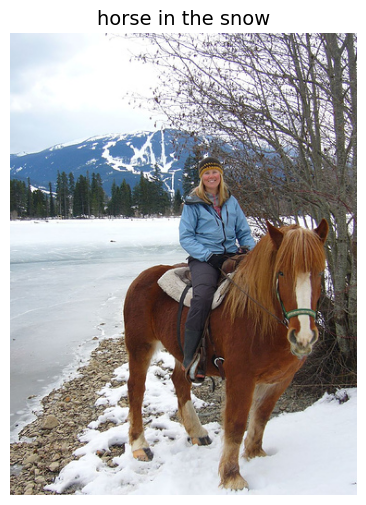

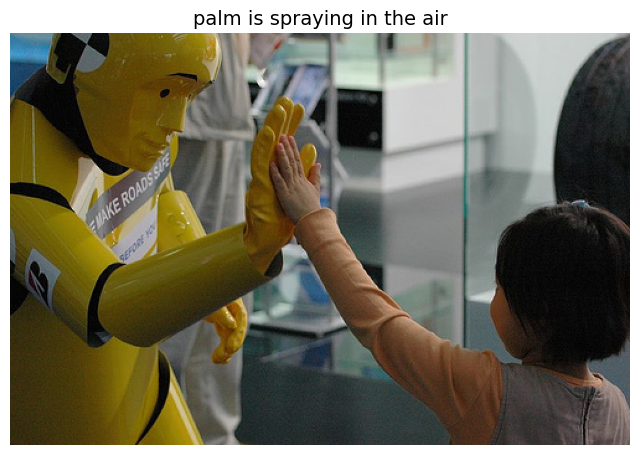

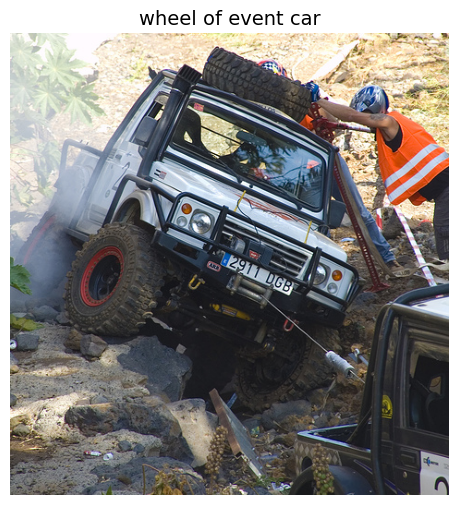

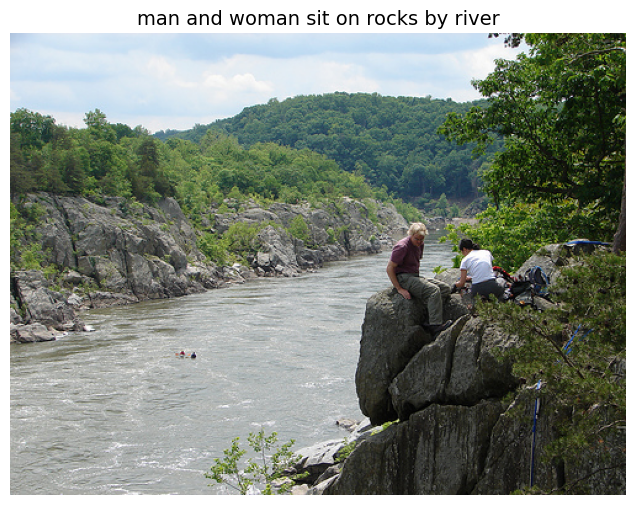

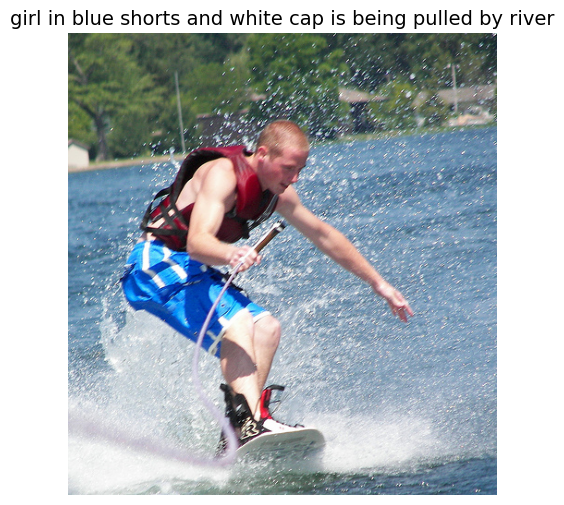

...

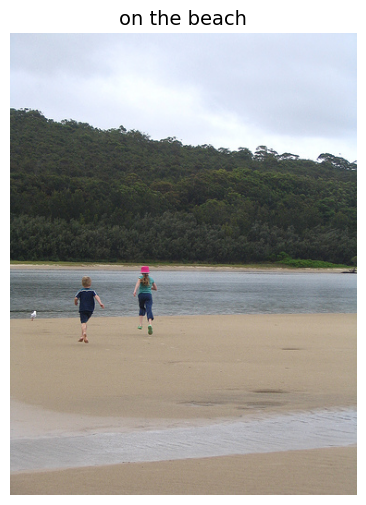

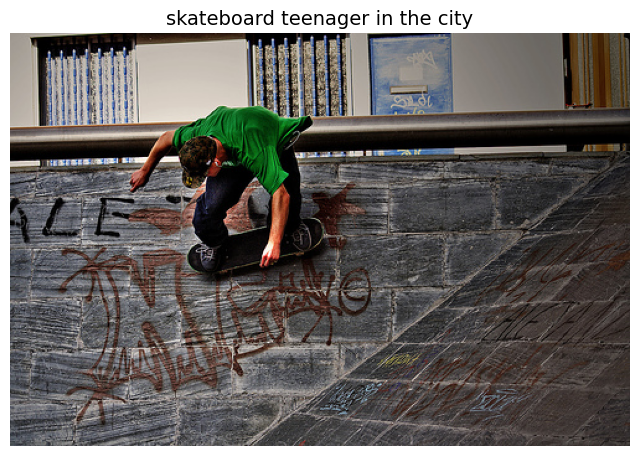

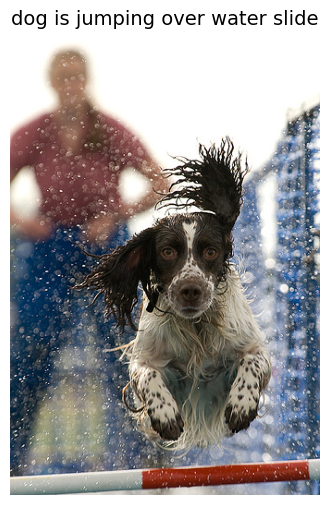

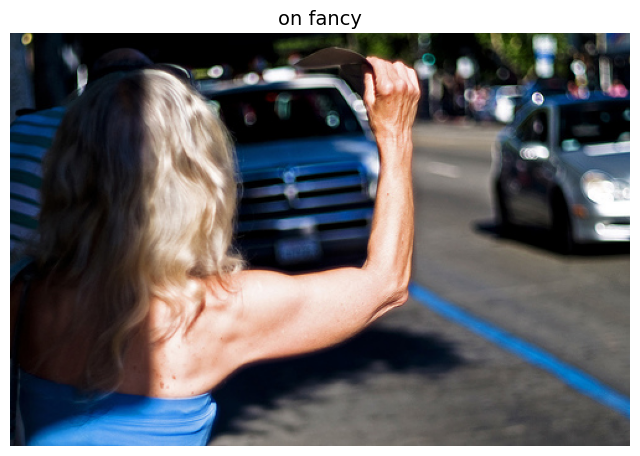

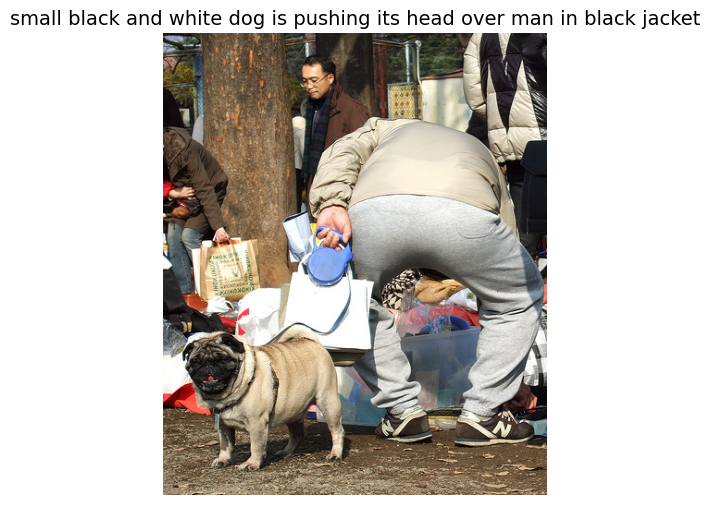

In [53]:
import io
import contextlib

# Redirect stdout to a dummy stream to suppress progress updates
dummy_stream = io.StringIO()
with contextlib.redirect_stdout(dummy_stream):
    for _ in range(15):
        idx = np.random.randint(0, 810)
        all_img_names = list(encodings.keys())
        img_name = all_img_names[idx]
        photo_2048 = encodings[img_name].reshape((1, 2048))

        img = plt.imread("/content/drive/MyDrive/Images/" + img_name)

        caption = predict_caption(photo_2048)

        plt.figure(figsize=(8, 6))
        plt.imshow(img)
        plt.title(caption, fontsize=14)
        plt.axis("off")
        plt.show()